In [28]:
import pandas as pd
import numpy as np
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.model_selection import StratifiedKFold, GridSearchCV
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score,log_loss
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt

In [16]:
bcancer=pd.read_csv('BreastCancer.csv',index_col=0)
lbl=LabelEncoder()
bcancer['Class']=lbl.fit_transform(bcancer['Class'])
X=bcancer.drop('Class',axis=1)
y=bcancer['Class'] 

In [17]:
#Using RandomForest
rf=RandomForestClassifier(random_state=23)
params={'max_features':[3,4,5,6,]}
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=23)
gcv_rf=GridSearchCV(rf,param_grid=params,cv=kfold,scoring='neg_log_loss')
gcv_rf.fit(X,y)
print(gcv_rf.best_params_)
print(gcv_rf.best_score_)

{'max_features': 3}
-0.1008663596688781


In [24]:
bm_rf=gcv_rf.best_estimator_
df_imp=pd.DataFrame({'variable':bm_rf.feature_names_in_,
                    'importance':bm_rf.feature_importances_})
df_imp=df_imp[df_imp['importance']>0.0001]
df_imp=df_imp.sort_values(by='importance',ascending=False)
df_imp

,variable,importance
1,UniCell_Size,0.243274
5,BareN,0.183388
2,Uni_CellShape,0.171651
4,SEpith,0.136749
6,BChromatin,0.090036
7,NoemN,0.077085
0,Clump,0.060711
3,MargAdh,0.029478
8,Mitoses,0.007629


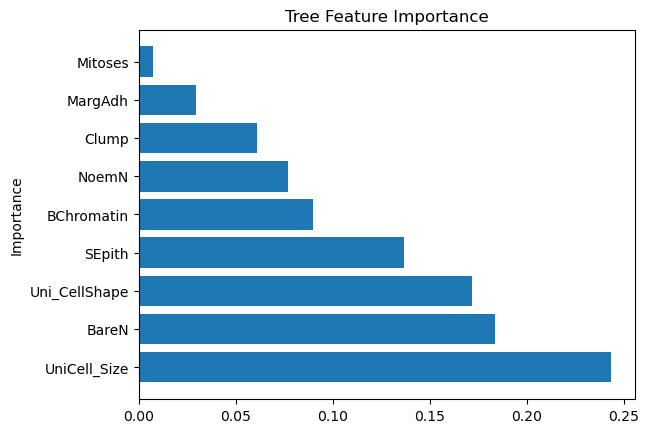

In [26]:
plt.barh(df_imp['variable'],df_imp['importance'])
plt.title("Tree Feature Importance")
plt.ylabel("Importance")
plt.show()

In [23]:
#Using DecisionTree
dtc=DecisionTreeClassifier(random_state=23)
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=23)
params={'max_depth':[2,3,4,5,6,None],'min_samples_split':[2,5,10],'min_samples_leaf':[1,3,5,7,10,15]}
gcv=GridSearchCV(dtc,param_grid=params,cv=kfold,scoring='neg_log_loss')
gcv.fit(X,y)
print(gcv.best_params_)
print(gcv.best_score_)

{'max_depth': 2, 'min_samples_leaf': 10, 'min_samples_split': 2}
-0.2456110095055712


In [44]:
################## Gradient Boosting ############
gbm=GradientBoostingClassifier(random_state=23)
params={'max_depth':[2,3,4,5,6,None],'learning_rate':np.linspace(0.0001,0.999,10) ,'n_estimators':[50,100,150]}

gcv_gbm= GridSearchCV(gbm,param_grid=params,verbose=3,cv=kfold,scoring='neg_log_loss')
gcv_gbm.fit(X,y)
print(gcv.best_params_)
print(gcv.best_score_)

Fitting 5 folds for each of 180 candidates, totalling 900 fits
[CV 1/5] END learning_rate=0.0001, max_depth=2, n_estimators=50;, score=-0.639 total time=   0.1s
[CV 2/5] END learning_rate=0.0001, max_depth=2, n_estimators=50;, score=-0.639 total time=   0.1s
[CV 3/5] END learning_rate=0.0001, max_depth=2, n_estimators=50;, score=-0.639 total time=   0.1s
[CV 4/5] END learning_rate=0.0001, max_depth=2, n_estimators=50;, score=-0.644 total time=   0.1s
[CV 5/5] END learning_rate=0.0001, max_depth=2, n_estimators=50;, score=-0.641 total time=   0.1s
[CV 1/5] END learning_rate=0.0001, max_depth=2, n_estimators=100;, score=-0.636 total time=   0.1s
[CV 2/5] END learning_rate=0.0001, max_depth=2, n_estimators=100;, score=-0.635 total time=   0.1s
[CV 3/5] END learning_rate=0.0001, max_depth=2, n_estimators=100;, score=-0.635 total time=   0.1s
[CV 4/5] END learning_rate=0.0001, max_depth=2, n_estimators=100;, score=-0.641 total time=   0.1s
[CV 5/5] END learning_rate=0.0001, max_depth=2, n_e

[CV 4/5] END learning_rate=0.0001, max_depth=None, n_estimators=100;, score=-0.639 total time=   0.3s
[CV 5/5] END learning_rate=0.0001, max_depth=None, n_estimators=100;, score=-0.636 total time=   0.3s
[CV 1/5] END learning_rate=0.0001, max_depth=None, n_estimators=150;, score=-0.631 total time=   0.4s
[CV 2/5] END learning_rate=0.0001, max_depth=None, n_estimators=150;, score=-0.630 total time=   0.4s
[CV 3/5] END learning_rate=0.0001, max_depth=None, n_estimators=150;, score=-0.630 total time=   0.4s
[CV 4/5] END learning_rate=0.0001, max_depth=None, n_estimators=150;, score=-0.635 total time=   0.4s
[CV 5/5] END learning_rate=0.0001, max_depth=None, n_estimators=150;, score=-0.632 total time=   0.4s
[CV 1/5] END learning_rate=0.11108888888888889, max_depth=2, n_estimators=50;, score=-0.138 total time=   0.1s
[CV 2/5] END learning_rate=0.11108888888888889, max_depth=2, n_estimators=50;, score=-0.113 total time=   0.1s
[CV 3/5] END learning_rate=0.11108888888888889, max_depth=2, n_e

[CV 3/5] END learning_rate=0.11108888888888889, max_depth=6, n_estimators=100;, score=-0.091 total time=   0.3s
[CV 4/5] END learning_rate=0.11108888888888889, max_depth=6, n_estimators=100;, score=-0.206 total time=   0.3s
[CV 5/5] END learning_rate=0.11108888888888889, max_depth=6, n_estimators=100;, score=-0.460 total time=   0.3s
[CV 1/5] END learning_rate=0.11108888888888889, max_depth=6, n_estimators=150;, score=-0.782 total time=   0.5s
[CV 2/5] END learning_rate=0.11108888888888889, max_depth=6, n_estimators=150;, score=-0.160 total time=   0.5s
[CV 3/5] END learning_rate=0.11108888888888889, max_depth=6, n_estimators=150;, score=-0.112 total time=   0.5s
[CV 4/5] END learning_rate=0.11108888888888889, max_depth=6, n_estimators=150;, score=-0.268 total time=   0.5s
[CV 5/5] END learning_rate=0.11108888888888889, max_depth=6, n_estimators=150;, score=-0.574 total time=   0.4s
[CV 1/5] END learning_rate=0.11108888888888889, max_depth=None, n_estimators=50;, score=-0.429 total tim

[CV 1/5] END learning_rate=0.22207777777777776, max_depth=5, n_estimators=100;, score=-0.401 total time=   0.3s
[CV 2/5] END learning_rate=0.22207777777777776, max_depth=5, n_estimators=100;, score=-0.187 total time=   0.3s
[CV 3/5] END learning_rate=0.22207777777777776, max_depth=5, n_estimators=100;, score=-0.116 total time=   0.3s
[CV 4/5] END learning_rate=0.22207777777777776, max_depth=5, n_estimators=100;, score=-0.270 total time=   0.3s
[CV 5/5] END learning_rate=0.22207777777777776, max_depth=5, n_estimators=100;, score=-0.483 total time=   0.3s
[CV 1/5] END learning_rate=0.22207777777777776, max_depth=5, n_estimators=150;, score=-0.506 total time=   0.4s
[CV 2/5] END learning_rate=0.22207777777777776, max_depth=5, n_estimators=150;, score=-0.256 total time=   0.4s
[CV 3/5] END learning_rate=0.22207777777777776, max_depth=5, n_estimators=150;, score=-0.156 total time=   0.4s
[CV 4/5] END learning_rate=0.22207777777777776, max_depth=5, n_estimators=150;, score=-0.360 total time=

[CV 5/5] END learning_rate=0.3330666666666666, max_depth=4, n_estimators=50;, score=-0.268 total time=   0.1s
[CV 1/5] END learning_rate=0.3330666666666666, max_depth=4, n_estimators=100;, score=-0.446 total time=   0.2s
[CV 2/5] END learning_rate=0.3330666666666666, max_depth=4, n_estimators=100;, score=-0.223 total time=   0.2s
[CV 3/5] END learning_rate=0.3330666666666666, max_depth=4, n_estimators=100;, score=-0.108 total time=   0.2s
[CV 4/5] END learning_rate=0.3330666666666666, max_depth=4, n_estimators=100;, score=-0.301 total time=   0.2s
[CV 5/5] END learning_rate=0.3330666666666666, max_depth=4, n_estimators=100;, score=-0.460 total time=   0.2s
[CV 1/5] END learning_rate=0.3330666666666666, max_depth=4, n_estimators=150;, score=-0.555 total time=   0.2s
[CV 2/5] END learning_rate=0.3330666666666666, max_depth=4, n_estimators=150;, score=-0.311 total time=   0.3s
[CV 3/5] END learning_rate=0.3330666666666666, max_depth=4, n_estimators=150;, score=-0.143 total time=   0.3s
[C

[CV 1/5] END learning_rate=0.44405555555555554, max_depth=3, n_estimators=100;, score=-0.369 total time=   0.2s
[CV 2/5] END learning_rate=0.44405555555555554, max_depth=3, n_estimators=100;, score=-0.162 total time=   0.1s
[CV 3/5] END learning_rate=0.44405555555555554, max_depth=3, n_estimators=100;, score=-0.074 total time=   0.2s
[CV 4/5] END learning_rate=0.44405555555555554, max_depth=3, n_estimators=100;, score=-0.209 total time=   0.1s
[CV 5/5] END learning_rate=0.44405555555555554, max_depth=3, n_estimators=100;, score=-0.494 total time=   0.2s
[CV 1/5] END learning_rate=0.44405555555555554, max_depth=3, n_estimators=150;, score=-0.498 total time=   0.2s
[CV 2/5] END learning_rate=0.44405555555555554, max_depth=3, n_estimators=150;, score=-0.222 total time=   0.2s
[CV 3/5] END learning_rate=0.44405555555555554, max_depth=3, n_estimators=150;, score=-0.092 total time=   0.2s
[CV 4/5] END learning_rate=0.44405555555555554, max_depth=3, n_estimators=150;, score=-0.280 total time=

[CV 5/5] END learning_rate=0.5550444444444445, max_depth=2, n_estimators=50;, score=-0.519 total time=   0.1s
[CV 1/5] END learning_rate=0.5550444444444445, max_depth=2, n_estimators=100;, score=-0.205 total time=   0.1s
[CV 2/5] END learning_rate=0.5550444444444445, max_depth=2, n_estimators=100;, score=-0.182 total time=   0.1s
[CV 3/5] END learning_rate=0.5550444444444445, max_depth=2, n_estimators=100;, score=-0.103 total time=   0.1s
[CV 4/5] END learning_rate=0.5550444444444445, max_depth=2, n_estimators=100;, score=-0.179 total time=   0.1s
[CV 5/5] END learning_rate=0.5550444444444445, max_depth=2, n_estimators=100;, score=-0.635 total time=   0.1s
[CV 1/5] END learning_rate=0.5550444444444445, max_depth=2, n_estimators=150;, score=-0.233 total time=   0.2s
[CV 2/5] END learning_rate=0.5550444444444445, max_depth=2, n_estimators=150;, score=-0.224 total time=   0.2s
[CV 3/5] END learning_rate=0.5550444444444445, max_depth=2, n_estimators=150;, score=-0.115 total time=   0.2s
[C

[CV 1/5] END learning_rate=0.5550444444444445, max_depth=None, n_estimators=100;, score=-1.209 total time=   0.1s
[CV 2/5] END learning_rate=0.5550444444444445, max_depth=None, n_estimators=100;, score=-0.627 total time=   0.1s
[CV 3/5] END learning_rate=0.5550444444444445, max_depth=None, n_estimators=100;, score=-0.532 total time=   0.2s
[CV 4/5] END learning_rate=0.5550444444444445, max_depth=None, n_estimators=100;, score=-0.861 total time=   0.1s
[CV 5/5] END learning_rate=0.5550444444444445, max_depth=None, n_estimators=100;, score=-1.166 total time=   0.1s
[CV 1/5] END learning_rate=0.5550444444444445, max_depth=None, n_estimators=150;, score=-1.209 total time=   0.2s
[CV 2/5] END learning_rate=0.5550444444444445, max_depth=None, n_estimators=150;, score=-0.627 total time=   0.2s
[CV 3/5] END learning_rate=0.5550444444444445, max_depth=None, n_estimators=150;, score=-0.532 total time=   0.2s
[CV 4/5] END learning_rate=0.5550444444444445, max_depth=None, n_estimators=150;, score=

[CV 1/5] END learning_rate=0.6660333333333333, max_depth=6, n_estimators=100;, score=-0.551 total time=   0.2s
[CV 2/5] END learning_rate=0.6660333333333333, max_depth=6, n_estimators=100;, score=-0.231 total time=   0.2s
[CV 3/5] END learning_rate=0.6660333333333333, max_depth=6, n_estimators=100;, score=-0.151 total time=   0.2s
[CV 4/5] END learning_rate=0.6660333333333333, max_depth=6, n_estimators=100;, score=-0.346 total time=   0.2s
[CV 5/5] END learning_rate=0.6660333333333333, max_depth=6, n_estimators=100;, score=-0.841 total time=   0.2s
[CV 1/5] END learning_rate=0.6660333333333333, max_depth=6, n_estimators=150;, score=-0.551 total time=   0.2s
[CV 2/5] END learning_rate=0.6660333333333333, max_depth=6, n_estimators=150;, score=-0.231 total time=   0.2s
[CV 3/5] END learning_rate=0.6660333333333333, max_depth=6, n_estimators=150;, score=-0.151 total time=   0.2s
[CV 4/5] END learning_rate=0.6660333333333333, max_depth=6, n_estimators=150;, score=-0.346 total time=   0.2s
[

[CV 5/5] END learning_rate=0.7770222222222222, max_depth=5, n_estimators=50;, score=-0.700 total time=   0.1s
[CV 1/5] END learning_rate=0.7770222222222222, max_depth=5, n_estimators=100;, score=-0.542 total time=   0.1s
[CV 2/5] END learning_rate=0.7770222222222222, max_depth=5, n_estimators=100;, score=-0.206 total time=   0.2s
[CV 3/5] END learning_rate=0.7770222222222222, max_depth=5, n_estimators=100;, score=-0.141 total time=   0.1s
[CV 4/5] END learning_rate=0.7770222222222222, max_depth=5, n_estimators=100;, score=-0.385 total time=   0.1s
[CV 5/5] END learning_rate=0.7770222222222222, max_depth=5, n_estimators=100;, score=-0.700 total time=   0.1s
[CV 1/5] END learning_rate=0.7770222222222222, max_depth=5, n_estimators=150;, score=-0.542 total time=   0.2s
[CV 2/5] END learning_rate=0.7770222222222222, max_depth=5, n_estimators=150;, score=-0.206 total time=   0.2s
[CV 3/5] END learning_rate=0.7770222222222222, max_depth=5, n_estimators=150;, score=-0.141 total time=   0.2s
[C

[CV 4/5] END learning_rate=0.8880111111111111, max_depth=4, n_estimators=50;, score=-0.406 total time=   0.1s
[CV 5/5] END learning_rate=0.8880111111111111, max_depth=4, n_estimators=50;, score=-0.646 total time=   0.1s
[CV 1/5] END learning_rate=0.8880111111111111, max_depth=4, n_estimators=100;, score=-0.478 total time=   0.2s
[CV 2/5] END learning_rate=0.8880111111111111, max_depth=4, n_estimators=100;, score=-0.270 total time=   0.2s
[CV 3/5] END learning_rate=0.8880111111111111, max_depth=4, n_estimators=100;, score=-0.163 total time=   0.2s
[CV 4/5] END learning_rate=0.8880111111111111, max_depth=4, n_estimators=100;, score=-0.390 total time=   0.1s
[CV 5/5] END learning_rate=0.8880111111111111, max_depth=4, n_estimators=100;, score=-0.684 total time=   0.1s
[CV 1/5] END learning_rate=0.8880111111111111, max_depth=4, n_estimators=150;, score=-0.478 total time=   0.2s
[CV 2/5] END learning_rate=0.8880111111111111, max_depth=4, n_estimators=150;, score=-0.270 total time=   0.2s
[CV

[CV 1/5] END learning_rate=0.999, max_depth=3, n_estimators=100;, score=-0.614 total time=   0.1s
[CV 2/5] END learning_rate=0.999, max_depth=3, n_estimators=100;, score=-0.276 total time=   0.1s
[CV 3/5] END learning_rate=0.999, max_depth=3, n_estimators=100;, score=-0.135 total time=   0.2s
[CV 4/5] END learning_rate=0.999, max_depth=3, n_estimators=100;, score=-0.255 total time=   0.2s
[CV 5/5] END learning_rate=0.999, max_depth=3, n_estimators=100;, score=-0.832 total time=   0.1s
[CV 1/5] END learning_rate=0.999, max_depth=3, n_estimators=150;, score=-0.614 total time=   0.2s
[CV 2/5] END learning_rate=0.999, max_depth=3, n_estimators=150;, score=-0.276 total time=   0.2s
[CV 3/5] END learning_rate=0.999, max_depth=3, n_estimators=150;, score=-0.135 total time=   0.2s
[CV 4/5] END learning_rate=0.999, max_depth=3, n_estimators=150;, score=-0.255 total time=   0.2s
[CV 5/5] END learning_rate=0.999, max_depth=3, n_estimators=150;, score=-0.832 total time=   0.2s
[CV 1/5] END learnin

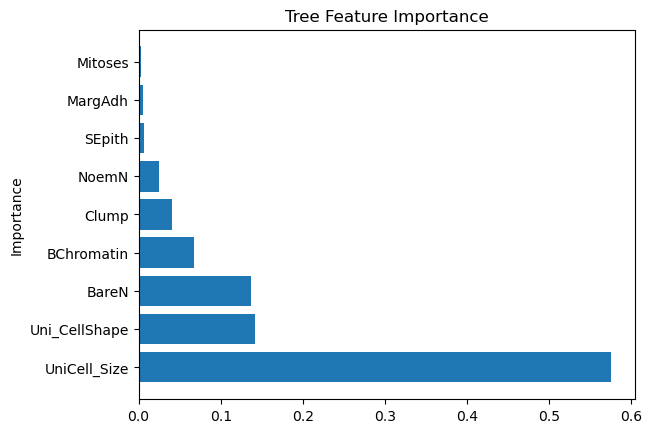

In [34]:
bm_gbm=gcv_gbm.best_estimator_
df_imp=pd.DataFrame({'variable':bm_gbm.feature_names_in_,
                    'importance':bm_gbm.feature_importances_})
df_imp=df_imp[df_imp['importance']>0.0001]
df_imp=df_imp.sort_values(by='importance',ascending=False)
df_imp
plt.barh(df_imp['variable'],df_imp['importance'])
plt.title("Tree Feature Importance")
plt.ylabel("Importance")
plt.show()

In [35]:
#Lightgbm
!pip install lightgbm

In [40]:
from lightgbm import LGBMClassifier
lgbm=LGBMClassifier(random_state=23)
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=23)
params={'max_depth':[2,3,4,5,6,None],'learning_rate':np.linspace(0.0001,0.999,10) ,'n_estimators':[50,100,150]}
gcv_lgbm=GridSearchCV(lgbm,param_grid=params,cv=kfold,scoring='neg_log_loss')
gcv_lgbm.fit(X,y)
print(gcv_lgbm.best_params_)
print(gcv_lgbm.best_score_)

[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000073 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000063 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 97
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromS

[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000050 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000037 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 367
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.343470 -> initscore=-0.647866
[LightGBM] [Info] Start train

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 192, number of negative: 367
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000112 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.343470 -> initscore=-0.647866
[LightGBM] [Info] Start training from score -0.647866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Info] Number of positive: 193, number of negative: 367
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.344643 -> initscore=-0.642672
[LightGBM] [Info] Start training from score -0.642672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 95
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 192, number of negative: 36

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 193, number of negative: 367
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000098 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.344643 -> initscore=-0.642672
[LightGBM] [Info] Start training from score -0.642672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Info] Number of positive: 193, number of negative: 367
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.344643 -> initscore=-0.642672
[LightGBM] [Info] Start training from score -0.642672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 95
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 193, number of negative: 367
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000035 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.344643 -> initscore=-0.642672
[LightGBM] [Info] Start training from score -0.642672
[LightGBM] [Warning] No further splits with positive gain, be

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 367
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[Light

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 193, number of negative: 367
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000036 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.344643 -> initscore=-0.642672
[LightGBM] [Info] Start training from score -0.642672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000042 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] St

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.344643 -> initscore=-0.642672
[LightGBM] [Info] Start training from score -0.642672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000032 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 97
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000030 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 97
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Info] Number of positive: 192, number of negative: 367
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.343470 -> initscore=-0.647866
[LightGBM] [Info] Start training from score -0.647866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Info] Number of positive: 192, number of negative: 367
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000128 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.343470 -> initscore=-0.647866
[LightGBM] [Info] Start training from score -0.647866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000096 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 95
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 193, number of negative: 367
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000033 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.344643 -> initscore=-0.642672
[LightGBM] [Info] Start training from score -0.642672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 95
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000046 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000096 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000090 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 193, number of negative: 367
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.344643 -> initscore=-0.642672
[LightGBM] [Info] Start training from score -0.642672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 193, number of negative: 367
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000030 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.344643 -> initscore=-0.642672
[LightGBM] [Info] Start training from score -0.642672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 193, number of negative: 367
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.344643 -> initscore=-0.642672
[LightGBM] [Info] Start training from score -0.642672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

[LightGBM] [Info] Number of positive: 192, number of negative: 367
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000098 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.343470 -> initscore=-0.647866
[LightGBM] [Info] Start training from score -0.647866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 193, number of negative: 367
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 9
[LightGBM] [In

[LightGBM] [Info] Number of positive: 192, number of negative: 367
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000032 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.343470 -> initscore=-0.647866
[LightGBM] [Info] Start training from score -0.647866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000030 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 95
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.343470 -> initscore=-0.647866
[LightGBM] [Info] Start training from score -0.647866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

[LightGBM] [Info] Number of positive: 192, number of negative: 367
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.343470 -> initscore=-0.647866
[LightGBM] [Info] Start training from score -0.647866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 193, number of negative: 367
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.344643 -> initscore=-0.642672
[LightGBM] [Info] Start training from score -0.642672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 367
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000101 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.343470 -> initscore=-0.647866
[LightGBM] [Info] Start training from score -0.647866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 193, number of negative: 367
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.344643 -> initscore=-0.642672
[LightGBM] [Info] Start training from score -0.642672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Tot

[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 95
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Info] Number of positive: 192, number of negative: 367
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000112 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.343470 -> initscore=-0.647866
[LightGBM] [Info] Start training from score -0.647866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000144 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 95
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 193, number of negative: 367
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.344643 -> initscore=-0.642672
[LightGBM] [Info] Start training from score -0.642672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 193, number of negative: 366
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000096 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 96
[LightGBM] [Info] Number of data points in the train set: 559, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.345259 -> initscore=-0.639943
[LightGBM] [Info] Start training from score -0.639943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

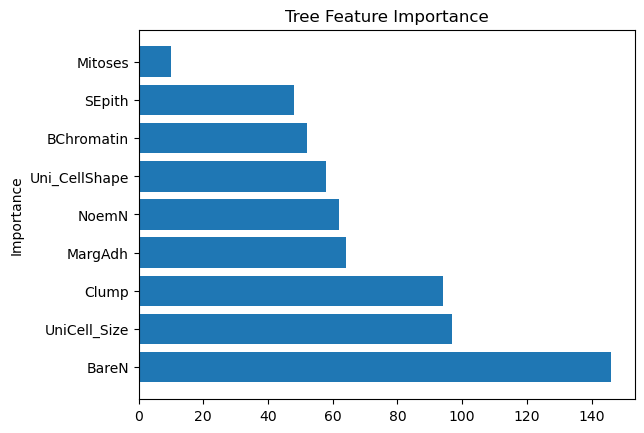

In [43]:
gbm=LGBMClassifier(random_state=23)
bm_lgbm=gcv_lgbm.best_estimator_
df_imp=pd.DataFrame({'variable':bm_lgbm.feature_name_,
                    'importance':bm_lgbm.feature_importances_})

df_imp=df_imp[df_imp['importance']>0.0001]
df_imp=df_imp.sort_values(by='importance',ascending=False)
df_imp
plt.barh(df_imp['variable'],df_imp['importance'])
plt.title("Tree Feature Importance")
plt.ylabel("Importance")
plt.show()

In [49]:
#################################  CAT BOOST  ########################
!pip install catboost
from catboost import CatBoostClassifier
cgbm=CatBoostClassifier(random_state=23)
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=23)
params={'max_depth':[2,3,4,5,6,None],'learning_rate':np.linspace(0.0001,0.999,10) ,'n_estimators':[50,100,150]}
gcv_lgbm=GridSearchCV(cgbm,param_grid=params,cv=kfold,scoring='neg_log_loss')
gcv_lgbm.fit(X,y)
print(gcv_lgbm.best_params_)
print(gcv_lgbm.best_score_)

0:	learn: 0.6930765	total: 47.4ms	remaining: 2.33s
1:	learn: 0.6929943	total: 48.3ms	remaining: 1.16s
2:	learn: 0.6929252	total: 48.9ms	remaining: 766ms
3:	learn: 0.6928529	total: 49.3ms	remaining: 567ms
4:	learn: 0.6927759	total: 49.7ms	remaining: 447ms
5:	learn: 0.6927041	total: 50.1ms	remaining: 368ms
6:	learn: 0.6926300	total: 50.6ms	remaining: 311ms
7:	learn: 0.6925562	total: 51ms	remaining: 268ms
8:	learn: 0.6924820	total: 51.4ms	remaining: 234ms
9:	learn: 0.6924099	total: 51.9ms	remaining: 208ms
10:	learn: 0.6923381	total: 52.3ms	remaining: 185ms
11:	learn: 0.6922666	total: 52.9ms	remaining: 168ms
12:	learn: 0.6921950	total: 53.3ms	remaining: 152ms
13:	learn: 0.6921169	total: 53.7ms	remaining: 138ms
14:	learn: 0.6920455	total: 54.1ms	remaining: 126ms
15:	learn: 0.6919675	total: 54.4ms	remaining: 116ms
16:	learn: 0.6918937	total: 54.8ms	remaining: 106ms
17:	learn: 0.6918204	total: 55.2ms	remaining: 98.1ms
18:	learn: 0.6917453	total: 55.6ms	remaining: 90.6ms
19:	learn: 0.6916777	t

0:	learn: 0.6930735	total: 631us	remaining: 31ms
1:	learn: 0.6929973	total: 1.46ms	remaining: 35.1ms
2:	learn: 0.6929270	total: 1.92ms	remaining: 30.1ms
3:	learn: 0.6928514	total: 2.33ms	remaining: 26.9ms
4:	learn: 0.6927780	total: 2.77ms	remaining: 24.9ms
5:	learn: 0.6927024	total: 3.19ms	remaining: 23.4ms
6:	learn: 0.6926255	total: 3.61ms	remaining: 22.2ms
7:	learn: 0.6925493	total: 4.04ms	remaining: 21.2ms
8:	learn: 0.6924772	total: 4.43ms	remaining: 20.2ms
9:	learn: 0.6924026	total: 4.84ms	remaining: 19.4ms
10:	learn: 0.6923268	total: 5.22ms	remaining: 18.5ms
11:	learn: 0.6922534	total: 5.61ms	remaining: 17.8ms
12:	learn: 0.6921802	total: 6ms	remaining: 17.1ms
13:	learn: 0.6921007	total: 6.36ms	remaining: 16.4ms
14:	learn: 0.6920301	total: 6.73ms	remaining: 15.7ms
15:	learn: 0.6919554	total: 7.1ms	remaining: 15.1ms
16:	learn: 0.6918792	total: 7.47ms	remaining: 14.5ms
17:	learn: 0.6918050	total: 7.83ms	remaining: 13.9ms
18:	learn: 0.6917309	total: 8.21ms	remaining: 13.4ms
19:	learn:

0:	learn: 0.6930758	total: 596us	remaining: 59.1ms
1:	learn: 0.6929992	total: 1.52ms	remaining: 74.5ms
2:	learn: 0.6929301	total: 1.96ms	remaining: 63.4ms
3:	learn: 0.6928589	total: 2.46ms	remaining: 58.9ms
4:	learn: 0.6927901	total: 3.06ms	remaining: 58.2ms
5:	learn: 0.6927162	total: 3.52ms	remaining: 55.1ms
6:	learn: 0.6926413	total: 4.04ms	remaining: 53.8ms
7:	learn: 0.6925666	total: 4.47ms	remaining: 51.4ms
8:	learn: 0.6924963	total: 4.89ms	remaining: 49.4ms
9:	learn: 0.6924170	total: 5.34ms	remaining: 48ms
10:	learn: 0.6923462	total: 5.73ms	remaining: 46.4ms
11:	learn: 0.6922713	total: 6.12ms	remaining: 44.9ms
12:	learn: 0.6921978	total: 6.59ms	remaining: 44.1ms
13:	learn: 0.6921234	total: 7.1ms	remaining: 43.6ms
14:	learn: 0.6920507	total: 7.55ms	remaining: 42.8ms
15:	learn: 0.6919739	total: 8.01ms	remaining: 42ms
16:	learn: 0.6919008	total: 8.48ms	remaining: 41.4ms
17:	learn: 0.6918274	total: 8.95ms	remaining: 40.8ms
18:	learn: 0.6917533	total: 9.57ms	remaining: 40.8ms
19:	learn

0:	learn: 0.6930735	total: 635us	remaining: 62.9ms
1:	learn: 0.6929973	total: 1.49ms	remaining: 73.2ms
2:	learn: 0.6929270	total: 1.92ms	remaining: 62ms
3:	learn: 0.6928514	total: 2.32ms	remaining: 55.7ms
4:	learn: 0.6927780	total: 2.71ms	remaining: 51.5ms
5:	learn: 0.6927024	total: 3.08ms	remaining: 48.3ms
6:	learn: 0.6926255	total: 3.47ms	remaining: 46.1ms
7:	learn: 0.6925493	total: 3.88ms	remaining: 44.7ms
8:	learn: 0.6924772	total: 4.28ms	remaining: 43.3ms
9:	learn: 0.6924026	total: 4.65ms	remaining: 41.9ms
10:	learn: 0.6923268	total: 5.01ms	remaining: 40.6ms
11:	learn: 0.6922534	total: 5.46ms	remaining: 40.1ms
12:	learn: 0.6921802	total: 5.84ms	remaining: 39.1ms
13:	learn: 0.6921007	total: 6.23ms	remaining: 38.3ms
14:	learn: 0.6920301	total: 6.6ms	remaining: 37.4ms
15:	learn: 0.6919554	total: 6.96ms	remaining: 36.5ms
16:	learn: 0.6918792	total: 7.35ms	remaining: 35.9ms
17:	learn: 0.6918050	total: 7.76ms	remaining: 35.4ms
18:	learn: 0.6917309	total: 8.19ms	remaining: 34.9ms
19:	lea

0:	learn: 0.6930765	total: 610us	remaining: 91ms
1:	learn: 0.6929943	total: 1.46ms	remaining: 108ms
2:	learn: 0.6929252	total: 1.89ms	remaining: 92.5ms
3:	learn: 0.6928529	total: 2.33ms	remaining: 84.9ms
4:	learn: 0.6927759	total: 2.73ms	remaining: 79.2ms
5:	learn: 0.6927041	total: 3.14ms	remaining: 75.3ms
6:	learn: 0.6926300	total: 3.54ms	remaining: 72.4ms
7:	learn: 0.6925562	total: 3.98ms	remaining: 70.7ms
8:	learn: 0.6924820	total: 4.39ms	remaining: 68.8ms
9:	learn: 0.6924099	total: 4.98ms	remaining: 69.7ms
10:	learn: 0.6923381	total: 5.41ms	remaining: 68.3ms
11:	learn: 0.6922666	total: 5.81ms	remaining: 66.9ms
12:	learn: 0.6921950	total: 6.19ms	remaining: 65.2ms
13:	learn: 0.6921169	total: 6.57ms	remaining: 63.8ms
14:	learn: 0.6920455	total: 6.94ms	remaining: 62.4ms
15:	learn: 0.6919675	total: 7.32ms	remaining: 61.3ms
16:	learn: 0.6918937	total: 7.7ms	remaining: 60.3ms
17:	learn: 0.6918204	total: 8.08ms	remaining: 59.3ms
18:	learn: 0.6917453	total: 8.44ms	remaining: 58.2ms
19:	lear

0:	learn: 0.6930735	total: 619us	remaining: 92.4ms
1:	learn: 0.6929998	total: 1.43ms	remaining: 106ms
2:	learn: 0.6929280	total: 1.84ms	remaining: 90.1ms
3:	learn: 0.6928620	total: 2.23ms	remaining: 81.2ms
4:	learn: 0.6927902	total: 2.61ms	remaining: 75.8ms
5:	learn: 0.6927181	total: 2.99ms	remaining: 71.8ms
6:	learn: 0.6926467	total: 3.38ms	remaining: 69.1ms
7:	learn: 0.6925711	total: 3.77ms	remaining: 66.9ms
8:	learn: 0.6925042	total: 4.15ms	remaining: 65ms
9:	learn: 0.6924284	total: 4.51ms	remaining: 63.1ms
10:	learn: 0.6923570	total: 4.88ms	remaining: 61.7ms
11:	learn: 0.6922812	total: 5.25ms	remaining: 60.4ms
12:	learn: 0.6922124	total: 5.62ms	remaining: 59.2ms
13:	learn: 0.6921395	total: 5.97ms	remaining: 58ms
14:	learn: 0.6920708	total: 6.33ms	remaining: 56.9ms
15:	learn: 0.6919972	total: 6.68ms	remaining: 55.9ms
16:	learn: 0.6919258	total: 7.05ms	remaining: 55.2ms
17:	learn: 0.6918504	total: 7.46ms	remaining: 54.7ms
18:	learn: 0.6917764	total: 7.84ms	remaining: 54.1ms
19:	learn

0:	learn: 0.6930672	total: 647us	remaining: 96.5ms
1:	learn: 0.6929923	total: 1.61ms	remaining: 119ms
2:	learn: 0.6929220	total: 2.03ms	remaining: 99.3ms
3:	learn: 0.6928449	total: 2.41ms	remaining: 88ms
4:	learn: 0.6927740	total: 2.81ms	remaining: 81.4ms
5:	learn: 0.6926992	total: 3.19ms	remaining: 76.7ms
6:	learn: 0.6926253	total: 3.58ms	remaining: 73.1ms
7:	learn: 0.6925550	total: 4ms	remaining: 71ms
8:	learn: 0.6924856	total: 4.45ms	remaining: 69.8ms
9:	learn: 0.6924049	total: 4.83ms	remaining: 67.7ms
10:	learn: 0.6923300	total: 5.22ms	remaining: 65.9ms
11:	learn: 0.6922528	total: 5.6ms	remaining: 64.4ms
12:	learn: 0.6921816	total: 5.98ms	remaining: 63ms
13:	learn: 0.6921046	total: 6.36ms	remaining: 61.8ms
14:	learn: 0.6920341	total: 6.72ms	remaining: 60.5ms
15:	learn: 0.6919567	total: 7.08ms	remaining: 59.3ms
16:	learn: 0.6918834	total: 7.48ms	remaining: 58.5ms
17:	learn: 0.6918084	total: 7.87ms	remaining: 57.7ms
18:	learn: 0.6917363	total: 8.24ms	remaining: 56.8ms
19:	learn: 0.69

0:	learn: 0.6930724	total: 745us	remaining: 36.5ms
1:	learn: 0.6929970	total: 1.71ms	remaining: 41ms
2:	learn: 0.6929196	total: 2.25ms	remaining: 35.2ms
3:	learn: 0.6928454	total: 2.85ms	remaining: 32.7ms
4:	learn: 0.6927797	total: 3.35ms	remaining: 30.1ms
5:	learn: 0.6927042	total: 3.84ms	remaining: 28.2ms
6:	learn: 0.6926285	total: 4.33ms	remaining: 26.6ms
7:	learn: 0.6925513	total: 4.81ms	remaining: 25.3ms
8:	learn: 0.6924766	total: 5.31ms	remaining: 24.2ms
9:	learn: 0.6924039	total: 5.88ms	remaining: 23.5ms
10:	learn: 0.6923279	total: 6.4ms	remaining: 22.7ms
11:	learn: 0.6922522	total: 6.9ms	remaining: 21.8ms
12:	learn: 0.6921792	total: 7.39ms	remaining: 21ms
13:	learn: 0.6921053	total: 7.88ms	remaining: 20.3ms
14:	learn: 0.6920278	total: 8.37ms	remaining: 19.5ms
15:	learn: 0.6919545	total: 8.84ms	remaining: 18.8ms
16:	learn: 0.6918814	total: 9.33ms	remaining: 18.1ms
17:	learn: 0.6918099	total: 9.83ms	remaining: 17.5ms
18:	learn: 0.6917336	total: 10.3ms	remaining: 16.8ms
19:	learn:

0:	learn: 0.6930735	total: 993us	remaining: 98.3ms
1:	learn: 0.6929943	total: 2.01ms	remaining: 98.6ms
2:	learn: 0.6929153	total: 2.63ms	remaining: 85.2ms
3:	learn: 0.6928389	total: 3.16ms	remaining: 75.8ms
4:	learn: 0.6927645	total: 3.66ms	remaining: 69.5ms
5:	learn: 0.6926866	total: 4.16ms	remaining: 65.1ms
6:	learn: 0.6926066	total: 4.65ms	remaining: 61.8ms
7:	learn: 0.6925350	total: 5.13ms	remaining: 58.9ms
8:	learn: 0.6924604	total: 5.6ms	remaining: 56.6ms
9:	learn: 0.6923867	total: 6.09ms	remaining: 54.9ms
10:	learn: 0.6923098	total: 6.61ms	remaining: 53.5ms
11:	learn: 0.6922348	total: 7.11ms	remaining: 52.2ms
12:	learn: 0.6921622	total: 7.61ms	remaining: 51ms
13:	learn: 0.6920854	total: 8.07ms	remaining: 49.6ms
14:	learn: 0.6920097	total: 8.56ms	remaining: 48.5ms
15:	learn: 0.6919342	total: 9.04ms	remaining: 47.4ms
16:	learn: 0.6918580	total: 9.52ms	remaining: 46.5ms
17:	learn: 0.6917836	total: 9.99ms	remaining: 45.5ms
18:	learn: 0.6917073	total: 10.5ms	remaining: 44.8ms
19:	lea

0:	learn: 0.6930731	total: 804us	remaining: 79.6ms
1:	learn: 0.6929992	total: 1.8ms	remaining: 88.4ms
2:	learn: 0.6929250	total: 2.34ms	remaining: 75.6ms
3:	learn: 0.6928526	total: 2.87ms	remaining: 68.9ms
4:	learn: 0.6927846	total: 3.37ms	remaining: 64.1ms
5:	learn: 0.6927063	total: 3.9ms	remaining: 61ms
6:	learn: 0.6926313	total: 4.4ms	remaining: 58.4ms
7:	learn: 0.6925586	total: 4.89ms	remaining: 56.2ms
8:	learn: 0.6924886	total: 5.37ms	remaining: 54.3ms
9:	learn: 0.6924174	total: 5.87ms	remaining: 52.8ms
10:	learn: 0.6923409	total: 6.34ms	remaining: 51.3ms
11:	learn: 0.6922679	total: 6.83ms	remaining: 50.1ms
12:	learn: 0.6921989	total: 7.3ms	remaining: 48.9ms
13:	learn: 0.6921215	total: 7.77ms	remaining: 47.7ms
14:	learn: 0.6920450	total: 8.28ms	remaining: 46.9ms
15:	learn: 0.6919705	total: 8.78ms	remaining: 46.1ms
16:	learn: 0.6918961	total: 9.26ms	remaining: 45.2ms
17:	learn: 0.6918377	total: 9.73ms	remaining: 44.3ms
18:	learn: 0.6917638	total: 10.3ms	remaining: 44ms
19:	learn: 0

0:	learn: 0.6930664	total: 941us	remaining: 93.2ms
1:	learn: 0.6929949	total: 1.88ms	remaining: 92.2ms
2:	learn: 0.6929141	total: 2.43ms	remaining: 78.7ms
3:	learn: 0.6928384	total: 2.93ms	remaining: 70.2ms
4:	learn: 0.6927693	total: 3.49ms	remaining: 66.2ms
5:	learn: 0.6926919	total: 4.05ms	remaining: 63.4ms
6:	learn: 0.6926125	total: 4.63ms	remaining: 61.5ms
7:	learn: 0.6925364	total: 5.17ms	remaining: 59.5ms
8:	learn: 0.6924611	total: 5.71ms	remaining: 57.7ms
9:	learn: 0.6923853	total: 6.19ms	remaining: 55.7ms
10:	learn: 0.6923076	total: 6.73ms	remaining: 54.5ms
11:	learn: 0.6922297	total: 7.26ms	remaining: 53.2ms
12:	learn: 0.6921564	total: 7.85ms	remaining: 52.5ms
13:	learn: 0.6920781	total: 8.39ms	remaining: 51.6ms
14:	learn: 0.6920005	total: 8.89ms	remaining: 50.4ms
15:	learn: 0.6919237	total: 9.4ms	remaining: 49.3ms
16:	learn: 0.6918518	total: 9.89ms	remaining: 48.3ms
17:	learn: 0.6917796	total: 10.4ms	remaining: 47.2ms
18:	learn: 0.6917013	total: 10.9ms	remaining: 46.5ms
19:	l

0:	learn: 0.6930724	total: 756us	remaining: 113ms
1:	learn: 0.6929970	total: 1.71ms	remaining: 127ms
2:	learn: 0.6929196	total: 2.22ms	remaining: 109ms
3:	learn: 0.6928454	total: 2.72ms	remaining: 99.3ms
4:	learn: 0.6927797	total: 3.22ms	remaining: 93.5ms
5:	learn: 0.6927042	total: 3.75ms	remaining: 90.1ms
6:	learn: 0.6926285	total: 4.23ms	remaining: 86.4ms
7:	learn: 0.6925513	total: 4.75ms	remaining: 84.3ms
8:	learn: 0.6924766	total: 5.25ms	remaining: 82.3ms
9:	learn: 0.6924039	total: 5.77ms	remaining: 80.8ms
10:	learn: 0.6923279	total: 6.3ms	remaining: 79.6ms
11:	learn: 0.6922522	total: 6.78ms	remaining: 77.9ms
12:	learn: 0.6921792	total: 7.29ms	remaining: 76.8ms
13:	learn: 0.6921053	total: 7.79ms	remaining: 75.7ms
14:	learn: 0.6920278	total: 8.31ms	remaining: 74.8ms
15:	learn: 0.6919545	total: 8.83ms	remaining: 74ms
16:	learn: 0.6918814	total: 9.32ms	remaining: 73ms
17:	learn: 0.6918099	total: 9.81ms	remaining: 71.9ms
18:	learn: 0.6917336	total: 10.3ms	remaining: 70.9ms
19:	learn: 0

0:	learn: 0.6930725	total: 747us	remaining: 111ms
1:	learn: 0.6929942	total: 1.7ms	remaining: 126ms
2:	learn: 0.6929170	total: 2.23ms	remaining: 110ms
3:	learn: 0.6928427	total: 2.74ms	remaining: 99.9ms
4:	learn: 0.6927699	total: 3.24ms	remaining: 94ms
5:	learn: 0.6926919	total: 3.72ms	remaining: 89.4ms
6:	learn: 0.6926135	total: 4.24ms	remaining: 86.6ms
7:	learn: 0.6925346	total: 4.74ms	remaining: 84.1ms
8:	learn: 0.6924588	total: 5.23ms	remaining: 81.9ms
9:	learn: 0.6923873	total: 5.71ms	remaining: 80ms
10:	learn: 0.6923097	total: 6.23ms	remaining: 78.8ms
11:	learn: 0.6922354	total: 6.7ms	remaining: 77.1ms
12:	learn: 0.6921598	total: 7.23ms	remaining: 76.2ms
13:	learn: 0.6920831	total: 7.72ms	remaining: 75ms
14:	learn: 0.6920099	total: 8.2ms	remaining: 73.8ms
15:	learn: 0.6919352	total: 8.7ms	remaining: 72.9ms
16:	learn: 0.6918599	total: 9.24ms	remaining: 72.3ms
17:	learn: 0.6917928	total: 9.7ms	remaining: 71.2ms
18:	learn: 0.6917165	total: 10.2ms	remaining: 70.2ms
19:	learn: 0.69164

0:	learn: 0.6930751	total: 953us	remaining: 46.7ms
1:	learn: 0.6929995	total: 2.03ms	remaining: 48.8ms
2:	learn: 0.6929265	total: 2.67ms	remaining: 41.8ms
3:	learn: 0.6928488	total: 3.27ms	remaining: 37.6ms
4:	learn: 0.6927720	total: 3.85ms	remaining: 34.6ms
5:	learn: 0.6926990	total: 4.49ms	remaining: 32.9ms
6:	learn: 0.6926229	total: 5.32ms	remaining: 32.7ms
7:	learn: 0.6925541	total: 5.92ms	remaining: 31.1ms
8:	learn: 0.6924746	total: 6.54ms	remaining: 29.8ms
9:	learn: 0.6923992	total: 7.22ms	remaining: 28.9ms
10:	learn: 0.6923271	total: 7.92ms	remaining: 28.1ms
11:	learn: 0.6922532	total: 8.64ms	remaining: 27.4ms
12:	learn: 0.6921775	total: 9.48ms	remaining: 27ms
13:	learn: 0.6921040	total: 10.2ms	remaining: 26.2ms
14:	learn: 0.6920286	total: 10.8ms	remaining: 25.2ms
15:	learn: 0.6919512	total: 11.5ms	remaining: 24.4ms
16:	learn: 0.6918750	total: 12.1ms	remaining: 23.5ms
17:	learn: 0.6918000	total: 12.7ms	remaining: 22.6ms
18:	learn: 0.6917272	total: 13.3ms	remaining: 21.7ms
19:	le

0:	learn: 0.6930683	total: 818us	remaining: 40.1ms
1:	learn: 0.6929913	total: 1.81ms	remaining: 43.4ms
2:	learn: 0.6929252	total: 2.42ms	remaining: 38ms
3:	learn: 0.6928494	total: 3.02ms	remaining: 34.7ms
4:	learn: 0.6927739	total: 3.6ms	remaining: 32.4ms
5:	learn: 0.6927029	total: 4.21ms	remaining: 30.9ms
6:	learn: 0.6926262	total: 4.78ms	remaining: 29.4ms
7:	learn: 0.6925547	total: 5.38ms	remaining: 28.3ms
8:	learn: 0.6924756	total: 5.97ms	remaining: 27.2ms
9:	learn: 0.6923993	total: 6.53ms	remaining: 26.1ms
10:	learn: 0.6923268	total: 7.16ms	remaining: 25.4ms
11:	learn: 0.6922539	total: 7.73ms	remaining: 24.5ms
12:	learn: 0.6921794	total: 8.32ms	remaining: 23.7ms
13:	learn: 0.6921112	total: 8.89ms	remaining: 22.9ms
14:	learn: 0.6920356	total: 9.43ms	remaining: 22ms
15:	learn: 0.6919577	total: 10ms	remaining: 21.3ms
16:	learn: 0.6918789	total: 10.6ms	remaining: 20.6ms
17:	learn: 0.6918062	total: 11.2ms	remaining: 19.8ms
18:	learn: 0.6917320	total: 11.7ms	remaining: 19.1ms
19:	learn: 

0:	learn: 0.6930756	total: 994us	remaining: 98.5ms
1:	learn: 0.6929998	total: 1.99ms	remaining: 97.7ms
2:	learn: 0.6929287	total: 2.61ms	remaining: 84.5ms
3:	learn: 0.6928550	total: 3.19ms	remaining: 76.5ms
4:	learn: 0.6927824	total: 3.79ms	remaining: 71.9ms
5:	learn: 0.6927098	total: 4.35ms	remaining: 68.1ms
6:	learn: 0.6926383	total: 4.89ms	remaining: 64.9ms
7:	learn: 0.6925707	total: 5.42ms	remaining: 62.3ms
8:	learn: 0.6924945	total: 5.95ms	remaining: 60.2ms
9:	learn: 0.6924192	total: 6.48ms	remaining: 58.3ms
10:	learn: 0.6923466	total: 7.07ms	remaining: 57.2ms
11:	learn: 0.6922744	total: 7.61ms	remaining: 55.8ms
12:	learn: 0.6922025	total: 8.15ms	remaining: 54.6ms
13:	learn: 0.6921371	total: 8.67ms	remaining: 53.3ms
14:	learn: 0.6920603	total: 9.21ms	remaining: 52.2ms
15:	learn: 0.6919863	total: 9.75ms	remaining: 51.2ms
16:	learn: 0.6919143	total: 10.3ms	remaining: 50.3ms
17:	learn: 0.6918440	total: 10.8ms	remaining: 49.4ms
18:	learn: 0.6917727	total: 11.4ms	remaining: 48.4ms
19:	

0:	learn: 0.6930683	total: 903us	remaining: 89.5ms
1:	learn: 0.6929913	total: 1.92ms	remaining: 93.8ms
2:	learn: 0.6929252	total: 2.52ms	remaining: 81.4ms
3:	learn: 0.6928494	total: 3.11ms	remaining: 74.6ms
4:	learn: 0.6927739	total: 3.74ms	remaining: 71.1ms
5:	learn: 0.6927029	total: 4.33ms	remaining: 67.9ms
6:	learn: 0.6926262	total: 4.95ms	remaining: 65.7ms
7:	learn: 0.6925547	total: 5.54ms	remaining: 63.7ms
8:	learn: 0.6924756	total: 6.12ms	remaining: 61.9ms
9:	learn: 0.6923993	total: 6.71ms	remaining: 60.4ms
10:	learn: 0.6923268	total: 7.29ms	remaining: 59ms
11:	learn: 0.6922539	total: 7.87ms	remaining: 57.7ms
12:	learn: 0.6921794	total: 8.45ms	remaining: 56.5ms
13:	learn: 0.6921112	total: 9.08ms	remaining: 55.8ms
14:	learn: 0.6920356	total: 9.65ms	remaining: 54.7ms
15:	learn: 0.6919577	total: 10.2ms	remaining: 53.6ms
16:	learn: 0.6918789	total: 10.8ms	remaining: 52.5ms
17:	learn: 0.6918062	total: 11.3ms	remaining: 51.7ms
18:	learn: 0.6917320	total: 11.9ms	remaining: 50.7ms
19:	le

0:	learn: 0.6930717	total: 1.08ms	remaining: 160ms
1:	learn: 0.6929953	total: 2.19ms	remaining: 162ms
2:	learn: 0.6929289	total: 2.99ms	remaining: 147ms
3:	learn: 0.6928536	total: 3.61ms	remaining: 132ms
4:	learn: 0.6927809	total: 4.2ms	remaining: 122ms
5:	learn: 0.6927077	total: 4.84ms	remaining: 116ms
6:	learn: 0.6926348	total: 5.45ms	remaining: 111ms
7:	learn: 0.6925672	total: 6.03ms	remaining: 107ms
8:	learn: 0.6924904	total: 6.63ms	remaining: 104ms
9:	learn: 0.6924152	total: 7.21ms	remaining: 101ms
10:	learn: 0.6923426	total: 7.82ms	remaining: 98.8ms
11:	learn: 0.6922672	total: 8.41ms	remaining: 96.8ms
12:	learn: 0.6921925	total: 8.98ms	remaining: 94.7ms
13:	learn: 0.6921220	total: 9.57ms	remaining: 92.9ms
14:	learn: 0.6920453	total: 10.1ms	remaining: 91.3ms
15:	learn: 0.6919672	total: 10.7ms	remaining: 89.7ms
16:	learn: 0.6918935	total: 11.3ms	remaining: 88.4ms
17:	learn: 0.6918202	total: 11.9ms	remaining: 87.1ms
18:	learn: 0.6917483	total: 12.5ms	remaining: 86ms
19:	learn: 0.691

0:	learn: 0.6930723	total: 884us	remaining: 132ms
1:	learn: 0.6929950	total: 1.99ms	remaining: 147ms
2:	learn: 0.6929242	total: 2.65ms	remaining: 130ms
3:	learn: 0.6928499	total: 3.35ms	remaining: 122ms
4:	learn: 0.6927747	total: 3.97ms	remaining: 115ms
5:	learn: 0.6927035	total: 4.62ms	remaining: 111ms
6:	learn: 0.6926271	total: 5.25ms	remaining: 107ms
7:	learn: 0.6925578	total: 5.84ms	remaining: 104ms
8:	learn: 0.6924803	total: 6.45ms	remaining: 101ms
9:	learn: 0.6924051	total: 7.03ms	remaining: 98.4ms
10:	learn: 0.6923321	total: 7.63ms	remaining: 96.5ms
11:	learn: 0.6922578	total: 8.22ms	remaining: 94.5ms
12:	learn: 0.6921850	total: 8.79ms	remaining: 92.6ms
13:	learn: 0.6921160	total: 9.35ms	remaining: 90.8ms
14:	learn: 0.6920383	total: 10ms	remaining: 90ms
15:	learn: 0.6919605	total: 10.6ms	remaining: 88.8ms
16:	learn: 0.6918855	total: 11.2ms	remaining: 87.6ms
17:	learn: 0.6918099	total: 11.8ms	remaining: 86.5ms
18:	learn: 0.6917354	total: 12.4ms	remaining: 85.6ms
19:	learn: 0.6916

0:	learn: 0.6930698	total: 1.12ms	remaining: 55ms
1:	learn: 0.6929953	total: 2.35ms	remaining: 56.4ms
2:	learn: 0.6929252	total: 3.16ms	remaining: 49.5ms
3:	learn: 0.6928489	total: 3.89ms	remaining: 44.7ms
4:	learn: 0.6927756	total: 4.61ms	remaining: 41.5ms
5:	learn: 0.6927017	total: 5.31ms	remaining: 38.9ms
6:	learn: 0.6926270	total: 6.04ms	remaining: 37.1ms
7:	learn: 0.6925533	total: 6.76ms	remaining: 35.5ms
8:	learn: 0.6924811	total: 7.51ms	remaining: 34.2ms
9:	learn: 0.6924120	total: 8.21ms	remaining: 32.8ms
10:	learn: 0.6923384	total: 8.85ms	remaining: 31.4ms
11:	learn: 0.6922640	total: 9.53ms	remaining: 30.2ms
12:	learn: 0.6921937	total: 10.2ms	remaining: 29ms
13:	learn: 0.6921201	total: 10.9ms	remaining: 27.9ms
14:	learn: 0.6920438	total: 11.5ms	remaining: 26.9ms
15:	learn: 0.6919695	total: 12.2ms	remaining: 25.8ms
16:	learn: 0.6918960	total: 12.8ms	remaining: 24.8ms
17:	learn: 0.6918207	total: 13.7ms	remaining: 24.3ms
18:	learn: 0.6917458	total: 14.4ms	remaining: 23.5ms
19:	lea

0:	learn: 0.6930698	total: 1.04ms	remaining: 50.9ms
1:	learn: 0.6929950	total: 2.55ms	remaining: 61.2ms
2:	learn: 0.6929234	total: 3.28ms	remaining: 51.4ms
3:	learn: 0.6928474	total: 3.98ms	remaining: 45.7ms
4:	learn: 0.6927747	total: 4.64ms	remaining: 41.8ms
5:	learn: 0.6927011	total: 5.31ms	remaining: 38.9ms
6:	learn: 0.6926258	total: 6.04ms	remaining: 37.1ms
7:	learn: 0.6925509	total: 6.72ms	remaining: 35.3ms
8:	learn: 0.6924767	total: 7.64ms	remaining: 34.8ms
9:	learn: 0.6924111	total: 8.3ms	remaining: 33.2ms
10:	learn: 0.6923363	total: 9.06ms	remaining: 32.1ms
11:	learn: 0.6922575	total: 9.73ms	remaining: 30.8ms
12:	learn: 0.6921872	total: 10.4ms	remaining: 29.7ms
13:	learn: 0.6921109	total: 11.2ms	remaining: 28.7ms
14:	learn: 0.6920362	total: 11.8ms	remaining: 27.6ms
15:	learn: 0.6919611	total: 12.5ms	remaining: 26.7ms
16:	learn: 0.6918912	total: 13.2ms	remaining: 25.6ms
17:	learn: 0.6918149	total: 13.8ms	remaining: 24.5ms
18:	learn: 0.6917412	total: 14.4ms	remaining: 23.5ms
19:	

0:	learn: 0.6930724	total: 1.1ms	remaining: 109ms
1:	learn: 0.6930003	total: 2.38ms	remaining: 117ms
2:	learn: 0.6929321	total: 3.23ms	remaining: 105ms
3:	learn: 0.6928573	total: 4ms	remaining: 96.1ms
4:	learn: 0.6927867	total: 5.14ms	remaining: 97.7ms
5:	learn: 0.6927137	total: 5.84ms	remaining: 91.5ms
6:	learn: 0.6926441	total: 6.49ms	remaining: 86.2ms
7:	learn: 0.6925718	total: 7.19ms	remaining: 82.6ms
8:	learn: 0.6924976	total: 9.52ms	remaining: 96.3ms
9:	learn: 0.6924287	total: 10.3ms	remaining: 93.1ms
10:	learn: 0.6923555	total: 11.1ms	remaining: 89.9ms
11:	learn: 0.6922853	total: 11.8ms	remaining: 86.7ms
12:	learn: 0.6922182	total: 12.5ms	remaining: 83.9ms
13:	learn: 0.6921461	total: 13.3ms	remaining: 81.5ms
14:	learn: 0.6920741	total: 14ms	remaining: 79.1ms
15:	learn: 0.6920032	total: 14.8ms	remaining: 77.6ms
16:	learn: 0.6919349	total: 15.5ms	remaining: 75.8ms
17:	learn: 0.6918605	total: 16.3ms	remaining: 74.4ms
18:	learn: 0.6917878	total: 17.1ms	remaining: 73ms
19:	learn: 0.6

0:	learn: 0.6930698	total: 1.01ms	remaining: 100ms
1:	learn: 0.6929950	total: 2.18ms	remaining: 107ms
2:	learn: 0.6929234	total: 2.92ms	remaining: 94.5ms
3:	learn: 0.6928474	total: 3.67ms	remaining: 88ms
4:	learn: 0.6927747	total: 4.42ms	remaining: 84ms
5:	learn: 0.6927011	total: 5.11ms	remaining: 80.1ms
6:	learn: 0.6926258	total: 5.86ms	remaining: 77.9ms
7:	learn: 0.6925509	total: 6.61ms	remaining: 76ms
8:	learn: 0.6924767	total: 7.34ms	remaining: 74.2ms
9:	learn: 0.6924111	total: 8.04ms	remaining: 72.3ms
10:	learn: 0.6923363	total: 8.74ms	remaining: 70.7ms
11:	learn: 0.6922575	total: 9.43ms	remaining: 69.2ms
12:	learn: 0.6921872	total: 10.1ms	remaining: 67.8ms
13:	learn: 0.6921109	total: 10.9ms	remaining: 66.7ms
14:	learn: 0.6920362	total: 11.6ms	remaining: 65.6ms
15:	learn: 0.6919611	total: 12.3ms	remaining: 64.4ms
16:	learn: 0.6918912	total: 13ms	remaining: 63.4ms
17:	learn: 0.6918149	total: 13.7ms	remaining: 62.2ms
18:	learn: 0.6917412	total: 14.4ms	remaining: 61.2ms
19:	learn: 0.

0:	learn: 0.6930705	total: 1.04ms	remaining: 154ms
1:	learn: 0.6929978	total: 2.24ms	remaining: 166ms
2:	learn: 0.6929270	total: 3ms	remaining: 147ms
3:	learn: 0.6928516	total: 3.74ms	remaining: 137ms
4:	learn: 0.6927799	total: 4.48ms	remaining: 130ms
5:	learn: 0.6927042	total: 5.27ms	remaining: 127ms
6:	learn: 0.6926312	total: 5.98ms	remaining: 122ms
7:	learn: 0.6925583	total: 6.66ms	remaining: 118ms
8:	learn: 0.6924853	total: 7.7ms	remaining: 121ms
9:	learn: 0.6924164	total: 8.43ms	remaining: 118ms
10:	learn: 0.6923428	total: 9.14ms	remaining: 116ms
11:	learn: 0.6922684	total: 9.86ms	remaining: 113ms
12:	learn: 0.6921996	total: 10.6ms	remaining: 111ms
13:	learn: 0.6921249	total: 11.3ms	remaining: 110ms
14:	learn: 0.6920519	total: 12ms	remaining: 108ms
15:	learn: 0.6919780	total: 12.7ms	remaining: 107ms
16:	learn: 0.6919089	total: 13.4ms	remaining: 105ms
17:	learn: 0.6918348	total: 14.1ms	remaining: 103ms
18:	learn: 0.6917614	total: 14.7ms	remaining: 102ms
19:	learn: 0.6916886	total: 

0:	learn: 0.6930724	total: 1.02ms	remaining: 153ms
1:	learn: 0.6929980	total: 2.17ms	remaining: 160ms
2:	learn: 0.6929256	total: 2.91ms	remaining: 143ms
3:	learn: 0.6928503	total: 3.63ms	remaining: 132ms
4:	learn: 0.6927754	total: 4.33ms	remaining: 126ms
5:	learn: 0.6927011	total: 5.04ms	remaining: 121ms
6:	learn: 0.6926260	total: 5.74ms	remaining: 117ms
7:	learn: 0.6925533	total: 6.5ms	remaining: 115ms
8:	learn: 0.6924793	total: 7.17ms	remaining: 112ms
9:	learn: 0.6924075	total: 7.86ms	remaining: 110ms
10:	learn: 0.6923339	total: 8.56ms	remaining: 108ms
11:	learn: 0.6922583	total: 9.26ms	remaining: 106ms
12:	learn: 0.6921876	total: 10.1ms	remaining: 106ms
13:	learn: 0.6921121	total: 10.7ms	remaining: 104ms
14:	learn: 0.6920345	total: 11.6ms	remaining: 104ms
15:	learn: 0.6919592	total: 12.2ms	remaining: 102ms
16:	learn: 0.6918897	total: 12.9ms	remaining: 101ms
17:	learn: 0.6918144	total: 13.5ms	remaining: 99.1ms
18:	learn: 0.6917401	total: 14.2ms	remaining: 97.8ms
19:	learn: 0.6916653	

0:	learn: 0.6930723	total: 1.54ms	remaining: 75.4ms
1:	learn: 0.6930016	total: 2.75ms	remaining: 66ms
2:	learn: 0.6929330	total: 3.63ms	remaining: 56.8ms
3:	learn: 0.6928636	total: 4.42ms	remaining: 50.8ms
4:	learn: 0.6927938	total: 5.24ms	remaining: 47.2ms
5:	learn: 0.6927249	total: 6.04ms	remaining: 44.3ms
6:	learn: 0.6926573	total: 6.88ms	remaining: 42.3ms
7:	learn: 0.6925853	total: 7.8ms	remaining: 41ms
8:	learn: 0.6925131	total: 8.59ms	remaining: 39.1ms
9:	learn: 0.6924417	total: 9.34ms	remaining: 37.4ms
10:	learn: 0.6923666	total: 9.91ms	remaining: 35.1ms
11:	learn: 0.6922918	total: 10.6ms	remaining: 33.4ms
12:	learn: 0.6922205	total: 11.3ms	remaining: 32.2ms
13:	learn: 0.6921469	total: 12ms	remaining: 31ms
14:	learn: 0.6920774	total: 12.8ms	remaining: 29.9ms
15:	learn: 0.6920023	total: 13.5ms	remaining: 28.8ms
16:	learn: 0.6919325	total: 14.4ms	remaining: 28ms
17:	learn: 0.6918609	total: 15.2ms	remaining: 27.1ms
18:	learn: 0.6917902	total: 16ms	remaining: 26.1ms
19:	learn: 0.691

0:	learn: 0.6930709	total: 1.16ms	remaining: 56.8ms
1:	learn: 0.6929988	total: 2.32ms	remaining: 55.8ms
2:	learn: 0.6929288	total: 3.15ms	remaining: 49.3ms
3:	learn: 0.6928577	total: 4ms	remaining: 46ms
4:	learn: 0.6927855	total: 4.85ms	remaining: 43.7ms
5:	learn: 0.6927149	total: 5.64ms	remaining: 41.4ms
6:	learn: 0.6926468	total: 6.47ms	remaining: 39.8ms
7:	learn: 0.6925745	total: 7.32ms	remaining: 38.4ms
8:	learn: 0.6925058	total: 8.21ms	remaining: 37.4ms
9:	learn: 0.6924308	total: 9.24ms	remaining: 37ms
10:	learn: 0.6923549	total: 9.85ms	remaining: 34.9ms
11:	learn: 0.6922834	total: 10.7ms	remaining: 33.9ms
12:	learn: 0.6922122	total: 11.5ms	remaining: 32.7ms
13:	learn: 0.6921406	total: 12.3ms	remaining: 31.6ms
14:	learn: 0.6920694	total: 13.1ms	remaining: 30.6ms
15:	learn: 0.6919958	total: 13.9ms	remaining: 29.5ms
16:	learn: 0.6919211	total: 14.9ms	remaining: 29ms
17:	learn: 0.6918502	total: 15.7ms	remaining: 27.9ms
18:	learn: 0.6917786	total: 16.5ms	remaining: 26.9ms
19:	learn: 0

0:	learn: 0.6930737	total: 1.21ms	remaining: 120ms
1:	learn: 0.6930052	total: 2.48ms	remaining: 121ms
2:	learn: 0.6929387	total: 3.37ms	remaining: 109ms
3:	learn: 0.6928710	total: 4.17ms	remaining: 100ms
4:	learn: 0.6928009	total: 4.96ms	remaining: 94.2ms
5:	learn: 0.6927343	total: 5.76ms	remaining: 90.3ms
6:	learn: 0.6926691	total: 6.61ms	remaining: 87.8ms
7:	learn: 0.6925985	total: 7.43ms	remaining: 85.4ms
8:	learn: 0.6925291	total: 8.23ms	remaining: 83.3ms
9:	learn: 0.6924598	total: 9.05ms	remaining: 81.5ms
10:	learn: 0.6923854	total: 9.64ms	remaining: 78ms
11:	learn: 0.6923113	total: 10.3ms	remaining: 75.9ms
12:	learn: 0.6922422	total: 11.2ms	remaining: 74.7ms
13:	learn: 0.6921694	total: 12ms	remaining: 73.5ms
14:	learn: 0.6921013	total: 12.7ms	remaining: 72.1ms
15:	learn: 0.6920282	total: 13.5ms	remaining: 71.1ms
16:	learn: 0.6919592	total: 14.3ms	remaining: 70ms
17:	learn: 0.6918897	total: 15.1ms	remaining: 69ms
18:	learn: 0.6918214	total: 15.9ms	remaining: 67.8ms
19:	learn: 0.69

0:	learn: 0.6930709	total: 1.19ms	remaining: 118ms
1:	learn: 0.6929988	total: 2.46ms	remaining: 121ms
2:	learn: 0.6929288	total: 3.4ms	remaining: 110ms
3:	learn: 0.6928577	total: 4.25ms	remaining: 102ms
4:	learn: 0.6927855	total: 5.1ms	remaining: 96.8ms
5:	learn: 0.6927149	total: 5.88ms	remaining: 92.1ms
6:	learn: 0.6926468	total: 6.79ms	remaining: 90.2ms
7:	learn: 0.6925745	total: 7.61ms	remaining: 87.5ms
8:	learn: 0.6925058	total: 8.43ms	remaining: 85.2ms
9:	learn: 0.6924308	total: 9.3ms	remaining: 83.7ms
10:	learn: 0.6923549	total: 9.87ms	remaining: 79.9ms
11:	learn: 0.6922834	total: 11.6ms	remaining: 85.2ms
12:	learn: 0.6922122	total: 12.6ms	remaining: 84ms
13:	learn: 0.6921406	total: 13.4ms	remaining: 82.3ms
14:	learn: 0.6920694	total: 14.2ms	remaining: 80.6ms
15:	learn: 0.6919958	total: 15.1ms	remaining: 79.2ms
16:	learn: 0.6919211	total: 16ms	remaining: 78.1ms
17:	learn: 0.6918502	total: 17ms	remaining: 77.2ms
18:	learn: 0.6917786	total: 17.8ms	remaining: 75.9ms
19:	learn: 0.691

0:	learn: 0.6930728	total: 1.17ms	remaining: 175ms
1:	learn: 0.6930027	total: 2.43ms	remaining: 180ms
2:	learn: 0.6929386	total: 3.29ms	remaining: 161ms
3:	learn: 0.6928683	total: 4.13ms	remaining: 151ms
4:	learn: 0.6927975	total: 5.01ms	remaining: 145ms
5:	learn: 0.6927292	total: 5.85ms	remaining: 140ms
6:	learn: 0.6926582	total: 6.68ms	remaining: 136ms
7:	learn: 0.6925859	total: 7.49ms	remaining: 133ms
8:	learn: 0.6925133	total: 8.33ms	remaining: 131ms
9:	learn: 0.6924411	total: 9.1ms	remaining: 127ms
10:	learn: 0.6923706	total: 9.89ms	remaining: 125ms
11:	learn: 0.6923010	total: 10.7ms	remaining: 123ms
12:	learn: 0.6922299	total: 11.5ms	remaining: 122ms
13:	learn: 0.6921608	total: 12.3ms	remaining: 120ms
14:	learn: 0.6920903	total: 13.1ms	remaining: 118ms
15:	learn: 0.6920212	total: 13.8ms	remaining: 116ms
16:	learn: 0.6919528	total: 14.6ms	remaining: 114ms
17:	learn: 0.6918800	total: 15.3ms	remaining: 113ms
18:	learn: 0.6918117	total: 16.1ms	remaining: 111ms
19:	learn: 0.6917416	to

0:	learn: 0.6930744	total: 1.25ms	remaining: 186ms
1:	learn: 0.6930016	total: 2.64ms	remaining: 195ms
2:	learn: 0.6929342	total: 3.28ms	remaining: 161ms
3:	learn: 0.6928622	total: 4.02ms	remaining: 147ms
4:	learn: 0.6927893	total: 4.49ms	remaining: 130ms
5:	learn: 0.6927161	total: 5.2ms	remaining: 125ms
6:	learn: 0.6926470	total: 5.92ms	remaining: 121ms
7:	learn: 0.6925760	total: 6.63ms	remaining: 118ms
8:	learn: 0.6925021	total: 7.32ms	remaining: 115ms
9:	learn: 0.6924310	total: 7.99ms	remaining: 112ms
10:	learn: 0.6923624	total: 8.66ms	remaining: 109ms
11:	learn: 0.6922931	total: 9.36ms	remaining: 108ms
12:	learn: 0.6922200	total: 10.1ms	remaining: 106ms
13:	learn: 0.6921482	total: 10.8ms	remaining: 104ms
14:	learn: 0.6920780	total: 11.4ms	remaining: 103ms
15:	learn: 0.6920032	total: 12.1ms	remaining: 101ms
16:	learn: 0.6919307	total: 12.8ms	remaining: 99.9ms
17:	learn: 0.6918606	total: 13.4ms	remaining: 98.3ms
18:	learn: 0.6917893	total: 14ms	remaining: 96.7ms
19:	learn: 0.6917167	t

0:	learn: 0.6930723	total: 1.17ms	remaining: 57.3ms
1:	learn: 0.6930016	total: 2.4ms	remaining: 57.5ms
2:	learn: 0.6929330	total: 3.43ms	remaining: 53.8ms
3:	learn: 0.6928636	total: 4.3ms	remaining: 49.5ms
4:	learn: 0.6927938	total: 5.12ms	remaining: 46ms
5:	learn: 0.6927249	total: 5.94ms	remaining: 43.6ms
6:	learn: 0.6926573	total: 6.79ms	remaining: 41.7ms
7:	learn: 0.6925853	total: 7.64ms	remaining: 40.1ms
8:	learn: 0.6925131	total: 8.47ms	remaining: 38.6ms
9:	learn: 0.6924417	total: 9.26ms	remaining: 37.1ms
10:	learn: 0.6923666	total: 9.85ms	remaining: 34.9ms
11:	learn: 0.6922918	total: 10.5ms	remaining: 33.3ms
12:	learn: 0.6922205	total: 11.3ms	remaining: 32.2ms
13:	learn: 0.6921469	total: 12.1ms	remaining: 31.1ms
14:	learn: 0.6920774	total: 12.9ms	remaining: 30.1ms
15:	learn: 0.6920023	total: 13.7ms	remaining: 29.2ms
16:	learn: 0.6919325	total: 14.6ms	remaining: 28.3ms
17:	learn: 0.6918609	total: 15.3ms	remaining: 27.2ms
18:	learn: 0.6917902	total: 16.1ms	remaining: 26.3ms
19:	lea

0:	learn: 0.6930709	total: 1.14ms	remaining: 55.7ms
1:	learn: 0.6929988	total: 2.41ms	remaining: 57.9ms
2:	learn: 0.6929288	total: 3.33ms	remaining: 52.1ms
3:	learn: 0.6928577	total: 4.25ms	remaining: 48.9ms
4:	learn: 0.6927855	total: 5.17ms	remaining: 46.6ms
5:	learn: 0.6927149	total: 6.09ms	remaining: 44.7ms
6:	learn: 0.6926468	total: 6.97ms	remaining: 42.8ms
7:	learn: 0.6925745	total: 7.81ms	remaining: 41ms
8:	learn: 0.6925058	total: 8.64ms	remaining: 39.4ms
9:	learn: 0.6924308	total: 9.48ms	remaining: 37.9ms
10:	learn: 0.6923549	total: 10ms	remaining: 35.6ms
11:	learn: 0.6922834	total: 12.1ms	remaining: 38.4ms
12:	learn: 0.6922122	total: 13ms	remaining: 37ms
13:	learn: 0.6921406	total: 14ms	remaining: 35.9ms
14:	learn: 0.6920694	total: 14.7ms	remaining: 34.4ms
15:	learn: 0.6919958	total: 15.5ms	remaining: 32.9ms
16:	learn: 0.6919211	total: 16.3ms	remaining: 31.6ms
17:	learn: 0.6918502	total: 17.1ms	remaining: 30.4ms
18:	learn: 0.6917786	total: 17.8ms	remaining: 29.1ms
19:	learn: 0.

0:	learn: 0.6930737	total: 1.16ms	remaining: 115ms
1:	learn: 0.6930052	total: 2.61ms	remaining: 128ms
2:	learn: 0.6929387	total: 3.46ms	remaining: 112ms
3:	learn: 0.6928710	total: 4.33ms	remaining: 104ms
4:	learn: 0.6928009	total: 5.15ms	remaining: 97.8ms
5:	learn: 0.6927343	total: 5.99ms	remaining: 93.8ms
6:	learn: 0.6926691	total: 6.84ms	remaining: 90.9ms
7:	learn: 0.6925985	total: 7.77ms	remaining: 89.3ms
8:	learn: 0.6925291	total: 8.63ms	remaining: 87.2ms
9:	learn: 0.6924598	total: 9.52ms	remaining: 85.7ms
10:	learn: 0.6923854	total: 10.2ms	remaining: 82.2ms
11:	learn: 0.6923113	total: 11ms	remaining: 80.4ms
12:	learn: 0.6922422	total: 11.9ms	remaining: 79.7ms
13:	learn: 0.6921694	total: 12.7ms	remaining: 78ms
14:	learn: 0.6921013	total: 13.7ms	remaining: 77.4ms
15:	learn: 0.6920282	total: 14.4ms	remaining: 75.7ms
16:	learn: 0.6919592	total: 15.1ms	remaining: 73.6ms
17:	learn: 0.6918897	total: 15.8ms	remaining: 72ms
18:	learn: 0.6918214	total: 16.6ms	remaining: 70.7ms
19:	learn: 0.

0:	learn: 0.6930709	total: 1.28ms	remaining: 126ms
1:	learn: 0.6929988	total: 2.45ms	remaining: 120ms
2:	learn: 0.6929288	total: 3.45ms	remaining: 112ms
3:	learn: 0.6928577	total: 4.3ms	remaining: 103ms
4:	learn: 0.6927855	total: 5.22ms	remaining: 99.2ms
5:	learn: 0.6927149	total: 6.09ms	remaining: 95.5ms
6:	learn: 0.6926468	total: 6.95ms	remaining: 92.3ms
7:	learn: 0.6925745	total: 7.79ms	remaining: 89.6ms
8:	learn: 0.6925058	total: 8.61ms	remaining: 87.1ms
9:	learn: 0.6924308	total: 9.47ms	remaining: 85.2ms
10:	learn: 0.6923549	total: 10.2ms	remaining: 82.6ms
11:	learn: 0.6922834	total: 11ms	remaining: 80.5ms
12:	learn: 0.6922122	total: 11.7ms	remaining: 78.6ms
13:	learn: 0.6921406	total: 12.5ms	remaining: 77ms
14:	learn: 0.6920694	total: 13.3ms	remaining: 75.6ms
15:	learn: 0.6919958	total: 14.1ms	remaining: 74.1ms
16:	learn: 0.6919211	total: 14.9ms	remaining: 72.8ms
17:	learn: 0.6918502	total: 15.7ms	remaining: 71.5ms
18:	learn: 0.6917786	total: 16.5ms	remaining: 70.2ms
19:	learn: 0

0:	learn: 0.6930728	total: 1.19ms	remaining: 177ms
1:	learn: 0.6930027	total: 2.54ms	remaining: 188ms
2:	learn: 0.6929386	total: 3.49ms	remaining: 171ms
3:	learn: 0.6928683	total: 4.41ms	remaining: 161ms
4:	learn: 0.6927975	total: 5.31ms	remaining: 154ms
5:	learn: 0.6927292	total: 6.41ms	remaining: 154ms
6:	learn: 0.6926582	total: 7.34ms	remaining: 150ms
7:	learn: 0.6925859	total: 8.21ms	remaining: 146ms
8:	learn: 0.6925133	total: 9.03ms	remaining: 141ms
9:	learn: 0.6924411	total: 9.86ms	remaining: 138ms
10:	learn: 0.6923706	total: 10.7ms	remaining: 135ms
11:	learn: 0.6923010	total: 11.5ms	remaining: 132ms
12:	learn: 0.6922299	total: 12.5ms	remaining: 132ms
13:	learn: 0.6921608	total: 13.4ms	remaining: 130ms
14:	learn: 0.6920903	total: 14.2ms	remaining: 128ms
15:	learn: 0.6920212	total: 15ms	remaining: 126ms
16:	learn: 0.6919528	total: 15.9ms	remaining: 124ms
17:	learn: 0.6918800	total: 16.8ms	remaining: 123ms
18:	learn: 0.6918117	total: 17.5ms	remaining: 121ms
19:	learn: 0.6917416	tot

0:	learn: 0.6930744	total: 1.29ms	remaining: 192ms
1:	learn: 0.6930016	total: 2.58ms	remaining: 191ms
2:	learn: 0.6929342	total: 3.43ms	remaining: 168ms
3:	learn: 0.6928622	total: 4.24ms	remaining: 155ms
4:	learn: 0.6927893	total: 4.82ms	remaining: 140ms
5:	learn: 0.6927161	total: 5.63ms	remaining: 135ms
6:	learn: 0.6926470	total: 6.43ms	remaining: 131ms
7:	learn: 0.6925760	total: 7.28ms	remaining: 129ms
8:	learn: 0.6925021	total: 8.3ms	remaining: 130ms
9:	learn: 0.6924310	total: 9.15ms	remaining: 128ms
10:	learn: 0.6923624	total: 10.1ms	remaining: 128ms
11:	learn: 0.6922931	total: 10.9ms	remaining: 125ms
12:	learn: 0.6922200	total: 11.7ms	remaining: 123ms
13:	learn: 0.6921482	total: 12.4ms	remaining: 121ms
14:	learn: 0.6920780	total: 13.2ms	remaining: 119ms
15:	learn: 0.6920032	total: 14ms	remaining: 117ms
16:	learn: 0.6919307	total: 14.9ms	remaining: 117ms
17:	learn: 0.6918606	total: 15.7ms	remaining: 115ms
18:	learn: 0.6917893	total: 16.5ms	remaining: 113ms
19:	learn: 0.6917167	tota

0:	learn: 0.6173113	total: 732us	remaining: 35.9ms
1:	learn: 0.5490244	total: 1.56ms	remaining: 37.4ms
2:	learn: 0.4967760	total: 2.05ms	remaining: 32.1ms
3:	learn: 0.4514894	total: 2.48ms	remaining: 28.6ms
4:	learn: 0.4140572	total: 2.92ms	remaining: 26.3ms
5:	learn: 0.3797687	total: 3.41ms	remaining: 25ms
6:	learn: 0.3495546	total: 3.84ms	remaining: 23.6ms
7:	learn: 0.3216293	total: 4.29ms	remaining: 22.5ms
8:	learn: 0.2996979	total: 4.72ms	remaining: 21.5ms
9:	learn: 0.2776569	total: 5.16ms	remaining: 20.6ms
10:	learn: 0.2583902	total: 5.59ms	remaining: 19.8ms
11:	learn: 0.2414933	total: 6.01ms	remaining: 19ms
12:	learn: 0.2262182	total: 6.45ms	remaining: 18.4ms
13:	learn: 0.2132820	total: 6.95ms	remaining: 17.9ms
14:	learn: 0.2011495	total: 7.41ms	remaining: 17.3ms
15:	learn: 0.1929783	total: 8.04ms	remaining: 17.1ms
16:	learn: 0.1834685	total: 8.52ms	remaining: 16.5ms
17:	learn: 0.1751849	total: 8.96ms	remaining: 15.9ms
18:	learn: 0.1670841	total: 9.4ms	remaining: 15.3ms
19:	learn

0:	learn: 0.6092856	total: 617us	remaining: 30.2ms
1:	learn: 0.5460022	total: 1.52ms	remaining: 36.4ms
2:	learn: 0.4897097	total: 1.94ms	remaining: 30.4ms
3:	learn: 0.4422056	total: 2.34ms	remaining: 26.9ms
4:	learn: 0.4065314	total: 2.75ms	remaining: 24.7ms
5:	learn: 0.3701109	total: 3.14ms	remaining: 23ms
6:	learn: 0.3410653	total: 3.56ms	remaining: 21.9ms
7:	learn: 0.3165159	total: 3.96ms	remaining: 20.8ms
8:	learn: 0.2938488	total: 4.37ms	remaining: 19.9ms
9:	learn: 0.2708312	total: 4.89ms	remaining: 19.6ms
10:	learn: 0.2531546	total: 5.32ms	remaining: 18.9ms
11:	learn: 0.2362198	total: 5.71ms	remaining: 18.1ms
12:	learn: 0.2221839	total: 6.13ms	remaining: 17.4ms
13:	learn: 0.2097587	total: 6.54ms	remaining: 16.8ms
14:	learn: 0.1967812	total: 6.94ms	remaining: 16.2ms
15:	learn: 0.1876600	total: 7.36ms	remaining: 15.6ms
16:	learn: 0.1781860	total: 7.76ms	remaining: 15.1ms
17:	learn: 0.1709501	total: 8.14ms	remaining: 14.5ms
18:	learn: 0.1626823	total: 8.52ms	remaining: 13.9ms
19:	le

0:	learn: 0.6175291	total: 660us	remaining: 65.4ms
1:	learn: 0.5527826	total: 1.5ms	remaining: 73.3ms
2:	learn: 0.5001884	total: 1.95ms	remaining: 63.1ms
3:	learn: 0.4528934	total: 2.38ms	remaining: 57.1ms
4:	learn: 0.4138476	total: 2.77ms	remaining: 52.7ms
5:	learn: 0.3792907	total: 3.18ms	remaining: 49.8ms
6:	learn: 0.3500761	total: 3.59ms	remaining: 47.7ms
7:	learn: 0.3241413	total: 3.99ms	remaining: 45.9ms
8:	learn: 0.3026074	total: 4.4ms	remaining: 44.5ms
9:	learn: 0.2817807	total: 4.82ms	remaining: 43.4ms
10:	learn: 0.2643549	total: 5.22ms	remaining: 42.3ms
11:	learn: 0.2481300	total: 5.81ms	remaining: 42.6ms
12:	learn: 0.2360555	total: 6.24ms	remaining: 41.8ms
13:	learn: 0.2231126	total: 6.67ms	remaining: 41ms
14:	learn: 0.2110255	total: 7.16ms	remaining: 40.6ms
15:	learn: 0.2026646	total: 7.57ms	remaining: 39.7ms
16:	learn: 0.1940528	total: 8.01ms	remaining: 39.1ms
17:	learn: 0.1860919	total: 8.43ms	remaining: 38.4ms
18:	learn: 0.1780821	total: 8.85ms	remaining: 37.7ms
19:	lear

0:	learn: 0.6092856	total: 487us	remaining: 48.2ms
1:	learn: 0.5460022	total: 1.23ms	remaining: 60.3ms
2:	learn: 0.4897097	total: 1.54ms	remaining: 50ms
3:	learn: 0.4422056	total: 1.87ms	remaining: 44.9ms
4:	learn: 0.4065314	total: 2.19ms	remaining: 41.5ms
5:	learn: 0.3701109	total: 2.5ms	remaining: 39.1ms
6:	learn: 0.3410653	total: 2.82ms	remaining: 37.5ms
7:	learn: 0.3165159	total: 3.14ms	remaining: 36.2ms
8:	learn: 0.2938488	total: 3.46ms	remaining: 35ms
9:	learn: 0.2708312	total: 3.78ms	remaining: 34ms
10:	learn: 0.2531546	total: 4.1ms	remaining: 33.2ms
11:	learn: 0.2362198	total: 4.42ms	remaining: 32.4ms
12:	learn: 0.2221839	total: 4.73ms	remaining: 31.7ms
13:	learn: 0.2097587	total: 5.12ms	remaining: 31.4ms
14:	learn: 0.1967812	total: 5.48ms	remaining: 31.1ms
15:	learn: 0.1876600	total: 5.86ms	remaining: 30.8ms
16:	learn: 0.1781860	total: 6.22ms	remaining: 30.4ms
17:	learn: 0.1709501	total: 6.6ms	remaining: 30.1ms
18:	learn: 0.1626823	total: 6.96ms	remaining: 29.7ms
19:	learn: 0.

0:	learn: 0.6183112	total: 684us	remaining: 102ms
1:	learn: 0.5525891	total: 1.54ms	remaining: 114ms
2:	learn: 0.4997614	total: 1.99ms	remaining: 97.5ms
3:	learn: 0.4572007	total: 2.41ms	remaining: 88ms
4:	learn: 0.4207826	total: 2.84ms	remaining: 82.5ms
5:	learn: 0.3847952	total: 3.28ms	remaining: 78.8ms
6:	learn: 0.3543872	total: 3.76ms	remaining: 76.8ms
7:	learn: 0.3275460	total: 4.19ms	remaining: 74.3ms
8:	learn: 0.3049937	total: 4.64ms	remaining: 72.6ms
9:	learn: 0.2821824	total: 5.13ms	remaining: 71.9ms
10:	learn: 0.2639276	total: 5.59ms	remaining: 70.6ms
11:	learn: 0.2490584	total: 6.02ms	remaining: 69.3ms
12:	learn: 0.2344709	total: 6.45ms	remaining: 68ms
13:	learn: 0.2208355	total: 6.85ms	remaining: 66.6ms
14:	learn: 0.2080746	total: 7.28ms	remaining: 65.5ms
15:	learn: 0.1981097	total: 7.75ms	remaining: 64.9ms
16:	learn: 0.1889988	total: 8.19ms	remaining: 64.1ms
17:	learn: 0.1799072	total: 8.61ms	remaining: 63.1ms
18:	learn: 0.1723627	total: 9.03ms	remaining: 62.3ms
19:	learn:

0:	learn: 0.6181866	total: 871us	remaining: 130ms
1:	learn: 0.5498283	total: 1.73ms	remaining: 128ms
2:	learn: 0.4954390	total: 2.15ms	remaining: 105ms
3:	learn: 0.4493758	total: 2.63ms	remaining: 95.9ms
4:	learn: 0.4112001	total: 3.06ms	remaining: 88.6ms
5:	learn: 0.3754798	total: 3.47ms	remaining: 83.4ms
6:	learn: 0.3459964	total: 3.89ms	remaining: 79.5ms
7:	learn: 0.3202515	total: 4.31ms	remaining: 76.5ms
8:	learn: 0.2976730	total: 4.74ms	remaining: 74.3ms
9:	learn: 0.2757275	total: 5.16ms	remaining: 72.3ms
10:	learn: 0.2582881	total: 5.63ms	remaining: 71.1ms
11:	learn: 0.2415865	total: 6.07ms	remaining: 69.8ms
12:	learn: 0.2258377	total: 6.51ms	remaining: 68.6ms
13:	learn: 0.2134085	total: 6.95ms	remaining: 67.5ms
14:	learn: 0.2014265	total: 7.38ms	remaining: 66.4ms
15:	learn: 0.1907987	total: 7.82ms	remaining: 65.5ms
16:	learn: 0.1820223	total: 8.23ms	remaining: 64.4ms
17:	learn: 0.1746296	total: 8.65ms	remaining: 63.4ms
18:	learn: 0.1664320	total: 9.06ms	remaining: 62.5ms
19:	lea

0:	learn: 0.6141447	total: 739us	remaining: 36.2ms
1:	learn: 0.5464598	total: 1.66ms	remaining: 39.9ms
2:	learn: 0.4902239	total: 2.24ms	remaining: 35.1ms
3:	learn: 0.4427912	total: 2.77ms	remaining: 31.9ms
4:	learn: 0.4073765	total: 3.29ms	remaining: 29.6ms
5:	learn: 0.3704806	total: 3.83ms	remaining: 28.1ms
6:	learn: 0.3388794	total: 4.37ms	remaining: 26.9ms
7:	learn: 0.3124046	total: 4.89ms	remaining: 25.7ms
8:	learn: 0.2901362	total: 5.45ms	remaining: 24.8ms
9:	learn: 0.2699436	total: 5.92ms	remaining: 23.7ms
10:	learn: 0.2513117	total: 6.4ms	remaining: 22.7ms
11:	learn: 0.2349429	total: 6.93ms	remaining: 22ms
12:	learn: 0.2216502	total: 7.46ms	remaining: 21.2ms
13:	learn: 0.2078651	total: 7.96ms	remaining: 20.5ms
14:	learn: 0.1960783	total: 8.5ms	remaining: 19.8ms
15:	learn: 0.1855323	total: 9.02ms	remaining: 19.2ms
16:	learn: 0.1761544	total: 9.53ms	remaining: 18.5ms
17:	learn: 0.1683686	total: 10.1ms	remaining: 17.9ms
18:	learn: 0.1615358	total: 10.6ms	remaining: 17.3ms
19:	lear

0:	learn: 0.6089200	total: 765us	remaining: 37.5ms
1:	learn: 0.5455527	total: 1.69ms	remaining: 40.6ms
2:	learn: 0.4873034	total: 2.24ms	remaining: 35.2ms
3:	learn: 0.4423823	total: 2.75ms	remaining: 31.6ms
4:	learn: 0.4025344	total: 3.27ms	remaining: 29.4ms
5:	learn: 0.3659454	total: 3.85ms	remaining: 28.2ms
6:	learn: 0.3342153	total: 4.37ms	remaining: 26.8ms
7:	learn: 0.3068618	total: 4.86ms	remaining: 25.5ms
8:	learn: 0.2852168	total: 5.37ms	remaining: 24.5ms
9:	learn: 0.2652250	total: 5.87ms	remaining: 23.5ms
10:	learn: 0.2465941	total: 6.38ms	remaining: 22.6ms
11:	learn: 0.2300951	total: 6.91ms	remaining: 21.9ms
12:	learn: 0.2157113	total: 7.44ms	remaining: 21.2ms
13:	learn: 0.2025701	total: 7.92ms	remaining: 20.4ms
14:	learn: 0.1924226	total: 8.39ms	remaining: 19.6ms
15:	learn: 0.1799874	total: 8.86ms	remaining: 18.8ms
16:	learn: 0.1708909	total: 9.31ms	remaining: 18.1ms
17:	learn: 0.1614897	total: 9.77ms	remaining: 17.4ms
18:	learn: 0.1535790	total: 10.3ms	remaining: 16.8ms
19:	

0:	learn: 0.6171109	total: 802us	remaining: 79.4ms
1:	learn: 0.5509682	total: 1.91ms	remaining: 93.6ms
2:	learn: 0.4953955	total: 2.45ms	remaining: 79.3ms
3:	learn: 0.4491466	total: 2.96ms	remaining: 71.1ms
4:	learn: 0.4115025	total: 3.5ms	remaining: 66.5ms
5:	learn: 0.3754920	total: 4.03ms	remaining: 63.1ms
6:	learn: 0.3443008	total: 4.55ms	remaining: 60.5ms
7:	learn: 0.3178145	total: 5.09ms	remaining: 58.5ms
8:	learn: 0.2969827	total: 5.72ms	remaining: 57.8ms
9:	learn: 0.2778177	total: 6.24ms	remaining: 56.2ms
10:	learn: 0.2596729	total: 6.75ms	remaining: 54.6ms
11:	learn: 0.2424350	total: 7.25ms	remaining: 53.1ms
12:	learn: 0.2287052	total: 7.75ms	remaining: 51.8ms
13:	learn: 0.2156172	total: 8.27ms	remaining: 50.8ms
14:	learn: 0.2041445	total: 8.77ms	remaining: 49.7ms
15:	learn: 0.1941024	total: 9.27ms	remaining: 48.7ms
16:	learn: 0.1848750	total: 9.83ms	remaining: 48ms
17:	learn: 0.1778474	total: 10.3ms	remaining: 47.1ms
18:	learn: 0.1711858	total: 10.9ms	remaining: 46.4ms
19:	lea

0:	learn: 0.6089200	total: 810us	remaining: 80.3ms
1:	learn: 0.5455527	total: 1.74ms	remaining: 85.1ms
2:	learn: 0.4873034	total: 2.27ms	remaining: 73.4ms
3:	learn: 0.4423823	total: 2.79ms	remaining: 67.1ms
4:	learn: 0.4025344	total: 3.31ms	remaining: 63ms
5:	learn: 0.3659454	total: 3.83ms	remaining: 60.1ms
6:	learn: 0.3342153	total: 4.38ms	remaining: 58.1ms
7:	learn: 0.3068618	total: 4.88ms	remaining: 56.1ms
8:	learn: 0.2852168	total: 5.39ms	remaining: 54.5ms
9:	learn: 0.2652250	total: 5.9ms	remaining: 53.1ms
10:	learn: 0.2465941	total: 6.39ms	remaining: 51.7ms
11:	learn: 0.2300951	total: 6.92ms	remaining: 50.7ms
12:	learn: 0.2157113	total: 7.46ms	remaining: 49.9ms
13:	learn: 0.2025701	total: 8.11ms	remaining: 49.8ms
14:	learn: 0.1924226	total: 8.6ms	remaining: 48.7ms
15:	learn: 0.1799874	total: 9.12ms	remaining: 47.9ms
16:	learn: 0.1708909	total: 9.64ms	remaining: 47.1ms
17:	learn: 0.1614897	total: 10.2ms	remaining: 46.3ms
18:	learn: 0.1535790	total: 10.7ms	remaining: 45.7ms
19:	lear

0:	learn: 0.6137581	total: 743us	remaining: 111ms
1:	learn: 0.5483905	total: 1.69ms	remaining: 125ms
2:	learn: 0.4920662	total: 2.24ms	remaining: 110ms
3:	learn: 0.4455656	total: 2.77ms	remaining: 101ms
4:	learn: 0.4097271	total: 3.3ms	remaining: 95.6ms
5:	learn: 0.3739102	total: 3.81ms	remaining: 91.4ms
6:	learn: 0.3427978	total: 4.34ms	remaining: 88.7ms
7:	learn: 0.3142901	total: 4.86ms	remaining: 86.3ms
8:	learn: 0.2921451	total: 5.39ms	remaining: 84.4ms
9:	learn: 0.2710056	total: 5.95ms	remaining: 83.3ms
10:	learn: 0.2511072	total: 6.47ms	remaining: 81.7ms
11:	learn: 0.2359491	total: 6.99ms	remaining: 80.4ms
12:	learn: 0.2220982	total: 7.5ms	remaining: 79ms
13:	learn: 0.2090224	total: 8.04ms	remaining: 78.1ms
14:	learn: 0.1971979	total: 8.56ms	remaining: 77ms
15:	learn: 0.1865503	total: 9.35ms	remaining: 78.3ms
16:	learn: 0.1777614	total: 9.88ms	remaining: 77.3ms
17:	learn: 0.1704256	total: 10.4ms	remaining: 76.2ms
18:	learn: 0.1633170	total: 10.9ms	remaining: 75.2ms
19:	learn: 0.1

0:	learn: 0.6132833	total: 733us	remaining: 109ms
1:	learn: 0.5474163	total: 1.69ms	remaining: 125ms
2:	learn: 0.4901735	total: 2.25ms	remaining: 110ms
3:	learn: 0.4423152	total: 2.74ms	remaining: 100ms
4:	learn: 0.4038347	total: 3.25ms	remaining: 94.2ms
5:	learn: 0.3675608	total: 3.75ms	remaining: 90ms
6:	learn: 0.3364003	total: 4.28ms	remaining: 87.4ms
7:	learn: 0.3084962	total: 4.78ms	remaining: 84.8ms
8:	learn: 0.2853403	total: 5.32ms	remaining: 83.3ms
9:	learn: 0.2648432	total: 5.83ms	remaining: 81.6ms
10:	learn: 0.2476290	total: 6.35ms	remaining: 80.2ms
11:	learn: 0.2306593	total: 6.87ms	remaining: 79ms
12:	learn: 0.2173737	total: 7.37ms	remaining: 77.7ms
13:	learn: 0.2041256	total: 7.87ms	remaining: 76.4ms
14:	learn: 0.1935668	total: 8.39ms	remaining: 75.5ms
15:	learn: 0.1833657	total: 8.9ms	remaining: 74.6ms
16:	learn: 0.1746058	total: 9.42ms	remaining: 73.7ms
17:	learn: 0.1664454	total: 9.93ms	remaining: 72.8ms
18:	learn: 0.1594997	total: 10.5ms	remaining: 72.1ms
19:	learn: 0.

0:	learn: 0.6156050	total: 864us	remaining: 42.4ms
1:	learn: 0.5514924	total: 1.91ms	remaining: 45.9ms
2:	learn: 0.4995444	total: 2.6ms	remaining: 40.8ms
3:	learn: 0.4499903	total: 3.22ms	remaining: 37ms
4:	learn: 0.4077859	total: 3.83ms	remaining: 34.5ms
5:	learn: 0.3731370	total: 4.45ms	remaining: 32.7ms
6:	learn: 0.3428515	total: 5.06ms	remaining: 31.1ms
7:	learn: 0.3173712	total: 5.68ms	remaining: 29.8ms
8:	learn: 0.2930805	total: 6.31ms	remaining: 28.8ms
9:	learn: 0.2712838	total: 6.93ms	remaining: 27.7ms
10:	learn: 0.2532929	total: 7.51ms	remaining: 26.6ms
11:	learn: 0.2371352	total: 8.05ms	remaining: 25.5ms
12:	learn: 0.2226972	total: 8.62ms	remaining: 24.5ms
13:	learn: 0.2100219	total: 9.21ms	remaining: 23.7ms
14:	learn: 0.1976656	total: 9.78ms	remaining: 22.8ms
15:	learn: 0.1874025	total: 10.3ms	remaining: 22ms
16:	learn: 0.1777063	total: 10.9ms	remaining: 21.2ms
17:	learn: 0.1689544	total: 11.5ms	remaining: 20.4ms
18:	learn: 0.1609045	total: 12ms	remaining: 19.6ms
19:	learn: 

0:	learn: 0.6106203	total: 901us	remaining: 44.2ms
1:	learn: 0.5454851	total: 1.94ms	remaining: 46.5ms
2:	learn: 0.4963360	total: 2.54ms	remaining: 39.9ms
3:	learn: 0.4468341	total: 3.15ms	remaining: 36.2ms
4:	learn: 0.4063063	total: 3.79ms	remaining: 34.1ms
5:	learn: 0.3728713	total: 4.4ms	remaining: 32.3ms
6:	learn: 0.3429834	total: 5.34ms	remaining: 32.8ms
7:	learn: 0.3166867	total: 5.96ms	remaining: 31.3ms
8:	learn: 0.2912188	total: 6.5ms	remaining: 29.6ms
9:	learn: 0.2702063	total: 7.09ms	remaining: 28.4ms
10:	learn: 0.2521664	total: 7.66ms	remaining: 27.2ms
11:	learn: 0.2359141	total: 8.27ms	remaining: 26.2ms
12:	learn: 0.2220143	total: 8.9ms	remaining: 25.3ms
13:	learn: 0.2097019	total: 9.49ms	remaining: 24.4ms
14:	learn: 0.1970601	total: 10.1ms	remaining: 23.6ms
15:	learn: 0.1852481	total: 10.7ms	remaining: 22.8ms
16:	learn: 0.1752214	total: 11.4ms	remaining: 22.1ms
17:	learn: 0.1666328	total: 12ms	remaining: 21.3ms
18:	learn: 0.1588218	total: 12.6ms	remaining: 20.6ms
19:	learn

0:	learn: 0.6184792	total: 954us	remaining: 94.5ms
1:	learn: 0.5527166	total: 2.05ms	remaining: 101ms
2:	learn: 0.4990641	total: 2.74ms	remaining: 88.6ms
3:	learn: 0.4528775	total: 3.61ms	remaining: 86.8ms
4:	learn: 0.4124531	total: 4.23ms	remaining: 80.4ms
5:	learn: 0.3800073	total: 4.89ms	remaining: 76.7ms
6:	learn: 0.3491562	total: 5.49ms	remaining: 72.9ms
7:	learn: 0.3219947	total: 6.08ms	remaining: 69.9ms
8:	learn: 0.2974157	total: 6.67ms	remaining: 67.5ms
9:	learn: 0.2771045	total: 7.28ms	remaining: 65.5ms
10:	learn: 0.2588351	total: 7.86ms	remaining: 63.6ms
11:	learn: 0.2438657	total: 8.43ms	remaining: 61.8ms
12:	learn: 0.2304017	total: 9.04ms	remaining: 60.5ms
13:	learn: 0.2188399	total: 9.68ms	remaining: 59.4ms
14:	learn: 0.2066895	total: 10.3ms	remaining: 58.1ms
15:	learn: 0.1960769	total: 10.8ms	remaining: 56.9ms
16:	learn: 0.1875901	total: 11.4ms	remaining: 55.8ms
17:	learn: 0.1791342	total: 12.1ms	remaining: 55ms
18:	learn: 0.1695660	total: 12.8ms	remaining: 54.5ms
19:	lea

0:	learn: 0.6106203	total: 815us	remaining: 80.7ms
1:	learn: 0.5454851	total: 1.99ms	remaining: 97.3ms
2:	learn: 0.4963360	total: 2.61ms	remaining: 84.5ms
3:	learn: 0.4468341	total: 3.22ms	remaining: 77.2ms
4:	learn: 0.4063063	total: 3.83ms	remaining: 72.7ms
5:	learn: 0.3728713	total: 4.45ms	remaining: 69.7ms
6:	learn: 0.3429834	total: 5.03ms	remaining: 66.9ms
7:	learn: 0.3166867	total: 5.65ms	remaining: 65ms
8:	learn: 0.2912188	total: 6.26ms	remaining: 63.3ms
9:	learn: 0.2702063	total: 6.83ms	remaining: 61.5ms
10:	learn: 0.2521664	total: 7.45ms	remaining: 60.3ms
11:	learn: 0.2359141	total: 8.05ms	remaining: 59ms
12:	learn: 0.2220143	total: 8.65ms	remaining: 57.9ms
13:	learn: 0.2097019	total: 9.21ms	remaining: 56.6ms
14:	learn: 0.1970601	total: 9.74ms	remaining: 55.2ms
15:	learn: 0.1852481	total: 10.3ms	remaining: 54.1ms
16:	learn: 0.1752214	total: 10.9ms	remaining: 53.2ms
17:	learn: 0.1666328	total: 11.4ms	remaining: 52ms
18:	learn: 0.1588218	total: 12ms	remaining: 51ms
19:	learn: 0.1

0:	learn: 0.6152507	total: 899us	remaining: 134ms
1:	learn: 0.5517414	total: 1.95ms	remaining: 144ms
2:	learn: 0.4991396	total: 2.59ms	remaining: 127ms
3:	learn: 0.4509372	total: 3.23ms	remaining: 118ms
4:	learn: 0.4107661	total: 3.85ms	remaining: 112ms
5:	learn: 0.3752699	total: 4.47ms	remaining: 107ms
6:	learn: 0.3459906	total: 5.09ms	remaining: 104ms
7:	learn: 0.3191216	total: 5.72ms	remaining: 102ms
8:	learn: 0.2958146	total: 6.37ms	remaining: 99.7ms
9:	learn: 0.2752780	total: 6.97ms	remaining: 97.6ms
10:	learn: 0.2573983	total: 7.58ms	remaining: 95.8ms
11:	learn: 0.2411404	total: 8.2ms	remaining: 94.4ms
12:	learn: 0.2280797	total: 8.82ms	remaining: 93ms
13:	learn: 0.2166098	total: 9.41ms	remaining: 91.4ms
14:	learn: 0.2043882	total: 9.99ms	remaining: 89.9ms
15:	learn: 0.1930141	total: 10.6ms	remaining: 88.5ms
16:	learn: 0.1835758	total: 11.2ms	remaining: 87.3ms
17:	learn: 0.1753343	total: 11.8ms	remaining: 86.2ms
18:	learn: 0.1678844	total: 12.3ms	remaining: 85.1ms
19:	learn: 0.15

0:	learn: 0.6145573	total: 851us	remaining: 127ms
1:	learn: 0.5477206	total: 1.9ms	remaining: 141ms
2:	learn: 0.4951385	total: 2.78ms	remaining: 136ms
3:	learn: 0.4478393	total: 3.39ms	remaining: 124ms
4:	learn: 0.4081896	total: 3.99ms	remaining: 116ms
5:	learn: 0.3744630	total: 4.65ms	remaining: 112ms
6:	learn: 0.3436243	total: 5.29ms	remaining: 108ms
7:	learn: 0.3185661	total: 5.95ms	remaining: 106ms
8:	learn: 0.2934210	total: 6.62ms	remaining: 104ms
9:	learn: 0.2727760	total: 7.27ms	remaining: 102ms
10:	learn: 0.2541839	total: 7.91ms	remaining: 100ms
11:	learn: 0.2376930	total: 8.54ms	remaining: 98.3ms
12:	learn: 0.2244550	total: 9.1ms	remaining: 95.9ms
13:	learn: 0.2121387	total: 9.66ms	remaining: 93.9ms
14:	learn: 0.2003324	total: 10.2ms	remaining: 92.1ms
15:	learn: 0.1888704	total: 10.8ms	remaining: 90.6ms
16:	learn: 0.1791752	total: 11.6ms	remaining: 90.7ms
17:	learn: 0.1707227	total: 12.8ms	remaining: 93.7ms
18:	learn: 0.1627425	total: 13.5ms	remaining: 93ms
19:	learn: 0.155311

0:	learn: 0.6139061	total: 1.05ms	remaining: 51.3ms
1:	learn: 0.5491261	total: 2.26ms	remaining: 54.2ms
2:	learn: 0.4978187	total: 3ms	remaining: 46.9ms
3:	learn: 0.4500149	total: 3.72ms	remaining: 42.7ms
4:	learn: 0.4100395	total: 4.45ms	remaining: 40.1ms
5:	learn: 0.3747170	total: 5.19ms	remaining: 38ms
6:	learn: 0.3444460	total: 5.99ms	remaining: 36.8ms
7:	learn: 0.3175570	total: 6.76ms	remaining: 35.5ms
8:	learn: 0.2943253	total: 7.64ms	remaining: 34.8ms
9:	learn: 0.2743871	total: 8.44ms	remaining: 33.7ms
10:	learn: 0.2553730	total: 9.21ms	remaining: 32.7ms
11:	learn: 0.2387279	total: 9.99ms	remaining: 31.6ms
12:	learn: 0.2248566	total: 10.7ms	remaining: 30.5ms
13:	learn: 0.2111774	total: 11.5ms	remaining: 29.6ms
14:	learn: 0.1992843	total: 12.3ms	remaining: 28.7ms
15:	learn: 0.1882967	total: 12.9ms	remaining: 27.5ms
16:	learn: 0.1791851	total: 13.7ms	remaining: 26.5ms
17:	learn: 0.1703124	total: 14.3ms	remaining: 25.5ms
18:	learn: 0.1616462	total: 15.1ms	remaining: 24.6ms
19:	lear

0:	learn: 0.6117096	total: 1.09ms	remaining: 53.4ms
1:	learn: 0.5459129	total: 2.2ms	remaining: 52.8ms
2:	learn: 0.4951510	total: 3.17ms	remaining: 49.6ms
3:	learn: 0.4472294	total: 3.91ms	remaining: 45ms
4:	learn: 0.4079333	total: 4.68ms	remaining: 42.2ms
5:	learn: 0.3727765	total: 5.42ms	remaining: 39.8ms
6:	learn: 0.3422843	total: 6.14ms	remaining: 37.7ms
7:	learn: 0.3158262	total: 6.88ms	remaining: 36.1ms
8:	learn: 0.2918840	total: 7.64ms	remaining: 34.8ms
9:	learn: 0.2741942	total: 8.37ms	remaining: 33.5ms
10:	learn: 0.2553762	total: 9.11ms	remaining: 32.3ms
11:	learn: 0.2368441	total: 9.84ms	remaining: 31.2ms
12:	learn: 0.2215129	total: 10.6ms	remaining: 30.2ms
13:	learn: 0.2080426	total: 11.3ms	remaining: 29.2ms
14:	learn: 0.1958476	total: 12.1ms	remaining: 28.2ms
15:	learn: 0.1842959	total: 12.8ms	remaining: 27.2ms
16:	learn: 0.1745894	total: 13.5ms	remaining: 26.2ms
17:	learn: 0.1656249	total: 14.2ms	remaining: 25.3ms
18:	learn: 0.1571373	total: 14.9ms	remaining: 24.4ms
19:	le

0:	learn: 0.6159970	total: 1.02ms	remaining: 101ms
1:	learn: 0.5527487	total: 2.18ms	remaining: 107ms
2:	learn: 0.5025047	total: 2.95ms	remaining: 95.4ms
3:	learn: 0.4564291	total: 3.69ms	remaining: 88.5ms
4:	learn: 0.4180203	total: 4.39ms	remaining: 83.4ms
5:	learn: 0.3823850	total: 5.23ms	remaining: 81.9ms
6:	learn: 0.3539558	total: 6.04ms	remaining: 80.2ms
7:	learn: 0.3292482	total: 6.77ms	remaining: 77.9ms
8:	learn: 0.3051561	total: 7.54ms	remaining: 76.2ms
9:	learn: 0.2873523	total: 8.31ms	remaining: 74.8ms
10:	learn: 0.2682590	total: 9.03ms	remaining: 73.1ms
11:	learn: 0.2508184	total: 9.73ms	remaining: 71.4ms
12:	learn: 0.2363489	total: 10.5ms	remaining: 70ms
13:	learn: 0.2233809	total: 11.1ms	remaining: 68.4ms
14:	learn: 0.2117878	total: 11.8ms	remaining: 67.1ms
15:	learn: 0.2011841	total: 12.5ms	remaining: 65.9ms
16:	learn: 0.1929149	total: 13.2ms	remaining: 64.6ms
17:	learn: 0.1835331	total: 13.9ms	remaining: 63.5ms
18:	learn: 0.1760766	total: 15ms	remaining: 64.1ms
19:	learn

0:	learn: 0.6117096	total: 1.05ms	remaining: 104ms
1:	learn: 0.5459129	total: 2.24ms	remaining: 110ms
2:	learn: 0.4951510	total: 3.03ms	remaining: 97.9ms
3:	learn: 0.4472294	total: 3.75ms	remaining: 90.1ms
4:	learn: 0.4079333	total: 4.49ms	remaining: 85.3ms
5:	learn: 0.3727765	total: 5.22ms	remaining: 81.8ms
6:	learn: 0.3422843	total: 5.93ms	remaining: 78.8ms
7:	learn: 0.3158262	total: 6.67ms	remaining: 76.7ms
8:	learn: 0.2918840	total: 7.43ms	remaining: 75.1ms
9:	learn: 0.2741942	total: 8.14ms	remaining: 73.3ms
10:	learn: 0.2553762	total: 8.86ms	remaining: 71.7ms
11:	learn: 0.2368441	total: 9.59ms	remaining: 70.3ms
12:	learn: 0.2215129	total: 10.3ms	remaining: 69.3ms
13:	learn: 0.2080426	total: 11ms	remaining: 67.7ms
14:	learn: 0.1958476	total: 11.7ms	remaining: 66.3ms
15:	learn: 0.1842959	total: 12.4ms	remaining: 65.2ms
16:	learn: 0.1745894	total: 13.1ms	remaining: 64ms
17:	learn: 0.1656249	total: 13.8ms	remaining: 62.9ms
18:	learn: 0.1571373	total: 14.5ms	remaining: 61.7ms
19:	learn

0:	learn: 0.6157080	total: 1.04ms	remaining: 155ms
1:	learn: 0.5511892	total: 2.18ms	remaining: 161ms
2:	learn: 0.4991269	total: 2.91ms	remaining: 142ms
3:	learn: 0.4525201	total: 3.62ms	remaining: 132ms
4:	learn: 0.4128659	total: 4.34ms	remaining: 126ms
5:	learn: 0.3780614	total: 5.1ms	remaining: 122ms
6:	learn: 0.3477013	total: 5.83ms	remaining: 119ms
7:	learn: 0.3209175	total: 6.55ms	remaining: 116ms
8:	learn: 0.2976788	total: 7.25ms	remaining: 114ms
9:	learn: 0.2803651	total: 7.99ms	remaining: 112ms
10:	learn: 0.2619463	total: 8.74ms	remaining: 110ms
11:	learn: 0.2436054	total: 9.42ms	remaining: 108ms
12:	learn: 0.2285150	total: 10.1ms	remaining: 106ms
13:	learn: 0.2155900	total: 10.8ms	remaining: 105ms
14:	learn: 0.2031605	total: 11.5ms	remaining: 103ms
15:	learn: 0.1920306	total: 12.2ms	remaining: 102ms
16:	learn: 0.1818782	total: 12.8ms	remaining: 100ms
17:	learn: 0.1732057	total: 13.5ms	remaining: 99.2ms
18:	learn: 0.1648843	total: 14.2ms	remaining: 98ms
19:	learn: 0.1571587	to

0:	learn: 0.6136543	total: 995us	remaining: 148ms
1:	learn: 0.5496377	total: 2.19ms	remaining: 162ms
2:	learn: 0.4976213	total: 2.91ms	remaining: 143ms
3:	learn: 0.4496169	total: 3.63ms	remaining: 133ms
4:	learn: 0.4100355	total: 4.39ms	remaining: 127ms
5:	learn: 0.3746159	total: 5.13ms	remaining: 123ms
6:	learn: 0.3447913	total: 5.87ms	remaining: 120ms
7:	learn: 0.3177801	total: 6.61ms	remaining: 117ms
8:	learn: 0.2941849	total: 7.38ms	remaining: 116ms
9:	learn: 0.2746922	total: 8.07ms	remaining: 113ms
10:	learn: 0.2568191	total: 8.77ms	remaining: 111ms
11:	learn: 0.2396895	total: 9.46ms	remaining: 109ms
12:	learn: 0.2250750	total: 10.2ms	remaining: 107ms
13:	learn: 0.2117272	total: 10.9ms	remaining: 106ms
14:	learn: 0.1993137	total: 11.6ms	remaining: 104ms
15:	learn: 0.1881427	total: 12.2ms	remaining: 103ms
16:	learn: 0.1789279	total: 13ms	remaining: 102ms
17:	learn: 0.1695412	total: 13.7ms	remaining: 100ms
18:	learn: 0.1617095	total: 14.4ms	remaining: 99.1ms
19:	learn: 0.1544243	tot

0:	learn: 0.6152149	total: 1.2ms	remaining: 58.6ms
1:	learn: 0.5526731	total: 2.48ms	remaining: 59.6ms
2:	learn: 0.5038485	total: 3.32ms	remaining: 52.1ms
3:	learn: 0.4591365	total: 4.19ms	remaining: 48.2ms
4:	learn: 0.4199500	total: 5.03ms	remaining: 45.3ms
5:	learn: 0.3865259	total: 5.88ms	remaining: 43.1ms
6:	learn: 0.3577303	total: 6.87ms	remaining: 42.2ms
7:	learn: 0.3300865	total: 7.71ms	remaining: 40.5ms
8:	learn: 0.3070505	total: 8.57ms	remaining: 39ms
9:	learn: 0.2850619	total: 9.45ms	remaining: 37.8ms
10:	learn: 0.2675174	total: 10.3ms	remaining: 36.4ms
11:	learn: 0.2516037	total: 11ms	remaining: 34.9ms
12:	learn: 0.2354578	total: 11.8ms	remaining: 33.7ms
13:	learn: 0.2222276	total: 12.6ms	remaining: 32.5ms
14:	learn: 0.2102144	total: 13.5ms	remaining: 31.6ms
15:	learn: 0.1995514	total: 14.4ms	remaining: 30.6ms
16:	learn: 0.1898447	total: 15.2ms	remaining: 29.5ms
17:	learn: 0.1808293	total: 16ms	remaining: 28.5ms
18:	learn: 0.1722695	total: 16.8ms	remaining: 27.4ms
19:	learn:

0:	learn: 0.6135365	total: 1.14ms	remaining: 55.7ms
1:	learn: 0.5504589	total: 2.42ms	remaining: 58.1ms
2:	learn: 0.4997750	total: 3.29ms	remaining: 51.5ms
3:	learn: 0.4541364	total: 4.14ms	remaining: 47.6ms
4:	learn: 0.4140584	total: 5.03ms	remaining: 45.3ms
5:	learn: 0.3813733	total: 6.09ms	remaining: 44.7ms
6:	learn: 0.3520823	total: 6.95ms	remaining: 42.7ms
7:	learn: 0.3245110	total: 7.78ms	remaining: 40.9ms
8:	learn: 0.3011579	total: 8.64ms	remaining: 39.4ms
9:	learn: 0.2789339	total: 9.5ms	remaining: 38ms
10:	learn: 0.2598469	total: 10.3ms	remaining: 36.7ms
11:	learn: 0.2447906	total: 11.2ms	remaining: 35.5ms
12:	learn: 0.2292628	total: 12.1ms	remaining: 34.4ms
13:	learn: 0.2171032	total: 13ms	remaining: 33.3ms
14:	learn: 0.2049477	total: 13.8ms	remaining: 32.2ms
15:	learn: 0.1943146	total: 14.7ms	remaining: 31.2ms
16:	learn: 0.1848544	total: 15.6ms	remaining: 30.2ms
17:	learn: 0.1755307	total: 16.4ms	remaining: 29.1ms
18:	learn: 0.1666456	total: 17.2ms	remaining: 28ms
19:	learn:

0:	learn: 0.6174374	total: 1.16ms	remaining: 115ms
1:	learn: 0.5559482	total: 2.42ms	remaining: 119ms
2:	learn: 0.5076148	total: 3.45ms	remaining: 112ms
3:	learn: 0.4636518	total: 4.28ms	remaining: 103ms
4:	learn: 0.4267631	total: 5.14ms	remaining: 97.6ms
5:	learn: 0.3942799	total: 5.98ms	remaining: 93.7ms
6:	learn: 0.3646780	total: 6.83ms	remaining: 90.8ms
7:	learn: 0.3375833	total: 7.65ms	remaining: 88ms
8:	learn: 0.3141659	total: 8.5ms	remaining: 86ms
9:	learn: 0.2927258	total: 9.34ms	remaining: 84.1ms
10:	learn: 0.2749663	total: 10.1ms	remaining: 82ms
11:	learn: 0.2596258	total: 11ms	remaining: 80.4ms
12:	learn: 0.2429371	total: 11.7ms	remaining: 78.6ms
13:	learn: 0.2304771	total: 12.5ms	remaining: 76.9ms
14:	learn: 0.2181032	total: 13.3ms	remaining: 75.4ms
15:	learn: 0.2084013	total: 14.3ms	remaining: 75ms
16:	learn: 0.1970539	total: 15.1ms	remaining: 73.6ms
17:	learn: 0.1886860	total: 15.9ms	remaining: 72.4ms
18:	learn: 0.1800607	total: 16.8ms	remaining: 71.6ms
19:	learn: 0.17301

0:	learn: 0.6135365	total: 1.11ms	remaining: 110ms
1:	learn: 0.5504589	total: 2.37ms	remaining: 116ms
2:	learn: 0.4997750	total: 3.22ms	remaining: 104ms
3:	learn: 0.4541364	total: 4.05ms	remaining: 97.3ms
4:	learn: 0.4140584	total: 4.93ms	remaining: 93.7ms
5:	learn: 0.3813733	total: 5.78ms	remaining: 90.5ms
6:	learn: 0.3520823	total: 8.56ms	remaining: 114ms
7:	learn: 0.3245110	total: 9.42ms	remaining: 108ms
8:	learn: 0.3011579	total: 10.2ms	remaining: 103ms
9:	learn: 0.2789339	total: 11ms	remaining: 98.9ms
10:	learn: 0.2598469	total: 11.8ms	remaining: 95.5ms
11:	learn: 0.2447906	total: 12.6ms	remaining: 92.6ms
12:	learn: 0.2292628	total: 13.4ms	remaining: 90ms
13:	learn: 0.2171032	total: 14.3ms	remaining: 87.7ms
14:	learn: 0.2049477	total: 15.1ms	remaining: 85.7ms
15:	learn: 0.1943146	total: 15.9ms	remaining: 83.6ms
16:	learn: 0.1848544	total: 16.7ms	remaining: 81.7ms
17:	learn: 0.1755307	total: 17.6ms	remaining: 80ms
18:	learn: 0.1666456	total: 18.4ms	remaining: 78.4ms
19:	learn: 0.15

0:	learn: 0.6178631	total: 1.19ms	remaining: 178ms
1:	learn: 0.5549824	total: 2.52ms	remaining: 187ms
2:	learn: 0.5058792	total: 3.39ms	remaining: 166ms
3:	learn: 0.4614999	total: 4.21ms	remaining: 154ms
4:	learn: 0.4217712	total: 5.1ms	remaining: 148ms
5:	learn: 0.3890679	total: 5.97ms	remaining: 143ms
6:	learn: 0.3608918	total: 6.83ms	remaining: 139ms
7:	learn: 0.3332302	total: 7.7ms	remaining: 137ms
8:	learn: 0.3097420	total: 8.5ms	remaining: 133ms
9:	learn: 0.2884438	total: 9.3ms	remaining: 130ms
10:	learn: 0.2698897	total: 10.1ms	remaining: 128ms
11:	learn: 0.2541557	total: 10.9ms	remaining: 126ms
12:	learn: 0.2386444	total: 11.7ms	remaining: 123ms
13:	learn: 0.2254639	total: 12.5ms	remaining: 122ms
14:	learn: 0.2126917	total: 13.3ms	remaining: 120ms
15:	learn: 0.2027594	total: 14.1ms	remaining: 118ms
16:	learn: 0.1940508	total: 14.9ms	remaining: 117ms
17:	learn: 0.1848056	total: 15.9ms	remaining: 116ms
18:	learn: 0.1758706	total: 16.7ms	remaining: 115ms
19:	learn: 0.1682071	total

0:	learn: 0.6155092	total: 1.11ms	remaining: 166ms
1:	learn: 0.5524441	total: 2.41ms	remaining: 178ms
2:	learn: 0.5032689	total: 3.27ms	remaining: 160ms
3:	learn: 0.4592422	total: 4.13ms	remaining: 151ms
4:	learn: 0.4198589	total: 4.97ms	remaining: 144ms
5:	learn: 0.3872936	total: 5.96ms	remaining: 143ms
6:	learn: 0.3595898	total: 6.81ms	remaining: 139ms
7:	learn: 0.3325995	total: 7.67ms	remaining: 136ms
8:	learn: 0.3080832	total: 8.53ms	remaining: 134ms
9:	learn: 0.2868779	total: 9.39ms	remaining: 131ms
10:	learn: 0.2678429	total: 10.2ms	remaining: 129ms
11:	learn: 0.2515291	total: 11ms	remaining: 127ms
12:	learn: 0.2363077	total: 11.9ms	remaining: 125ms
13:	learn: 0.2232002	total: 12.8ms	remaining: 124ms
14:	learn: 0.2110482	total: 13.6ms	remaining: 123ms
15:	learn: 0.1998145	total: 14.4ms	remaining: 121ms
16:	learn: 0.1900735	total: 15.2ms	remaining: 119ms
17:	learn: 0.1813113	total: 16ms	remaining: 117ms
18:	learn: 0.1728076	total: 16.8ms	remaining: 116ms
19:	learn: 0.1653193	total

0:	learn: 0.6152149	total: 7.63ms	remaining: 374ms
1:	learn: 0.5526731	total: 9.04ms	remaining: 217ms
2:	learn: 0.5038485	total: 9.87ms	remaining: 155ms
3:	learn: 0.4591365	total: 10.7ms	remaining: 123ms
4:	learn: 0.4199500	total: 11.5ms	remaining: 104ms
5:	learn: 0.3865259	total: 12.3ms	remaining: 90.3ms
6:	learn: 0.3577303	total: 13.1ms	remaining: 80.5ms
7:	learn: 0.3300865	total: 13.9ms	remaining: 73.2ms
8:	learn: 0.3070505	total: 14.8ms	remaining: 67.2ms
9:	learn: 0.2850619	total: 15.6ms	remaining: 62.4ms
10:	learn: 0.2675174	total: 16.4ms	remaining: 58.3ms
11:	learn: 0.2516037	total: 17.3ms	remaining: 54.8ms
12:	learn: 0.2354578	total: 18.1ms	remaining: 51.5ms
13:	learn: 0.2222276	total: 18.9ms	remaining: 48.6ms
14:	learn: 0.2102144	total: 19.6ms	remaining: 45.8ms
15:	learn: 0.1995514	total: 20.4ms	remaining: 43.3ms
16:	learn: 0.1898447	total: 21.1ms	remaining: 41ms
17:	learn: 0.1808293	total: 21.9ms	remaining: 38.9ms
18:	learn: 0.1722695	total: 22.7ms	remaining: 37.1ms
19:	learn:

0:	learn: 0.6135365	total: 1.16ms	remaining: 56.9ms
1:	learn: 0.5504589	total: 2.41ms	remaining: 57.9ms
2:	learn: 0.4997750	total: 3.57ms	remaining: 55.9ms
3:	learn: 0.4541364	total: 4.51ms	remaining: 51.8ms
4:	learn: 0.4140584	total: 5.56ms	remaining: 50ms
5:	learn: 0.3813733	total: 6.43ms	remaining: 47.2ms
6:	learn: 0.3520823	total: 7.34ms	remaining: 45.1ms
7:	learn: 0.3245110	total: 8.23ms	remaining: 43.2ms
8:	learn: 0.3011579	total: 9.04ms	remaining: 41.2ms
9:	learn: 0.2789339	total: 9.87ms	remaining: 39.5ms
10:	learn: 0.2598469	total: 10.7ms	remaining: 38ms
11:	learn: 0.2447906	total: 11.7ms	remaining: 36.9ms
12:	learn: 0.2292628	total: 12.5ms	remaining: 35.7ms
13:	learn: 0.2171032	total: 13.4ms	remaining: 34.5ms
14:	learn: 0.2049477	total: 14.3ms	remaining: 33.3ms
15:	learn: 0.1943146	total: 15.2ms	remaining: 32.4ms
16:	learn: 0.1848544	total: 16.1ms	remaining: 31.2ms
17:	learn: 0.1755307	total: 16.9ms	remaining: 30.1ms
18:	learn: 0.1666456	total: 17.7ms	remaining: 28.9ms
19:	lea

0:	learn: 0.6174374	total: 805us	remaining: 79.7ms
1:	learn: 0.5559482	total: 1.82ms	remaining: 89.5ms
2:	learn: 0.5076148	total: 2.42ms	remaining: 78.2ms
3:	learn: 0.4636518	total: 3.02ms	remaining: 72.5ms
4:	learn: 0.4267631	total: 3.63ms	remaining: 69ms
5:	learn: 0.3942799	total: 4.24ms	remaining: 66.5ms
6:	learn: 0.3646780	total: 4.82ms	remaining: 64ms
7:	learn: 0.3375833	total: 5.41ms	remaining: 62.2ms
8:	learn: 0.3141659	total: 6.02ms	remaining: 60.8ms
9:	learn: 0.2927258	total: 6.63ms	remaining: 59.7ms
10:	learn: 0.2749663	total: 7.27ms	remaining: 58.8ms
11:	learn: 0.2596258	total: 7.92ms	remaining: 58.1ms
12:	learn: 0.2429371	total: 8.5ms	remaining: 56.9ms
13:	learn: 0.2304771	total: 9.09ms	remaining: 55.8ms
14:	learn: 0.2181032	total: 9.68ms	remaining: 54.8ms
15:	learn: 0.2084013	total: 10.3ms	remaining: 54ms
16:	learn: 0.1970539	total: 10.9ms	remaining: 53.1ms
17:	learn: 0.1886860	total: 11.5ms	remaining: 52.3ms
18:	learn: 0.1800607	total: 12.1ms	remaining: 51.5ms
19:	learn: 

0:	learn: 0.6135365	total: 740us	remaining: 73.3ms
1:	learn: 0.5504589	total: 1.78ms	remaining: 87.1ms
2:	learn: 0.4997750	total: 2.35ms	remaining: 75.8ms
3:	learn: 0.4541364	total: 2.92ms	remaining: 70.1ms
4:	learn: 0.4140584	total: 3.46ms	remaining: 65.8ms
5:	learn: 0.3813733	total: 4.01ms	remaining: 62.8ms
6:	learn: 0.3520823	total: 4.54ms	remaining: 60.4ms
7:	learn: 0.3245110	total: 5.1ms	remaining: 58.7ms
8:	learn: 0.3011579	total: 5.62ms	remaining: 56.9ms
9:	learn: 0.2789339	total: 6.13ms	remaining: 55.2ms
10:	learn: 0.2598469	total: 6.67ms	remaining: 53.9ms
11:	learn: 0.2447906	total: 7.19ms	remaining: 52.7ms
12:	learn: 0.2292628	total: 7.72ms	remaining: 51.7ms
13:	learn: 0.2171032	total: 8.2ms	remaining: 50.4ms
14:	learn: 0.2049477	total: 8.73ms	remaining: 49.5ms
15:	learn: 0.1943146	total: 9.22ms	remaining: 48.4ms
16:	learn: 0.1848544	total: 9.73ms	remaining: 47.5ms
17:	learn: 0.1755307	total: 10.2ms	remaining: 46.6ms
18:	learn: 0.1666456	total: 10.7ms	remaining: 45.8ms
19:	le

0:	learn: 0.6178631	total: 1.15ms	remaining: 171ms
1:	learn: 0.5549824	total: 2.32ms	remaining: 172ms
2:	learn: 0.5058792	total: 3.16ms	remaining: 155ms
3:	learn: 0.4614999	total: 3.97ms	remaining: 145ms
4:	learn: 0.4217712	total: 4.82ms	remaining: 140ms
5:	learn: 0.3890679	total: 5.65ms	remaining: 136ms
6:	learn: 0.3608918	total: 6.51ms	remaining: 133ms
7:	learn: 0.3332302	total: 7.42ms	remaining: 132ms
8:	learn: 0.3097420	total: 8.3ms	remaining: 130ms
9:	learn: 0.2884438	total: 9.18ms	remaining: 129ms
10:	learn: 0.2698897	total: 10.1ms	remaining: 127ms
11:	learn: 0.2541557	total: 11.7ms	remaining: 135ms
12:	learn: 0.2386444	total: 12.6ms	remaining: 132ms
13:	learn: 0.2254639	total: 13.4ms	remaining: 130ms
14:	learn: 0.2126917	total: 14.1ms	remaining: 127ms
15:	learn: 0.2027594	total: 19.2ms	remaining: 160ms
16:	learn: 0.1940508	total: 20.1ms	remaining: 157ms
17:	learn: 0.1848056	total: 21ms	remaining: 154ms
18:	learn: 0.1758706	total: 21.8ms	remaining: 150ms
19:	learn: 0.1682071	tota

0:	learn: 0.6155092	total: 1.23ms	remaining: 183ms
1:	learn: 0.5524441	total: 2.61ms	remaining: 193ms
2:	learn: 0.5032689	total: 3.52ms	remaining: 172ms
3:	learn: 0.4592422	total: 4.39ms	remaining: 160ms
4:	learn: 0.4198589	total: 5.28ms	remaining: 153ms
5:	learn: 0.3872936	total: 6.2ms	remaining: 149ms
6:	learn: 0.3595898	total: 7.2ms	remaining: 147ms
7:	learn: 0.3325995	total: 8.14ms	remaining: 144ms
8:	learn: 0.3080832	total: 9.09ms	remaining: 142ms
9:	learn: 0.2868779	total: 9.91ms	remaining: 139ms
10:	learn: 0.2678429	total: 10.8ms	remaining: 136ms
11:	learn: 0.2515291	total: 11.6ms	remaining: 133ms
12:	learn: 0.2363077	total: 12.4ms	remaining: 131ms
13:	learn: 0.2232002	total: 13.2ms	remaining: 128ms
14:	learn: 0.2110482	total: 14.1ms	remaining: 127ms
15:	learn: 0.1998145	total: 14.9ms	remaining: 125ms
16:	learn: 0.1900735	total: 15.7ms	remaining: 123ms
17:	learn: 0.1813113	total: 16.5ms	remaining: 121ms
18:	learn: 0.1728076	total: 17.3ms	remaining: 119ms
19:	learn: 0.1653193	tot

0:	learn: 0.5498841	total: 634us	remaining: 31.1ms
1:	learn: 0.4424556	total: 1.49ms	remaining: 35.8ms
2:	learn: 0.3675344	total: 1.95ms	remaining: 30.6ms
3:	learn: 0.3142809	total: 2.36ms	remaining: 27.2ms
4:	learn: 0.2737333	total: 2.78ms	remaining: 25ms
5:	learn: 0.2379902	total: 3.19ms	remaining: 23.4ms
6:	learn: 0.2118280	total: 3.62ms	remaining: 22.2ms
7:	learn: 0.1889347	total: 4.04ms	remaining: 21.2ms
8:	learn: 0.1714850	total: 4.47ms	remaining: 20.4ms
9:	learn: 0.1568793	total: 4.88ms	remaining: 19.5ms
10:	learn: 0.1438380	total: 5.28ms	remaining: 18.7ms
11:	learn: 0.1337911	total: 5.68ms	remaining: 18ms
12:	learn: 0.1274087	total: 6.09ms	remaining: 17.3ms
13:	learn: 0.1201860	total: 6.51ms	remaining: 16.7ms
14:	learn: 0.1147455	total: 6.91ms	remaining: 16.1ms
15:	learn: 0.1094975	total: 7.32ms	remaining: 15.6ms
16:	learn: 0.1060926	total: 7.74ms	remaining: 15ms
17:	learn: 0.1018351	total: 8.16ms	remaining: 14.5ms
18:	learn: 0.0984125	total: 8.55ms	remaining: 13.9ms
19:	learn:

0:	learn: 0.5348035	total: 676us	remaining: 33.1ms
1:	learn: 0.4371161	total: 1.47ms	remaining: 35.2ms
2:	learn: 0.3605758	total: 1.93ms	remaining: 30.2ms
3:	learn: 0.3078352	total: 2.36ms	remaining: 27.2ms
4:	learn: 0.2652909	total: 2.8ms	remaining: 25.2ms
5:	learn: 0.2297723	total: 3.23ms	remaining: 23.7ms
6:	learn: 0.2018158	total: 3.68ms	remaining: 22.6ms
7:	learn: 0.1827952	total: 4.09ms	remaining: 21.5ms
8:	learn: 0.1659390	total: 4.49ms	remaining: 20.4ms
9:	learn: 0.1479674	total: 4.9ms	remaining: 19.6ms
10:	learn: 0.1348697	total: 5.32ms	remaining: 18.8ms
11:	learn: 0.1256950	total: 5.77ms	remaining: 18.3ms
12:	learn: 0.1202430	total: 6.2ms	remaining: 17.6ms
13:	learn: 0.1133111	total: 6.64ms	remaining: 17.1ms
14:	learn: 0.1071908	total: 7.06ms	remaining: 16.5ms
15:	learn: 0.1012466	total: 7.48ms	remaining: 15.9ms
16:	learn: 0.0972247	total: 7.9ms	remaining: 15.3ms
17:	learn: 0.0937492	total: 8.32ms	remaining: 14.8ms
18:	learn: 0.0911148	total: 8.73ms	remaining: 14.3ms
19:	lear

0:	learn: 0.5503204	total: 364us	remaining: 36.1ms
1:	learn: 0.4477553	total: 997us	remaining: 48.9ms
2:	learn: 0.3774566	total: 1.23ms	remaining: 39.8ms
3:	learn: 0.3198358	total: 1.48ms	remaining: 35.6ms
4:	learn: 0.2827006	total: 1.72ms	remaining: 32.7ms
5:	learn: 0.2477347	total: 1.94ms	remaining: 30.4ms
6:	learn: 0.2207479	total: 2.17ms	remaining: 28.8ms
7:	learn: 0.1994762	total: 2.43ms	remaining: 27.9ms
8:	learn: 0.1826187	total: 2.67ms	remaining: 27ms
9:	learn: 0.1687939	total: 2.9ms	remaining: 26.1ms
10:	learn: 0.1557947	total: 3.19ms	remaining: 25.8ms
11:	learn: 0.1454337	total: 3.44ms	remaining: 25.3ms
12:	learn: 0.1384304	total: 3.71ms	remaining: 24.9ms
13:	learn: 0.1312750	total: 3.99ms	remaining: 24.5ms
14:	learn: 0.1243535	total: 4.23ms	remaining: 24ms
15:	learn: 0.1207609	total: 4.51ms	remaining: 23.7ms
16:	learn: 0.1166183	total: 4.78ms	remaining: 23.3ms
17:	learn: 0.1125783	total: 5.07ms	remaining: 23.1ms
18:	learn: 0.1081610	total: 5.36ms	remaining: 22.8ms
19:	learn:

0:	learn: 0.5348035	total: 586us	remaining: 58.1ms
1:	learn: 0.4371161	total: 1.33ms	remaining: 65.1ms
2:	learn: 0.3605758	total: 1.78ms	remaining: 57.6ms
3:	learn: 0.3078352	total: 2.23ms	remaining: 53.4ms
4:	learn: 0.2652909	total: 2.68ms	remaining: 51ms
5:	learn: 0.2297723	total: 3.14ms	remaining: 49.2ms
6:	learn: 0.2018158	total: 3.6ms	remaining: 47.9ms
7:	learn: 0.1827952	total: 4.08ms	remaining: 46.9ms
8:	learn: 0.1659390	total: 4.51ms	remaining: 45.7ms
9:	learn: 0.1479674	total: 7.4ms	remaining: 66.6ms
10:	learn: 0.1348697	total: 7.83ms	remaining: 63.3ms
11:	learn: 0.1256950	total: 8.23ms	remaining: 60.4ms
12:	learn: 0.1202430	total: 8.67ms	remaining: 58ms
13:	learn: 0.1133111	total: 9.1ms	remaining: 55.9ms
14:	learn: 0.1071908	total: 9.53ms	remaining: 54ms
15:	learn: 0.1012466	total: 9.92ms	remaining: 52.1ms
16:	learn: 0.0972247	total: 10.3ms	remaining: 50.3ms
17:	learn: 0.0937492	total: 10.7ms	remaining: 48.7ms
18:	learn: 0.0911148	total: 11.1ms	remaining: 47.3ms
19:	learn: 0.

0:	learn: 0.5516990	total: 687us	remaining: 102ms
1:	learn: 0.4477968	total: 1.6ms	remaining: 118ms
2:	learn: 0.3758652	total: 2.13ms	remaining: 104ms
3:	learn: 0.3189028	total: 2.55ms	remaining: 93ms
4:	learn: 0.2802608	total: 3ms	remaining: 86.9ms
5:	learn: 0.2437087	total: 3.46ms	remaining: 83ms
6:	learn: 0.2132178	total: 3.89ms	remaining: 79.5ms
7:	learn: 0.1925791	total: 4.35ms	remaining: 77.3ms
8:	learn: 0.1763884	total: 4.79ms	remaining: 75.1ms
9:	learn: 0.1594216	total: 5.26ms	remaining: 73.6ms
10:	learn: 0.1478660	total: 5.69ms	remaining: 72ms
11:	learn: 0.1377657	total: 6.12ms	remaining: 70.4ms
12:	learn: 0.1308879	total: 6.55ms	remaining: 69.1ms
13:	learn: 0.1242358	total: 7ms	remaining: 68ms
14:	learn: 0.1181516	total: 7.42ms	remaining: 66.7ms
15:	learn: 0.1144682	total: 7.83ms	remaining: 65.6ms
16:	learn: 0.1093284	total: 8.32ms	remaining: 65.1ms
17:	learn: 0.1049943	total: 8.79ms	remaining: 64.4ms
18:	learn: 0.1003997	total: 9.25ms	remaining: 63.8ms
19:	learn: 0.0978919	t

0:	learn: 0.5514493	total: 758us	remaining: 113ms
1:	learn: 0.4428726	total: 1.61ms	remaining: 119ms
2:	learn: 0.3718076	total: 2.05ms	remaining: 100ms
3:	learn: 0.3175047	total: 2.5ms	remaining: 91.1ms
4:	learn: 0.2703377	total: 3ms	remaining: 86.9ms
5:	learn: 0.2335994	total: 3.48ms	remaining: 83.4ms
6:	learn: 0.2068100	total: 3.93ms	remaining: 80.3ms
7:	learn: 0.1860631	total: 4.39ms	remaining: 78ms
8:	learn: 0.1710126	total: 4.84ms	remaining: 75.9ms
9:	learn: 0.1568158	total: 5.27ms	remaining: 73.8ms
10:	learn: 0.1449982	total: 5.86ms	remaining: 74.1ms
11:	learn: 0.1352259	total: 6.29ms	remaining: 72.4ms
12:	learn: 0.1264448	total: 6.74ms	remaining: 71ms
13:	learn: 0.1189064	total: 7.16ms	remaining: 69.6ms
14:	learn: 0.1136670	total: 7.64ms	remaining: 68.8ms
15:	learn: 0.1081501	total: 8.06ms	remaining: 67.5ms
16:	learn: 0.1050544	total: 8.55ms	remaining: 66.9ms
17:	learn: 0.1010742	total: 9.05ms	remaining: 66.4ms
18:	learn: 0.0969917	total: 9.48ms	remaining: 65.3ms
19:	learn: 0.09

0:	learn: 0.5436327	total: 829us	remaining: 40.6ms
1:	learn: 0.4370855	total: 1.75ms	remaining: 41.9ms
2:	learn: 0.3614996	total: 2.29ms	remaining: 35.9ms
3:	learn: 0.3048328	total: 2.84ms	remaining: 32.6ms
4:	learn: 0.2672903	total: 3.38ms	remaining: 30.5ms
5:	learn: 0.2309932	total: 3.92ms	remaining: 28.8ms
6:	learn: 0.2030303	total: 4.45ms	remaining: 27.3ms
7:	learn: 0.1809694	total: 5ms	remaining: 26.2ms
8:	learn: 0.1636197	total: 5.54ms	remaining: 25.3ms
9:	learn: 0.1514281	total: 6.06ms	remaining: 24.2ms
10:	learn: 0.1400380	total: 6.58ms	remaining: 23.3ms
11:	learn: 0.1302776	total: 7.14ms	remaining: 22.6ms
12:	learn: 0.1217045	total: 7.67ms	remaining: 21.8ms
13:	learn: 0.1149519	total: 8.17ms	remaining: 21ms
14:	learn: 0.1108005	total: 8.66ms	remaining: 20.2ms
15:	learn: 0.1064226	total: 9.18ms	remaining: 19.5ms
16:	learn: 0.1026652	total: 9.64ms	remaining: 18.7ms
17:	learn: 0.0997381	total: 10.1ms	remaining: 18ms
18:	learn: 0.0960851	total: 10.6ms	remaining: 17.3ms
19:	learn: 

0:	learn: 0.5339248	total: 769us	remaining: 37.7ms
1:	learn: 0.4356061	total: 1.82ms	remaining: 43.7ms
2:	learn: 0.3571241	total: 2.49ms	remaining: 39ms
3:	learn: 0.2991134	total: 3.08ms	remaining: 35.4ms
4:	learn: 0.2556517	total: 3.65ms	remaining: 32.9ms
5:	learn: 0.2205842	total: 4.25ms	remaining: 31.2ms
6:	learn: 0.1927335	total: 4.89ms	remaining: 30.1ms
7:	learn: 0.1716788	total: 5.51ms	remaining: 28.9ms
8:	learn: 0.1570608	total: 6.12ms	remaining: 27.9ms
9:	learn: 0.1427487	total: 6.73ms	remaining: 26.9ms
10:	learn: 0.1318733	total: 7.32ms	remaining: 26ms
11:	learn: 0.1213382	total: 7.98ms	remaining: 25.3ms
12:	learn: 0.1142165	total: 8.58ms	remaining: 24.4ms
13:	learn: 0.1061637	total: 9.17ms	remaining: 23.6ms
14:	learn: 0.1022449	total: 9.78ms	remaining: 22.8ms
15:	learn: 0.0965361	total: 10.4ms	remaining: 22ms
16:	learn: 0.0924289	total: 11ms	remaining: 21.3ms
17:	learn: 0.0888994	total: 11.5ms	remaining: 20.5ms
18:	learn: 0.0857288	total: 12.1ms	remaining: 19.8ms
19:	learn: 0

0:	learn: 0.5494067	total: 653us	remaining: 64.7ms
1:	learn: 0.4443191	total: 1.69ms	remaining: 82.6ms
2:	learn: 0.3692267	total: 2.14ms	remaining: 69.3ms
3:	learn: 0.3132374	total: 2.6ms	remaining: 62.5ms
4:	learn: 0.2724274	total: 3.04ms	remaining: 57.8ms
5:	learn: 0.2381083	total: 3.51ms	remaining: 55ms
6:	learn: 0.2102133	total: 3.94ms	remaining: 52.4ms
7:	learn: 0.1883389	total: 4.41ms	remaining: 50.7ms
8:	learn: 0.1710485	total: 4.83ms	remaining: 48.8ms
9:	learn: 0.1587088	total: 5.25ms	remaining: 47.3ms
10:	learn: 0.1483034	total: 5.67ms	remaining: 45.8ms
11:	learn: 0.1405633	total: 6.06ms	remaining: 44.4ms
12:	learn: 0.1341637	total: 6.45ms	remaining: 43.1ms
13:	learn: 0.1265325	total: 6.84ms	remaining: 42ms
14:	learn: 0.1223334	total: 7.22ms	remaining: 40.9ms
15:	learn: 0.1172424	total: 7.62ms	remaining: 40ms
16:	learn: 0.1128068	total: 8.25ms	remaining: 40.3ms
17:	learn: 0.1093260	total: 8.65ms	remaining: 39.4ms
18:	learn: 0.1064584	total: 9.07ms	remaining: 38.7ms
19:	learn: 

0:	learn: 0.5339248	total: 655us	remaining: 64.9ms
1:	learn: 0.4356061	total: 1.48ms	remaining: 72.3ms
2:	learn: 0.3571241	total: 1.92ms	remaining: 62.2ms
3:	learn: 0.2991134	total: 2.39ms	remaining: 57.3ms
4:	learn: 0.2556517	total: 2.82ms	remaining: 53.6ms
5:	learn: 0.2205842	total: 3.5ms	remaining: 54.9ms
6:	learn: 0.1927335	total: 3.95ms	remaining: 52.5ms
7:	learn: 0.1716788	total: 4.4ms	remaining: 50.6ms
8:	learn: 0.1570608	total: 4.86ms	remaining: 49.1ms
9:	learn: 0.1427487	total: 5.29ms	remaining: 47.6ms
10:	learn: 0.1318733	total: 5.73ms	remaining: 46.3ms
11:	learn: 0.1213382	total: 6.16ms	remaining: 45.2ms
12:	learn: 0.1142165	total: 6.56ms	remaining: 43.9ms
13:	learn: 0.1061637	total: 7ms	remaining: 43ms
14:	learn: 0.1022449	total: 7.42ms	remaining: 42.1ms
15:	learn: 0.0965361	total: 7.85ms	remaining: 41.2ms
16:	learn: 0.0924289	total: 8.29ms	remaining: 40.5ms
17:	learn: 0.0888994	total: 8.71ms	remaining: 39.7ms
18:	learn: 0.0857288	total: 9.12ms	remaining: 38.9ms
19:	learn: 

0:	learn: 0.5428959	total: 742us	remaining: 111ms
1:	learn: 0.4401647	total: 1.67ms	remaining: 124ms
2:	learn: 0.3638772	total: 2.27ms	remaining: 111ms
3:	learn: 0.3080591	total: 2.79ms	remaining: 102ms
4:	learn: 0.2673518	total: 3.34ms	remaining: 96.8ms
5:	learn: 0.2324763	total: 3.82ms	remaining: 91.8ms
6:	learn: 0.2030648	total: 4.29ms	remaining: 87.7ms
7:	learn: 0.1804363	total: 4.77ms	remaining: 84.7ms
8:	learn: 0.1664890	total: 5.45ms	remaining: 85.3ms
9:	learn: 0.1515231	total: 5.97ms	remaining: 83.7ms
10:	learn: 0.1389166	total: 6.5ms	remaining: 82.2ms
11:	learn: 0.1311846	total: 7.02ms	remaining: 80.7ms
12:	learn: 0.1245581	total: 7.53ms	remaining: 79.3ms
13:	learn: 0.1176247	total: 8.04ms	remaining: 78.1ms
14:	learn: 0.1119700	total: 8.6ms	remaining: 77.4ms
15:	learn: 0.1065958	total: 9.12ms	remaining: 76.4ms
16:	learn: 0.1031624	total: 9.63ms	remaining: 75.4ms
17:	learn: 0.0998097	total: 10.1ms	remaining: 74.4ms
18:	learn: 0.0971240	total: 10.7ms	remaining: 73.5ms
19:	learn:

0:	learn: 0.5419770	total: 764us	remaining: 114ms
1:	learn: 0.4385447	total: 1.72ms	remaining: 127ms
2:	learn: 0.3606200	total: 2.24ms	remaining: 110ms
3:	learn: 0.3036212	total: 2.77ms	remaining: 101ms
4:	learn: 0.2642261	total: 3.3ms	remaining: 95.8ms
5:	learn: 0.2277429	total: 3.83ms	remaining: 91.9ms
6:	learn: 0.2004249	total: 4.33ms	remaining: 88.5ms
7:	learn: 0.1776948	total: 4.85ms	remaining: 86ms
8:	learn: 0.1617703	total: 5.37ms	remaining: 84.1ms
9:	learn: 0.1483533	total: 5.93ms	remaining: 83ms
10:	learn: 0.1367917	total: 6.43ms	remaining: 81.3ms
11:	learn: 0.1266179	total: 6.96ms	remaining: 80ms
12:	learn: 0.1199170	total: 7.47ms	remaining: 78.7ms
13:	learn: 0.1124558	total: 8ms	remaining: 77.7ms
14:	learn: 0.1084095	total: 8.53ms	remaining: 76.8ms
15:	learn: 0.1040763	total: 9.02ms	remaining: 75.6ms
16:	learn: 0.1009163	total: 9.59ms	remaining: 75ms
17:	learn: 0.0967571	total: 10.1ms	remaining: 74.1ms
18:	learn: 0.0933080	total: 10.6ms	remaining: 73.2ms
19:	learn: 0.0898762

0:	learn: 0.5463297	total: 859us	remaining: 42.1ms
1:	learn: 0.4398459	total: 1.92ms	remaining: 46ms
2:	learn: 0.3672745	total: 2.54ms	remaining: 39.9ms
3:	learn: 0.3092265	total: 3.2ms	remaining: 36.8ms
4:	learn: 0.2644290	total: 3.93ms	remaining: 35.4ms
5:	learn: 0.2315464	total: 4.75ms	remaining: 34.9ms
6:	learn: 0.2050665	total: 5.38ms	remaining: 33.1ms
7:	learn: 0.1847457	total: 6.1ms	remaining: 32ms
8:	learn: 0.1641732	total: 6.75ms	remaining: 30.8ms
9:	learn: 0.1494630	total: 7.65ms	remaining: 30.6ms
10:	learn: 0.1379366	total: 8.32ms	remaining: 29.5ms
11:	learn: 0.1271864	total: 8.91ms	remaining: 28.2ms
12:	learn: 0.1190925	total: 9.5ms	remaining: 27ms
13:	learn: 0.1132656	total: 10.1ms	remaining: 26.1ms
14:	learn: 0.1072216	total: 10.7ms	remaining: 25.1ms
15:	learn: 0.1020890	total: 11.3ms	remaining: 24.1ms
16:	learn: 0.0979045	total: 11.9ms	remaining: 23.1ms
17:	learn: 0.0934347	total: 12.5ms	remaining: 22.3ms
18:	learn: 0.0900132	total: 13.1ms	remaining: 21.4ms
19:	learn: 0.

0:	learn: 0.5370597	total: 870us	remaining: 42.7ms
1:	learn: 0.4358660	total: 1.91ms	remaining: 45.9ms
2:	learn: 0.3617304	total: 2.58ms	remaining: 40.5ms
3:	learn: 0.3053265	total: 3.2ms	remaining: 36.8ms
4:	learn: 0.2585571	total: 3.85ms	remaining: 34.7ms
5:	learn: 0.2263425	total: 4.5ms	remaining: 33ms
6:	learn: 0.1983673	total: 5.13ms	remaining: 31.5ms
7:	learn: 0.1752202	total: 5.74ms	remaining: 30.1ms
8:	learn: 0.1562086	total: 6.36ms	remaining: 29ms
9:	learn: 0.1429077	total: 6.96ms	remaining: 27.8ms
10:	learn: 0.1312504	total: 7.64ms	remaining: 27.1ms
11:	learn: 0.1200446	total: 8.26ms	remaining: 26.2ms
12:	learn: 0.1118912	total: 8.9ms	remaining: 25.3ms
13:	learn: 0.1058311	total: 9.51ms	remaining: 24.5ms
14:	learn: 0.0987085	total: 10.2ms	remaining: 23.7ms
15:	learn: 0.0933568	total: 10.8ms	remaining: 22.9ms
16:	learn: 0.0881443	total: 11.4ms	remaining: 22.2ms
17:	learn: 0.0842404	total: 12ms	remaining: 21.3ms
18:	learn: 0.0812301	total: 12.6ms	remaining: 20.6ms
19:	learn: 0.

0:	learn: 0.5519313	total: 952us	remaining: 94.3ms
1:	learn: 0.4481375	total: 2.16ms	remaining: 106ms
2:	learn: 0.3742888	total: 2.89ms	remaining: 93.3ms
3:	learn: 0.3169928	total: 3.58ms	remaining: 86ms
4:	learn: 0.2728983	total: 4.31ms	remaining: 81.9ms
5:	learn: 0.2406662	total: 5.01ms	remaining: 78.5ms
6:	learn: 0.2141173	total: 5.71ms	remaining: 75.9ms
7:	learn: 0.1918761	total: 6.41ms	remaining: 73.7ms
8:	learn: 0.1715175	total: 7.14ms	remaining: 72.2ms
9:	learn: 0.1587605	total: 8.01ms	remaining: 72.1ms
10:	learn: 0.1476082	total: 8.72ms	remaining: 70.5ms
11:	learn: 0.1385630	total: 9.4ms	remaining: 69ms
12:	learn: 0.1325037	total: 10.1ms	remaining: 67.7ms
13:	learn: 0.1262680	total: 10.8ms	remaining: 66.6ms
14:	learn: 0.1191662	total: 11.5ms	remaining: 65.1ms
15:	learn: 0.1134637	total: 12.1ms	remaining: 63.6ms
16:	learn: 0.1080009	total: 12.8ms	remaining: 62.3ms
17:	learn: 0.1045757	total: 13.4ms	remaining: 61.2ms
18:	learn: 0.0992329	total: 14.1ms	remaining: 60ms
19:	learn: 0

0:	learn: 0.5370597	total: 926us	remaining: 91.8ms
1:	learn: 0.4358660	total: 1.95ms	remaining: 95.7ms
2:	learn: 0.3617304	total: 2.59ms	remaining: 83.8ms
3:	learn: 0.3053265	total: 3.23ms	remaining: 77.4ms
4:	learn: 0.2585571	total: 3.89ms	remaining: 74ms
5:	learn: 0.2263425	total: 4.52ms	remaining: 70.9ms
6:	learn: 0.1983673	total: 5.15ms	remaining: 68.4ms
7:	learn: 0.1752202	total: 5.92ms	remaining: 68.1ms
8:	learn: 0.1562086	total: 6.55ms	remaining: 66.3ms
9:	learn: 0.1429077	total: 7.19ms	remaining: 64.7ms
10:	learn: 0.1312504	total: 7.81ms	remaining: 63.2ms
11:	learn: 0.1200446	total: 8.42ms	remaining: 61.7ms
12:	learn: 0.1118912	total: 9.04ms	remaining: 60.5ms
13:	learn: 0.1058311	total: 9.64ms	remaining: 59.2ms
14:	learn: 0.0987085	total: 10.3ms	remaining: 58.3ms
15:	learn: 0.0933568	total: 10.9ms	remaining: 57.3ms
16:	learn: 0.0881443	total: 11.5ms	remaining: 56.2ms
17:	learn: 0.0842404	total: 12.1ms	remaining: 55.2ms
18:	learn: 0.0812301	total: 12.7ms	remaining: 54.2ms
19:	le

0:	learn: 0.5456241	total: 926us	remaining: 138ms
1:	learn: 0.4397595	total: 2.01ms	remaining: 149ms
2:	learn: 0.3726784	total: 2.67ms	remaining: 131ms
3:	learn: 0.3165008	total: 3.31ms	remaining: 121ms
4:	learn: 0.2713112	total: 3.94ms	remaining: 114ms
5:	learn: 0.2377614	total: 4.57ms	remaining: 110ms
6:	learn: 0.2097521	total: 5.21ms	remaining: 106ms
7:	learn: 0.1891613	total: 5.83ms	remaining: 103ms
8:	learn: 0.1699602	total: 6.46ms	remaining: 101ms
9:	learn: 0.1558167	total: 7.25ms	remaining: 101ms
10:	learn: 0.1435683	total: 7.88ms	remaining: 99.6ms
11:	learn: 0.1340901	total: 8.52ms	remaining: 97.9ms
12:	learn: 0.1263122	total: 9.17ms	remaining: 96.6ms
13:	learn: 0.1206586	total: 9.8ms	remaining: 95.2ms
14:	learn: 0.1136951	total: 10.4ms	remaining: 93.6ms
15:	learn: 0.1079971	total: 11ms	remaining: 91.8ms
16:	learn: 0.1024505	total: 11.6ms	remaining: 90.6ms
17:	learn: 0.0991324	total: 12.2ms	remaining: 89.2ms
18:	learn: 0.0942084	total: 12.8ms	remaining: 88ms
19:	learn: 0.090851

0:	learn: 0.5443188	total: 921us	remaining: 137ms
1:	learn: 0.4391512	total: 2.05ms	remaining: 152ms
2:	learn: 0.3681194	total: 2.79ms	remaining: 137ms
3:	learn: 0.3102608	total: 3.46ms	remaining: 126ms
4:	learn: 0.2672375	total: 4.18ms	remaining: 121ms
5:	learn: 0.2333108	total: 4.86ms	remaining: 117ms
6:	learn: 0.2044180	total: 5.56ms	remaining: 114ms
7:	learn: 0.1817938	total: 6.21ms	remaining: 110ms
8:	learn: 0.1628617	total: 6.83ms	remaining: 107ms
9:	learn: 0.1492322	total: 7.46ms	remaining: 104ms
10:	learn: 0.1383744	total: 8.36ms	remaining: 106ms
11:	learn: 0.1283011	total: 9.19ms	remaining: 106ms
12:	learn: 0.1213447	total: 9.79ms	remaining: 103ms
13:	learn: 0.1152355	total: 10.4ms	remaining: 101ms
14:	learn: 0.1080915	total: 11ms	remaining: 99.1ms
15:	learn: 0.1031019	total: 11.5ms	remaining: 96.7ms
16:	learn: 0.0985740	total: 12.2ms	remaining: 95.2ms
17:	learn: 0.0942522	total: 12.8ms	remaining: 93.7ms
18:	learn: 0.0910700	total: 13.4ms	remaining: 92.4ms
19:	learn: 0.0881137

0:	learn: 0.5430965	total: 999us	remaining: 49ms
1:	learn: 0.4415165	total: 2.21ms	remaining: 53.1ms
2:	learn: 0.3726515	total: 2.97ms	remaining: 46.5ms
3:	learn: 0.3142244	total: 3.94ms	remaining: 45.3ms
4:	learn: 0.2705150	total: 4.87ms	remaining: 43.8ms
5:	learn: 0.2349101	total: 5.61ms	remaining: 41.2ms
6:	learn: 0.2078724	total: 6.37ms	remaining: 39.1ms
7:	learn: 0.1855439	total: 7.15ms	remaining: 37.6ms
8:	learn: 0.1684293	total: 7.9ms	remaining: 36ms
9:	learn: 0.1562055	total: 8.65ms	remaining: 34.6ms
10:	learn: 0.1437600	total: 9.41ms	remaining: 33.4ms
11:	learn: 0.1327930	total: 10.2ms	remaining: 32.2ms
12:	learn: 0.1242647	total: 10.9ms	remaining: 31.1ms
13:	learn: 0.1175148	total: 11.7ms	remaining: 30ms
14:	learn: 0.1106085	total: 12.3ms	remaining: 28.8ms
15:	learn: 0.1055899	total: 13ms	remaining: 27.7ms
16:	learn: 0.1014970	total: 13.7ms	remaining: 26.7ms
17:	learn: 0.0970410	total: 14.4ms	remaining: 25.7ms
18:	learn: 0.0923757	total: 15.1ms	remaining: 24.7ms
19:	learn: 0.

0:	learn: 0.5390064	total: 1.18ms	remaining: 57.6ms
1:	learn: 0.4373190	total: 2.37ms	remaining: 56.8ms
2:	learn: 0.3659168	total: 3.11ms	remaining: 48.8ms
3:	learn: 0.3060789	total: 3.88ms	remaining: 44.7ms
4:	learn: 0.2631493	total: 4.74ms	remaining: 42.7ms
5:	learn: 0.2285165	total: 5.49ms	remaining: 40.3ms
6:	learn: 0.2019213	total: 6.25ms	remaining: 38.4ms
7:	learn: 0.1810452	total: 6.99ms	remaining: 36.7ms
8:	learn: 0.1637487	total: 7.72ms	remaining: 35.2ms
9:	learn: 0.1488965	total: 8.48ms	remaining: 33.9ms
10:	learn: 0.1372224	total: 9.23ms	remaining: 32.7ms
11:	learn: 0.1265687	total: 9.99ms	remaining: 31.6ms
12:	learn: 0.1174839	total: 10.8ms	remaining: 30.6ms
13:	learn: 0.1107906	total: 11.6ms	remaining: 29.8ms
14:	learn: 0.1039747	total: 12.3ms	remaining: 28.8ms
15:	learn: 0.0981715	total: 13.1ms	remaining: 27.8ms
16:	learn: 0.0933356	total: 13.9ms	remaining: 26.9ms
17:	learn: 0.0895478	total: 14.6ms	remaining: 25.9ms
18:	learn: 0.0861357	total: 15.3ms	remaining: 25ms
19:	l

0:	learn: 0.5470903	total: 1.13ms	remaining: 112ms
1:	learn: 0.4479803	total: 2.33ms	remaining: 114ms
2:	learn: 0.3801108	total: 3.07ms	remaining: 99.3ms
3:	learn: 0.3243619	total: 3.84ms	remaining: 92.1ms
4:	learn: 0.2823999	total: 4.58ms	remaining: 87.1ms
5:	learn: 0.2462194	total: 5.32ms	remaining: 83.4ms
6:	learn: 0.2204526	total: 6.13ms	remaining: 81.5ms
7:	learn: 0.1991835	total: 6.89ms	remaining: 79.3ms
8:	learn: 0.1804735	total: 7.75ms	remaining: 78.4ms
9:	learn: 0.1687284	total: 8.49ms	remaining: 76.4ms
10:	learn: 0.1557886	total: 9.28ms	remaining: 75.1ms
11:	learn: 0.1438107	total: 10ms	remaining: 73.6ms
12:	learn: 0.1357050	total: 10.8ms	remaining: 72.1ms
13:	learn: 0.1278914	total: 11.5ms	remaining: 70.8ms
14:	learn: 0.1203698	total: 12.3ms	remaining: 69.5ms
15:	learn: 0.1154484	total: 13ms	remaining: 68.1ms
16:	learn: 0.1107088	total: 13.7ms	remaining: 67.1ms
17:	learn: 0.1065128	total: 14.6ms	remaining: 66.3ms
18:	learn: 0.1028873	total: 15.2ms	remaining: 65ms
19:	learn: 

0:	learn: 0.5390064	total: 1.11ms	remaining: 110ms
1:	learn: 0.4373190	total: 2.27ms	remaining: 111ms
2:	learn: 0.3659168	total: 3.03ms	remaining: 98ms
3:	learn: 0.3060789	total: 3.78ms	remaining: 90.7ms
4:	learn: 0.2631493	total: 4.54ms	remaining: 86.4ms
5:	learn: 0.2285165	total: 5.29ms	remaining: 83ms
6:	learn: 0.2019213	total: 6.05ms	remaining: 80.4ms
7:	learn: 0.1810452	total: 6.81ms	remaining: 78.3ms
8:	learn: 0.1637487	total: 7.57ms	remaining: 76.5ms
9:	learn: 0.1488965	total: 8.32ms	remaining: 74.9ms
10:	learn: 0.1372224	total: 9.08ms	remaining: 73.5ms
11:	learn: 0.1265687	total: 9.79ms	remaining: 71.8ms
12:	learn: 0.1174839	total: 10.5ms	remaining: 70.1ms
13:	learn: 0.1107906	total: 11.2ms	remaining: 68.6ms
14:	learn: 0.1039747	total: 11.9ms	remaining: 67.2ms
15:	learn: 0.0981715	total: 12.5ms	remaining: 65.8ms
16:	learn: 0.0933356	total: 13.4ms	remaining: 65.3ms
17:	learn: 0.0895478	total: 14.1ms	remaining: 64.2ms
18:	learn: 0.0861357	total: 14.8ms	remaining: 63ms
19:	learn: 

0:	learn: 0.5463589	total: 1.06ms	remaining: 158ms
1:	learn: 0.4437853	total: 2.17ms	remaining: 160ms
2:	learn: 0.3725967	total: 2.92ms	remaining: 143ms
3:	learn: 0.3159212	total: 3.65ms	remaining: 133ms
4:	learn: 0.2707962	total: 4.46ms	remaining: 129ms
5:	learn: 0.2363989	total: 5.21ms	remaining: 125ms
6:	learn: 0.2104917	total: 5.98ms	remaining: 122ms
7:	learn: 0.1893008	total: 6.92ms	remaining: 123ms
8:	learn: 0.1719919	total: 7.71ms	remaining: 121ms
9:	learn: 0.1570534	total: 8.46ms	remaining: 118ms
10:	learn: 0.1446986	total: 9.2ms	remaining: 116ms
11:	learn: 0.1332545	total: 9.9ms	remaining: 114ms
12:	learn: 0.1246125	total: 10.6ms	remaining: 112ms
13:	learn: 0.1173335	total: 11.3ms	remaining: 110ms
14:	learn: 0.1118942	total: 12ms	remaining: 108ms
15:	learn: 0.1062953	total: 12.6ms	remaining: 106ms
16:	learn: 0.1022790	total: 13.3ms	remaining: 104ms
17:	learn: 0.0981955	total: 14.3ms	remaining: 105ms
18:	learn: 0.0934951	total: 15ms	remaining: 103ms
19:	learn: 0.0901911	total: 

0:	learn: 0.5425508	total: 989us	remaining: 148ms
1:	learn: 0.4421319	total: 2.13ms	remaining: 158ms
2:	learn: 0.3715860	total: 2.88ms	remaining: 141ms
3:	learn: 0.3133662	total: 3.65ms	remaining: 133ms
4:	learn: 0.2699580	total: 4.36ms	remaining: 127ms
5:	learn: 0.2349742	total: 5.15ms	remaining: 124ms
6:	learn: 0.2084321	total: 5.89ms	remaining: 120ms
7:	learn: 0.1871849	total: 6.63ms	remaining: 118ms
8:	learn: 0.1684058	total: 7.48ms	remaining: 117ms
9:	learn: 0.1545075	total: 8.22ms	remaining: 115ms
10:	learn: 0.1426636	total: 8.9ms	remaining: 113ms
11:	learn: 0.1314316	total: 9.61ms	remaining: 111ms
12:	learn: 0.1232121	total: 10.3ms	remaining: 109ms
13:	learn: 0.1164418	total: 11ms	remaining: 107ms
14:	learn: 0.1102856	total: 11.8ms	remaining: 106ms
15:	learn: 0.1042754	total: 12.6ms	remaining: 105ms
16:	learn: 0.1002946	total: 13.3ms	remaining: 104ms
17:	learn: 0.0958088	total: 14ms	remaining: 103ms
18:	learn: 0.0910468	total: 14.7ms	remaining: 101ms
19:	learn: 0.0880549	total: 

0:	learn: 0.5454354	total: 1.2ms	remaining: 58.6ms
1:	learn: 0.4472029	total: 2.47ms	remaining: 59.3ms
2:	learn: 0.3810850	total: 3.37ms	remaining: 52.9ms
3:	learn: 0.3260383	total: 4.27ms	remaining: 49.1ms
4:	learn: 0.2796081	total: 5.01ms	remaining: 45.1ms
5:	learn: 0.2453811	total: 5.93ms	remaining: 43.5ms
6:	learn: 0.2186985	total: 6.79ms	remaining: 41.7ms
7:	learn: 0.1963525	total: 7.64ms	remaining: 40.1ms
8:	learn: 0.1768058	total: 8.5ms	remaining: 38.7ms
9:	learn: 0.1599124	total: 9.15ms	remaining: 36.6ms
10:	learn: 0.1467144	total: 9.99ms	remaining: 35.4ms
11:	learn: 0.1378842	total: 10.9ms	remaining: 34.4ms
12:	learn: 0.1278205	total: 11.8ms	remaining: 33.6ms
13:	learn: 0.1196043	total: 12.7ms	remaining: 32.6ms
14:	learn: 0.1126304	total: 13.5ms	remaining: 31.5ms
15:	learn: 0.1062591	total: 14.3ms	remaining: 30.5ms
16:	learn: 0.1009288	total: 15.2ms	remaining: 29.4ms
17:	learn: 0.0970024	total: 16ms	remaining: 28.4ms
18:	learn: 0.0935596	total: 16.8ms	remaining: 27.4ms
19:	lea

0:	learn: 0.5422618	total: 1.16ms	remaining: 56.6ms
1:	learn: 0.4412362	total: 2.46ms	remaining: 59.1ms
2:	learn: 0.3729481	total: 3.31ms	remaining: 51.9ms
3:	learn: 0.3170801	total: 4.18ms	remaining: 48.1ms
4:	learn: 0.2732730	total: 5.07ms	remaining: 45.6ms
5:	learn: 0.2409268	total: 5.93ms	remaining: 43.5ms
6:	learn: 0.2140474	total: 6.76ms	remaining: 41.5ms
7:	learn: 0.1916483	total: 7.62ms	remaining: 40ms
8:	learn: 0.1733286	total: 8.46ms	remaining: 38.6ms
9:	learn: 0.1565948	total: 9.37ms	remaining: 37.5ms
10:	learn: 0.1442353	total: 10.3ms	remaining: 36.4ms
11:	learn: 0.1346109	total: 11.1ms	remaining: 35.2ms
12:	learn: 0.1248174	total: 12ms	remaining: 34.1ms
13:	learn: 0.1180010	total: 12.8ms	remaining: 33ms
14:	learn: 0.1111200	total: 13.7ms	remaining: 32ms
15:	learn: 0.1046640	total: 14.5ms	remaining: 30.9ms
16:	learn: 0.0996600	total: 15.4ms	remaining: 29.9ms
17:	learn: 0.0955130	total: 16.3ms	remaining: 28.9ms
18:	learn: 0.0907926	total: 17ms	remaining: 27.8ms
19:	learn: 0.

0:	learn: 0.5496410	total: 1.22ms	remaining: 121ms
1:	learn: 0.4530942	total: 2.49ms	remaining: 122ms
2:	learn: 0.3873004	total: 3.35ms	remaining: 108ms
3:	learn: 0.3315756	total: 4.28ms	remaining: 103ms
4:	learn: 0.2906922	total: 5.14ms	remaining: 97.7ms
5:	learn: 0.2587888	total: 6.05ms	remaining: 94.8ms
6:	learn: 0.2315401	total: 6.94ms	remaining: 92.2ms
7:	learn: 0.2074227	total: 7.78ms	remaining: 89.5ms
8:	learn: 0.1888807	total: 8.67ms	remaining: 87.6ms
9:	learn: 0.1706874	total: 9.55ms	remaining: 85.9ms
10:	learn: 0.1590112	total: 10.4ms	remaining: 84.2ms
11:	learn: 0.1494679	total: 11.3ms	remaining: 82.6ms
12:	learn: 0.1384042	total: 12.1ms	remaining: 81.2ms
13:	learn: 0.1315331	total: 13ms	remaining: 79.8ms
14:	learn: 0.1234740	total: 13.8ms	remaining: 78.1ms
15:	learn: 0.1173667	total: 14.6ms	remaining: 76.5ms
16:	learn: 0.1111491	total: 15.4ms	remaining: 75.3ms
17:	learn: 0.1070127	total: 16.2ms	remaining: 74ms
18:	learn: 0.1020815	total: 17ms	remaining: 72.7ms
19:	learn: 0.

0:	learn: 0.5422618	total: 1.17ms	remaining: 116ms
1:	learn: 0.4412362	total: 2.44ms	remaining: 119ms
2:	learn: 0.3729481	total: 3.3ms	remaining: 107ms
3:	learn: 0.3170801	total: 4.21ms	remaining: 101ms
4:	learn: 0.2732730	total: 5.07ms	remaining: 96.4ms
5:	learn: 0.2409268	total: 5.93ms	remaining: 93ms
6:	learn: 0.2140474	total: 6.8ms	remaining: 90.4ms
7:	learn: 0.1916483	total: 7.7ms	remaining: 88.6ms
8:	learn: 0.1733286	total: 8.57ms	remaining: 86.6ms
9:	learn: 0.1565948	total: 9.42ms	remaining: 84.8ms
10:	learn: 0.1442353	total: 10.3ms	remaining: 83.3ms
11:	learn: 0.1346109	total: 11.2ms	remaining: 82.1ms
12:	learn: 0.1248174	total: 12.1ms	remaining: 80.9ms
13:	learn: 0.1180010	total: 12.9ms	remaining: 79.4ms
14:	learn: 0.1111200	total: 13.8ms	remaining: 78.3ms
15:	learn: 0.1046640	total: 14.7ms	remaining: 77.1ms
16:	learn: 0.0996600	total: 15.6ms	remaining: 76ms
17:	learn: 0.0955130	total: 16.4ms	remaining: 74.6ms
18:	learn: 0.0907926	total: 17.1ms	remaining: 73.1ms
19:	learn: 0.0

0:	learn: 0.5502725	total: 1.12ms	remaining: 167ms
1:	learn: 0.4509484	total: 2.42ms	remaining: 179ms
2:	learn: 0.3837778	total: 3.3ms	remaining: 162ms
3:	learn: 0.3289234	total: 4.21ms	remaining: 154ms
4:	learn: 0.2862069	total: 5.06ms	remaining: 147ms
5:	learn: 0.2537876	total: 5.91ms	remaining: 142ms
6:	learn: 0.2274214	total: 6.78ms	remaining: 139ms
7:	learn: 0.2031477	total: 7.64ms	remaining: 136ms
8:	learn: 0.1845009	total: 8.48ms	remaining: 133ms
9:	learn: 0.1678856	total: 9.25ms	remaining: 130ms
10:	learn: 0.1543015	total: 10.1ms	remaining: 128ms
11:	learn: 0.1445408	total: 10.9ms	remaining: 125ms
12:	learn: 0.1352008	total: 11.6ms	remaining: 123ms
13:	learn: 0.1280564	total: 12.4ms	remaining: 121ms
14:	learn: 0.1200166	total: 13.3ms	remaining: 120ms
15:	learn: 0.1144816	total: 14.1ms	remaining: 118ms
16:	learn: 0.1099687	total: 14.9ms	remaining: 117ms
17:	learn: 0.1060562	total: 15.7ms	remaining: 115ms
18:	learn: 0.1011023	total: 16.5ms	remaining: 114ms
19:	learn: 0.0965862	to

0:	learn: 0.5458965	total: 1.12ms	remaining: 166ms
1:	learn: 0.4467793	total: 2.4ms	remaining: 178ms
2:	learn: 0.3804532	total: 3.35ms	remaining: 164ms
3:	learn: 0.3231709	total: 4.24ms	remaining: 155ms
4:	learn: 0.2809809	total: 5.15ms	remaining: 149ms
5:	learn: 0.2455730	total: 5.98ms	remaining: 144ms
6:	learn: 0.2204763	total: 6.84ms	remaining: 140ms
7:	learn: 0.1972357	total: 7.76ms	remaining: 138ms
8:	learn: 0.1780384	total: 8.56ms	remaining: 134ms
9:	learn: 0.1614940	total: 9.41ms	remaining: 132ms
10:	learn: 0.1491512	total: 10.2ms	remaining: 129ms
11:	learn: 0.1391767	total: 11ms	remaining: 127ms
12:	learn: 0.1294150	total: 11.8ms	remaining: 125ms
13:	learn: 0.1217895	total: 12.6ms	remaining: 123ms
14:	learn: 0.1151369	total: 13.4ms	remaining: 121ms
15:	learn: 0.1086182	total: 14.3ms	remaining: 119ms
16:	learn: 0.1045795	total: 15.1ms	remaining: 118ms
17:	learn: 0.1009017	total: 15.9ms	remaining: 117ms
18:	learn: 0.0967205	total: 16.7ms	remaining: 115ms
19:	learn: 0.0931801	tota

0:	learn: 0.5454354	total: 1.13ms	remaining: 55.4ms
1:	learn: 0.4472029	total: 2.37ms	remaining: 56.9ms
2:	learn: 0.3810850	total: 3.23ms	remaining: 50.6ms
3:	learn: 0.3260383	total: 4.11ms	remaining: 47.3ms
4:	learn: 0.2796081	total: 4.89ms	remaining: 44ms
5:	learn: 0.2453811	total: 5.8ms	remaining: 42.5ms
6:	learn: 0.2186985	total: 6.69ms	remaining: 41.1ms
7:	learn: 0.1963525	total: 7.55ms	remaining: 39.6ms
8:	learn: 0.1768058	total: 8.41ms	remaining: 38.3ms
9:	learn: 0.1599124	total: 8.99ms	remaining: 36ms
10:	learn: 0.1467144	total: 9.86ms	remaining: 35ms
11:	learn: 0.1378842	total: 10.7ms	remaining: 34ms
12:	learn: 0.1278205	total: 11.6ms	remaining: 32.9ms
13:	learn: 0.1196043	total: 12.4ms	remaining: 31.9ms
14:	learn: 0.1126304	total: 13.2ms	remaining: 30.8ms
15:	learn: 0.1062591	total: 14ms	remaining: 29.8ms
16:	learn: 0.1009288	total: 14.8ms	remaining: 28.8ms
17:	learn: 0.0970024	total: 15.9ms	remaining: 28.2ms
18:	learn: 0.0935596	total: 16.7ms	remaining: 27.3ms
19:	learn: 0.0

0:	learn: 0.5422618	total: 1.39ms	remaining: 68.2ms
1:	learn: 0.4412362	total: 2.7ms	remaining: 64.9ms
2:	learn: 0.3729481	total: 3.57ms	remaining: 55.9ms
3:	learn: 0.3170801	total: 4.44ms	remaining: 51.1ms
4:	learn: 0.2732730	total: 5.32ms	remaining: 47.9ms
5:	learn: 0.2409268	total: 6.17ms	remaining: 45.3ms
6:	learn: 0.2140474	total: 7.11ms	remaining: 43.7ms
7:	learn: 0.1916483	total: 7.99ms	remaining: 42ms
8:	learn: 0.1733286	total: 8.87ms	remaining: 40.4ms
9:	learn: 0.1565948	total: 9.74ms	remaining: 39ms
10:	learn: 0.1442353	total: 10.6ms	remaining: 37.5ms
11:	learn: 0.1346109	total: 11.5ms	remaining: 36.4ms
12:	learn: 0.1248174	total: 12.3ms	remaining: 35ms
13:	learn: 0.1180010	total: 13.2ms	remaining: 33.9ms
14:	learn: 0.1111200	total: 14ms	remaining: 32.7ms
15:	learn: 0.1046640	total: 14.9ms	remaining: 31.6ms
16:	learn: 0.0996600	total: 15.7ms	remaining: 30.4ms
17:	learn: 0.0955130	total: 16.4ms	remaining: 29.2ms
18:	learn: 0.0907926	total: 17.2ms	remaining: 28.1ms
19:	learn: 0

0:	learn: 0.5496410	total: 1.12ms	remaining: 111ms
1:	learn: 0.4530942	total: 2.41ms	remaining: 118ms
2:	learn: 0.3873004	total: 3.31ms	remaining: 107ms
3:	learn: 0.3315756	total: 4.18ms	remaining: 100ms
4:	learn: 0.2906922	total: 5.04ms	remaining: 95.8ms
5:	learn: 0.2587888	total: 5.9ms	remaining: 92.5ms
6:	learn: 0.2315401	total: 6.76ms	remaining: 89.9ms
7:	learn: 0.2074227	total: 7.6ms	remaining: 87.4ms
8:	learn: 0.1888807	total: 8.45ms	remaining: 85.5ms
9:	learn: 0.1706874	total: 9.56ms	remaining: 86ms
10:	learn: 0.1590112	total: 10.5ms	remaining: 84.6ms
11:	learn: 0.1494679	total: 11.3ms	remaining: 83.2ms
12:	learn: 0.1384042	total: 12.2ms	remaining: 81.6ms
13:	learn: 0.1315331	total: 13ms	remaining: 80ms
14:	learn: 0.1234740	total: 13.8ms	remaining: 78.5ms
15:	learn: 0.1173667	total: 14.7ms	remaining: 77.2ms
16:	learn: 0.1111491	total: 15.4ms	remaining: 75.4ms
17:	learn: 0.1070127	total: 16.3ms	remaining: 74.1ms
18:	learn: 0.1020815	total: 17.1ms	remaining: 72.8ms
19:	learn: 0.09

0:	learn: 0.5422618	total: 1.12ms	remaining: 111ms
1:	learn: 0.4412362	total: 2.48ms	remaining: 122ms
2:	learn: 0.3729481	total: 3.35ms	remaining: 108ms
3:	learn: 0.3170801	total: 4.2ms	remaining: 101ms
4:	learn: 0.2732730	total: 5.05ms	remaining: 96ms
5:	learn: 0.2409268	total: 5.93ms	remaining: 92.9ms
6:	learn: 0.2140474	total: 6.8ms	remaining: 90.3ms
7:	learn: 0.1916483	total: 7.67ms	remaining: 88.2ms
8:	learn: 0.1733286	total: 8.56ms	remaining: 86.5ms
9:	learn: 0.1565948	total: 9.4ms	remaining: 84.7ms
10:	learn: 0.1442353	total: 10.3ms	remaining: 83.2ms
11:	learn: 0.1346109	total: 11.4ms	remaining: 83.3ms
12:	learn: 0.1248174	total: 12.2ms	remaining: 81.8ms
13:	learn: 0.1180010	total: 13ms	remaining: 80.1ms
14:	learn: 0.1111200	total: 13.8ms	remaining: 78.3ms
15:	learn: 0.1046640	total: 14.6ms	remaining: 76.6ms
16:	learn: 0.0996600	total: 15.4ms	remaining: 75ms
17:	learn: 0.0955130	total: 16.2ms	remaining: 73.9ms
18:	learn: 0.0907926	total: 17ms	remaining: 72.6ms
19:	learn: 0.08752

0:	learn: 0.5502725	total: 1.09ms	remaining: 162ms
1:	learn: 0.4509484	total: 2.38ms	remaining: 176ms
2:	learn: 0.3837778	total: 3.26ms	remaining: 160ms
3:	learn: 0.3289234	total: 4.13ms	remaining: 151ms
4:	learn: 0.2862069	total: 4.98ms	remaining: 144ms
5:	learn: 0.2537876	total: 5.82ms	remaining: 140ms
6:	learn: 0.2274214	total: 6.76ms	remaining: 138ms
7:	learn: 0.2031477	total: 7.62ms	remaining: 135ms
8:	learn: 0.1845009	total: 8.47ms	remaining: 133ms
9:	learn: 0.1678856	total: 9.32ms	remaining: 130ms
10:	learn: 0.1543015	total: 10.2ms	remaining: 129ms
11:	learn: 0.1445408	total: 11.1ms	remaining: 127ms
12:	learn: 0.1352008	total: 11.9ms	remaining: 126ms
13:	learn: 0.1280564	total: 12.8ms	remaining: 124ms
14:	learn: 0.1200166	total: 13.6ms	remaining: 122ms
15:	learn: 0.1144816	total: 14.4ms	remaining: 121ms
16:	learn: 0.1099687	total: 15.2ms	remaining: 119ms
17:	learn: 0.1060562	total: 16ms	remaining: 117ms
18:	learn: 0.1011023	total: 16.8ms	remaining: 116ms
19:	learn: 0.0965862	tot

0:	learn: 0.5458965	total: 1.09ms	remaining: 163ms
1:	learn: 0.4467793	total: 2.36ms	remaining: 175ms
2:	learn: 0.3804532	total: 3.24ms	remaining: 159ms
3:	learn: 0.3231709	total: 4.09ms	remaining: 149ms
4:	learn: 0.2809809	total: 4.95ms	remaining: 144ms
5:	learn: 0.2455730	total: 5.8ms	remaining: 139ms
6:	learn: 0.2204763	total: 6.7ms	remaining: 137ms
7:	learn: 0.1972357	total: 7.54ms	remaining: 134ms
8:	learn: 0.1780384	total: 8.37ms	remaining: 131ms
9:	learn: 0.1614940	total: 9.24ms	remaining: 129ms
10:	learn: 0.1491512	total: 10.1ms	remaining: 128ms
11:	learn: 0.1391767	total: 10.9ms	remaining: 126ms
12:	learn: 0.1294150	total: 11.7ms	remaining: 124ms
13:	learn: 0.1217895	total: 12.5ms	remaining: 122ms
14:	learn: 0.1151369	total: 13.4ms	remaining: 120ms
15:	learn: 0.1086182	total: 14.2ms	remaining: 119ms
16:	learn: 0.1045795	total: 15ms	remaining: 117ms
17:	learn: 0.1009017	total: 15.8ms	remaining: 116ms
18:	learn: 0.0967205	total: 16.6ms	remaining: 114ms
19:	learn: 0.0931801	total

0:	learn: 0.4905726	total: 632us	remaining: 31ms
1:	learn: 0.3635761	total: 1.47ms	remaining: 35.3ms
2:	learn: 0.2838521	total: 1.94ms	remaining: 30.4ms
3:	learn: 0.2295775	total: 2.41ms	remaining: 27.7ms
4:	learn: 0.1901899	total: 2.84ms	remaining: 25.6ms
5:	learn: 0.1626880	total: 3.25ms	remaining: 23.8ms
6:	learn: 0.1428669	total: 3.68ms	remaining: 22.6ms
7:	learn: 0.1283206	total: 4.09ms	remaining: 21.5ms
8:	learn: 0.1181660	total: 4.51ms	remaining: 20.5ms
9:	learn: 0.1098005	total: 4.92ms	remaining: 19.7ms
10:	learn: 0.1033264	total: 5.35ms	remaining: 19ms
11:	learn: 0.0984474	total: 5.74ms	remaining: 18.2ms
12:	learn: 0.0945510	total: 6.12ms	remaining: 17.4ms
13:	learn: 0.0908208	total: 6.52ms	remaining: 16.8ms
14:	learn: 0.0886580	total: 6.93ms	remaining: 16.2ms
15:	learn: 0.0850683	total: 7.3ms	remaining: 15.5ms
16:	learn: 0.0833949	total: 7.67ms	remaining: 14.9ms
17:	learn: 0.0815792	total: 8.03ms	remaining: 14.3ms
18:	learn: 0.0803425	total: 8.4ms	remaining: 13.7ms
19:	learn:

0:	learn: 0.4692942	total: 601us	remaining: 29.5ms
1:	learn: 0.3561795	total: 1.43ms	remaining: 34.3ms
2:	learn: 0.2732033	total: 1.88ms	remaining: 29.4ms
3:	learn: 0.2202070	total: 2.31ms	remaining: 26.6ms
4:	learn: 0.1866581	total: 2.75ms	remaining: 24.7ms
5:	learn: 0.1572702	total: 3.2ms	remaining: 23.5ms
6:	learn: 0.1373304	total: 3.67ms	remaining: 22.5ms
7:	learn: 0.1228481	total: 4.11ms	remaining: 21.6ms
8:	learn: 0.1131068	total: 4.54ms	remaining: 20.7ms
9:	learn: 0.1021328	total: 4.96ms	remaining: 19.8ms
10:	learn: 0.0947011	total: 5.39ms	remaining: 19.1ms
11:	learn: 0.0895412	total: 5.81ms	remaining: 18.4ms
12:	learn: 0.0854548	total: 6.25ms	remaining: 17.8ms
13:	learn: 0.0813099	total: 6.68ms	remaining: 17.2ms
14:	learn: 0.0763941	total: 7.11ms	remaining: 16.6ms
15:	learn: 0.0747848	total: 7.52ms	remaining: 16ms
16:	learn: 0.0723398	total: 7.93ms	remaining: 15.4ms
17:	learn: 0.0702127	total: 8.35ms	remaining: 14.8ms
18:	learn: 0.0674505	total: 8.76ms	remaining: 14.3ms
19:	lea

0:	learn: 0.4912086	total: 607us	remaining: 60.1ms
1:	learn: 0.3689032	total: 1.46ms	remaining: 71.6ms
2:	learn: 0.2885884	total: 1.9ms	remaining: 61.5ms
3:	learn: 0.2344761	total: 2.33ms	remaining: 56ms
4:	learn: 0.1975449	total: 2.75ms	remaining: 52.3ms
5:	learn: 0.1720777	total: 3.18ms	remaining: 49.9ms
6:	learn: 0.1579197	total: 3.65ms	remaining: 48.4ms
7:	learn: 0.1426996	total: 4.08ms	remaining: 47ms
8:	learn: 0.1320809	total: 4.51ms	remaining: 45.6ms
9:	learn: 0.1234670	total: 4.91ms	remaining: 44.2ms
10:	learn: 0.1169146	total: 5.3ms	remaining: 42.9ms
11:	learn: 0.1111359	total: 5.87ms	remaining: 43.1ms
12:	learn: 0.1068748	total: 6.29ms	remaining: 42.1ms
13:	learn: 0.1037147	total: 6.78ms	remaining: 41.6ms
14:	learn: 0.1003391	total: 7.23ms	remaining: 41ms
15:	learn: 0.0965575	total: 7.67ms	remaining: 40.3ms
16:	learn: 0.0921162	total: 8.09ms	remaining: 39.5ms
17:	learn: 0.0901615	total: 8.48ms	remaining: 38.7ms
18:	learn: 0.0857471	total: 8.88ms	remaining: 37.9ms
19:	learn: 0

0:	learn: 0.4692942	total: 613us	remaining: 60.7ms
1:	learn: 0.3561795	total: 1.42ms	remaining: 69.7ms
2:	learn: 0.2732033	total: 1.86ms	remaining: 60.1ms
3:	learn: 0.2202070	total: 2.33ms	remaining: 55.9ms
4:	learn: 0.1866581	total: 2.75ms	remaining: 52.3ms
5:	learn: 0.1572702	total: 3.16ms	remaining: 49.6ms
6:	learn: 0.1373304	total: 3.59ms	remaining: 47.7ms
7:	learn: 0.1228481	total: 3.99ms	remaining: 45.9ms
8:	learn: 0.1131068	total: 4.4ms	remaining: 44.5ms
9:	learn: 0.1021328	total: 4.79ms	remaining: 43.2ms
10:	learn: 0.0947011	total: 5.22ms	remaining: 42.2ms
11:	learn: 0.0895412	total: 5.67ms	remaining: 41.6ms
12:	learn: 0.0854548	total: 6.06ms	remaining: 40.6ms
13:	learn: 0.0813099	total: 6.47ms	remaining: 39.7ms
14:	learn: 0.0763941	total: 6.87ms	remaining: 38.9ms
15:	learn: 0.0747848	total: 7.28ms	remaining: 38.2ms
16:	learn: 0.0723398	total: 7.68ms	remaining: 37.5ms
17:	learn: 0.0702127	total: 8.08ms	remaining: 36.8ms
18:	learn: 0.0674505	total: 8.51ms	remaining: 36.3ms
19:	l

0:	learn: 0.4930319	total: 631us	remaining: 94.1ms
1:	learn: 0.3694998	total: 1.48ms	remaining: 110ms
2:	learn: 0.2809261	total: 1.94ms	remaining: 95.3ms
3:	learn: 0.2297310	total: 2.38ms	remaining: 86.9ms
4:	learn: 0.1981201	total: 2.84ms	remaining: 82.4ms
5:	learn: 0.1704140	total: 3.29ms	remaining: 79ms
6:	learn: 0.1499757	total: 3.73ms	remaining: 76.2ms
7:	learn: 0.1357972	total: 4.16ms	remaining: 73.8ms
8:	learn: 0.1259406	total: 4.58ms	remaining: 71.7ms
9:	learn: 0.1160631	total: 5.01ms	remaining: 70.1ms
10:	learn: 0.1087907	total: 5.43ms	remaining: 68.6ms
11:	learn: 0.1028583	total: 5.82ms	remaining: 67ms
12:	learn: 0.0996130	total: 6.21ms	remaining: 65.5ms
13:	learn: 0.0968543	total: 6.62ms	remaining: 64.4ms
14:	learn: 0.0940636	total: 7.04ms	remaining: 63.3ms
15:	learn: 0.0904499	total: 7.47ms	remaining: 62.6ms
16:	learn: 0.0873443	total: 7.9ms	remaining: 61.8ms
17:	learn: 0.0848761	total: 8.27ms	remaining: 60.7ms
18:	learn: 0.0816992	total: 8.64ms	remaining: 59.6ms
19:	learn:

0:	learn: 0.4926686	total: 639us	remaining: 95.2ms
1:	learn: 0.3628724	total: 1.49ms	remaining: 110ms
2:	learn: 0.2870577	total: 1.93ms	remaining: 94.6ms
3:	learn: 0.2312899	total: 2.42ms	remaining: 88.4ms
4:	learn: 0.1927774	total: 2.86ms	remaining: 82.9ms
5:	learn: 0.1652325	total: 3.27ms	remaining: 78.6ms
6:	learn: 0.1443961	total: 3.67ms	remaining: 75ms
7:	learn: 0.1312592	total: 4.07ms	remaining: 72.3ms
8:	learn: 0.1210157	total: 4.5ms	remaining: 70.5ms
9:	learn: 0.1123107	total: 4.92ms	remaining: 68.9ms
10:	learn: 0.1050889	total: 5.33ms	remaining: 67.3ms
11:	learn: 0.1017512	total: 5.73ms	remaining: 65.9ms
12:	learn: 0.0985916	total: 6.14ms	remaining: 64.7ms
13:	learn: 0.0924760	total: 6.55ms	remaining: 63.6ms
14:	learn: 0.0887489	total: 7.01ms	remaining: 63.1ms
15:	learn: 0.0859615	total: 7.46ms	remaining: 62.5ms
16:	learn: 0.0830968	total: 7.96ms	remaining: 62.3ms
17:	learn: 0.0810379	total: 8.39ms	remaining: 61.5ms
18:	learn: 0.0781083	total: 8.79ms	remaining: 60.6ms
19:	lear

0:	learn: 0.4812935	total: 770us	remaining: 37.7ms
1:	learn: 0.3552462	total: 1.72ms	remaining: 41.4ms
2:	learn: 0.2777183	total: 2.27ms	remaining: 35.6ms
3:	learn: 0.2247566	total: 2.79ms	remaining: 32ms
4:	learn: 0.1930688	total: 3.3ms	remaining: 29.7ms
5:	learn: 0.1640426	total: 3.83ms	remaining: 28.1ms
6:	learn: 0.1442511	total: 4.33ms	remaining: 26.6ms
7:	learn: 0.1297835	total: 4.86ms	remaining: 25.5ms
8:	learn: 0.1155939	total: 5.36ms	remaining: 24.4ms
9:	learn: 0.1086176	total: 5.86ms	remaining: 23.4ms
10:	learn: 0.1030265	total: 6.38ms	remaining: 22.6ms
11:	learn: 0.0976257	total: 6.93ms	remaining: 21.9ms
12:	learn: 0.0923927	total: 7.45ms	remaining: 21.2ms
13:	learn: 0.0887867	total: 7.95ms	remaining: 20.4ms
14:	learn: 0.0867854	total: 8.41ms	remaining: 19.6ms
15:	learn: 0.0844636	total: 8.87ms	remaining: 18.9ms
16:	learn: 0.0822848	total: 9.35ms	remaining: 18.2ms
17:	learn: 0.0804126	total: 9.84ms	remaining: 17.5ms
18:	learn: 0.0782269	total: 10.4ms	remaining: 16.9ms
19:	lea

0:	learn: 0.4677769	total: 712us	remaining: 34.9ms
1:	learn: 0.3532833	total: 1.69ms	remaining: 40.6ms
2:	learn: 0.2724965	total: 2.23ms	remaining: 35ms
3:	learn: 0.2186726	total: 2.77ms	remaining: 31.8ms
4:	learn: 0.1799771	total: 3.29ms	remaining: 29.6ms
5:	learn: 0.1529066	total: 3.81ms	remaining: 27.9ms
6:	learn: 0.1351841	total: 4.33ms	remaining: 26.6ms
7:	learn: 0.1189657	total: 4.85ms	remaining: 25.5ms
8:	learn: 0.1083710	total: 5.38ms	remaining: 24.5ms
9:	learn: 0.0992498	total: 5.91ms	remaining: 23.7ms
10:	learn: 0.0923584	total: 6.43ms	remaining: 22.8ms
11:	learn: 0.0873937	total: 6.93ms	remaining: 21.9ms
12:	learn: 0.0838273	total: 7.44ms	remaining: 21.2ms
13:	learn: 0.0800983	total: 7.94ms	remaining: 20.4ms
14:	learn: 0.0773879	total: 8.45ms	remaining: 19.7ms
15:	learn: 0.0742661	total: 8.99ms	remaining: 19.1ms
16:	learn: 0.0715054	total: 9.61ms	remaining: 18.7ms
17:	learn: 0.0697267	total: 10.2ms	remaining: 18.2ms
18:	learn: 0.0676575	total: 10.9ms	remaining: 17.7ms
19:	le

0:	learn: 0.4897129	total: 836us	remaining: 82.8ms
1:	learn: 0.3640261	total: 1.82ms	remaining: 89.1ms
2:	learn: 0.2865919	total: 2.37ms	remaining: 76.6ms
3:	learn: 0.2331625	total: 2.88ms	remaining: 69.3ms
4:	learn: 0.1994836	total: 3.44ms	remaining: 65.3ms
5:	learn: 0.1716679	total: 3.96ms	remaining: 62ms
6:	learn: 0.1504070	total: 4.51ms	remaining: 59.9ms
7:	learn: 0.1357876	total: 5.06ms	remaining: 58.2ms
8:	learn: 0.1253623	total: 5.61ms	remaining: 56.7ms
9:	learn: 0.1189957	total: 6.13ms	remaining: 55.2ms
10:	learn: 0.1124624	total: 6.69ms	remaining: 54.1ms
11:	learn: 0.1069268	total: 7.2ms	remaining: 52.8ms
12:	learn: 0.1032150	total: 7.74ms	remaining: 51.8ms
13:	learn: 0.0989942	total: 8.26ms	remaining: 50.8ms
14:	learn: 0.0952165	total: 8.82ms	remaining: 50ms
15:	learn: 0.0931876	total: 9.36ms	remaining: 49.1ms
16:	learn: 0.0895102	total: 9.9ms	remaining: 48.4ms
17:	learn: 0.0877901	total: 10.4ms	remaining: 47.5ms
18:	learn: 0.0863699	total: 10.9ms	remaining: 46.6ms
19:	learn:

0:	learn: 0.4677769	total: 777us	remaining: 77ms
1:	learn: 0.3532833	total: 1.66ms	remaining: 81.4ms
2:	learn: 0.2724965	total: 2.25ms	remaining: 72.7ms
3:	learn: 0.2186726	total: 2.86ms	remaining: 68.6ms
4:	learn: 0.1799771	total: 3.47ms	remaining: 65.9ms
5:	learn: 0.1529066	total: 4.09ms	remaining: 64.1ms
6:	learn: 0.1351841	total: 4.66ms	remaining: 61.9ms
7:	learn: 0.1189657	total: 5.28ms	remaining: 60.7ms
8:	learn: 0.1083710	total: 5.85ms	remaining: 59.2ms
9:	learn: 0.0992498	total: 6.43ms	remaining: 57.9ms
10:	learn: 0.0923584	total: 7.03ms	remaining: 56.9ms
11:	learn: 0.0873937	total: 7.61ms	remaining: 55.8ms
12:	learn: 0.0838273	total: 8.13ms	remaining: 54.4ms
13:	learn: 0.0800983	total: 8.57ms	remaining: 52.7ms
14:	learn: 0.0773879	total: 9.05ms	remaining: 51.3ms
15:	learn: 0.0742661	total: 9.53ms	remaining: 50ms
16:	learn: 0.0715054	total: 10ms	remaining: 48.9ms
17:	learn: 0.0697267	total: 10.5ms	remaining: 48ms
18:	learn: 0.0676575	total: 11ms	remaining: 46.8ms
19:	learn: 0.0

0:	learn: 0.4802371	total: 791us	remaining: 118ms
1:	learn: 0.3589652	total: 1.75ms	remaining: 129ms
2:	learn: 0.2798310	total: 2.28ms	remaining: 112ms
3:	learn: 0.2269055	total: 2.83ms	remaining: 103ms
4:	learn: 0.1911290	total: 3.37ms	remaining: 97.7ms
5:	learn: 0.1617240	total: 3.89ms	remaining: 93.3ms
6:	learn: 0.1419367	total: 4.4ms	remaining: 89.9ms
7:	learn: 0.1266059	total: 4.93ms	remaining: 87.6ms
8:	learn: 0.1153460	total: 5.45ms	remaining: 85.4ms
9:	learn: 0.1066860	total: 6ms	remaining: 84ms
10:	learn: 0.1009429	total: 6.55ms	remaining: 82.7ms
11:	learn: 0.0963512	total: 7.05ms	remaining: 81.1ms
12:	learn: 0.0915197	total: 7.56ms	remaining: 79.7ms
13:	learn: 0.0883149	total: 8.06ms	remaining: 78.3ms
14:	learn: 0.0861459	total: 8.56ms	remaining: 77.1ms
15:	learn: 0.0835545	total: 9.09ms	remaining: 76.1ms
16:	learn: 0.0816193	total: 9.61ms	remaining: 75.2ms
17:	learn: 0.0803987	total: 10.1ms	remaining: 74.3ms
18:	learn: 0.0788708	total: 10.6ms	remaining: 73.3ms
19:	learn: 0.0

0:	learn: 0.4788978	total: 759us	remaining: 113ms
1:	learn: 0.3569350	total: 1.7ms	remaining: 125ms
2:	learn: 0.2757491	total: 2.23ms	remaining: 109ms
3:	learn: 0.2228145	total: 2.75ms	remaining: 100ms
4:	learn: 0.1961898	total: 3.27ms	remaining: 94.7ms
5:	learn: 0.1650731	total: 3.78ms	remaining: 90.8ms
6:	learn: 0.1448607	total: 4.38ms	remaining: 89.6ms
7:	learn: 0.1287313	total: 4.92ms	remaining: 87.4ms
8:	learn: 0.1177092	total: 5.48ms	remaining: 85.9ms
9:	learn: 0.1097428	total: 6ms	remaining: 84ms
10:	learn: 0.1043836	total: 6.51ms	remaining: 82.3ms
11:	learn: 0.0987448	total: 7.03ms	remaining: 80.8ms
12:	learn: 0.0927699	total: 7.53ms	remaining: 79.4ms
13:	learn: 0.0886992	total: 8.01ms	remaining: 77.8ms
14:	learn: 0.0868704	total: 8.49ms	remaining: 76.4ms
15:	learn: 0.0840500	total: 8.97ms	remaining: 75.1ms
16:	learn: 0.0827384	total: 9.46ms	remaining: 74ms
17:	learn: 0.0804378	total: 9.96ms	remaining: 73ms
18:	learn: 0.0792192	total: 10.5ms	remaining: 72.1ms
19:	learn: 0.07688

0:	learn: 0.4850093	total: 893us	remaining: 43.8ms
1:	learn: 0.3589927	total: 2.03ms	remaining: 48.8ms
2:	learn: 0.2833192	total: 2.7ms	remaining: 42.3ms
3:	learn: 0.2262484	total: 3.35ms	remaining: 38.6ms
4:	learn: 0.1872641	total: 3.97ms	remaining: 35.7ms
5:	learn: 0.1620661	total: 4.6ms	remaining: 33.7ms
6:	learn: 0.1419336	total: 5.22ms	remaining: 32.1ms
7:	learn: 0.1261494	total: 5.85ms	remaining: 30.7ms
8:	learn: 0.1139226	total: 6.46ms	remaining: 29.4ms
9:	learn: 0.1053759	total: 7.08ms	remaining: 28.3ms
10:	learn: 0.0993454	total: 7.72ms	remaining: 27.4ms
11:	learn: 0.0931370	total: 8.34ms	remaining: 26.4ms
12:	learn: 0.0898991	total: 9ms	remaining: 25.6ms
13:	learn: 0.0873804	total: 9.51ms	remaining: 24.5ms
14:	learn: 0.0841176	total: 10.1ms	remaining: 23.6ms
15:	learn: 0.0810452	total: 10.7ms	remaining: 22.8ms
16:	learn: 0.0775852	total: 11.3ms	remaining: 22ms
17:	learn: 0.0749801	total: 11.9ms	remaining: 21.1ms
18:	learn: 0.0712178	total: 12.5ms	remaining: 20.4ms
19:	learn: 

0:	learn: 0.4720915	total: 1.02ms	remaining: 50.2ms
1:	learn: 0.3540365	total: 2.09ms	remaining: 50.1ms
2:	learn: 0.2755969	total: 2.73ms	remaining: 42.8ms
3:	learn: 0.2228542	total: 3.36ms	remaining: 38.7ms
4:	learn: 0.1844716	total: 3.98ms	remaining: 35.8ms
5:	learn: 0.1579773	total: 4.64ms	remaining: 34ms
6:	learn: 0.1347032	total: 5.29ms	remaining: 32.5ms
7:	learn: 0.1217289	total: 5.91ms	remaining: 31ms
8:	learn: 0.1076662	total: 6.53ms	remaining: 29.8ms
9:	learn: 0.0985398	total: 7.14ms	remaining: 28.6ms
10:	learn: 0.0916055	total: 7.75ms	remaining: 27.5ms
11:	learn: 0.0860463	total: 8.39ms	remaining: 26.6ms
12:	learn: 0.0811447	total: 9.04ms	remaining: 25.7ms
13:	learn: 0.0774717	total: 9.63ms	remaining: 24.8ms
14:	learn: 0.0739924	total: 10.2ms	remaining: 23.9ms
15:	learn: 0.0707465	total: 10.9ms	remaining: 23.1ms
16:	learn: 0.0680630	total: 11.5ms	remaining: 22.3ms
17:	learn: 0.0657324	total: 12.1ms	remaining: 21.5ms
18:	learn: 0.0639782	total: 12.7ms	remaining: 20.7ms
19:	lea

0:	learn: 0.4931932	total: 881us	remaining: 87.3ms
1:	learn: 0.3709054	total: 2.1ms	remaining: 103ms
2:	learn: 0.2961463	total: 2.78ms	remaining: 89.8ms
3:	learn: 0.2404764	total: 3.44ms	remaining: 82.5ms
4:	learn: 0.2006734	total: 4.07ms	remaining: 77.3ms
5:	learn: 0.1745804	total: 4.72ms	remaining: 73.9ms
6:	learn: 0.1490130	total: 5.34ms	remaining: 70.9ms
7:	learn: 0.1317104	total: 5.97ms	remaining: 68.6ms
8:	learn: 0.1174372	total: 6.6ms	remaining: 66.8ms
9:	learn: 0.1098514	total: 7.23ms	remaining: 65.1ms
10:	learn: 0.1045534	total: 7.86ms	remaining: 63.6ms
11:	learn: 0.0990359	total: 8.48ms	remaining: 62.2ms
12:	learn: 0.0956928	total: 9.09ms	remaining: 60.8ms
13:	learn: 0.0908472	total: 9.7ms	remaining: 59.6ms
14:	learn: 0.0861743	total: 10.3ms	remaining: 58.3ms
15:	learn: 0.0820441	total: 10.9ms	remaining: 57.3ms
16:	learn: 0.0778526	total: 11.5ms	remaining: 56.3ms
17:	learn: 0.0758809	total: 12.1ms	remaining: 55.3ms
18:	learn: 0.0732089	total: 12.7ms	remaining: 54.3ms
19:	lear

0:	learn: 0.4720915	total: 890us	remaining: 88.2ms
1:	learn: 0.3540365	total: 1.99ms	remaining: 97.7ms
2:	learn: 0.2755969	total: 2.63ms	remaining: 85.2ms
3:	learn: 0.2228542	total: 3.27ms	remaining: 78.5ms
4:	learn: 0.1844716	total: 3.9ms	remaining: 74.1ms
5:	learn: 0.1579773	total: 4.54ms	remaining: 71.1ms
6:	learn: 0.1347032	total: 5.25ms	remaining: 69.7ms
7:	learn: 0.1217289	total: 5.84ms	remaining: 67.2ms
8:	learn: 0.1076662	total: 6.45ms	remaining: 65.3ms
9:	learn: 0.0985398	total: 7.07ms	remaining: 63.6ms
10:	learn: 0.0916055	total: 7.72ms	remaining: 62.5ms
11:	learn: 0.0860463	total: 8.35ms	remaining: 61.3ms
12:	learn: 0.0811447	total: 8.97ms	remaining: 60.1ms
13:	learn: 0.0774717	total: 9.59ms	remaining: 58.9ms
14:	learn: 0.0739924	total: 10.2ms	remaining: 58ms
15:	learn: 0.0707465	total: 10.8ms	remaining: 56.7ms
16:	learn: 0.0680630	total: 11.5ms	remaining: 56ms
17:	learn: 0.0657324	total: 12.1ms	remaining: 55ms
18:	learn: 0.0639782	total: 12.7ms	remaining: 54.2ms
19:	learn: 

0:	learn: 0.4839464	total: 874us	remaining: 130ms
1:	learn: 0.3583489	total: 1.95ms	remaining: 144ms
2:	learn: 0.2893460	total: 2.57ms	remaining: 126ms
3:	learn: 0.2320812	total: 3.13ms	remaining: 114ms
4:	learn: 0.1933300	total: 3.68ms	remaining: 107ms
5:	learn: 0.1670473	total: 4.43ms	remaining: 106ms
6:	learn: 0.1451602	total: 5.06ms	remaining: 103ms
7:	learn: 0.1309431	total: 8.76ms	remaining: 156ms
8:	learn: 0.1156524	total: 9.41ms	remaining: 147ms
9:	learn: 0.1067255	total: 10ms	remaining: 141ms
10:	learn: 0.0986726	total: 10.6ms	remaining: 134ms
11:	learn: 0.0937758	total: 11.2ms	remaining: 129ms
12:	learn: 0.0904976	total: 11.8ms	remaining: 124ms
13:	learn: 0.0864367	total: 12.3ms	remaining: 120ms
14:	learn: 0.0832461	total: 12.9ms	remaining: 116ms
15:	learn: 0.0801217	total: 13.5ms	remaining: 113ms
16:	learn: 0.0778922	total: 14.1ms	remaining: 110ms
17:	learn: 0.0758305	total: 14.6ms	remaining: 107ms
18:	learn: 0.0718738	total: 15.2ms	remaining: 105ms
19:	learn: 0.0694804	tota

0:	learn: 0.4821101	total: 875us	remaining: 130ms
1:	learn: 0.3577747	total: 1.94ms	remaining: 143ms
2:	learn: 0.2845205	total: 2.62ms	remaining: 128ms
3:	learn: 0.2263580	total: 3.24ms	remaining: 118ms
4:	learn: 0.1903827	total: 3.85ms	remaining: 112ms
5:	learn: 0.1630805	total: 4.46ms	remaining: 107ms
6:	learn: 0.1417169	total: 5.08ms	remaining: 104ms
7:	learn: 0.1273377	total: 5.73ms	remaining: 102ms
8:	learn: 0.1142264	total: 6.34ms	remaining: 99.4ms
9:	learn: 0.1064894	total: 6.99ms	remaining: 97.9ms
10:	learn: 0.0999380	total: 7.62ms	remaining: 96.3ms
11:	learn: 0.0941372	total: 8.24ms	remaining: 94.7ms
12:	learn: 0.0896773	total: 8.85ms	remaining: 93.2ms
13:	learn: 0.0865320	total: 9.49ms	remaining: 92.2ms
14:	learn: 0.0843848	total: 10.1ms	remaining: 91ms
15:	learn: 0.0809228	total: 10.7ms	remaining: 89.9ms
16:	learn: 0.0784633	total: 11.6ms	remaining: 90.5ms
17:	learn: 0.0766746	total: 12.2ms	remaining: 89.4ms
18:	learn: 0.0729177	total: 12.8ms	remaining: 88.6ms
19:	learn: 0.0

0:	learn: 0.4803794	total: 992us	remaining: 48.6ms
1:	learn: 0.3607200	total: 2.18ms	remaining: 52.2ms
2:	learn: 0.2902128	total: 2.92ms	remaining: 45.8ms
3:	learn: 0.2340495	total: 3.67ms	remaining: 42.2ms
4:	learn: 0.1944236	total: 4.43ms	remaining: 39.9ms
5:	learn: 0.1653223	total: 5.4ms	remaining: 39.6ms
6:	learn: 0.1446142	total: 6.15ms	remaining: 37.8ms
7:	learn: 0.1291644	total: 6.9ms	remaining: 36.2ms
8:	learn: 0.1164347	total: 7.63ms	remaining: 34.8ms
9:	learn: 0.1095793	total: 8.45ms	remaining: 33.8ms
10:	learn: 0.1032493	total: 9.22ms	remaining: 32.7ms
11:	learn: 0.0975068	total: 9.96ms	remaining: 31.5ms
12:	learn: 0.0922251	total: 10.7ms	remaining: 30.4ms
13:	learn: 0.0868356	total: 11.5ms	remaining: 29.4ms
14:	learn: 0.0827597	total: 12.2ms	remaining: 28.4ms
15:	learn: 0.0793693	total: 12.9ms	remaining: 27.5ms
16:	learn: 0.0765720	total: 13.6ms	remaining: 26.4ms
17:	learn: 0.0736446	total: 14.3ms	remaining: 25.4ms
18:	learn: 0.0704054	total: 15ms	remaining: 24.4ms
19:	lear

0:	learn: 0.4746825	total: 1.01ms	remaining: 49.7ms
1:	learn: 0.3547186	total: 2.15ms	remaining: 51.7ms
2:	learn: 0.2773321	total: 2.91ms	remaining: 45.6ms
3:	learn: 0.2233441	total: 3.65ms	remaining: 41.9ms
4:	learn: 0.1871066	total: 4.37ms	remaining: 39.3ms
5:	learn: 0.1590997	total: 5.12ms	remaining: 37.5ms
6:	learn: 0.1391957	total: 5.88ms	remaining: 36.1ms
7:	learn: 0.1247931	total: 6.62ms	remaining: 34.8ms
8:	learn: 0.1126312	total: 7.35ms	remaining: 33.5ms
9:	learn: 0.1029925	total: 8.1ms	remaining: 32.4ms
10:	learn: 0.0962777	total: 8.85ms	remaining: 31.4ms
11:	learn: 0.0893748	total: 9.58ms	remaining: 30.3ms
12:	learn: 0.0846174	total: 10.3ms	remaining: 29.3ms
13:	learn: 0.0802879	total: 11ms	remaining: 28.3ms
14:	learn: 0.0753780	total: 11.7ms	remaining: 27.4ms
15:	learn: 0.0717468	total: 12.5ms	remaining: 26.5ms
16:	learn: 0.0685716	total: 13.2ms	remaining: 25.6ms
17:	learn: 0.0659172	total: 13.9ms	remaining: 24.7ms
18:	learn: 0.0632878	total: 14.6ms	remaining: 23.8ms
19:	le

0:	learn: 0.4860881	total: 1.03ms	remaining: 103ms
1:	learn: 0.3695368	total: 2.24ms	remaining: 110ms
2:	learn: 0.2959274	total: 3ms	remaining: 97ms
3:	learn: 0.2431698	total: 3.74ms	remaining: 89.7ms
4:	learn: 0.2062504	total: 4.5ms	remaining: 85.6ms
5:	learn: 0.1766644	total: 5.27ms	remaining: 82.5ms
6:	learn: 0.1565236	total: 6.02ms	remaining: 80ms
7:	learn: 0.1434117	total: 6.76ms	remaining: 77.8ms
8:	learn: 0.1302737	total: 7.5ms	remaining: 75.8ms
9:	learn: 0.1228186	total: 8.27ms	remaining: 74.4ms
10:	learn: 0.1140441	total: 9.02ms	remaining: 73ms
11:	learn: 0.1068919	total: 9.87ms	remaining: 72.3ms
12:	learn: 0.1005456	total: 10.6ms	remaining: 71ms
13:	learn: 0.0967987	total: 11.4ms	remaining: 69.7ms
14:	learn: 0.0923111	total: 12.1ms	remaining: 68.5ms
15:	learn: 0.0880198	total: 12.9ms	remaining: 67.6ms
16:	learn: 0.0848070	total: 13.6ms	remaining: 66.3ms
17:	learn: 0.0811246	total: 14.3ms	remaining: 65ms
18:	learn: 0.0778253	total: 15ms	remaining: 63.8ms
19:	learn: 0.0749540	t

0:	learn: 0.4746825	total: 1.1ms	remaining: 109ms
1:	learn: 0.3547186	total: 2.28ms	remaining: 112ms
2:	learn: 0.2773321	total: 3.05ms	remaining: 98.6ms
3:	learn: 0.2233441	total: 3.8ms	remaining: 91.2ms
4:	learn: 0.1871066	total: 4.59ms	remaining: 87.1ms
5:	learn: 0.1590997	total: 5.34ms	remaining: 83.6ms
6:	learn: 0.1391957	total: 6.09ms	remaining: 81ms
7:	learn: 0.1247931	total: 6.88ms	remaining: 79.1ms
8:	learn: 0.1126312	total: 7.63ms	remaining: 77.1ms
9:	learn: 0.1029925	total: 8.41ms	remaining: 75.7ms
10:	learn: 0.0962777	total: 9.15ms	remaining: 74.1ms
11:	learn: 0.0893748	total: 9.93ms	remaining: 72.8ms
12:	learn: 0.0846174	total: 10.7ms	remaining: 71.3ms
13:	learn: 0.0802879	total: 11.4ms	remaining: 70.2ms
14:	learn: 0.0753780	total: 12.1ms	remaining: 68.7ms
15:	learn: 0.0717468	total: 12.8ms	remaining: 67.5ms
16:	learn: 0.0685716	total: 13.5ms	remaining: 66.1ms
17:	learn: 0.0659172	total: 14.2ms	remaining: 64.8ms
18:	learn: 0.0632878	total: 15ms	remaining: 63.8ms
19:	learn: 

0:	learn: 0.4847730	total: 986us	remaining: 147ms
1:	learn: 0.3624711	total: 2.19ms	remaining: 162ms
2:	learn: 0.2850901	total: 2.94ms	remaining: 144ms
3:	learn: 0.2323669	total: 3.75ms	remaining: 137ms
4:	learn: 0.1936556	total: 4.51ms	remaining: 131ms
5:	learn: 0.1669915	total: 5.23ms	remaining: 126ms
6:	learn: 0.1489473	total: 6ms	remaining: 123ms
7:	learn: 0.1356461	total: 6.77ms	remaining: 120ms
8:	learn: 0.1234716	total: 7.5ms	remaining: 118ms
9:	learn: 0.1140766	total: 8.28ms	remaining: 116ms
10:	learn: 0.1067365	total: 9.08ms	remaining: 115ms
11:	learn: 0.0998499	total: 9.83ms	remaining: 113ms
12:	learn: 0.0953796	total: 10.6ms	remaining: 112ms
13:	learn: 0.0903710	total: 11.3ms	remaining: 110ms
14:	learn: 0.0860665	total: 12ms	remaining: 108ms
15:	learn: 0.0829622	total: 12.8ms	remaining: 107ms
16:	learn: 0.0783378	total: 13.6ms	remaining: 106ms
17:	learn: 0.0746632	total: 14.4ms	remaining: 105ms
18:	learn: 0.0717340	total: 15.1ms	remaining: 104ms
19:	learn: 0.0695020	total: 1

0:	learn: 0.4795060	total: 1.15ms	remaining: 171ms
1:	learn: 0.3610953	total: 2.27ms	remaining: 168ms
2:	learn: 0.2881274	total: 3.01ms	remaining: 147ms
3:	learn: 0.2326195	total: 3.73ms	remaining: 136ms
4:	learn: 0.1945741	total: 4.52ms	remaining: 131ms
5:	learn: 0.1664886	total: 5.27ms	remaining: 127ms
6:	learn: 0.1482691	total: 6.03ms	remaining: 123ms
7:	learn: 0.1329886	total: 6.78ms	remaining: 120ms
8:	learn: 0.1197685	total: 7.54ms	remaining: 118ms
9:	learn: 0.1105422	total: 8.27ms	remaining: 116ms
10:	learn: 0.1028260	total: 9.02ms	remaining: 114ms
11:	learn: 0.0955781	total: 9.74ms	remaining: 112ms
12:	learn: 0.0908157	total: 10.4ms	remaining: 110ms
13:	learn: 0.0856576	total: 11.2ms	remaining: 108ms
14:	learn: 0.0809738	total: 11.9ms	remaining: 107ms
15:	learn: 0.0778596	total: 12.6ms	remaining: 106ms
16:	learn: 0.0744847	total: 13.3ms	remaining: 104ms
17:	learn: 0.0711096	total: 14.2ms	remaining: 104ms
18:	learn: 0.0686358	total: 14.9ms	remaining: 103ms
19:	learn: 0.0661412	t

0:	learn: 0.4834576	total: 1.46ms	remaining: 71.5ms
1:	learn: 0.3674278	total: 2.73ms	remaining: 65.6ms
2:	learn: 0.2988211	total: 3.59ms	remaining: 56.3ms
3:	learn: 0.2446282	total: 4.45ms	remaining: 51.2ms
4:	learn: 0.2021282	total: 5.21ms	remaining: 46.9ms
5:	learn: 0.1741024	total: 6.06ms	remaining: 44.4ms
6:	learn: 0.1541188	total: 6.94ms	remaining: 42.6ms
7:	learn: 0.1357544	total: 7.87ms	remaining: 41.3ms
8:	learn: 0.1229656	total: 8.73ms	remaining: 39.8ms
9:	learn: 0.1132273	total: 9.54ms	remaining: 38.2ms
10:	learn: 0.1067493	total: 10.3ms	remaining: 36.6ms
11:	learn: 0.1005451	total: 11.1ms	remaining: 35.3ms
12:	learn: 0.0953885	total: 12ms	remaining: 34ms
13:	learn: 0.0903372	total: 12.8ms	remaining: 32.8ms
14:	learn: 0.0856654	total: 13.6ms	remaining: 31.7ms
15:	learn: 0.0822261	total: 14.4ms	remaining: 30.6ms
16:	learn: 0.0788738	total: 15.2ms	remaining: 29.5ms
17:	learn: 0.0751731	total: 16ms	remaining: 28.5ms
18:	learn: 0.0731696	total: 16.8ms	remaining: 27.4ms
19:	learn

0:	learn: 0.4789801	total: 1.09ms	remaining: 53.6ms
1:	learn: 0.3629536	total: 2.38ms	remaining: 57.2ms
2:	learn: 0.2917550	total: 3.27ms	remaining: 51.2ms
3:	learn: 0.2374776	total: 4.11ms	remaining: 47.2ms
4:	learn: 0.1992578	total: 4.99ms	remaining: 44.9ms
5:	learn: 0.1697957	total: 5.85ms	remaining: 42.9ms
6:	learn: 0.1489283	total: 6.7ms	remaining: 41.2ms
7:	learn: 0.1310996	total: 7.57ms	remaining: 39.7ms
8:	learn: 0.1190074	total: 8.44ms	remaining: 38.5ms
9:	learn: 0.1071697	total: 9.3ms	remaining: 37.2ms
10:	learn: 0.1006939	total: 10.1ms	remaining: 35.9ms
11:	learn: 0.0940730	total: 10.9ms	remaining: 34.5ms
12:	learn: 0.0870529	total: 11.7ms	remaining: 33.3ms
13:	learn: 0.0811670	total: 12.5ms	remaining: 32.2ms
14:	learn: 0.0773020	total: 13.3ms	remaining: 31.1ms
15:	learn: 0.0738577	total: 14.1ms	remaining: 30ms
16:	learn: 0.0705977	total: 15ms	remaining: 29.1ms
17:	learn: 0.0678587	total: 15.8ms	remaining: 28ms
18:	learn: 0.0649608	total: 16.6ms	remaining: 27ms
19:	learn: 0.

0:	learn: 0.4894236	total: 1.14ms	remaining: 113ms
1:	learn: 0.3754319	total: 2.45ms	remaining: 120ms
2:	learn: 0.3066964	total: 3.38ms	remaining: 109ms
3:	learn: 0.2551620	total: 4.26ms	remaining: 102ms
4:	learn: 0.2173853	total: 5.15ms	remaining: 97.9ms
5:	learn: 0.1871930	total: 6.03ms	remaining: 94.5ms
6:	learn: 0.1651601	total: 6.88ms	remaining: 91.4ms
7:	learn: 0.1490298	total: 7.74ms	remaining: 89ms
8:	learn: 0.1357758	total: 8.6ms	remaining: 87ms
9:	learn: 0.1247302	total: 9.46ms	remaining: 85.2ms
10:	learn: 0.1142481	total: 10.3ms	remaining: 83.7ms
11:	learn: 0.1068602	total: 11.2ms	remaining: 82.3ms
12:	learn: 0.0992127	total: 12.1ms	remaining: 80.7ms
13:	learn: 0.0948830	total: 13ms	remaining: 79.9ms
14:	learn: 0.0909932	total: 13.9ms	remaining: 78.5ms
15:	learn: 0.0882703	total: 14.7ms	remaining: 77ms
16:	learn: 0.0845896	total: 15.5ms	remaining: 75.5ms
17:	learn: 0.0819429	total: 16.3ms	remaining: 74.3ms
18:	learn: 0.0785825	total: 17.2ms	remaining: 73.3ms
19:	learn: 0.075

0:	learn: 0.4789801	total: 1.14ms	remaining: 112ms
1:	learn: 0.3629536	total: 2.31ms	remaining: 113ms
2:	learn: 0.2917550	total: 3.06ms	remaining: 98.9ms
3:	learn: 0.2374776	total: 3.97ms	remaining: 95.4ms
4:	learn: 0.1992578	total: 4.92ms	remaining: 93.5ms
5:	learn: 0.1697957	total: 5.81ms	remaining: 91ms
6:	learn: 0.1489283	total: 6.68ms	remaining: 88.8ms
7:	learn: 0.1310996	total: 7.55ms	remaining: 86.9ms
8:	learn: 0.1190074	total: 8.46ms	remaining: 85.5ms
9:	learn: 0.1071697	total: 9.53ms	remaining: 85.8ms
10:	learn: 0.1006939	total: 10.4ms	remaining: 84ms
11:	learn: 0.0940730	total: 11.2ms	remaining: 82.4ms
12:	learn: 0.0870529	total: 12.1ms	remaining: 81.1ms
13:	learn: 0.0811670	total: 13ms	remaining: 79.8ms
14:	learn: 0.0773020	total: 13.9ms	remaining: 78.6ms
15:	learn: 0.0738577	total: 14.7ms	remaining: 77ms
16:	learn: 0.0705977	total: 15.6ms	remaining: 76.4ms
17:	learn: 0.0678587	total: 16.5ms	remaining: 75ms
18:	learn: 0.0649608	total: 17.3ms	remaining: 73.7ms
19:	learn: 0.06

0:	learn: 0.4900757	total: 1.17ms	remaining: 174ms
1:	learn: 0.3702273	total: 2.39ms	remaining: 177ms
2:	learn: 0.2966584	total: 3.2ms	remaining: 157ms
3:	learn: 0.2442078	total: 4.04ms	remaining: 148ms
4:	learn: 0.2071834	total: 4.88ms	remaining: 142ms
5:	learn: 0.1790204	total: 5.65ms	remaining: 136ms
6:	learn: 0.1587670	total: 6.47ms	remaining: 132ms
7:	learn: 0.1418900	total: 7.25ms	remaining: 129ms
8:	learn: 0.1296315	total: 7.99ms	remaining: 125ms
9:	learn: 0.1210126	total: 8.76ms	remaining: 123ms
10:	learn: 0.1125435	total: 9.54ms	remaining: 121ms
11:	learn: 0.1065293	total: 10.3ms	remaining: 118ms
12:	learn: 0.1000930	total: 11.1ms	remaining: 117ms
13:	learn: 0.0940769	total: 11.8ms	remaining: 115ms
14:	learn: 0.0901927	total: 12.6ms	remaining: 113ms
15:	learn: 0.0866706	total: 13.3ms	remaining: 111ms
16:	learn: 0.0837929	total: 14.1ms	remaining: 110ms
17:	learn: 0.0808492	total: 14.8ms	remaining: 108ms
18:	learn: 0.0772292	total: 15.5ms	remaining: 107ms
19:	learn: 0.0742313	to

0:	learn: 0.4839935	total: 1.11ms	remaining: 165ms
1:	learn: 0.3669403	total: 2.67ms	remaining: 197ms
2:	learn: 0.2984746	total: 3.57ms	remaining: 175ms
3:	learn: 0.2429167	total: 4.44ms	remaining: 162ms
4:	learn: 0.2060913	total: 5.34ms	remaining: 155ms
5:	learn: 0.1767895	total: 6.22ms	remaining: 149ms
6:	learn: 0.1567121	total: 7.1ms	remaining: 145ms
7:	learn: 0.1392006	total: 7.83ms	remaining: 139ms
8:	learn: 0.1259207	total: 8.55ms	remaining: 134ms
9:	learn: 0.1154946	total: 9.28ms	remaining: 130ms
10:	learn: 0.1084079	total: 10ms	remaining: 127ms
11:	learn: 0.1013241	total: 10.7ms	remaining: 124ms
12:	learn: 0.0938002	total: 11.4ms	remaining: 120ms
13:	learn: 0.0888858	total: 12.1ms	remaining: 117ms
14:	learn: 0.0848614	total: 12.8ms	remaining: 115ms
15:	learn: 0.0821464	total: 13.6ms	remaining: 114ms
16:	learn: 0.0778190	total: 14.4ms	remaining: 113ms
17:	learn: 0.0750718	total: 15.2ms	remaining: 112ms
18:	learn: 0.0726012	total: 16.1ms	remaining: 111ms
19:	learn: 0.0687750	tota

0:	learn: 0.4834576	total: 1.13ms	remaining: 55.3ms
1:	learn: 0.3674278	total: 2.65ms	remaining: 63.7ms
2:	learn: 0.2988211	total: 3.56ms	remaining: 55.8ms
3:	learn: 0.2446282	total: 4.44ms	remaining: 51.1ms
4:	learn: 0.2021282	total: 5.19ms	remaining: 46.7ms
5:	learn: 0.1741024	total: 6.06ms	remaining: 44.5ms
6:	learn: 0.1541188	total: 6.92ms	remaining: 42.5ms
7:	learn: 0.1357544	total: 7.78ms	remaining: 40.8ms
8:	learn: 0.1229656	total: 8.63ms	remaining: 39.3ms
9:	learn: 0.1132273	total: 9.51ms	remaining: 38ms
10:	learn: 0.1067493	total: 10.3ms	remaining: 36.7ms
11:	learn: 0.1005451	total: 11.1ms	remaining: 35.3ms
12:	learn: 0.0953885	total: 12ms	remaining: 34.1ms
13:	learn: 0.0903372	total: 12.8ms	remaining: 32.9ms
14:	learn: 0.0856654	total: 13.6ms	remaining: 31.7ms
15:	learn: 0.0822261	total: 14.4ms	remaining: 30.5ms
16:	learn: 0.0788738	total: 15.2ms	remaining: 29.4ms
17:	learn: 0.0751731	total: 16ms	remaining: 28.4ms
18:	learn: 0.0731696	total: 16.8ms	remaining: 27.4ms
19:	learn

0:	learn: 0.4789801	total: 1.1ms	remaining: 53.7ms
1:	learn: 0.3629536	total: 2.36ms	remaining: 56.6ms
2:	learn: 0.2917550	total: 3.25ms	remaining: 50.8ms
3:	learn: 0.2374776	total: 4.13ms	remaining: 47.5ms
4:	learn: 0.1992578	total: 4.97ms	remaining: 44.8ms
5:	learn: 0.1697957	total: 5.83ms	remaining: 42.7ms
6:	learn: 0.1489283	total: 6.69ms	remaining: 41.1ms
7:	learn: 0.1310996	total: 7.53ms	remaining: 39.6ms
8:	learn: 0.1190074	total: 8.39ms	remaining: 38.2ms
9:	learn: 0.1071697	total: 9.34ms	remaining: 37.4ms
10:	learn: 0.1006939	total: 10.2ms	remaining: 36.1ms
11:	learn: 0.0940730	total: 11ms	remaining: 34.9ms
12:	learn: 0.0870529	total: 11.9ms	remaining: 33.8ms
13:	learn: 0.0811670	total: 12.8ms	remaining: 32.8ms
14:	learn: 0.0773020	total: 13.6ms	remaining: 31.7ms
15:	learn: 0.0738577	total: 14.5ms	remaining: 30.7ms
16:	learn: 0.0705977	total: 15.3ms	remaining: 29.6ms
17:	learn: 0.0678587	total: 16.1ms	remaining: 28.6ms
18:	learn: 0.0649608	total: 16.9ms	remaining: 27.5ms
19:	le

0:	learn: 0.4894236	total: 1.03ms	remaining: 102ms
1:	learn: 0.3754319	total: 2.4ms	remaining: 118ms
2:	learn: 0.3066964	total: 3.25ms	remaining: 105ms
3:	learn: 0.2551620	total: 4.08ms	remaining: 97.9ms
4:	learn: 0.2173853	total: 4.93ms	remaining: 93.7ms
5:	learn: 0.1871930	total: 5.77ms	remaining: 90.3ms
6:	learn: 0.1651601	total: 6.49ms	remaining: 86.2ms
7:	learn: 0.1490298	total: 7.22ms	remaining: 83.1ms
8:	learn: 0.1357758	total: 7.97ms	remaining: 80.6ms
9:	learn: 0.1247302	total: 8.7ms	remaining: 78.3ms
10:	learn: 0.1142481	total: 9.48ms	remaining: 76.7ms
11:	learn: 0.1068602	total: 10.2ms	remaining: 74.9ms
12:	learn: 0.0992127	total: 11ms	remaining: 73.5ms
13:	learn: 0.0948830	total: 11.8ms	remaining: 72.3ms
14:	learn: 0.0909932	total: 12.6ms	remaining: 71.2ms
15:	learn: 0.0882703	total: 13.3ms	remaining: 69.8ms
16:	learn: 0.0845896	total: 14.1ms	remaining: 68.6ms
17:	learn: 0.0819429	total: 14.7ms	remaining: 67.2ms
18:	learn: 0.0785825	total: 15.4ms	remaining: 65.8ms
19:	learn:

0:	learn: 0.4789801	total: 1.19ms	remaining: 118ms
1:	learn: 0.3629536	total: 2.54ms	remaining: 125ms
2:	learn: 0.2917550	total: 3.44ms	remaining: 111ms
3:	learn: 0.2374776	total: 4.31ms	remaining: 104ms
4:	learn: 0.1992578	total: 5.21ms	remaining: 98.9ms
5:	learn: 0.1697957	total: 6.12ms	remaining: 95.9ms
6:	learn: 0.1489283	total: 6.99ms	remaining: 92.9ms
7:	learn: 0.1310996	total: 7.87ms	remaining: 90.5ms
8:	learn: 0.1190074	total: 8.7ms	remaining: 88ms
9:	learn: 0.1071697	total: 9.57ms	remaining: 86.2ms
10:	learn: 0.1006939	total: 10.4ms	remaining: 84.3ms
11:	learn: 0.0940730	total: 11.3ms	remaining: 82.8ms
12:	learn: 0.0870529	total: 12.1ms	remaining: 81.3ms
13:	learn: 0.0811670	total: 13ms	remaining: 79.8ms
14:	learn: 0.0773020	total: 13.8ms	remaining: 78.3ms
15:	learn: 0.0738577	total: 14.6ms	remaining: 76.6ms
16:	learn: 0.0705977	total: 15.4ms	remaining: 75ms
17:	learn: 0.0678587	total: 16.2ms	remaining: 73.7ms
18:	learn: 0.0649608	total: 17ms	remaining: 72.3ms
19:	learn: 0.062

0:	learn: 0.4900757	total: 1.33ms	remaining: 198ms
1:	learn: 0.3702273	total: 2.73ms	remaining: 202ms
2:	learn: 0.2966584	total: 3.64ms	remaining: 179ms
3:	learn: 0.2442078	total: 4.53ms	remaining: 165ms
4:	learn: 0.2071834	total: 5.47ms	remaining: 159ms
5:	learn: 0.1790204	total: 6.33ms	remaining: 152ms
6:	learn: 0.1587670	total: 7.18ms	remaining: 147ms
7:	learn: 0.1418900	total: 8.08ms	remaining: 143ms
8:	learn: 0.1296315	total: 8.9ms	remaining: 139ms
9:	learn: 0.1210126	total: 9.76ms	remaining: 137ms
10:	learn: 0.1125435	total: 10.5ms	remaining: 133ms
11:	learn: 0.1065293	total: 11.4ms	remaining: 131ms
12:	learn: 0.1000930	total: 12.2ms	remaining: 128ms
13:	learn: 0.0940769	total: 13ms	remaining: 126ms
14:	learn: 0.0901927	total: 13.8ms	remaining: 124ms
15:	learn: 0.0866706	total: 14.6ms	remaining: 122ms
16:	learn: 0.0837929	total: 15.4ms	remaining: 121ms
17:	learn: 0.0808492	total: 16.2ms	remaining: 119ms
18:	learn: 0.0772292	total: 17ms	remaining: 117ms
19:	learn: 0.0742313	total:

0:	learn: 0.4839935	total: 1.38ms	remaining: 206ms
1:	learn: 0.3669403	total: 2.69ms	remaining: 199ms
2:	learn: 0.2984746	total: 3.57ms	remaining: 175ms
3:	learn: 0.2429167	total: 4.44ms	remaining: 162ms
4:	learn: 0.2060913	total: 5.32ms	remaining: 154ms
5:	learn: 0.1767895	total: 6.17ms	remaining: 148ms
6:	learn: 0.1567121	total: 7.02ms	remaining: 143ms
7:	learn: 0.1392006	total: 7.92ms	remaining: 141ms
8:	learn: 0.1259207	total: 8.8ms	remaining: 138ms
9:	learn: 0.1154946	total: 9.66ms	remaining: 135ms
10:	learn: 0.1084079	total: 10.5ms	remaining: 133ms
11:	learn: 0.1013241	total: 11.4ms	remaining: 131ms
12:	learn: 0.0938002	total: 12.2ms	remaining: 128ms
13:	learn: 0.0888858	total: 12.9ms	remaining: 126ms
14:	learn: 0.0848614	total: 13.8ms	remaining: 124ms
15:	learn: 0.0821464	total: 14.5ms	remaining: 122ms
16:	learn: 0.0778190	total: 15.4ms	remaining: 120ms
17:	learn: 0.0750718	total: 16.2ms	remaining: 119ms
18:	learn: 0.0726012	total: 17ms	remaining: 118ms
19:	learn: 0.0687750	tota

0:	learn: 0.4389318	total: 648us	remaining: 31.8ms
1:	learn: 0.3054143	total: 1.5ms	remaining: 36.1ms
2:	learn: 0.2281377	total: 1.95ms	remaining: 30.5ms
3:	learn: 0.1807601	total: 2.39ms	remaining: 27.5ms
4:	learn: 0.1487842	total: 2.8ms	remaining: 25.2ms
5:	learn: 0.1300748	total: 3.2ms	remaining: 23.5ms
6:	learn: 0.1167250	total: 3.62ms	remaining: 22.2ms
7:	learn: 0.1085216	total: 4.03ms	remaining: 21.2ms
8:	learn: 0.1021890	total: 4.45ms	remaining: 20.3ms
9:	learn: 0.0956275	total: 4.87ms	remaining: 19.5ms
10:	learn: 0.0911528	total: 5.32ms	remaining: 18.9ms
11:	learn: 0.0865409	total: 5.74ms	remaining: 18.2ms
12:	learn: 0.0835553	total: 6.17ms	remaining: 17.6ms
13:	learn: 0.0811067	total: 6.57ms	remaining: 16.9ms
14:	learn: 0.0796988	total: 6.99ms	remaining: 16.3ms
15:	learn: 0.0766967	total: 7.38ms	remaining: 15.7ms
16:	learn: 0.0759091	total: 7.82ms	remaining: 15.2ms
17:	learn: 0.0738850	total: 8.23ms	remaining: 14.6ms
18:	learn: 0.0720068	total: 8.66ms	remaining: 14.1ms
19:	lea

0:	learn: 0.4122227	total: 605us	remaining: 29.7ms
1:	learn: 0.2959802	total: 1.45ms	remaining: 34.8ms
2:	learn: 0.2170789	total: 1.93ms	remaining: 30.2ms
3:	learn: 0.1640476	total: 2.35ms	remaining: 27ms
4:	learn: 0.1382001	total: 2.76ms	remaining: 24.8ms
5:	learn: 0.1155002	total: 3.21ms	remaining: 23.5ms
6:	learn: 0.1042040	total: 3.64ms	remaining: 22.4ms
7:	learn: 0.0951963	total: 4.05ms	remaining: 21.3ms
8:	learn: 0.0896303	total: 4.47ms	remaining: 20.4ms
9:	learn: 0.0844589	total: 4.87ms	remaining: 19.5ms
10:	learn: 0.0791132	total: 5.28ms	remaining: 18.7ms
11:	learn: 0.0760455	total: 5.66ms	remaining: 17.9ms
12:	learn: 0.0727389	total: 6.03ms	remaining: 17.2ms
13:	learn: 0.0701825	total: 6.44ms	remaining: 16.6ms
14:	learn: 0.0677936	total: 6.82ms	remaining: 15.9ms
15:	learn: 0.0662528	total: 7.21ms	remaining: 15.3ms
16:	learn: 0.0630386	total: 7.58ms	remaining: 14.7ms
17:	learn: 0.0616813	total: 7.96ms	remaining: 14.1ms
18:	learn: 0.0614624	total: 8.35ms	remaining: 13.6ms
19:	le

0:	learn: 0.4397342	total: 601us	remaining: 59.6ms
1:	learn: 0.3097425	total: 1.37ms	remaining: 67.3ms
2:	learn: 0.2312866	total: 1.75ms	remaining: 56.7ms
3:	learn: 0.1850272	total: 2.12ms	remaining: 50.9ms
4:	learn: 0.1578634	total: 2.47ms	remaining: 46.9ms
5:	learn: 0.1384549	total: 2.83ms	remaining: 44.3ms
6:	learn: 0.1258044	total: 3.18ms	remaining: 42.3ms
7:	learn: 0.1165155	total: 3.54ms	remaining: 40.7ms
8:	learn: 0.1105706	total: 3.9ms	remaining: 39.5ms
9:	learn: 0.1055146	total: 4.26ms	remaining: 38.3ms
10:	learn: 0.1008593	total: 4.6ms	remaining: 37.2ms
11:	learn: 0.0982257	total: 4.97ms	remaining: 36.5ms
12:	learn: 0.0959201	total: 5.31ms	remaining: 35.5ms
13:	learn: 0.0897745	total: 5.64ms	remaining: 34.6ms
14:	learn: 0.0876278	total: 5.93ms	remaining: 33.6ms
15:	learn: 0.0842950	total: 6.24ms	remaining: 32.8ms
16:	learn: 0.0789340	total: 6.56ms	remaining: 32ms
17:	learn: 0.0774392	total: 6.91ms	remaining: 31.5ms
18:	learn: 0.0760071	total: 7.2ms	remaining: 30.7ms
19:	learn

0:	learn: 0.4122227	total: 666us	remaining: 66ms
1:	learn: 0.2959802	total: 1.56ms	remaining: 76.5ms
2:	learn: 0.2170789	total: 2.06ms	remaining: 66.6ms
3:	learn: 0.1640476	total: 2.44ms	remaining: 58.6ms
4:	learn: 0.1382001	total: 2.83ms	remaining: 53.8ms
5:	learn: 0.1155002	total: 3.28ms	remaining: 51.3ms
6:	learn: 0.1042040	total: 3.69ms	remaining: 49ms
7:	learn: 0.0951963	total: 4.13ms	remaining: 47.5ms
8:	learn: 0.0896303	total: 4.54ms	remaining: 46ms
9:	learn: 0.0844589	total: 4.92ms	remaining: 44.3ms
10:	learn: 0.0791132	total: 5.3ms	remaining: 42.9ms
11:	learn: 0.0760455	total: 5.72ms	remaining: 42ms
12:	learn: 0.0727389	total: 6.15ms	remaining: 41.2ms
13:	learn: 0.0701825	total: 6.55ms	remaining: 40.3ms
14:	learn: 0.0677936	total: 6.95ms	remaining: 39.4ms
15:	learn: 0.0662528	total: 7.34ms	remaining: 38.5ms
16:	learn: 0.0630386	total: 7.75ms	remaining: 37.8ms
17:	learn: 0.0616813	total: 8.15ms	remaining: 37.1ms
18:	learn: 0.0614624	total: 8.54ms	remaining: 36.4ms
19:	learn: 0.

0:	learn: 0.4418544	total: 718us	remaining: 107ms
1:	learn: 0.3111920	total: 1.54ms	remaining: 114ms
2:	learn: 0.2236928	total: 2.01ms	remaining: 98.6ms
3:	learn: 0.1803978	total: 2.42ms	remaining: 88.2ms
4:	learn: 0.1542473	total: 2.9ms	remaining: 84.2ms
5:	learn: 0.1313581	total: 3.35ms	remaining: 80.3ms
6:	learn: 0.1177446	total: 3.76ms	remaining: 76.8ms
7:	learn: 0.1087793	total: 4.18ms	remaining: 74.3ms
8:	learn: 0.1018913	total: 4.63ms	remaining: 72.5ms
9:	learn: 0.0952119	total: 5.06ms	remaining: 70.8ms
10:	learn: 0.0912140	total: 5.47ms	remaining: 69.2ms
11:	learn: 0.0877379	total: 5.87ms	remaining: 67.5ms
12:	learn: 0.0857140	total: 6.27ms	remaining: 66.1ms
13:	learn: 0.0842554	total: 6.67ms	remaining: 64.8ms
14:	learn: 0.0815718	total: 7.09ms	remaining: 63.8ms
15:	learn: 0.0798064	total: 7.49ms	remaining: 62.7ms
16:	learn: 0.0779662	total: 7.89ms	remaining: 61.8ms
17:	learn: 0.0764266	total: 8.26ms	remaining: 60.6ms
18:	learn: 0.0755528	total: 8.64ms	remaining: 59.6ms
19:	lea

0:	learn: 0.4413734	total: 657us	remaining: 98ms
1:	learn: 0.3031238	total: 1.49ms	remaining: 110ms
2:	learn: 0.2217631	total: 1.92ms	remaining: 94.2ms
3:	learn: 0.1747262	total: 2.32ms	remaining: 84.6ms
4:	learn: 0.1430682	total: 2.71ms	remaining: 78.6ms
5:	learn: 0.1260997	total: 3.13ms	remaining: 75.2ms
6:	learn: 0.1134758	total: 3.53ms	remaining: 72ms
7:	learn: 0.1061956	total: 3.93ms	remaining: 69.7ms
8:	learn: 0.1010668	total: 4.31ms	remaining: 67.5ms
9:	learn: 0.0956318	total: 4.73ms	remaining: 66.2ms
10:	learn: 0.0914249	total: 5.12ms	remaining: 64.7ms
11:	learn: 0.0881847	total: 5.49ms	remaining: 63.1ms
12:	learn: 0.0854898	total: 5.9ms	remaining: 62.2ms
13:	learn: 0.0821194	total: 6.28ms	remaining: 61ms
14:	learn: 0.0782793	total: 6.67ms	remaining: 60ms
15:	learn: 0.0761176	total: 7.04ms	remaining: 59ms
16:	learn: 0.0751563	total: 7.42ms	remaining: 58.1ms
17:	learn: 0.0733236	total: 7.84ms	remaining: 57.5ms
18:	learn: 0.0721174	total: 8.24ms	remaining: 56.8ms
19:	learn: 0.071

0:	learn: 0.4266926	total: 752us	remaining: 36.9ms
1:	learn: 0.2940336	total: 1.82ms	remaining: 43.7ms
2:	learn: 0.2214202	total: 2.37ms	remaining: 37.1ms
3:	learn: 0.1740871	total: 2.91ms	remaining: 33.5ms
4:	learn: 0.1491270	total: 3.44ms	remaining: 30.9ms
5:	learn: 0.1265213	total: 3.96ms	remaining: 29.1ms
6:	learn: 0.1118685	total: 4.62ms	remaining: 28.4ms
7:	learn: 0.1022385	total: 5.13ms	remaining: 26.9ms
8:	learn: 0.0967548	total: 5.65ms	remaining: 25.7ms
9:	learn: 0.0924357	total: 6.16ms	remaining: 24.6ms
10:	learn: 0.0885573	total: 6.67ms	remaining: 23.7ms
11:	learn: 0.0853922	total: 7.19ms	remaining: 22.8ms
12:	learn: 0.0808003	total: 7.71ms	remaining: 21.9ms
13:	learn: 0.0767337	total: 8.2ms	remaining: 21.1ms
14:	learn: 0.0747057	total: 8.7ms	remaining: 20.3ms
15:	learn: 0.0731046	total: 9.21ms	remaining: 19.6ms
16:	learn: 0.0702306	total: 9.74ms	remaining: 18.9ms
17:	learn: 0.0686178	total: 10.2ms	remaining: 18.2ms
18:	learn: 0.0669061	total: 10.8ms	remaining: 17.6ms
19:	le

0:	learn: 0.4099624	total: 711us	remaining: 34.9ms
1:	learn: 0.2915445	total: 1.66ms	remaining: 39.8ms
2:	learn: 0.2164902	total: 2.21ms	remaining: 34.6ms
3:	learn: 0.1680361	total: 2.75ms	remaining: 31.7ms
4:	learn: 0.1361952	total: 3.28ms	remaining: 29.5ms
5:	learn: 0.1158734	total: 3.81ms	remaining: 27.9ms
6:	learn: 0.1041621	total: 4.31ms	remaining: 26.5ms
7:	learn: 0.0932574	total: 4.83ms	remaining: 25.4ms
8:	learn: 0.0879560	total: 5.36ms	remaining: 24.4ms
9:	learn: 0.0807767	total: 5.86ms	remaining: 23.4ms
10:	learn: 0.0774224	total: 6.38ms	remaining: 22.6ms
11:	learn: 0.0724890	total: 6.88ms	remaining: 21.8ms
12:	learn: 0.0701318	total: 7.41ms	remaining: 21.1ms
13:	learn: 0.0673975	total: 7.92ms	remaining: 20.4ms
14:	learn: 0.0638536	total: 8.44ms	remaining: 19.7ms
15:	learn: 0.0617882	total: 8.93ms	remaining: 19ms
16:	learn: 0.0600480	total: 9.45ms	remaining: 18.3ms
17:	learn: 0.0586485	total: 10.3ms	remaining: 18.3ms
18:	learn: 0.0569272	total: 10.8ms	remaining: 17.6ms
19:	le

0:	learn: 0.4375766	total: 781us	remaining: 77.4ms
1:	learn: 0.3035665	total: 1.71ms	remaining: 83.6ms
2:	learn: 0.2315933	total: 2.22ms	remaining: 71.8ms
3:	learn: 0.1849882	total: 2.75ms	remaining: 66ms
4:	learn: 0.1638888	total: 3.26ms	remaining: 61.9ms
5:	learn: 0.1416479	total: 3.81ms	remaining: 59.6ms
6:	learn: 0.1258931	total: 4.34ms	remaining: 57.7ms
7:	learn: 0.1150660	total: 4.84ms	remaining: 55.7ms
8:	learn: 0.1071187	total: 5.36ms	remaining: 54.2ms
9:	learn: 0.1025698	total: 5.85ms	remaining: 52.7ms
10:	learn: 0.0979571	total: 6.37ms	remaining: 51.5ms
11:	learn: 0.0943895	total: 6.92ms	remaining: 50.7ms
12:	learn: 0.0904471	total: 7.43ms	remaining: 49.8ms
13:	learn: 0.0863167	total: 7.93ms	remaining: 48.7ms
14:	learn: 0.0832900	total: 8.44ms	remaining: 47.8ms
15:	learn: 0.0810514	total: 8.95ms	remaining: 47ms
16:	learn: 0.0774678	total: 9.46ms	remaining: 46.2ms
17:	learn: 0.0748196	total: 9.96ms	remaining: 45.4ms
18:	learn: 0.0727610	total: 10.4ms	remaining: 44.4ms
19:	lear

0:	learn: 0.4099624	total: 808us	remaining: 80.1ms
1:	learn: 0.2915445	total: 1.74ms	remaining: 85.2ms
2:	learn: 0.2164902	total: 2.3ms	remaining: 74.4ms
3:	learn: 0.1680361	total: 2.78ms	remaining: 66.7ms
4:	learn: 0.1361952	total: 3.27ms	remaining: 62.1ms
5:	learn: 0.1158734	total: 3.75ms	remaining: 58.7ms
6:	learn: 0.1041621	total: 4.23ms	remaining: 56.2ms
7:	learn: 0.0932574	total: 4.7ms	remaining: 54ms
8:	learn: 0.0879560	total: 5.21ms	remaining: 52.6ms
9:	learn: 0.0807767	total: 5.66ms	remaining: 51ms
10:	learn: 0.0774224	total: 6.14ms	remaining: 49.7ms
11:	learn: 0.0724890	total: 6.62ms	remaining: 48.6ms
12:	learn: 0.0701318	total: 7.1ms	remaining: 47.5ms
13:	learn: 0.0673975	total: 7.66ms	remaining: 47ms
14:	learn: 0.0638536	total: 8.12ms	remaining: 46ms
15:	learn: 0.0617882	total: 8.59ms	remaining: 45.1ms
16:	learn: 0.0600480	total: 9.05ms	remaining: 44.2ms
17:	learn: 0.0586485	total: 9.5ms	remaining: 43.3ms
18:	learn: 0.0569272	total: 9.96ms	remaining: 42.4ms
19:	learn: 0.055

0:	learn: 0.4253282	total: 784us	remaining: 117ms
1:	learn: 0.2980531	total: 1.71ms	remaining: 127ms
2:	learn: 0.2239790	total: 2.25ms	remaining: 110ms
3:	learn: 0.1790899	total: 2.79ms	remaining: 102ms
4:	learn: 0.1516433	total: 3.32ms	remaining: 96.4ms
5:	learn: 0.1304480	total: 3.83ms	remaining: 92ms
6:	learn: 0.1154215	total: 4.35ms	remaining: 88.9ms
7:	learn: 0.1037628	total: 4.86ms	remaining: 86.3ms
8:	learn: 0.0963798	total: 5.4ms	remaining: 84.6ms
9:	learn: 0.0905400	total: 5.93ms	remaining: 83ms
10:	learn: 0.0866389	total: 6.45ms	remaining: 81.4ms
11:	learn: 0.0837335	total: 6.96ms	remaining: 80ms
12:	learn: 0.0807356	total: 7.48ms	remaining: 78.9ms
13:	learn: 0.0770888	total: 8ms	remaining: 77.7ms
14:	learn: 0.0750118	total: 8.48ms	remaining: 76.3ms
15:	learn: 0.0731879	total: 8.97ms	remaining: 75.1ms
16:	learn: 0.0695408	total: 9.46ms	remaining: 74ms
17:	learn: 0.0679497	total: 9.94ms	remaining: 72.9ms
18:	learn: 0.0662687	total: 10.4ms	remaining: 71.8ms
19:	learn: 0.0645178

0:	learn: 0.4235996	total: 761us	remaining: 113ms
1:	learn: 0.2957539	total: 1.71ms	remaining: 126ms
2:	learn: 0.2192739	total: 2.27ms	remaining: 111ms
3:	learn: 0.1743135	total: 2.86ms	remaining: 104ms
4:	learn: 0.1461865	total: 3.38ms	remaining: 97.9ms
5:	learn: 0.1255875	total: 3.89ms	remaining: 93.3ms
6:	learn: 0.1128799	total: 4.38ms	remaining: 89.5ms
7:	learn: 0.1026439	total: 5.13ms	remaining: 91.2ms
8:	learn: 0.0965501	total: 5.66ms	remaining: 88.7ms
9:	learn: 0.0899972	total: 6.16ms	remaining: 86.2ms
10:	learn: 0.0854555	total: 6.7ms	remaining: 84.6ms
11:	learn: 0.0826439	total: 7.19ms	remaining: 82.7ms
12:	learn: 0.0796444	total: 7.71ms	remaining: 81.2ms
13:	learn: 0.0769288	total: 8.25ms	remaining: 80.1ms
14:	learn: 0.0745640	total: 8.74ms	remaining: 78.7ms
15:	learn: 0.0727831	total: 9.24ms	remaining: 77.4ms
16:	learn: 0.0707397	total: 9.74ms	remaining: 76.2ms
17:	learn: 0.0686401	total: 10.2ms	remaining: 75ms
18:	learn: 0.0677917	total: 10.7ms	remaining: 73.8ms
19:	learn: 

0:	learn: 0.4312273	total: 832us	remaining: 40.8ms
1:	learn: 0.2985021	total: 1.85ms	remaining: 44.4ms
2:	learn: 0.2271014	total: 2.5ms	remaining: 39.2ms
3:	learn: 0.1768541	total: 3.14ms	remaining: 36.1ms
4:	learn: 0.1464192	total: 3.78ms	remaining: 34ms
5:	learn: 0.1276483	total: 4.44ms	remaining: 32.5ms
6:	learn: 0.1115921	total: 5.14ms	remaining: 31.6ms
7:	learn: 0.1013151	total: 5.76ms	remaining: 30.2ms
8:	learn: 0.0914053	total: 6.39ms	remaining: 29.1ms
9:	learn: 0.0863891	total: 7.04ms	remaining: 28.2ms
10:	learn: 0.0821859	total: 7.66ms	remaining: 27.2ms
11:	learn: 0.0779412	total: 8.38ms	remaining: 26.5ms
12:	learn: 0.0760800	total: 9.01ms	remaining: 25.6ms
13:	learn: 0.0709605	total: 9.61ms	remaining: 24.7ms
14:	learn: 0.0676920	total: 10.2ms	remaining: 23.8ms
15:	learn: 0.0662603	total: 10.8ms	remaining: 23ms
16:	learn: 0.0632581	total: 11.5ms	remaining: 22.4ms
17:	learn: 0.0606540	total: 12.2ms	remaining: 21.6ms
18:	learn: 0.0587894	total: 12.8ms	remaining: 20.8ms
19:	learn

0:	learn: 0.4152225	total: 827us	remaining: 40.6ms
1:	learn: 0.2927655	total: 2.03ms	remaining: 48.6ms
2:	learn: 0.2172805	total: 2.7ms	remaining: 42.3ms
3:	learn: 0.1715812	total: 3.37ms	remaining: 38.7ms
4:	learn: 0.1408612	total: 4.01ms	remaining: 36.1ms
5:	learn: 0.1230062	total: 4.65ms	remaining: 34.1ms
6:	learn: 0.1041329	total: 5.28ms	remaining: 32.4ms
7:	learn: 0.0952925	total: 5.9ms	remaining: 31ms
8:	learn: 0.0864864	total: 6.53ms	remaining: 29.8ms
9:	learn: 0.0784103	total: 7.12ms	remaining: 28.5ms
10:	learn: 0.0745058	total: 7.82ms	remaining: 27.7ms
11:	learn: 0.0711425	total: 8.46ms	remaining: 26.8ms
12:	learn: 0.0688848	total: 9.09ms	remaining: 25.9ms
13:	learn: 0.0650925	total: 9.7ms	remaining: 25ms
14:	learn: 0.0624233	total: 10.3ms	remaining: 24.1ms
15:	learn: 0.0602731	total: 10.9ms	remaining: 23.2ms
16:	learn: 0.0578371	total: 11.6ms	remaining: 22.4ms
17:	learn: 0.0552879	total: 12.1ms	remaining: 21.6ms
18:	learn: 0.0539768	total: 12.7ms	remaining: 20.7ms
19:	learn: 

0:	learn: 0.4418228	total: 886us	remaining: 87.7ms
1:	learn: 0.3122140	total: 2.02ms	remaining: 99.2ms
2:	learn: 0.2413165	total: 2.67ms	remaining: 86.4ms
3:	learn: 0.1912507	total: 3.3ms	remaining: 79.3ms
4:	learn: 0.1594427	total: 3.98ms	remaining: 75.5ms
5:	learn: 0.1389441	total: 4.61ms	remaining: 72.3ms
6:	learn: 0.1239550	total: 5.03ms	remaining: 66.9ms
7:	learn: 0.1151080	total: 5.63ms	remaining: 64.8ms
8:	learn: 0.1094938	total: 6.28ms	remaining: 63.5ms
9:	learn: 0.1024877	total: 6.94ms	remaining: 62.4ms
10:	learn: 0.0959962	total: 7.56ms	remaining: 61.2ms
11:	learn: 0.0912540	total: 8.18ms	remaining: 60ms
12:	learn: 0.0844871	total: 8.8ms	remaining: 58.9ms
13:	learn: 0.0815634	total: 9.37ms	remaining: 57.6ms
14:	learn: 0.0789043	total: 9.96ms	remaining: 56.5ms
15:	learn: 0.0730588	total: 10.5ms	remaining: 55.4ms
16:	learn: 0.0706557	total: 11.1ms	remaining: 54.3ms
17:	learn: 0.0675880	total: 11.7ms	remaining: 53.3ms
18:	learn: 0.0657475	total: 12.3ms	remaining: 52.3ms
19:	lear

0:	learn: 0.4152225	total: 900us	remaining: 89.2ms
1:	learn: 0.2927655	total: 1.93ms	remaining: 94.8ms
2:	learn: 0.2172805	total: 2.57ms	remaining: 83.1ms
3:	learn: 0.1715812	total: 3.25ms	remaining: 78ms
4:	learn: 0.1408612	total: 3.89ms	remaining: 73.9ms
5:	learn: 0.1230062	total: 4.5ms	remaining: 70.5ms
6:	learn: 0.1041329	total: 5.12ms	remaining: 68ms
7:	learn: 0.0952925	total: 5.74ms	remaining: 66.1ms
8:	learn: 0.0864864	total: 6.36ms	remaining: 64.4ms
9:	learn: 0.0784103	total: 6.98ms	remaining: 62.8ms
10:	learn: 0.0745058	total: 7.6ms	remaining: 61.5ms
11:	learn: 0.0711425	total: 8.21ms	remaining: 60.2ms
12:	learn: 0.0688848	total: 8.99ms	remaining: 60.1ms
13:	learn: 0.0650925	total: 9.6ms	remaining: 58.9ms
14:	learn: 0.0624233	total: 10.2ms	remaining: 57.8ms
15:	learn: 0.0602731	total: 10.8ms	remaining: 56.9ms
16:	learn: 0.0578371	total: 11.5ms	remaining: 56ms
17:	learn: 0.0552879	total: 12.1ms	remaining: 54.9ms
18:	learn: 0.0539768	total: 12.6ms	remaining: 53.9ms
19:	learn: 0.

0:	learn: 0.4297878	total: 1.11ms	remaining: 166ms
1:	learn: 0.3050304	total: 2.16ms	remaining: 160ms
2:	learn: 0.2311263	total: 2.79ms	remaining: 137ms
3:	learn: 0.1790483	total: 3.42ms	remaining: 125ms
4:	learn: 0.1525772	total: 4.06ms	remaining: 118ms
5:	learn: 0.1314147	total: 4.67ms	remaining: 112ms
6:	learn: 0.1132374	total: 5.28ms	remaining: 108ms
7:	learn: 0.1044009	total: 5.89ms	remaining: 105ms
8:	learn: 0.0919055	total: 6.52ms	remaining: 102ms
9:	learn: 0.0865641	total: 7.15ms	remaining: 100ms
10:	learn: 0.0834268	total: 7.74ms	remaining: 97.8ms
11:	learn: 0.0785703	total: 8.31ms	remaining: 95.5ms
12:	learn: 0.0746366	total: 8.89ms	remaining: 93.7ms
13:	learn: 0.0720556	total: 9.47ms	remaining: 92ms
14:	learn: 0.0691064	total: 10ms	remaining: 90.4ms
15:	learn: 0.0664784	total: 10.6ms	remaining: 88.6ms
16:	learn: 0.0640909	total: 11.1ms	remaining: 87.2ms
17:	learn: 0.0620070	total: 11.9ms	remaining: 87.1ms
18:	learn: 0.0604419	total: 12.4ms	remaining: 85.7ms
19:	learn: 0.0584

0:	learn: 0.4274956	total: 863us	remaining: 129ms
1:	learn: 0.2967233	total: 1.92ms	remaining: 142ms
2:	learn: 0.2236673	total: 2.57ms	remaining: 126ms
3:	learn: 0.1737150	total: 3.21ms	remaining: 117ms
4:	learn: 0.1447609	total: 3.83ms	remaining: 111ms
5:	learn: 0.1273494	total: 4.45ms	remaining: 107ms
6:	learn: 0.1130334	total: 5.06ms	remaining: 103ms
7:	learn: 0.1008913	total: 5.65ms	remaining: 100ms
8:	learn: 0.0913965	total: 6.28ms	remaining: 98.4ms
9:	learn: 0.0859905	total: 6.88ms	remaining: 96.4ms
10:	learn: 0.0818248	total: 7.51ms	remaining: 94.9ms
11:	learn: 0.0781344	total: 8.11ms	remaining: 93.3ms
12:	learn: 0.0743968	total: 8.76ms	remaining: 92.3ms
13:	learn: 0.0709411	total: 9.37ms	remaining: 91ms
14:	learn: 0.0673582	total: 9.98ms	remaining: 89.8ms
15:	learn: 0.0654890	total: 10.6ms	remaining: 88.6ms
16:	learn: 0.0624446	total: 11.2ms	remaining: 87.7ms
17:	learn: 0.0602053	total: 11.8ms	remaining: 86.6ms
18:	learn: 0.0570280	total: 12.4ms	remaining: 85.6ms
19:	learn: 0.0

0:	learn: 0.4253019	total: 960us	remaining: 47.1ms
1:	learn: 0.2999347	total: 2.13ms	remaining: 51.2ms
2:	learn: 0.2303540	total: 2.88ms	remaining: 45.1ms
3:	learn: 0.1810108	total: 3.66ms	remaining: 42.1ms
4:	learn: 0.1493249	total: 4.4ms	remaining: 39.6ms
5:	learn: 0.1274450	total: 5.15ms	remaining: 37.8ms
6:	learn: 0.1146665	total: 5.89ms	remaining: 36.2ms
7:	learn: 0.1045877	total: 6.65ms	remaining: 34.9ms
8:	learn: 0.0947027	total: 7.4ms	remaining: 33.7ms
9:	learn: 0.0895765	total: 8.32ms	remaining: 33.3ms
10:	learn: 0.0839912	total: 9.06ms	remaining: 32.1ms
11:	learn: 0.0804788	total: 9.77ms	remaining: 30.9ms
12:	learn: 0.0775995	total: 10.5ms	remaining: 29.8ms
13:	learn: 0.0737529	total: 11.2ms	remaining: 28.8ms
14:	learn: 0.0699950	total: 12ms	remaining: 27.9ms
15:	learn: 0.0668761	total: 12.7ms	remaining: 26.9ms
16:	learn: 0.0630483	total: 13.4ms	remaining: 26ms
17:	learn: 0.0608835	total: 14.2ms	remaining: 25.2ms
18:	learn: 0.0568660	total: 14.8ms	remaining: 24.2ms
19:	learn:

0:	learn: 0.4182408	total: 990us	remaining: 48.5ms
1:	learn: 0.2921675	total: 2.09ms	remaining: 50.2ms
2:	learn: 0.2225945	total: 2.85ms	remaining: 44.6ms
3:	learn: 0.1756479	total: 3.6ms	remaining: 41.4ms
4:	learn: 0.1459426	total: 4.35ms	remaining: 39.1ms
5:	learn: 0.1231964	total: 5.09ms	remaining: 37.3ms
6:	learn: 0.1091491	total: 5.85ms	remaining: 35.9ms
7:	learn: 0.0972356	total: 6.6ms	remaining: 34.6ms
8:	learn: 0.0872832	total: 7.31ms	remaining: 33.3ms
9:	learn: 0.0805333	total: 8.03ms	remaining: 32.1ms
10:	learn: 0.0758314	total: 8.75ms	remaining: 31ms
11:	learn: 0.0729843	total: 9.46ms	remaining: 30ms
12:	learn: 0.0681285	total: 10.2ms	remaining: 29.1ms
13:	learn: 0.0646501	total: 10.9ms	remaining: 28.1ms
14:	learn: 0.0607509	total: 11.6ms	remaining: 27ms
15:	learn: 0.0575475	total: 12.2ms	remaining: 26ms
16:	learn: 0.0551662	total: 12.9ms	remaining: 25ms
17:	learn: 0.0530214	total: 13.6ms	remaining: 24.1ms
18:	learn: 0.0511624	total: 14.2ms	remaining: 23.2ms
19:	learn: 0.049

0:	learn: 0.4325296	total: 1.07ms	remaining: 106ms
1:	learn: 0.3093607	total: 2.25ms	remaining: 110ms
2:	learn: 0.2400149	total: 3.02ms	remaining: 97.6ms
3:	learn: 0.1939374	total: 4.01ms	remaining: 96.3ms
4:	learn: 0.1647030	total: 4.79ms	remaining: 91ms
5:	learn: 0.1411140	total: 5.51ms	remaining: 86.4ms
6:	learn: 0.1256115	total: 6.24ms	remaining: 82.8ms
7:	learn: 0.1156221	total: 6.96ms	remaining: 80.1ms
8:	learn: 0.1044142	total: 7.77ms	remaining: 78.6ms
9:	learn: 0.0995179	total: 8.47ms	remaining: 76.2ms
10:	learn: 0.0939557	total: 9.15ms	remaining: 74.1ms
11:	learn: 0.0898963	total: 9.86ms	remaining: 72.3ms
12:	learn: 0.0864228	total: 10.5ms	remaining: 70.6ms
13:	learn: 0.0829956	total: 11.2ms	remaining: 68.9ms
14:	learn: 0.0792375	total: 11.9ms	remaining: 67.5ms
15:	learn: 0.0746305	total: 12.6ms	remaining: 66.1ms
16:	learn: 0.0699810	total: 13.3ms	remaining: 64.9ms
17:	learn: 0.0661567	total: 14ms	remaining: 63.6ms
18:	learn: 0.0633874	total: 14.6ms	remaining: 62.4ms
19:	learn

0:	learn: 0.4182408	total: 972us	remaining: 96.3ms
1:	learn: 0.2921675	total: 2.12ms	remaining: 104ms
2:	learn: 0.2225945	total: 2.92ms	remaining: 94.4ms
3:	learn: 0.1756479	total: 3.65ms	remaining: 87.5ms
4:	learn: 0.1459426	total: 4.39ms	remaining: 83.4ms
5:	learn: 0.1231964	total: 5.13ms	remaining: 80.4ms
6:	learn: 0.1091491	total: 5.88ms	remaining: 78.2ms
7:	learn: 0.0972356	total: 6.61ms	remaining: 76ms
8:	learn: 0.0872832	total: 7.33ms	remaining: 74.1ms
9:	learn: 0.0805333	total: 8.05ms	remaining: 72.4ms
10:	learn: 0.0758314	total: 8.75ms	remaining: 70.8ms
11:	learn: 0.0729843	total: 9.45ms	remaining: 69.3ms
12:	learn: 0.0681285	total: 10.1ms	remaining: 67.9ms
13:	learn: 0.0646501	total: 10.8ms	remaining: 66.6ms
14:	learn: 0.0607509	total: 11.5ms	remaining: 65.3ms
15:	learn: 0.0575475	total: 12.2ms	remaining: 64.1ms
16:	learn: 0.0551662	total: 12.9ms	remaining: 63ms
17:	learn: 0.0530214	total: 13.6ms	remaining: 61.9ms
18:	learn: 0.0511624	total: 14.3ms	remaining: 60.9ms
19:	learn

0:	learn: 0.4305274	total: 1.16ms	remaining: 173ms
1:	learn: 0.3005501	total: 2.38ms	remaining: 176ms
2:	learn: 0.2272422	total: 3.15ms	remaining: 154ms
3:	learn: 0.1819938	total: 3.95ms	remaining: 144ms
4:	learn: 0.1518618	total: 4.77ms	remaining: 138ms
5:	learn: 0.1313949	total: 5.55ms	remaining: 133ms
6:	learn: 0.1170611	total: 6.34ms	remaining: 129ms
7:	learn: 0.1076542	total: 7.11ms	remaining: 126ms
8:	learn: 0.0984098	total: 7.87ms	remaining: 123ms
9:	learn: 0.0939436	total: 8.62ms	remaining: 121ms
10:	learn: 0.0875493	total: 9.39ms	remaining: 119ms
11:	learn: 0.0832767	total: 10.1ms	remaining: 117ms
12:	learn: 0.0787968	total: 10.9ms	remaining: 115ms
13:	learn: 0.0734030	total: 11.6ms	remaining: 113ms
14:	learn: 0.0696026	total: 12.4ms	remaining: 111ms
15:	learn: 0.0673873	total: 13.1ms	remaining: 110ms
16:	learn: 0.0644687	total: 13.9ms	remaining: 109ms
17:	learn: 0.0618169	total: 14.7ms	remaining: 107ms
18:	learn: 0.0568759	total: 15.4ms	remaining: 106ms
19:	learn: 0.0548475	t

0:	learn: 0.4240653	total: 1.01ms	remaining: 151ms
1:	learn: 0.2975197	total: 2.19ms	remaining: 162ms
2:	learn: 0.2299889	total: 2.93ms	remaining: 144ms
3:	learn: 0.1809901	total: 3.7ms	remaining: 135ms
4:	learn: 0.1501914	total: 4.46ms	remaining: 129ms
5:	learn: 0.1287789	total: 5.23ms	remaining: 125ms
6:	learn: 0.1164491	total: 5.96ms	remaining: 122ms
7:	learn: 0.1057689	total: 6.75ms	remaining: 120ms
8:	learn: 0.0952860	total: 7.5ms	remaining: 117ms
9:	learn: 0.0907410	total: 8.24ms	remaining: 115ms
10:	learn: 0.0851264	total: 9ms	remaining: 114ms
11:	learn: 0.0783577	total: 9.73ms	remaining: 112ms
12:	learn: 0.0735722	total: 10.5ms	remaining: 110ms
13:	learn: 0.0708100	total: 11.2ms	remaining: 109ms
14:	learn: 0.0667232	total: 12ms	remaining: 108ms
15:	learn: 0.0627949	total: 12.7ms	remaining: 106ms
16:	learn: 0.0592327	total: 13.4ms	remaining: 105ms
17:	learn: 0.0562867	total: 14.2ms	remaining: 104ms
18:	learn: 0.0536022	total: 14.9ms	remaining: 103ms
19:	learn: 0.0521262	total: 1

0:	learn: 0.4288521	total: 1.3ms	remaining: 63.5ms
1:	learn: 0.3067371	total: 2.64ms	remaining: 63.4ms
2:	learn: 0.2424403	total: 3.52ms	remaining: 55.2ms
3:	learn: 0.1928178	total: 4.45ms	remaining: 51.2ms
4:	learn: 0.1568846	total: 5.22ms	remaining: 47ms
5:	learn: 0.1367980	total: 6.13ms	remaining: 45ms
6:	learn: 0.1214471	total: 7.01ms	remaining: 43.1ms
7:	learn: 0.1070150	total: 7.85ms	remaining: 41.2ms
8:	learn: 0.0982680	total: 8.78ms	remaining: 40ms
9:	learn: 0.0916809	total: 9.43ms	remaining: 37.7ms
10:	learn: 0.0855884	total: 10.3ms	remaining: 36.5ms
11:	learn: 0.0817560	total: 11.1ms	remaining: 35.3ms
12:	learn: 0.0772747	total: 12.2ms	remaining: 34.7ms
13:	learn: 0.0734029	total: 13.1ms	remaining: 33.6ms
14:	learn: 0.0695306	total: 13.9ms	remaining: 32.5ms
15:	learn: 0.0659952	total: 14.8ms	remaining: 31.4ms
16:	learn: 0.0642061	total: 15.6ms	remaining: 30.2ms
17:	learn: 0.0617885	total: 16.4ms	remaining: 29.2ms
18:	learn: 0.0595077	total: 17.2ms	remaining: 28.1ms
19:	learn:

0:	learn: 0.4232358	total: 1.09ms	remaining: 53.3ms
1:	learn: 0.3018319	total: 2.34ms	remaining: 56.1ms
2:	learn: 0.2348818	total: 3.19ms	remaining: 50ms
3:	learn: 0.1854129	total: 4.13ms	remaining: 47.5ms
4:	learn: 0.1535460	total: 5.04ms	remaining: 45.4ms
5:	learn: 0.1302692	total: 5.92ms	remaining: 43.4ms
6:	learn: 0.1147935	total: 6.78ms	remaining: 41.6ms
7:	learn: 0.1004942	total: 7.65ms	remaining: 40.2ms
8:	learn: 0.0900774	total: 8.5ms	remaining: 38.7ms
9:	learn: 0.0821149	total: 9.38ms	remaining: 37.5ms
10:	learn: 0.0769506	total: 10.2ms	remaining: 36.3ms
11:	learn: 0.0724543	total: 11.1ms	remaining: 35.2ms
12:	learn: 0.0675134	total: 11.9ms	remaining: 34ms
13:	learn: 0.0630258	total: 12.8ms	remaining: 32.8ms
14:	learn: 0.0590960	total: 13.6ms	remaining: 31.7ms
15:	learn: 0.0562886	total: 14.4ms	remaining: 30.6ms
16:	learn: 0.0536541	total: 15.2ms	remaining: 29.5ms
17:	learn: 0.0509302	total: 16ms	remaining: 28.4ms
18:	learn: 0.0487510	total: 16.8ms	remaining: 27.3ms
19:	learn:

0:	learn: 0.4363634	total: 1.16ms	remaining: 114ms
1:	learn: 0.3178578	total: 2.44ms	remaining: 120ms
2:	learn: 0.2513656	total: 3.31ms	remaining: 107ms
3:	learn: 0.2025520	total: 4.23ms	remaining: 101ms
4:	learn: 0.1715740	total: 5.08ms	remaining: 96.6ms
5:	learn: 0.1470207	total: 5.96ms	remaining: 93.4ms
6:	learn: 0.1294690	total: 6.8ms	remaining: 90.4ms
7:	learn: 0.1163628	total: 7.77ms	remaining: 89.3ms
8:	learn: 0.1079845	total: 8.64ms	remaining: 87.3ms
9:	learn: 0.0980153	total: 9.47ms	remaining: 85.2ms
10:	learn: 0.0927176	total: 10.3ms	remaining: 83ms
11:	learn: 0.0883065	total: 11.1ms	remaining: 81.2ms
12:	learn: 0.0814199	total: 11.9ms	remaining: 79.5ms
13:	learn: 0.0767028	total: 12.7ms	remaining: 77.8ms
14:	learn: 0.0728844	total: 13.5ms	remaining: 76.5ms
15:	learn: 0.0702422	total: 14.3ms	remaining: 75.1ms
16:	learn: 0.0669330	total: 15.1ms	remaining: 73.8ms
17:	learn: 0.0636151	total: 15.9ms	remaining: 72.3ms
18:	learn: 0.0597319	total: 16.7ms	remaining: 71ms
19:	learn: 0

0:	learn: 0.4232358	total: 1.19ms	remaining: 118ms
1:	learn: 0.3018319	total: 2.46ms	remaining: 121ms
2:	learn: 0.2348818	total: 3.33ms	remaining: 108ms
3:	learn: 0.1854129	total: 4.2ms	remaining: 101ms
4:	learn: 0.1535460	total: 5.11ms	remaining: 97.2ms
5:	learn: 0.1302692	total: 6.04ms	remaining: 94.5ms
6:	learn: 0.1147935	total: 6.92ms	remaining: 91.9ms
7:	learn: 0.1004942	total: 7.82ms	remaining: 89.9ms
8:	learn: 0.0900774	total: 8.73ms	remaining: 88.3ms
9:	learn: 0.0821149	total: 9.64ms	remaining: 86.8ms
10:	learn: 0.0769506	total: 10.5ms	remaining: 85.1ms
11:	learn: 0.0724543	total: 11.5ms	remaining: 84.6ms
12:	learn: 0.0675134	total: 12.5ms	remaining: 83.4ms
13:	learn: 0.0630258	total: 13.3ms	remaining: 82ms
14:	learn: 0.0590960	total: 14.2ms	remaining: 80.3ms
15:	learn: 0.0562886	total: 15ms	remaining: 78.7ms
16:	learn: 0.0536541	total: 15.8ms	remaining: 77.1ms
17:	learn: 0.0509302	total: 16.6ms	remaining: 75.5ms
18:	learn: 0.0487510	total: 17.4ms	remaining: 74.1ms
19:	learn: 0

0:	learn: 0.4368715	total: 1.13ms	remaining: 169ms
1:	learn: 0.3132072	total: 2.45ms	remaining: 181ms
2:	learn: 0.2468830	total: 3.35ms	remaining: 164ms
3:	learn: 0.1957787	total: 4.26ms	remaining: 155ms
4:	learn: 0.1654098	total: 5.16ms	remaining: 150ms
5:	learn: 0.1431639	total: 6.07ms	remaining: 146ms
6:	learn: 0.1270895	total: 7.13ms	remaining: 146ms
7:	learn: 0.1134532	total: 8.02ms	remaining: 142ms
8:	learn: 0.1045971	total: 8.91ms	remaining: 140ms
9:	learn: 0.0965690	total: 9.79ms	remaining: 137ms
10:	learn: 0.0897336	total: 10.7ms	remaining: 135ms
11:	learn: 0.0857396	total: 11.6ms	remaining: 133ms
12:	learn: 0.0811532	total: 12.4ms	remaining: 131ms
13:	learn: 0.0756789	total: 13.2ms	remaining: 128ms
14:	learn: 0.0723556	total: 14ms	remaining: 126ms
15:	learn: 0.0698523	total: 14.8ms	remaining: 124ms
16:	learn: 0.0658955	total: 15.7ms	remaining: 122ms
17:	learn: 0.0633480	total: 16.5ms	remaining: 121ms
18:	learn: 0.0603869	total: 17.3ms	remaining: 119ms
19:	learn: 0.0574091	tot

0:	learn: 0.4293769	total: 1.11ms	remaining: 166ms
1:	learn: 0.3038413	total: 2.46ms	remaining: 182ms
2:	learn: 0.2377592	total: 3.34ms	remaining: 164ms
3:	learn: 0.1878400	total: 4.23ms	remaining: 154ms
4:	learn: 0.1574333	total: 5.12ms	remaining: 148ms
5:	learn: 0.1337340	total: 6ms	remaining: 144ms
6:	learn: 0.1168918	total: 6.86ms	remaining: 140ms
7:	learn: 0.1042664	total: 7.79ms	remaining: 138ms
8:	learn: 0.0951303	total: 8.65ms	remaining: 135ms
9:	learn: 0.0884996	total: 9.52ms	remaining: 133ms
10:	learn: 0.0834008	total: 10.2ms	remaining: 128ms
11:	learn: 0.0787783	total: 11.2ms	remaining: 128ms
12:	learn: 0.0742380	total: 12ms	remaining: 126ms
13:	learn: 0.0711921	total: 12.8ms	remaining: 124ms
14:	learn: 0.0676626	total: 13.5ms	remaining: 122ms
15:	learn: 0.0659660	total: 14.4ms	remaining: 120ms
16:	learn: 0.0635371	total: 15.2ms	remaining: 119ms
17:	learn: 0.0597112	total: 16ms	remaining: 117ms
18:	learn: 0.0569041	total: 16.8ms	remaining: 116ms
19:	learn: 0.0533968	total: 1

0:	learn: 0.4288521	total: 1.14ms	remaining: 55.9ms
1:	learn: 0.3067371	total: 2.46ms	remaining: 59.1ms
2:	learn: 0.2424403	total: 3.38ms	remaining: 52.9ms
3:	learn: 0.1928178	total: 4.25ms	remaining: 48.9ms
4:	learn: 0.1568846	total: 4.99ms	remaining: 44.9ms
5:	learn: 0.1367980	total: 5.84ms	remaining: 42.9ms
6:	learn: 0.1214471	total: 6.71ms	remaining: 41.2ms
7:	learn: 0.1070150	total: 7.55ms	remaining: 39.6ms
8:	learn: 0.0982680	total: 8.41ms	remaining: 38.3ms
9:	learn: 0.0916809	total: 9.07ms	remaining: 36.3ms
10:	learn: 0.0855884	total: 9.92ms	remaining: 35.2ms
11:	learn: 0.0817560	total: 10.7ms	remaining: 33.9ms
12:	learn: 0.0772747	total: 11.5ms	remaining: 32.7ms
13:	learn: 0.0734029	total: 12.3ms	remaining: 31.7ms
14:	learn: 0.0695306	total: 13.1ms	remaining: 30.6ms
15:	learn: 0.0659952	total: 13.9ms	remaining: 29.6ms
16:	learn: 0.0642061	total: 14.8ms	remaining: 28.7ms
17:	learn: 0.0617885	total: 15.6ms	remaining: 27.6ms
18:	learn: 0.0595077	total: 16.4ms	remaining: 26.7ms
19:

0:	learn: 0.4232358	total: 1.17ms	remaining: 57.2ms
1:	learn: 0.3018319	total: 2.43ms	remaining: 58.4ms
2:	learn: 0.2348818	total: 3.32ms	remaining: 52ms
3:	learn: 0.1854129	total: 4.22ms	remaining: 48.5ms
4:	learn: 0.1535460	total: 5.1ms	remaining: 45.9ms
5:	learn: 0.1302692	total: 5.96ms	remaining: 43.7ms
6:	learn: 0.1147935	total: 6.8ms	remaining: 41.8ms
7:	learn: 0.1004942	total: 7.71ms	remaining: 40.5ms
8:	learn: 0.0900774	total: 8.53ms	remaining: 38.9ms
9:	learn: 0.0821149	total: 9.38ms	remaining: 37.5ms
10:	learn: 0.0769506	total: 10.2ms	remaining: 36.2ms
11:	learn: 0.0724543	total: 11.1ms	remaining: 35.3ms
12:	learn: 0.0675134	total: 12ms	remaining: 34.1ms
13:	learn: 0.0630258	total: 12.8ms	remaining: 32.9ms
14:	learn: 0.0590960	total: 13.6ms	remaining: 31.8ms
15:	learn: 0.0562886	total: 14.5ms	remaining: 30.8ms
16:	learn: 0.0536541	total: 15.3ms	remaining: 29.7ms
17:	learn: 0.0509302	total: 16.1ms	remaining: 28.6ms
18:	learn: 0.0487510	total: 16.8ms	remaining: 27.4ms
19:	learn

0:	learn: 0.4363634	total: 1.25ms	remaining: 123ms
1:	learn: 0.3178578	total: 2.54ms	remaining: 124ms
2:	learn: 0.2513656	total: 3.46ms	remaining: 112ms
3:	learn: 0.2025520	total: 4.38ms	remaining: 105ms
4:	learn: 0.1715740	total: 5.24ms	remaining: 99.5ms
5:	learn: 0.1470207	total: 6.08ms	remaining: 95.2ms
6:	learn: 0.1294690	total: 6.91ms	remaining: 91.8ms
7:	learn: 0.1163628	total: 7.86ms	remaining: 90.3ms
8:	learn: 0.1079845	total: 8.7ms	remaining: 88ms
9:	learn: 0.0980153	total: 9.59ms	remaining: 86.3ms
10:	learn: 0.0927176	total: 10.4ms	remaining: 84.4ms
11:	learn: 0.0883065	total: 11.3ms	remaining: 82.6ms
12:	learn: 0.0814199	total: 12.1ms	remaining: 80.8ms
13:	learn: 0.0767028	total: 12.9ms	remaining: 79.1ms
14:	learn: 0.0728844	total: 13.7ms	remaining: 77.5ms
15:	learn: 0.0702422	total: 14.5ms	remaining: 76.3ms
16:	learn: 0.0669330	total: 15.3ms	remaining: 74.9ms
17:	learn: 0.0636151	total: 16.1ms	remaining: 73.5ms
18:	learn: 0.0597319	total: 17ms	remaining: 72.3ms
19:	learn: 0

0:	learn: 0.4232358	total: 1.16ms	remaining: 115ms
1:	learn: 0.3018319	total: 2.45ms	remaining: 120ms
2:	learn: 0.2348818	total: 3.33ms	remaining: 108ms
3:	learn: 0.1854129	total: 4.2ms	remaining: 101ms
4:	learn: 0.1535460	total: 5.11ms	remaining: 97.1ms
5:	learn: 0.1302692	total: 5.97ms	remaining: 93.5ms
6:	learn: 0.1147935	total: 6.81ms	remaining: 90.4ms
7:	learn: 0.1004942	total: 7.69ms	remaining: 88.4ms
8:	learn: 0.0900774	total: 8.56ms	remaining: 86.6ms
9:	learn: 0.0821149	total: 9.42ms	remaining: 84.8ms
10:	learn: 0.0769506	total: 10.3ms	remaining: 83.1ms
11:	learn: 0.0724543	total: 11.2ms	remaining: 82.1ms
12:	learn: 0.0675134	total: 12.1ms	remaining: 80.9ms
13:	learn: 0.0630258	total: 12.9ms	remaining: 79.4ms
14:	learn: 0.0590960	total: 13.7ms	remaining: 77.7ms
15:	learn: 0.0562886	total: 14.5ms	remaining: 76.2ms
16:	learn: 0.0536541	total: 15.5ms	remaining: 75.6ms
17:	learn: 0.0509302	total: 16.3ms	remaining: 74.3ms
18:	learn: 0.0487510	total: 17.1ms	remaining: 72.9ms
19:	lear

0:	learn: 0.4368715	total: 1.21ms	remaining: 180ms
1:	learn: 0.3132072	total: 2.58ms	remaining: 191ms
2:	learn: 0.2468830	total: 3.55ms	remaining: 174ms
3:	learn: 0.1957787	total: 4.54ms	remaining: 166ms
4:	learn: 0.1654098	total: 5.5ms	remaining: 159ms
5:	learn: 0.1431639	total: 6.42ms	remaining: 154ms
6:	learn: 0.1270895	total: 7.31ms	remaining: 149ms
7:	learn: 0.1134532	total: 8.2ms	remaining: 146ms
8:	learn: 0.1045971	total: 9.08ms	remaining: 142ms
9:	learn: 0.0965690	total: 9.93ms	remaining: 139ms
10:	learn: 0.0897336	total: 10.8ms	remaining: 137ms
11:	learn: 0.0857396	total: 11.7ms	remaining: 134ms
12:	learn: 0.0811532	total: 12.6ms	remaining: 132ms
13:	learn: 0.0756789	total: 13.4ms	remaining: 130ms
14:	learn: 0.0723556	total: 14.3ms	remaining: 129ms
15:	learn: 0.0698523	total: 15.1ms	remaining: 126ms
16:	learn: 0.0658955	total: 15.9ms	remaining: 125ms
17:	learn: 0.0633480	total: 16.7ms	remaining: 123ms
18:	learn: 0.0603869	total: 17.6ms	remaining: 121ms
19:	learn: 0.0574091	tot

0:	learn: 0.4293769	total: 1.21ms	remaining: 181ms
1:	learn: 0.3038413	total: 2.5ms	remaining: 185ms
2:	learn: 0.2377592	total: 3.39ms	remaining: 166ms
3:	learn: 0.1878400	total: 4.29ms	remaining: 156ms
4:	learn: 0.1574333	total: 5.18ms	remaining: 150ms
5:	learn: 0.1337340	total: 6.07ms	remaining: 146ms
6:	learn: 0.1168918	total: 6.95ms	remaining: 142ms
7:	learn: 0.1042664	total: 7.86ms	remaining: 140ms
8:	learn: 0.0951303	total: 8.7ms	remaining: 136ms
9:	learn: 0.0884996	total: 9.5ms	remaining: 133ms
10:	learn: 0.0834008	total: 10.1ms	remaining: 127ms
11:	learn: 0.0787783	total: 10.8ms	remaining: 125ms
12:	learn: 0.0742380	total: 11.6ms	remaining: 122ms
13:	learn: 0.0711921	total: 12.3ms	remaining: 119ms
14:	learn: 0.0676626	total: 13.1ms	remaining: 118ms
15:	learn: 0.0659660	total: 13.9ms	remaining: 116ms
16:	learn: 0.0635371	total: 14.7ms	remaining: 115ms
17:	learn: 0.0597112	total: 15.6ms	remaining: 114ms
18:	learn: 0.0569041	total: 16.4ms	remaining: 113ms
19:	learn: 0.0533968	tota

0:	learn: 0.3945208	total: 649us	remaining: 31.8ms
1:	learn: 0.2585191	total: 1.51ms	remaining: 36.2ms
2:	learn: 0.1874723	total: 1.96ms	remaining: 30.7ms
3:	learn: 0.1500311	total: 2.38ms	remaining: 27.4ms
4:	learn: 0.1289458	total: 2.8ms	remaining: 25.2ms
5:	learn: 0.1126592	total: 3.21ms	remaining: 23.5ms
6:	learn: 0.1027254	total: 3.65ms	remaining: 22.4ms
7:	learn: 0.0966725	total: 4.06ms	remaining: 21.3ms
8:	learn: 0.0925788	total: 4.49ms	remaining: 20.5ms
9:	learn: 0.0884651	total: 4.89ms	remaining: 19.6ms
10:	learn: 0.0847333	total: 5.31ms	remaining: 18.8ms
11:	learn: 0.0809178	total: 5.73ms	remaining: 18.1ms
12:	learn: 0.0775583	total: 6.14ms	remaining: 17.5ms
13:	learn: 0.0754668	total: 6.9ms	remaining: 17.7ms
14:	learn: 0.0743369	total: 7.31ms	remaining: 17.1ms
15:	learn: 0.0735021	total: 7.72ms	remaining: 16.4ms
16:	learn: 0.0711147	total: 8.13ms	remaining: 15.8ms
17:	learn: 0.0703607	total: 8.54ms	remaining: 15.2ms
18:	learn: 0.0698557	total: 8.94ms	remaining: 14.6ms
19:	le

0:	learn: 0.3630310	total: 611us	remaining: 30ms
1:	learn: 0.2511569	total: 1.44ms	remaining: 34.6ms
2:	learn: 0.1772163	total: 1.89ms	remaining: 29.6ms
3:	learn: 0.1322108	total: 2.3ms	remaining: 26.4ms
4:	learn: 0.1128313	total: 2.72ms	remaining: 24.5ms
5:	learn: 0.0973093	total: 3.1ms	remaining: 22.7ms
6:	learn: 0.0868024	total: 3.47ms	remaining: 21.3ms
7:	learn: 0.0804659	total: 3.86ms	remaining: 20.3ms
8:	learn: 0.0763105	total: 4.22ms	remaining: 19.2ms
9:	learn: 0.0735314	total: 4.59ms	remaining: 18.4ms
10:	learn: 0.0701223	total: 4.95ms	remaining: 17.5ms
11:	learn: 0.0673454	total: 5.36ms	remaining: 17ms
12:	learn: 0.0647993	total: 5.73ms	remaining: 16.3ms
13:	learn: 0.0644880	total: 6.14ms	remaining: 15.8ms
14:	learn: 0.0634863	total: 6.57ms	remaining: 15.3ms
15:	learn: 0.0620955	total: 6.99ms	remaining: 14.8ms
16:	learn: 0.0608870	total: 7.42ms	remaining: 14.4ms
17:	learn: 0.0599054	total: 7.8ms	remaining: 13.9ms
18:	learn: 0.0593108	total: 8.17ms	remaining: 13.3ms
19:	learn: 

0:	learn: 0.3954639	total: 613us	remaining: 60.8ms
1:	learn: 0.2654110	total: 1.45ms	remaining: 71.2ms
2:	learn: 0.1920496	total: 1.94ms	remaining: 62.6ms
3:	learn: 0.1544106	total: 2.36ms	remaining: 56.6ms
4:	learn: 0.1328140	total: 2.79ms	remaining: 53ms
5:	learn: 0.1198938	total: 3.2ms	remaining: 50.1ms
6:	learn: 0.1120021	total: 3.61ms	remaining: 48ms
7:	learn: 0.1047864	total: 4.02ms	remaining: 46.2ms
8:	learn: 0.1003789	total: 4.59ms	remaining: 46.4ms
9:	learn: 0.0968916	total: 5.03ms	remaining: 45.3ms
10:	learn: 0.0929185	total: 5.44ms	remaining: 44ms
11:	learn: 0.0908733	total: 5.84ms	remaining: 42.8ms
12:	learn: 0.0890058	total: 6.26ms	remaining: 41.9ms
13:	learn: 0.0823182	total: 6.66ms	remaining: 40.9ms
14:	learn: 0.0796572	total: 7.03ms	remaining: 39.9ms
15:	learn: 0.0740342	total: 7.62ms	remaining: 40ms
16:	learn: 0.0724514	total: 8.03ms	remaining: 39.2ms
17:	learn: 0.0708859	total: 8.45ms	remaining: 38.5ms
18:	learn: 0.0694054	total: 8.86ms	remaining: 37.8ms
19:	learn: 0.

0:	learn: 0.3630310	total: 575us	remaining: 57ms
1:	learn: 0.2511569	total: 1.36ms	remaining: 66.8ms
2:	learn: 0.1772163	total: 1.82ms	remaining: 58.7ms
3:	learn: 0.1322108	total: 2.26ms	remaining: 54.3ms
4:	learn: 0.1128313	total: 2.69ms	remaining: 51.2ms
5:	learn: 0.0973093	total: 3.13ms	remaining: 49ms
6:	learn: 0.0868024	total: 3.56ms	remaining: 47.3ms
7:	learn: 0.0804659	total: 3.98ms	remaining: 45.8ms
8:	learn: 0.0763105	total: 4.4ms	remaining: 44.5ms
9:	learn: 0.0735314	total: 4.82ms	remaining: 43.4ms
10:	learn: 0.0701223	total: 5.24ms	remaining: 42.4ms
11:	learn: 0.0673454	total: 5.62ms	remaining: 41.2ms
12:	learn: 0.0647993	total: 6.02ms	remaining: 40.3ms
13:	learn: 0.0644880	total: 6.43ms	remaining: 39.5ms
14:	learn: 0.0634863	total: 6.86ms	remaining: 38.9ms
15:	learn: 0.0620955	total: 7.3ms	remaining: 38.3ms
16:	learn: 0.0608870	total: 7.76ms	remaining: 37.9ms
17:	learn: 0.0599054	total: 8.16ms	remaining: 37.2ms
18:	learn: 0.0593108	total: 8.61ms	remaining: 36.7ms
19:	learn:

0:	learn: 0.3977789	total: 645us	remaining: 96.1ms
1:	learn: 0.2667371	total: 1.47ms	remaining: 108ms
2:	learn: 0.2002517	total: 1.9ms	remaining: 93.3ms
3:	learn: 0.1605870	total: 2.33ms	remaining: 84.9ms
4:	learn: 0.1389643	total: 2.75ms	remaining: 79.7ms
5:	learn: 0.1191084	total: 3.15ms	remaining: 75.7ms
6:	learn: 0.1069025	total: 3.56ms	remaining: 72.8ms
7:	learn: 0.0997339	total: 3.97ms	remaining: 70.4ms
8:	learn: 0.0948220	total: 4.36ms	remaining: 68.3ms
9:	learn: 0.0904343	total: 4.76ms	remaining: 66.6ms
10:	learn: 0.0885424	total: 5.15ms	remaining: 65.1ms
11:	learn: 0.0860044	total: 5.54ms	remaining: 63.7ms
12:	learn: 0.0828684	total: 5.94ms	remaining: 62.6ms
13:	learn: 0.0804374	total: 6.38ms	remaining: 61.9ms
14:	learn: 0.0791466	total: 6.78ms	remaining: 61ms
15:	learn: 0.0780037	total: 7.18ms	remaining: 60.2ms
16:	learn: 0.0769529	total: 7.59ms	remaining: 59.4ms
17:	learn: 0.0750367	total: 8ms	remaining: 58.7ms
18:	learn: 0.0717839	total: 8.41ms	remaining: 58ms
19:	learn: 0.

0:	learn: 0.3972081	total: 620us	remaining: 92.4ms
1:	learn: 0.2586223	total: 1.44ms	remaining: 106ms
2:	learn: 0.1833823	total: 1.88ms	remaining: 91.9ms
3:	learn: 0.1423493	total: 2.3ms	remaining: 83.9ms
4:	learn: 0.1238697	total: 2.76ms	remaining: 80.2ms
5:	learn: 0.1067350	total: 3.19ms	remaining: 76.6ms
6:	learn: 0.0982834	total: 3.63ms	remaining: 74.2ms
7:	learn: 0.0930954	total: 4.01ms	remaining: 71.2ms
8:	learn: 0.0892428	total: 4.41ms	remaining: 69ms
9:	learn: 0.0865026	total: 4.8ms	remaining: 67.2ms
10:	learn: 0.0831555	total: 5.21ms	remaining: 65.9ms
11:	learn: 0.0805161	total: 5.63ms	remaining: 64.7ms
12:	learn: 0.0784926	total: 6ms	remaining: 63.2ms
13:	learn: 0.0740913	total: 6.4ms	remaining: 62.2ms
14:	learn: 0.0729662	total: 6.79ms	remaining: 61.1ms
15:	learn: 0.0715221	total: 7.18ms	remaining: 60.1ms
16:	learn: 0.0695889	total: 7.58ms	remaining: 59.3ms
17:	learn: 0.0685003	total: 7.98ms	remaining: 58.5ms
18:	learn: 0.0677084	total: 8.37ms	remaining: 57.7ms
19:	learn: 0.

0:	learn: 0.3793579	total: 862us	remaining: 42.3ms
1:	learn: 0.2482757	total: 1.81ms	remaining: 43.3ms
2:	learn: 0.1831718	total: 2.35ms	remaining: 36.8ms
3:	learn: 0.1446045	total: 2.87ms	remaining: 33ms
4:	learn: 0.1207074	total: 3.4ms	remaining: 30.6ms
5:	learn: 0.1040794	total: 3.94ms	remaining: 28.9ms
6:	learn: 0.0973613	total: 4.47ms	remaining: 27.5ms
7:	learn: 0.0902951	total: 4.99ms	remaining: 26.2ms
8:	learn: 0.0847449	total: 5.5ms	remaining: 25.1ms
9:	learn: 0.0821415	total: 6.01ms	remaining: 24ms
10:	learn: 0.0797716	total: 6.51ms	remaining: 23.1ms
11:	learn: 0.0781804	total: 7.1ms	remaining: 22.5ms
12:	learn: 0.0733814	total: 7.62ms	remaining: 21.7ms
13:	learn: 0.0702944	total: 8.11ms	remaining: 20.9ms
14:	learn: 0.0692115	total: 8.63ms	remaining: 20.1ms
15:	learn: 0.0665640	total: 9.14ms	remaining: 19.4ms
16:	learn: 0.0629629	total: 9.69ms	remaining: 18.8ms
17:	learn: 0.0608719	total: 10.2ms	remaining: 18.2ms
18:	learn: 0.0592633	total: 10.7ms	remaining: 17.5ms
19:	learn: 

0:	learn: 0.3599246	total: 738us	remaining: 36.2ms
1:	learn: 0.2451609	total: 1.66ms	remaining: 39.9ms
2:	learn: 0.1789734	total: 2.2ms	remaining: 34.5ms
3:	learn: 0.1374102	total: 2.74ms	remaining: 31.5ms
4:	learn: 0.1198053	total: 3.25ms	remaining: 29.2ms
5:	learn: 0.1039972	total: 3.76ms	remaining: 27.6ms
6:	learn: 0.0936300	total: 4.25ms	remaining: 26.1ms
7:	learn: 0.0839631	total: 4.76ms	remaining: 25ms
8:	learn: 0.0808599	total: 5.28ms	remaining: 24ms
9:	learn: 0.0746148	total: 5.82ms	remaining: 23.3ms
10:	learn: 0.0704458	total: 6.33ms	remaining: 22.5ms
11:	learn: 0.0676877	total: 6.87ms	remaining: 21.7ms
12:	learn: 0.0648024	total: 7.36ms	remaining: 21ms
13:	learn: 0.0630851	total: 7.84ms	remaining: 20.2ms
14:	learn: 0.0614196	total: 8.32ms	remaining: 19.4ms
15:	learn: 0.0583215	total: 8.84ms	remaining: 18.8ms
16:	learn: 0.0551724	total: 9.3ms	remaining: 18ms
17:	learn: 0.0537679	total: 9.75ms	remaining: 17.3ms
18:	learn: 0.0530090	total: 10.2ms	remaining: 16.7ms
19:	learn: 0.0

0:	learn: 0.3925334	total: 772us	remaining: 76.5ms
1:	learn: 0.2580416	total: 1.7ms	remaining: 83.5ms
2:	learn: 0.1946376	total: 2.27ms	remaining: 73.2ms
3:	learn: 0.1551542	total: 2.8ms	remaining: 67.2ms
4:	learn: 0.1343123	total: 3.3ms	remaining: 62.6ms
5:	learn: 0.1183535	total: 3.83ms	remaining: 60ms
6:	learn: 0.1066023	total: 4.58ms	remaining: 60.8ms
7:	learn: 0.1003846	total: 5.07ms	remaining: 58.3ms
8:	learn: 0.0947055	total: 5.59ms	remaining: 56.5ms
9:	learn: 0.0917236	total: 6.11ms	remaining: 55ms
10:	learn: 0.0881978	total: 6.61ms	remaining: 53.5ms
11:	learn: 0.0858079	total: 7.1ms	remaining: 52.1ms
12:	learn: 0.0816662	total: 7.59ms	remaining: 50.8ms
13:	learn: 0.0767890	total: 8.07ms	remaining: 49.6ms
14:	learn: 0.0738423	total: 8.6ms	remaining: 48.7ms
15:	learn: 0.0712286	total: 9.11ms	remaining: 47.8ms
16:	learn: 0.0679971	total: 9.61ms	remaining: 46.9ms
17:	learn: 0.0664514	total: 10.1ms	remaining: 46.1ms
18:	learn: 0.0655659	total: 10.6ms	remaining: 45.1ms
19:	learn: 0.

0:	learn: 0.3599246	total: 731us	remaining: 72.4ms
1:	learn: 0.2451609	total: 1.66ms	remaining: 81.2ms
2:	learn: 0.1789734	total: 2.21ms	remaining: 71.5ms
3:	learn: 0.1374102	total: 2.72ms	remaining: 65.3ms
4:	learn: 0.1198053	total: 3.24ms	remaining: 61.5ms
5:	learn: 0.1039972	total: 3.75ms	remaining: 58.8ms
6:	learn: 0.0936300	total: 4.24ms	remaining: 56.4ms
7:	learn: 0.0839631	total: 4.74ms	remaining: 54.5ms
8:	learn: 0.0808599	total: 5.26ms	remaining: 53.2ms
9:	learn: 0.0746148	total: 5.77ms	remaining: 51.9ms
10:	learn: 0.0704458	total: 6.29ms	remaining: 50.9ms
11:	learn: 0.0676877	total: 6.78ms	remaining: 49.7ms
12:	learn: 0.0648024	total: 7.29ms	remaining: 48.8ms
13:	learn: 0.0630851	total: 7.78ms	remaining: 47.8ms
14:	learn: 0.0614196	total: 8.29ms	remaining: 47ms
15:	learn: 0.0583215	total: 8.79ms	remaining: 46.2ms
16:	learn: 0.0551724	total: 9.29ms	remaining: 45.4ms
17:	learn: 0.0537679	total: 9.78ms	remaining: 44.5ms
18:	learn: 0.0530090	total: 10.3ms	remaining: 43.9ms
19:	le

0:	learn: 0.3777008	total: 847us	remaining: 126ms
1:	learn: 0.2523866	total: 1.81ms	remaining: 134ms
2:	learn: 0.1865702	total: 2.35ms	remaining: 115ms
3:	learn: 0.1468384	total: 2.9ms	remaining: 106ms
4:	learn: 0.1269472	total: 3.44ms	remaining: 99.9ms
5:	learn: 0.1097753	total: 3.98ms	remaining: 95.4ms
6:	learn: 0.0992979	total: 4.5ms	remaining: 92ms
7:	learn: 0.0921226	total: 5.03ms	remaining: 89.3ms
8:	learn: 0.0868966	total: 5.55ms	remaining: 87ms
9:	learn: 0.0841427	total: 6.33ms	remaining: 88.6ms
10:	learn: 0.0803976	total: 6.88ms	remaining: 86.9ms
11:	learn: 0.0761015	total: 7.38ms	remaining: 84.9ms
12:	learn: 0.0723035	total: 7.87ms	remaining: 83ms
13:	learn: 0.0697436	total: 8.38ms	remaining: 81.5ms
14:	learn: 0.0676311	total: 8.87ms	remaining: 79.8ms
15:	learn: 0.0659665	total: 9.37ms	remaining: 78.5ms
16:	learn: 0.0647473	total: 10.2ms	remaining: 79.4ms
17:	learn: 0.0626866	total: 10.7ms	remaining: 78.3ms
18:	learn: 0.0612814	total: 11.2ms	remaining: 77ms
19:	learn: 0.06001

0:	learn: 0.3756083	total: 804us	remaining: 120ms
1:	learn: 0.2499003	total: 1.75ms	remaining: 130ms
2:	learn: 0.1813699	total: 2.28ms	remaining: 112ms
3:	learn: 0.1447399	total: 2.81ms	remaining: 102ms
4:	learn: 0.1220074	total: 3.33ms	remaining: 96.6ms
5:	learn: 0.1055617	total: 3.84ms	remaining: 92.1ms
6:	learn: 0.0938330	total: 4.34ms	remaining: 88.6ms
7:	learn: 0.0873351	total: 4.83ms	remaining: 85.7ms
8:	learn: 0.0843578	total: 5.33ms	remaining: 83.5ms
9:	learn: 0.0802530	total: 5.85ms	remaining: 81.9ms
10:	learn: 0.0782289	total: 6.36ms	remaining: 80.3ms
11:	learn: 0.0747076	total: 6.86ms	remaining: 78.9ms
12:	learn: 0.0720732	total: 7.36ms	remaining: 77.6ms
13:	learn: 0.0672631	total: 7.89ms	remaining: 76.6ms
14:	learn: 0.0647354	total: 8.38ms	remaining: 75.4ms
15:	learn: 0.0625523	total: 8.87ms	remaining: 74.3ms
16:	learn: 0.0611524	total: 9.38ms	remaining: 73.4ms
17:	learn: 0.0590495	total: 9.89ms	remaining: 72.5ms
18:	learn: 0.0574326	total: 10.4ms	remaining: 71.6ms
19:	lear

0:	learn: 0.3845403	total: 917us	remaining: 45ms
1:	learn: 0.2532629	total: 2.04ms	remaining: 49ms
2:	learn: 0.1890812	total: 2.7ms	remaining: 42.3ms
3:	learn: 0.1449895	total: 3.33ms	remaining: 38.3ms
4:	learn: 0.1210403	total: 3.97ms	remaining: 35.7ms
5:	learn: 0.1086291	total: 4.63ms	remaining: 34ms
6:	learn: 0.0973865	total: 5.08ms	remaining: 31.2ms
7:	learn: 0.0897379	total: 5.67ms	remaining: 29.8ms
8:	learn: 0.0833664	total: 6.28ms	remaining: 28.6ms
9:	learn: 0.0791608	total: 6.89ms	remaining: 27.6ms
10:	learn: 0.0757815	total: 7.55ms	remaining: 26.8ms
11:	learn: 0.0736769	total: 8.18ms	remaining: 25.9ms
12:	learn: 0.0712753	total: 8.79ms	remaining: 25ms
13:	learn: 0.0654592	total: 9.44ms	remaining: 24.3ms
14:	learn: 0.0620851	total: 10.1ms	remaining: 23.5ms
15:	learn: 0.0582049	total: 10.7ms	remaining: 22.8ms
16:	learn: 0.0553689	total: 11.4ms	remaining: 22.1ms
17:	learn: 0.0541774	total: 12ms	remaining: 21.4ms
18:	learn: 0.0525758	total: 12.6ms	remaining: 20.6ms
19:	learn: 0.04

0:	learn: 0.3659185	total: 803us	remaining: 39.4ms
1:	learn: 0.2467586	total: 1.7ms	remaining: 40.8ms
2:	learn: 0.1771887	total: 2.34ms	remaining: 36.6ms
3:	learn: 0.1391173	total: 2.95ms	remaining: 34ms
4:	learn: 0.1165124	total: 3.49ms	remaining: 31.4ms
5:	learn: 0.1053549	total: 4.03ms	remaining: 29.6ms
6:	learn: 0.0909145	total: 4.56ms	remaining: 28ms
7:	learn: 0.0842481	total: 5.07ms	remaining: 26.6ms
8:	learn: 0.0764576	total: 5.59ms	remaining: 25.5ms
9:	learn: 0.0719213	total: 6.15ms	remaining: 24.6ms
10:	learn: 0.0693225	total: 6.73ms	remaining: 23.9ms
11:	learn: 0.0658113	total: 7.24ms	remaining: 22.9ms
12:	learn: 0.0639070	total: 7.8ms	remaining: 22.2ms
13:	learn: 0.0607016	total: 8.42ms	remaining: 21.6ms
14:	learn: 0.0586748	total: 9.02ms	remaining: 21.1ms
15:	learn: 0.0563611	total: 9.62ms	remaining: 20.4ms
16:	learn: 0.0538540	total: 10.2ms	remaining: 19.9ms
17:	learn: 0.0520199	total: 10.8ms	remaining: 19.2ms
18:	learn: 0.0505550	total: 11.4ms	remaining: 18.6ms
19:	learn:

0:	learn: 0.3973734	total: 992us	remaining: 98.3ms
1:	learn: 0.2680965	total: 2.08ms	remaining: 102ms
2:	learn: 0.2040125	total: 2.73ms	remaining: 88.2ms
3:	learn: 0.1603329	total: 3.34ms	remaining: 80.2ms
4:	learn: 0.1388926	total: 3.96ms	remaining: 75.3ms
5:	learn: 0.1211943	total: 4.59ms	remaining: 71.9ms
6:	learn: 0.1087622	total: 5.22ms	remaining: 69.3ms
7:	learn: 0.0974120	total: 5.85ms	remaining: 67.3ms
8:	learn: 0.0904849	total: 6.47ms	remaining: 65.4ms
9:	learn: 0.0883168	total: 7.07ms	remaining: 63.6ms
10:	learn: 0.0838590	total: 7.66ms	remaining: 61.9ms
11:	learn: 0.0788403	total: 8.23ms	remaining: 60.4ms
12:	learn: 0.0763366	total: 8.85ms	remaining: 59.3ms
13:	learn: 0.0737930	total: 9.43ms	remaining: 58ms
14:	learn: 0.0685701	total: 10ms	remaining: 56.8ms
15:	learn: 0.0659898	total: 10.6ms	remaining: 55.7ms
16:	learn: 0.0636451	total: 11.1ms	remaining: 54.4ms
17:	learn: 0.0618660	total: 11.7ms	remaining: 53.5ms
18:	learn: 0.0601350	total: 12.3ms	remaining: 52.5ms
19:	learn

0:	learn: 0.3659185	total: 966us	remaining: 95.7ms
1:	learn: 0.2467586	total: 1.95ms	remaining: 95.5ms
2:	learn: 0.1771887	total: 2.6ms	remaining: 84.2ms
3:	learn: 0.1391173	total: 3.24ms	remaining: 77.7ms
4:	learn: 0.1165124	total: 3.84ms	remaining: 73ms
5:	learn: 0.1053549	total: 4.49ms	remaining: 70.4ms
6:	learn: 0.0909145	total: 5.09ms	remaining: 67.7ms
7:	learn: 0.0842481	total: 5.69ms	remaining: 65.4ms
8:	learn: 0.0764576	total: 6.29ms	remaining: 63.6ms
9:	learn: 0.0719213	total: 6.92ms	remaining: 62.3ms
10:	learn: 0.0693225	total: 7.55ms	remaining: 61.1ms
11:	learn: 0.0658113	total: 8.16ms	remaining: 59.8ms
12:	learn: 0.0639070	total: 8.77ms	remaining: 58.7ms
13:	learn: 0.0607016	total: 9.36ms	remaining: 57.5ms
14:	learn: 0.0586748	total: 9.95ms	remaining: 56.4ms
15:	learn: 0.0563611	total: 10.6ms	remaining: 55.5ms
16:	learn: 0.0538540	total: 11.2ms	remaining: 54.6ms
17:	learn: 0.0520199	total: 11.7ms	remaining: 53.4ms
18:	learn: 0.0505550	total: 12.3ms	remaining: 52.4ms
19:	lea

0:	learn: 0.3827056	total: 962us	remaining: 143ms
1:	learn: 0.2592193	total: 1.97ms	remaining: 145ms
2:	learn: 0.1924275	total: 2.62ms	remaining: 128ms
3:	learn: 0.1498510	total: 3.24ms	remaining: 118ms
4:	learn: 0.1255746	total: 3.89ms	remaining: 113ms
5:	learn: 0.1132415	total: 4.5ms	remaining: 108ms
6:	learn: 0.0942568	total: 5.12ms	remaining: 105ms
7:	learn: 0.0880462	total: 5.73ms	remaining: 102ms
8:	learn: 0.0812865	total: 6.34ms	remaining: 99.4ms
9:	learn: 0.0764478	total: 6.95ms	remaining: 97.3ms
10:	learn: 0.0739031	total: 7.55ms	remaining: 95.4ms
11:	learn: 0.0689282	total: 8.17ms	remaining: 93.9ms
12:	learn: 0.0663134	total: 8.76ms	remaining: 92.3ms
13:	learn: 0.0616729	total: 9.35ms	remaining: 90.8ms
14:	learn: 0.0580464	total: 9.95ms	remaining: 89.6ms
15:	learn: 0.0555321	total: 10.5ms	remaining: 88.1ms
16:	learn: 0.0520867	total: 11.1ms	remaining: 86.7ms
17:	learn: 0.0504658	total: 11.6ms	remaining: 85.4ms
18:	learn: 0.0473154	total: 12.2ms	remaining: 84ms
19:	learn: 0.04

0:	learn: 0.3800218	total: 851us	remaining: 127ms
1:	learn: 0.2508779	total: 1.88ms	remaining: 139ms
2:	learn: 0.1845441	total: 2.53ms	remaining: 124ms
3:	learn: 0.1421940	total: 3.17ms	remaining: 116ms
4:	learn: 0.1189120	total: 3.79ms	remaining: 110ms
5:	learn: 0.1069935	total: 4.69ms	remaining: 113ms
6:	learn: 0.0947841	total: 5.49ms	remaining: 112ms
7:	learn: 0.0872600	total: 6.11ms	remaining: 108ms
8:	learn: 0.0804423	total: 6.72ms	remaining: 105ms
9:	learn: 0.0782884	total: 7.31ms	remaining: 102ms
10:	learn: 0.0753574	total: 7.92ms	remaining: 100ms
11:	learn: 0.0728741	total: 8.46ms	remaining: 97.4ms
12:	learn: 0.0701808	total: 9.02ms	remaining: 95ms
13:	learn: 0.0675195	total: 9.59ms	remaining: 93.1ms
14:	learn: 0.0640616	total: 10.1ms	remaining: 91.1ms
15:	learn: 0.0616942	total: 10.7ms	remaining: 89.3ms
16:	learn: 0.0593086	total: 11.2ms	remaining: 87.9ms
17:	learn: 0.0556795	total: 11.8ms	remaining: 86.4ms
18:	learn: 0.0524743	total: 12.3ms	remaining: 85ms
19:	learn: 0.050254

0:	learn: 0.3773769	total: 1.03ms	remaining: 50.4ms
1:	learn: 0.2541225	total: 2.22ms	remaining: 53.3ms
2:	learn: 0.1917061	total: 3.03ms	remaining: 47.4ms
3:	learn: 0.1509882	total: 3.83ms	remaining: 44.1ms
4:	learn: 0.1262982	total: 4.58ms	remaining: 41.3ms
5:	learn: 0.1072049	total: 5.32ms	remaining: 39ms
6:	learn: 0.0976889	total: 6.04ms	remaining: 37.1ms
7:	learn: 0.0898807	total: 6.88ms	remaining: 36.1ms
8:	learn: 0.0840219	total: 7.72ms	remaining: 35.2ms
9:	learn: 0.0773294	total: 8.57ms	remaining: 34.3ms
10:	learn: 0.0731094	total: 9.39ms	remaining: 33.3ms
11:	learn: 0.0700697	total: 10.2ms	remaining: 32.4ms
12:	learn: 0.0657847	total: 11.7ms	remaining: 33.3ms
13:	learn: 0.0613336	total: 12.5ms	remaining: 32.1ms
14:	learn: 0.0582865	total: 13.2ms	remaining: 30.9ms
15:	learn: 0.0553908	total: 14ms	remaining: 29.7ms
16:	learn: 0.0532416	total: 14.7ms	remaining: 28.6ms
17:	learn: 0.0507715	total: 15.4ms	remaining: 27.4ms
18:	learn: 0.0491784	total: 16.2ms	remaining: 26.4ms
19:	lea

0:	learn: 0.3691755	total: 1.02ms	remaining: 49.8ms
1:	learn: 0.2446067	total: 2.18ms	remaining: 52.4ms
2:	learn: 0.1845447	total: 2.96ms	remaining: 46.3ms
3:	learn: 0.1412446	total: 3.73ms	remaining: 43ms
4:	learn: 0.1170717	total: 4.49ms	remaining: 40.4ms
5:	learn: 0.0984564	total: 5.26ms	remaining: 38.6ms
6:	learn: 0.0903737	total: 6.01ms	remaining: 36.9ms
7:	learn: 0.0809517	total: 6.8ms	remaining: 35.7ms
8:	learn: 0.0742491	total: 7.55ms	remaining: 34.4ms
9:	learn: 0.0681897	total: 8.29ms	remaining: 33.2ms
10:	learn: 0.0641235	total: 9.02ms	remaining: 32ms
11:	learn: 0.0598450	total: 9.71ms	remaining: 30.7ms
12:	learn: 0.0555679	total: 10.4ms	remaining: 29.7ms
13:	learn: 0.0518703	total: 11.2ms	remaining: 28.7ms
14:	learn: 0.0489979	total: 11.9ms	remaining: 27.8ms
15:	learn: 0.0470020	total: 12.7ms	remaining: 26.9ms
16:	learn: 0.0448420	total: 13.4ms	remaining: 26ms
17:	learn: 0.0434097	total: 14.1ms	remaining: 25ms
18:	learn: 0.0411130	total: 14.7ms	remaining: 24ms
19:	learn: 0.0

0:	learn: 0.3859448	total: 1.04ms	remaining: 103ms
1:	learn: 0.2634654	total: 2.24ms	remaining: 110ms
2:	learn: 0.2008805	total: 2.97ms	remaining: 96.1ms
3:	learn: 0.1584245	total: 3.73ms	remaining: 89.5ms
4:	learn: 0.1353569	total: 4.49ms	remaining: 85.3ms
5:	learn: 0.1220627	total: 5.23ms	remaining: 82ms
6:	learn: 0.1093951	total: 5.95ms	remaining: 79.1ms
7:	learn: 0.1001026	total: 6.7ms	remaining: 77.1ms
8:	learn: 0.0908772	total: 7.47ms	remaining: 75.5ms
9:	learn: 0.0882637	total: 8.19ms	remaining: 73.7ms
10:	learn: 0.0837683	total: 8.93ms	remaining: 72.3ms
11:	learn: 0.0798144	total: 9.66ms	remaining: 70.8ms
12:	learn: 0.0737640	total: 10.4ms	remaining: 69.8ms
13:	learn: 0.0693206	total: 11.2ms	remaining: 68.6ms
14:	learn: 0.0656898	total: 11.9ms	remaining: 67.3ms
15:	learn: 0.0631976	total: 12.7ms	remaining: 66.6ms
16:	learn: 0.0600814	total: 13.4ms	remaining: 65.5ms
17:	learn: 0.0580451	total: 14.2ms	remaining: 64.5ms
18:	learn: 0.0552327	total: 14.8ms	remaining: 63.2ms
19:	lear

0:	learn: 0.3691755	total: 1.01ms	remaining: 100ms
1:	learn: 0.2446067	total: 2.17ms	remaining: 106ms
2:	learn: 0.1845447	total: 2.93ms	remaining: 94.8ms
3:	learn: 0.1412446	total: 3.69ms	remaining: 88.5ms
4:	learn: 0.1170717	total: 4.43ms	remaining: 84.2ms
5:	learn: 0.0984564	total: 5.21ms	remaining: 81.7ms
6:	learn: 0.0903737	total: 5.96ms	remaining: 79.2ms
7:	learn: 0.0809517	total: 6.94ms	remaining: 79.8ms
8:	learn: 0.0742491	total: 7.67ms	remaining: 77.6ms
9:	learn: 0.0681897	total: 8.42ms	remaining: 75.8ms
10:	learn: 0.0641235	total: 9.15ms	remaining: 74ms
11:	learn: 0.0598450	total: 9.85ms	remaining: 72.2ms
12:	learn: 0.0555679	total: 10.6ms	remaining: 70.6ms
13:	learn: 0.0518703	total: 11.2ms	remaining: 69ms
14:	learn: 0.0489979	total: 11.9ms	remaining: 67.5ms
15:	learn: 0.0470020	total: 12.6ms	remaining: 66.2ms
16:	learn: 0.0448420	total: 13.3ms	remaining: 64.9ms
17:	learn: 0.0434097	total: 14ms	remaining: 63.7ms
18:	learn: 0.0411130	total: 14.7ms	remaining: 62.5ms
19:	learn: 

0:	learn: 0.3831793	total: 1.15ms	remaining: 171ms
1:	learn: 0.2532285	total: 2.32ms	remaining: 172ms
2:	learn: 0.1871931	total: 3.11ms	remaining: 152ms
3:	learn: 0.1488392	total: 3.88ms	remaining: 142ms
4:	learn: 0.1226514	total: 4.64ms	remaining: 135ms
5:	learn: 0.1074398	total: 5.38ms	remaining: 129ms
6:	learn: 0.0977955	total: 6.18ms	remaining: 126ms
7:	learn: 0.0898092	total: 6.91ms	remaining: 123ms
8:	learn: 0.0816640	total: 7.65ms	remaining: 120ms
9:	learn: 0.0771496	total: 8.34ms	remaining: 117ms
10:	learn: 0.0726776	total: 9.06ms	remaining: 114ms
11:	learn: 0.0673255	total: 9.84ms	remaining: 113ms
12:	learn: 0.0624509	total: 10.5ms	remaining: 111ms
13:	learn: 0.0586022	total: 11.2ms	remaining: 109ms
14:	learn: 0.0550100	total: 11.9ms	remaining: 107ms
15:	learn: 0.0516017	total: 12.6ms	remaining: 106ms
16:	learn: 0.0491207	total: 13.3ms	remaining: 104ms
17:	learn: 0.0460845	total: 14ms	remaining: 102ms
18:	learn: 0.0442900	total: 14.6ms	remaining: 101ms
19:	learn: 0.0428804	tot

0:	learn: 0.3757563	total: 1.01ms	remaining: 150ms
1:	learn: 0.2501699	total: 2.2ms	remaining: 163ms
2:	learn: 0.1901101	total: 2.99ms	remaining: 146ms
3:	learn: 0.1487724	total: 3.75ms	remaining: 137ms
4:	learn: 0.1257691	total: 4.5ms	remaining: 130ms
5:	learn: 0.1089129	total: 5.24ms	remaining: 126ms
6:	learn: 0.0991849	total: 5.99ms	remaining: 122ms
7:	learn: 0.0909006	total: 6.8ms	remaining: 121ms
8:	learn: 0.0827113	total: 7.54ms	remaining: 118ms
9:	learn: 0.0781447	total: 8.25ms	remaining: 116ms
10:	learn: 0.0745555	total: 8.97ms	remaining: 113ms
11:	learn: 0.0716306	total: 9.64ms	remaining: 111ms
12:	learn: 0.0674262	total: 10.3ms	remaining: 109ms
13:	learn: 0.0640715	total: 11ms	remaining: 107ms
14:	learn: 0.0586458	total: 11.6ms	remaining: 105ms
15:	learn: 0.0563791	total: 12.3ms	remaining: 103ms
16:	learn: 0.0540222	total: 13ms	remaining: 102ms
17:	learn: 0.0523662	total: 13.7ms	remaining: 100ms
18:	learn: 0.0503582	total: 14.3ms	remaining: 98.9ms
19:	learn: 0.0475708	total: 

0:	learn: 0.3811365	total: 1.15ms	remaining: 56.6ms
1:	learn: 0.2604081	total: 2.6ms	remaining: 62.4ms
2:	learn: 0.2017948	total: 3.47ms	remaining: 54.4ms
3:	learn: 0.1584354	total: 4.36ms	remaining: 50.1ms
4:	learn: 0.1288842	total: 5.12ms	remaining: 46.1ms
5:	learn: 0.1134272	total: 5.97ms	remaining: 43.8ms
6:	learn: 0.1010965	total: 6.83ms	remaining: 41.9ms
7:	learn: 0.0911312	total: 7.69ms	remaining: 40.4ms
8:	learn: 0.0839931	total: 8.52ms	remaining: 38.8ms
9:	learn: 0.0781565	total: 9.15ms	remaining: 36.6ms
10:	learn: 0.0728346	total: 10ms	remaining: 35.5ms
11:	learn: 0.0669652	total: 10.9ms	remaining: 34.4ms
12:	learn: 0.0629408	total: 11.6ms	remaining: 33.2ms
13:	learn: 0.0595432	total: 12.4ms	remaining: 32ms
14:	learn: 0.0551289	total: 13.2ms	remaining: 30.9ms
15:	learn: 0.0536606	total: 14ms	remaining: 29.8ms
16:	learn: 0.0503345	total: 14.8ms	remaining: 28.8ms
17:	learn: 0.0476610	total: 15.8ms	remaining: 28.1ms
18:	learn: 0.0460878	total: 16.5ms	remaining: 26.9ms
19:	learn:

0:	learn: 0.3745349	total: 1.11ms	remaining: 54.3ms
1:	learn: 0.2552298	total: 2.42ms	remaining: 58.1ms
2:	learn: 0.1928108	total: 3.31ms	remaining: 51.8ms
3:	learn: 0.1502326	total: 4.24ms	remaining: 48.7ms
4:	learn: 0.1217589	total: 5.13ms	remaining: 46.1ms
5:	learn: 0.1059363	total: 6ms	remaining: 44ms
6:	learn: 0.0941884	total: 6.88ms	remaining: 42.2ms
7:	learn: 0.0848184	total: 7.75ms	remaining: 40.7ms
8:	learn: 0.0768094	total: 8.66ms	remaining: 39.5ms
9:	learn: 0.0712844	total: 11.2ms	remaining: 45ms
10:	learn: 0.0666426	total: 12.2ms	remaining: 43.3ms
11:	learn: 0.0630296	total: 13.1ms	remaining: 41.5ms
12:	learn: 0.0590079	total: 14ms	remaining: 39.8ms
13:	learn: 0.0552246	total: 14.9ms	remaining: 38.2ms
14:	learn: 0.0516373	total: 15.7ms	remaining: 36.6ms
15:	learn: 0.0486514	total: 16.5ms	remaining: 35.2ms
16:	learn: 0.0459770	total: 17.5ms	remaining: 33.9ms
17:	learn: 0.0439068	total: 18.4ms	remaining: 32.6ms
18:	learn: 0.0421188	total: 19.2ms	remaining: 31.4ms
19:	learn: 0

0:	learn: 0.3899903	total: 1.09ms	remaining: 108ms
1:	learn: 0.2725559	total: 2.4ms	remaining: 118ms
2:	learn: 0.2122835	total: 3.32ms	remaining: 107ms
3:	learn: 0.1700019	total: 4.16ms	remaining: 99.9ms
4:	learn: 0.1448783	total: 5.02ms	remaining: 95.4ms
5:	learn: 0.1246431	total: 5.9ms	remaining: 92.4ms
6:	learn: 0.1128867	total: 6.74ms	remaining: 89.6ms
7:	learn: 0.1020436	total: 7.58ms	remaining: 87.2ms
8:	learn: 0.0954910	total: 8.43ms	remaining: 85.3ms
9:	learn: 0.0862142	total: 9.26ms	remaining: 83.3ms
10:	learn: 0.0803358	total: 10.1ms	remaining: 81.9ms
11:	learn: 0.0756974	total: 11ms	remaining: 80.3ms
12:	learn: 0.0699923	total: 11.8ms	remaining: 78.9ms
13:	learn: 0.0665414	total: 12.7ms	remaining: 77.8ms
14:	learn: 0.0644645	total: 13.5ms	remaining: 76.6ms
15:	learn: 0.0603390	total: 14.4ms	remaining: 75.4ms
16:	learn: 0.0576305	total: 15.1ms	remaining: 73.8ms
17:	learn: 0.0552256	total: 15.8ms	remaining: 71.9ms
18:	learn: 0.0528604	total: 16.6ms	remaining: 70.8ms
19:	learn:

0:	learn: 0.3745349	total: 1.02ms	remaining: 101ms
1:	learn: 0.2552298	total: 2.33ms	remaining: 114ms
2:	learn: 0.1928108	total: 3.15ms	remaining: 102ms
3:	learn: 0.1502326	total: 3.95ms	remaining: 94.8ms
4:	learn: 0.1217589	total: 4.73ms	remaining: 89.9ms
5:	learn: 0.1059363	total: 5.45ms	remaining: 85.3ms
6:	learn: 0.0941884	total: 6.16ms	remaining: 81.9ms
7:	learn: 0.0848184	total: 6.85ms	remaining: 78.8ms
8:	learn: 0.0768094	total: 7.56ms	remaining: 76.5ms
9:	learn: 0.0712844	total: 8.31ms	remaining: 74.8ms
10:	learn: 0.0666426	total: 9.02ms	remaining: 73ms
11:	learn: 0.0630296	total: 9.68ms	remaining: 71ms
12:	learn: 0.0590079	total: 10.4ms	remaining: 69.3ms
13:	learn: 0.0552246	total: 11.1ms	remaining: 68.2ms
14:	learn: 0.0516373	total: 11.8ms	remaining: 66.9ms
15:	learn: 0.0486514	total: 12.7ms	remaining: 66.8ms
16:	learn: 0.0459770	total: 13.4ms	remaining: 65.6ms
17:	learn: 0.0439068	total: 14.1ms	remaining: 64.2ms
18:	learn: 0.0421188	total: 14.8ms	remaining: 62.9ms
19:	learn:

0:	learn: 0.3902409	total: 1.16ms	remaining: 173ms
1:	learn: 0.2668099	total: 2.42ms	remaining: 179ms
2:	learn: 0.2022599	total: 3.29ms	remaining: 161ms
3:	learn: 0.1571895	total: 4.17ms	remaining: 152ms
4:	learn: 0.1318138	total: 5.03ms	remaining: 146ms
5:	learn: 0.1165950	total: 5.88ms	remaining: 141ms
6:	learn: 0.1063842	total: 6.72ms	remaining: 137ms
7:	learn: 0.0953944	total: 7.59ms	remaining: 135ms
8:	learn: 0.0891835	total: 8.35ms	remaining: 131ms
9:	learn: 0.0838928	total: 9.21ms	remaining: 129ms
10:	learn: 0.0792158	total: 10ms	remaining: 127ms
11:	learn: 0.0737030	total: 10.9ms	remaining: 125ms
12:	learn: 0.0660957	total: 11.7ms	remaining: 123ms
13:	learn: 0.0614438	total: 12.5ms	remaining: 121ms
14:	learn: 0.0583793	total: 13.3ms	remaining: 119ms
15:	learn: 0.0541226	total: 14.1ms	remaining: 118ms
16:	learn: 0.0501805	total: 14.8ms	remaining: 116ms
17:	learn: 0.0473731	total: 15.7ms	remaining: 115ms
18:	learn: 0.0455455	total: 16.5ms	remaining: 113ms
19:	learn: 0.0439495	tot

0:	learn: 0.3815903	total: 1.31ms	remaining: 196ms
1:	learn: 0.2572917	total: 2.53ms	remaining: 187ms
2:	learn: 0.1977425	total: 3.4ms	remaining: 167ms
3:	learn: 0.1529680	total: 4.28ms	remaining: 156ms
4:	learn: 0.1248569	total: 5.04ms	remaining: 146ms
5:	learn: 0.1065737	total: 5.89ms	remaining: 141ms
6:	learn: 0.0964916	total: 6.76ms	remaining: 138ms
7:	learn: 0.0877268	total: 7.6ms	remaining: 135ms
8:	learn: 0.0791226	total: 8.48ms	remaining: 133ms
9:	learn: 0.0741448	total: 9.35ms	remaining: 131ms
10:	learn: 0.0699244	total: 10.2ms	remaining: 130ms
11:	learn: 0.0670245	total: 11.1ms	remaining: 128ms
12:	learn: 0.0620283	total: 12ms	remaining: 126ms
13:	learn: 0.0582878	total: 12.8ms	remaining: 124ms
14:	learn: 0.0552706	total: 13.6ms	remaining: 122ms
15:	learn: 0.0525260	total: 14.4ms	remaining: 121ms
16:	learn: 0.0499799	total: 15.3ms	remaining: 119ms
17:	learn: 0.0482173	total: 16.1ms	remaining: 118ms
18:	learn: 0.0447111	total: 16.9ms	remaining: 116ms
19:	learn: 0.0433424	total

0:	learn: 0.3811365	total: 1.21ms	remaining: 59.3ms
1:	learn: 0.2604081	total: 2.41ms	remaining: 57.8ms
2:	learn: 0.2017948	total: 3.29ms	remaining: 51.5ms
3:	learn: 0.1584354	total: 4.19ms	remaining: 48.2ms
4:	learn: 0.1288842	total: 5.02ms	remaining: 45.2ms
5:	learn: 0.1134272	total: 5.86ms	remaining: 43ms
6:	learn: 0.1010965	total: 6.72ms	remaining: 41.3ms
7:	learn: 0.0911312	total: 7.57ms	remaining: 39.7ms
8:	learn: 0.0839931	total: 8.5ms	remaining: 38.7ms
9:	learn: 0.0781565	total: 9.14ms	remaining: 36.5ms
10:	learn: 0.0728346	total: 9.99ms	remaining: 35.4ms
11:	learn: 0.0669652	total: 10.8ms	remaining: 34.2ms
12:	learn: 0.0629408	total: 11.6ms	remaining: 33.1ms
13:	learn: 0.0595432	total: 12.4ms	remaining: 31.9ms
14:	learn: 0.0551289	total: 13.2ms	remaining: 30.8ms
15:	learn: 0.0536606	total: 13.9ms	remaining: 29.5ms
16:	learn: 0.0503345	total: 14.6ms	remaining: 28.4ms
17:	learn: 0.0476610	total: 15.4ms	remaining: 27.4ms
18:	learn: 0.0460878	total: 16.2ms	remaining: 26.4ms
19:	le

0:	learn: 0.3745349	total: 1.09ms	remaining: 53.7ms
1:	learn: 0.2552298	total: 2.4ms	remaining: 57.6ms
2:	learn: 0.1928108	total: 3.37ms	remaining: 52.7ms
3:	learn: 0.1502326	total: 4.24ms	remaining: 48.8ms
4:	learn: 0.1217589	total: 5.12ms	remaining: 46.1ms
5:	learn: 0.1059363	total: 6.03ms	remaining: 44.2ms
6:	learn: 0.0941884	total: 6.89ms	remaining: 42.4ms
7:	learn: 0.0848184	total: 7.75ms	remaining: 40.7ms
8:	learn: 0.0768094	total: 8.6ms	remaining: 39.2ms
9:	learn: 0.0712844	total: 9.44ms	remaining: 37.7ms
10:	learn: 0.0666426	total: 10.3ms	remaining: 36.4ms
11:	learn: 0.0630296	total: 11.1ms	remaining: 35.3ms
12:	learn: 0.0590079	total: 12.2ms	remaining: 34.7ms
13:	learn: 0.0552246	total: 13ms	remaining: 33.5ms
14:	learn: 0.0516373	total: 13.9ms	remaining: 32.4ms
15:	learn: 0.0486514	total: 14.7ms	remaining: 31.1ms
16:	learn: 0.0459770	total: 15.4ms	remaining: 29.9ms
17:	learn: 0.0439068	total: 16.2ms	remaining: 28.8ms
18:	learn: 0.0421188	total: 17ms	remaining: 27.7ms
19:	learn

0:	learn: 0.3899903	total: 1.14ms	remaining: 112ms
1:	learn: 0.2725559	total: 2.51ms	remaining: 123ms
2:	learn: 0.2122835	total: 3.43ms	remaining: 111ms
3:	learn: 0.1700019	total: 4.33ms	remaining: 104ms
4:	learn: 0.1448783	total: 5.19ms	remaining: 98.7ms
5:	learn: 0.1246431	total: 6.07ms	remaining: 95.1ms
6:	learn: 0.1128867	total: 6.92ms	remaining: 92ms
7:	learn: 0.1020436	total: 7.77ms	remaining: 89.3ms
8:	learn: 0.0954910	total: 8.64ms	remaining: 87.3ms
9:	learn: 0.0862142	total: 9.54ms	remaining: 85.8ms
10:	learn: 0.0803358	total: 10.5ms	remaining: 84.7ms
11:	learn: 0.0756974	total: 11.3ms	remaining: 83ms
12:	learn: 0.0699923	total: 12.2ms	remaining: 81.5ms
13:	learn: 0.0665414	total: 13.1ms	remaining: 80.2ms
14:	learn: 0.0644645	total: 13.9ms	remaining: 79ms
15:	learn: 0.0603390	total: 14.8ms	remaining: 77.6ms
16:	learn: 0.0576305	total: 15.6ms	remaining: 76.2ms
17:	learn: 0.0552256	total: 16.5ms	remaining: 75ms
18:	learn: 0.0528604	total: 17.3ms	remaining: 73.6ms
19:	learn: 0.05

0:	learn: 0.3745349	total: 1.18ms	remaining: 116ms
1:	learn: 0.2552298	total: 2.46ms	remaining: 120ms
2:	learn: 0.1928108	total: 3.35ms	remaining: 108ms
3:	learn: 0.1502326	total: 4.22ms	remaining: 101ms
4:	learn: 0.1217589	total: 5.05ms	remaining: 96ms
5:	learn: 0.1059363	total: 5.93ms	remaining: 92.9ms
6:	learn: 0.0941884	total: 6.85ms	remaining: 91ms
7:	learn: 0.0848184	total: 7.71ms	remaining: 88.6ms
8:	learn: 0.0768094	total: 8.57ms	remaining: 86.6ms
9:	learn: 0.0712844	total: 9.42ms	remaining: 84.8ms
10:	learn: 0.0666426	total: 10.3ms	remaining: 83.4ms
11:	learn: 0.0630296	total: 11.2ms	remaining: 81.8ms
12:	learn: 0.0590079	total: 12ms	remaining: 80.3ms
13:	learn: 0.0552246	total: 12.8ms	remaining: 78.6ms
14:	learn: 0.0516373	total: 13.6ms	remaining: 77.3ms
15:	learn: 0.0486514	total: 14.4ms	remaining: 75.8ms
16:	learn: 0.0459770	total: 15.2ms	remaining: 74.4ms
17:	learn: 0.0439068	total: 16ms	remaining: 73ms
18:	learn: 0.0421188	total: 16.8ms	remaining: 71.8ms
19:	learn: 0.0402

0:	learn: 0.3902409	total: 1.12ms	remaining: 167ms
1:	learn: 0.2668099	total: 2.4ms	remaining: 178ms
2:	learn: 0.2022599	total: 3.29ms	remaining: 161ms
3:	learn: 0.1571895	total: 4.17ms	remaining: 152ms
4:	learn: 0.1318138	total: 5.06ms	remaining: 147ms
5:	learn: 0.1165950	total: 5.99ms	remaining: 144ms
6:	learn: 0.1063842	total: 6.88ms	remaining: 141ms
7:	learn: 0.0953944	total: 7.76ms	remaining: 138ms
8:	learn: 0.0891835	total: 8.61ms	remaining: 135ms
9:	learn: 0.0838928	total: 9.44ms	remaining: 132ms
10:	learn: 0.0792158	total: 10.3ms	remaining: 130ms
11:	learn: 0.0737030	total: 11.2ms	remaining: 129ms
12:	learn: 0.0660957	total: 12.1ms	remaining: 127ms
13:	learn: 0.0614438	total: 13ms	remaining: 126ms
14:	learn: 0.0583793	total: 13.9ms	remaining: 125ms
15:	learn: 0.0541226	total: 14.7ms	remaining: 123ms
16:	learn: 0.0501805	total: 15.5ms	remaining: 121ms
17:	learn: 0.0473731	total: 16.4ms	remaining: 120ms
18:	learn: 0.0455455	total: 17.2ms	remaining: 119ms
19:	learn: 0.0439495	tota

0:	learn: 0.3815903	total: 1.13ms	remaining: 168ms
1:	learn: 0.2572917	total: 2.43ms	remaining: 180ms
2:	learn: 0.1977425	total: 3.35ms	remaining: 164ms
3:	learn: 0.1529680	total: 4.23ms	remaining: 154ms
4:	learn: 0.1248569	total: 4.98ms	remaining: 144ms
5:	learn: 0.1065737	total: 5.86ms	remaining: 141ms
6:	learn: 0.0964916	total: 6.73ms	remaining: 138ms
7:	learn: 0.0877268	total: 7.58ms	remaining: 135ms
8:	learn: 0.0791226	total: 8.52ms	remaining: 133ms
9:	learn: 0.0741448	total: 9.38ms	remaining: 131ms
10:	learn: 0.0699244	total: 10.3ms	remaining: 130ms
11:	learn: 0.0670245	total: 11.1ms	remaining: 127ms
12:	learn: 0.0620283	total: 11.9ms	remaining: 125ms
13:	learn: 0.0582878	total: 12.7ms	remaining: 123ms
14:	learn: 0.0552706	total: 13.5ms	remaining: 122ms
15:	learn: 0.0525260	total: 14.4ms	remaining: 120ms
16:	learn: 0.0499799	total: 15.2ms	remaining: 119ms
17:	learn: 0.0482173	total: 15.9ms	remaining: 117ms
18:	learn: 0.0447111	total: 16.8ms	remaining: 116ms
19:	learn: 0.0433424	t

0:	learn: 0.3568932	total: 633us	remaining: 31.1ms
1:	learn: 0.2261018	total: 1.44ms	remaining: 34.4ms
2:	learn: 0.1618097	total: 1.91ms	remaining: 30ms
3:	learn: 0.1364285	total: 2.37ms	remaining: 27.3ms
4:	learn: 0.1161946	total: 2.79ms	remaining: 25.1ms
5:	learn: 0.1030519	total: 3.21ms	remaining: 23.5ms
6:	learn: 0.0930562	total: 3.62ms	remaining: 22.2ms
7:	learn: 0.0878821	total: 4.04ms	remaining: 21.2ms
8:	learn: 0.0842879	total: 4.45ms	remaining: 20.3ms
9:	learn: 0.0799484	total: 4.86ms	remaining: 19.4ms
10:	learn: 0.0773205	total: 5.28ms	remaining: 18.7ms
11:	learn: 0.0735922	total: 5.69ms	remaining: 18ms
12:	learn: 0.0706687	total: 6.09ms	remaining: 17.3ms
13:	learn: 0.0689123	total: 6.81ms	remaining: 17.5ms
14:	learn: 0.0673393	total: 7.21ms	remaining: 16.8ms
15:	learn: 0.0662457	total: 7.59ms	remaining: 16.1ms
16:	learn: 0.0640601	total: 7.99ms	remaining: 15.5ms
17:	learn: 0.0635079	total: 8.43ms	remaining: 15ms
18:	learn: 0.0626039	total: 8.84ms	remaining: 14.4ms
19:	learn:

0:	learn: 0.3211397	total: 578us	remaining: 28.3ms
1:	learn: 0.2144922	total: 1.5ms	remaining: 36ms
2:	learn: 0.1564251	total: 1.94ms	remaining: 30.3ms
3:	learn: 0.1169680	total: 2.35ms	remaining: 27ms
4:	learn: 0.0978944	total: 2.77ms	remaining: 24.9ms
5:	learn: 0.0840765	total: 3.2ms	remaining: 23.5ms
6:	learn: 0.0794060	total: 3.63ms	remaining: 22.3ms
7:	learn: 0.0743898	total: 4.01ms	remaining: 21.1ms
8:	learn: 0.0714390	total: 4.45ms	remaining: 20.3ms
9:	learn: 0.0698053	total: 4.87ms	remaining: 19.5ms
10:	learn: 0.0663767	total: 5.27ms	remaining: 18.7ms
11:	learn: 0.0627905	total: 5.67ms	remaining: 18ms
12:	learn: 0.0613394	total: 6.06ms	remaining: 17.3ms
13:	learn: 0.0593595	total: 6.45ms	remaining: 16.6ms
14:	learn: 0.0581617	total: 6.83ms	remaining: 15.9ms
15:	learn: 0.0567624	total: 7.22ms	remaining: 15.3ms
16:	learn: 0.0557673	total: 7.63ms	remaining: 14.8ms
17:	learn: 0.0547299	total: 8.04ms	remaining: 14.3ms
18:	learn: 0.0540770	total: 8.41ms	remaining: 13.7ms
19:	learn: 0

0:	learn: 0.3578449	total: 594us	remaining: 58.9ms
1:	learn: 0.2322799	total: 1.36ms	remaining: 66.9ms
2:	learn: 0.1651213	total: 1.81ms	remaining: 58.7ms
3:	learn: 0.1354327	total: 2.25ms	remaining: 54ms
4:	learn: 0.1222436	total: 2.64ms	remaining: 50.3ms
5:	learn: 0.1085204	total: 3.08ms	remaining: 48.2ms
6:	learn: 0.1026289	total: 3.5ms	remaining: 46.5ms
7:	learn: 0.0986704	total: 3.93ms	remaining: 45.2ms
8:	learn: 0.0941614	total: 4.34ms	remaining: 43.9ms
9:	learn: 0.0913520	total: 4.75ms	remaining: 42.7ms
10:	learn: 0.0843820	total: 5.14ms	remaining: 41.6ms
11:	learn: 0.0816016	total: 5.53ms	remaining: 40.5ms
12:	learn: 0.0796877	total: 5.94ms	remaining: 39.8ms
13:	learn: 0.0777123	total: 6.37ms	remaining: 39.1ms
14:	learn: 0.0759002	total: 6.76ms	remaining: 38.3ms
15:	learn: 0.0722298	total: 7.15ms	remaining: 37.5ms
16:	learn: 0.0694522	total: 7.56ms	remaining: 36.9ms
17:	learn: 0.0677737	total: 7.95ms	remaining: 36.2ms
18:	learn: 0.0661566	total: 8.32ms	remaining: 35.5ms
19:	lea

0:	learn: 0.3211397	total: 596us	remaining: 59ms
1:	learn: 0.2144922	total: 1.5ms	remaining: 73.6ms
2:	learn: 0.1564251	total: 1.97ms	remaining: 63.6ms
3:	learn: 0.1169680	total: 2.39ms	remaining: 57.4ms
4:	learn: 0.0978944	total: 2.8ms	remaining: 53.2ms
5:	learn: 0.0840765	total: 3.17ms	remaining: 49.7ms
6:	learn: 0.0794060	total: 3.55ms	remaining: 47.1ms
7:	learn: 0.0743898	total: 3.97ms	remaining: 45.7ms
8:	learn: 0.0714390	total: 4.41ms	remaining: 44.6ms
9:	learn: 0.0698053	total: 4.82ms	remaining: 43.3ms
10:	learn: 0.0663767	total: 5.26ms	remaining: 42.5ms
11:	learn: 0.0627905	total: 5.76ms	remaining: 42.2ms
12:	learn: 0.0613394	total: 6.14ms	remaining: 41.1ms
13:	learn: 0.0593595	total: 6.52ms	remaining: 40.1ms
14:	learn: 0.0581617	total: 7.09ms	remaining: 40.2ms
15:	learn: 0.0567624	total: 7.5ms	remaining: 39.4ms
16:	learn: 0.0557673	total: 7.9ms	remaining: 38.6ms
17:	learn: 0.0547299	total: 8.31ms	remaining: 37.8ms
18:	learn: 0.0540770	total: 8.67ms	remaining: 37ms
19:	learn: 0

0:	learn: 0.3602745	total: 661us	remaining: 98.5ms
1:	learn: 0.2288246	total: 1.43ms	remaining: 106ms
2:	learn: 0.1730971	total: 1.86ms	remaining: 91.2ms
3:	learn: 0.1388130	total: 2.31ms	remaining: 84.3ms
4:	learn: 0.1219014	total: 2.73ms	remaining: 79.2ms
5:	learn: 0.1062320	total: 3.16ms	remaining: 75.8ms
6:	learn: 0.0984671	total: 3.56ms	remaining: 72.8ms
7:	learn: 0.0933568	total: 3.96ms	remaining: 70.3ms
8:	learn: 0.0897803	total: 4.38ms	remaining: 68.6ms
9:	learn: 0.0862377	total: 4.79ms	remaining: 67.1ms
10:	learn: 0.0833640	total: 5.18ms	remaining: 65.5ms
11:	learn: 0.0803338	total: 5.58ms	remaining: 64.2ms
12:	learn: 0.0772343	total: 5.99ms	remaining: 63.1ms
13:	learn: 0.0742906	total: 6.44ms	remaining: 62.6ms
14:	learn: 0.0722447	total: 6.83ms	remaining: 61.5ms
15:	learn: 0.0704342	total: 7.23ms	remaining: 60.6ms
16:	learn: 0.0697683	total: 7.62ms	remaining: 59.7ms
17:	learn: 0.0682075	total: 8.01ms	remaining: 58.8ms
18:	learn: 0.0675985	total: 8.4ms	remaining: 58ms
19:	lear

0:	learn: 0.3596555	total: 475us	remaining: 70.8ms
1:	learn: 0.2256449	total: 1.23ms	remaining: 91.2ms
2:	learn: 0.1732392	total: 1.59ms	remaining: 77.8ms
3:	learn: 0.1358162	total: 1.96ms	remaining: 71.4ms
4:	learn: 0.1212784	total: 2.29ms	remaining: 66.5ms
5:	learn: 0.1085512	total: 2.63ms	remaining: 63.1ms
6:	learn: 0.0987490	total: 3.04ms	remaining: 62.2ms
7:	learn: 0.0955496	total: 3.47ms	remaining: 61.6ms
8:	learn: 0.0926983	total: 3.89ms	remaining: 61ms
9:	learn: 0.0905156	total: 4.29ms	remaining: 60ms
10:	learn: 0.0873732	total: 4.7ms	remaining: 59.3ms
11:	learn: 0.0826637	total: 5.11ms	remaining: 58.8ms
12:	learn: 0.0800384	total: 5.54ms	remaining: 58.4ms
13:	learn: 0.0780449	total: 5.94ms	remaining: 57.7ms
14:	learn: 0.0736749	total: 6.33ms	remaining: 57ms
15:	learn: 0.0712865	total: 6.72ms	remaining: 56.3ms
16:	learn: 0.0695687	total: 7.11ms	remaining: 55.6ms
17:	learn: 0.0686666	total: 7.53ms	remaining: 55.2ms
18:	learn: 0.0662084	total: 7.96ms	remaining: 54.9ms
19:	learn: 

0:	learn: 0.3387961	total: 778us	remaining: 38.2ms
1:	learn: 0.2141716	total: 1.72ms	remaining: 41.2ms
2:	learn: 0.1575099	total: 2.29ms	remaining: 35.9ms
3:	learn: 0.1277950	total: 2.82ms	remaining: 32.4ms
4:	learn: 0.1116064	total: 3.32ms	remaining: 29.9ms
5:	learn: 0.0988028	total: 3.85ms	remaining: 28.2ms
6:	learn: 0.0895114	total: 4.37ms	remaining: 26.9ms
7:	learn: 0.0848796	total: 4.87ms	remaining: 25.6ms
8:	learn: 0.0812145	total: 5.38ms	remaining: 24.5ms
9:	learn: 0.0776225	total: 5.9ms	remaining: 23.6ms
10:	learn: 0.0757268	total: 6.41ms	remaining: 22.7ms
11:	learn: 0.0737183	total: 6.94ms	remaining: 22ms
12:	learn: 0.0683489	total: 7.47ms	remaining: 21.3ms
13:	learn: 0.0665861	total: 7.97ms	remaining: 20.5ms
14:	learn: 0.0640677	total: 8.47ms	remaining: 19.8ms
15:	learn: 0.0601174	total: 8.96ms	remaining: 19ms
16:	learn: 0.0594125	total: 9.46ms	remaining: 18.4ms
17:	learn: 0.0570635	total: 9.95ms	remaining: 17.7ms
18:	learn: 0.0549612	total: 10.4ms	remaining: 17ms
19:	learn: 

0:	learn: 0.3170941	total: 727us	remaining: 35.7ms
1:	learn: 0.2102612	total: 1.67ms	remaining: 40ms
2:	learn: 0.1522193	total: 2.2ms	remaining: 34.5ms
3:	learn: 0.1158143	total: 2.72ms	remaining: 31.2ms
4:	learn: 0.1021478	total: 3.22ms	remaining: 29ms
5:	learn: 0.0887561	total: 3.75ms	remaining: 27.5ms
6:	learn: 0.0802683	total: 4.25ms	remaining: 26.1ms
7:	learn: 0.0752194	total: 4.74ms	remaining: 24.9ms
8:	learn: 0.0709762	total: 5.23ms	remaining: 23.8ms
9:	learn: 0.0682049	total: 5.71ms	remaining: 22.8ms
10:	learn: 0.0643733	total: 6.19ms	remaining: 21.9ms
11:	learn: 0.0621291	total: 6.68ms	remaining: 21.1ms
12:	learn: 0.0602067	total: 7.37ms	remaining: 21ms
13:	learn: 0.0581742	total: 7.89ms	remaining: 20.3ms
14:	learn: 0.0555937	total: 8.37ms	remaining: 19.5ms
15:	learn: 0.0529788	total: 8.85ms	remaining: 18.8ms
16:	learn: 0.0520300	total: 9.36ms	remaining: 18.2ms
17:	learn: 0.0502336	total: 9.87ms	remaining: 17.5ms
18:	learn: 0.0494044	total: 10.3ms	remaining: 16.9ms
19:	learn: 

0:	learn: 0.3540817	total: 741us	remaining: 73.4ms
1:	learn: 0.2238262	total: 1.68ms	remaining: 82.2ms
2:	learn: 0.1620273	total: 2.2ms	remaining: 71.1ms
3:	learn: 0.1319616	total: 2.72ms	remaining: 65.2ms
4:	learn: 0.1208044	total: 3.24ms	remaining: 61.6ms
5:	learn: 0.1067282	total: 3.75ms	remaining: 58.7ms
6:	learn: 0.0961248	total: 4.29ms	remaining: 57ms
7:	learn: 0.0891549	total: 4.81ms	remaining: 55.3ms
8:	learn: 0.0845888	total: 5.35ms	remaining: 54.1ms
9:	learn: 0.0810994	total: 5.85ms	remaining: 52.6ms
10:	learn: 0.0776713	total: 6.37ms	remaining: 51.5ms
11:	learn: 0.0744299	total: 6.87ms	remaining: 50.3ms
12:	learn: 0.0692995	total: 7.39ms	remaining: 49.5ms
13:	learn: 0.0668762	total: 7.89ms	remaining: 48.5ms
14:	learn: 0.0644058	total: 8.42ms	remaining: 47.7ms
15:	learn: 0.0616494	total: 8.94ms	remaining: 46.9ms
16:	learn: 0.0589941	total: 9.43ms	remaining: 46.1ms
17:	learn: 0.0562737	total: 9.89ms	remaining: 45.1ms
18:	learn: 0.0540745	total: 10.4ms	remaining: 44.1ms
19:	lea

0:	learn: 0.3170941	total: 717us	remaining: 71ms
1:	learn: 0.2102612	total: 1.66ms	remaining: 81.5ms
2:	learn: 0.1522193	total: 2.19ms	remaining: 71ms
3:	learn: 0.1158143	total: 2.77ms	remaining: 66.6ms
4:	learn: 0.1021478	total: 3.27ms	remaining: 62.2ms
5:	learn: 0.0887561	total: 3.8ms	remaining: 59.6ms
6:	learn: 0.0802683	total: 4.29ms	remaining: 57ms
7:	learn: 0.0752194	total: 4.8ms	remaining: 55.3ms
8:	learn: 0.0709762	total: 5.3ms	remaining: 53.6ms
9:	learn: 0.0682049	total: 5.77ms	remaining: 52ms
10:	learn: 0.0643733	total: 6.24ms	remaining: 50.5ms
11:	learn: 0.0621291	total: 6.72ms	remaining: 49.3ms
12:	learn: 0.0602067	total: 7.23ms	remaining: 48.4ms
13:	learn: 0.0581742	total: 7.71ms	remaining: 47.3ms
14:	learn: 0.0555937	total: 8.22ms	remaining: 46.6ms
15:	learn: 0.0529788	total: 8.71ms	remaining: 45.7ms
16:	learn: 0.0520300	total: 9.2ms	remaining: 44.9ms
17:	learn: 0.0502336	total: 9.7ms	remaining: 44.2ms
18:	learn: 0.0494044	total: 11.7ms	remaining: 50.1ms
19:	learn: 0.0464

0:	learn: 0.3368481	total: 799us	remaining: 119ms
1:	learn: 0.2182159	total: 1.73ms	remaining: 128ms
2:	learn: 0.1603084	total: 2.26ms	remaining: 111ms
3:	learn: 0.1250653	total: 2.79ms	remaining: 102ms
4:	learn: 0.1125615	total: 3.3ms	remaining: 95.8ms
5:	learn: 0.1000846	total: 3.81ms	remaining: 91.5ms
6:	learn: 0.0908068	total: 4.31ms	remaining: 88.1ms
7:	learn: 0.0864023	total: 4.81ms	remaining: 85.4ms
8:	learn: 0.0829276	total: 5.3ms	remaining: 83ms
9:	learn: 0.0803725	total: 5.84ms	remaining: 81.8ms
10:	learn: 0.0773473	total: 6.34ms	remaining: 80.2ms
11:	learn: 0.0733697	total: 6.86ms	remaining: 78.9ms
12:	learn: 0.0705188	total: 7.36ms	remaining: 77.5ms
13:	learn: 0.0676553	total: 7.85ms	remaining: 76.3ms
14:	learn: 0.0658776	total: 8.34ms	remaining: 75.1ms
15:	learn: 0.0622961	total: 8.86ms	remaining: 74.2ms
16:	learn: 0.0602650	total: 9.36ms	remaining: 73.2ms
17:	learn: 0.0585968	total: 9.85ms	remaining: 72.3ms
18:	learn: 0.0572520	total: 10.3ms	remaining: 71.1ms
19:	learn: 0

0:	learn: 0.3344387	total: 755us	remaining: 113ms
1:	learn: 0.2156043	total: 1.72ms	remaining: 127ms
2:	learn: 0.1559049	total: 2.27ms	remaining: 111ms
3:	learn: 0.1235061	total: 2.81ms	remaining: 103ms
4:	learn: 0.1155336	total: 3.32ms	remaining: 96.2ms
5:	learn: 0.1014292	total: 3.86ms	remaining: 92.7ms
6:	learn: 0.0913909	total: 4.39ms	remaining: 89.8ms
7:	learn: 0.0836483	total: 4.95ms	remaining: 87.8ms
8:	learn: 0.0801830	total: 5.46ms	remaining: 85.5ms
9:	learn: 0.0756652	total: 5.93ms	remaining: 83ms
10:	learn: 0.0718480	total: 6.42ms	remaining: 81.2ms
11:	learn: 0.0679971	total: 6.9ms	remaining: 79.4ms
12:	learn: 0.0662132	total: 7.38ms	remaining: 77.7ms
13:	learn: 0.0632286	total: 7.91ms	remaining: 76.8ms
14:	learn: 0.0613385	total: 8.41ms	remaining: 75.7ms
15:	learn: 0.0595734	total: 8.88ms	remaining: 74.4ms
16:	learn: 0.0565407	total: 9.35ms	remaining: 73.1ms
17:	learn: 0.0558676	total: 9.8ms	remaining: 71.8ms
18:	learn: 0.0548266	total: 10.3ms	remaining: 71ms
19:	learn: 0.0

0:	learn: 0.3444370	total: 865us	remaining: 42.4ms
1:	learn: 0.2195212	total: 1.9ms	remaining: 45.6ms
2:	learn: 0.1633291	total: 2.54ms	remaining: 39.7ms
3:	learn: 0.1260187	total: 3.21ms	remaining: 36.9ms
4:	learn: 0.1068248	total: 3.85ms	remaining: 34.7ms
5:	learn: 0.0983343	total: 4.47ms	remaining: 32.8ms
6:	learn: 0.0828573	total: 5.12ms	remaining: 31.4ms
7:	learn: 0.0764843	total: 5.77ms	remaining: 30.3ms
8:	learn: 0.0707342	total: 6.42ms	remaining: 29.3ms
9:	learn: 0.0653435	total: 7.05ms	remaining: 28.2ms
10:	learn: 0.0620435	total: 7.68ms	remaining: 27.2ms
11:	learn: 0.0583789	total: 8.35ms	remaining: 26.4ms
12:	learn: 0.0524645	total: 9.01ms	remaining: 25.6ms
13:	learn: 0.0496967	total: 9.66ms	remaining: 24.8ms
14:	learn: 0.0471686	total: 10.2ms	remaining: 23.9ms
15:	learn: 0.0455824	total: 10.8ms	remaining: 23ms
16:	learn: 0.0439956	total: 11.4ms	remaining: 22.1ms
17:	learn: 0.0415445	total: 11.9ms	remaining: 21.2ms
18:	learn: 0.0397993	total: 12.5ms	remaining: 20.4ms
19:	lea

0:	learn: 0.3236096	total: 578us	remaining: 28.3ms
1:	learn: 0.2185679	total: 1.44ms	remaining: 34.5ms
2:	learn: 0.1531571	total: 1.91ms	remaining: 30ms
3:	learn: 0.1199556	total: 2.37ms	remaining: 27.2ms
4:	learn: 0.1014130	total: 2.8ms	remaining: 25.2ms
5:	learn: 0.0932613	total: 3.24ms	remaining: 23.8ms
6:	learn: 0.0797614	total: 3.72ms	remaining: 22.8ms
7:	learn: 0.0746038	total: 4.14ms	remaining: 21.8ms
8:	learn: 0.0689048	total: 4.57ms	remaining: 20.8ms
9:	learn: 0.0665169	total: 5ms	remaining: 20ms
10:	learn: 0.0634739	total: 5.42ms	remaining: 19.2ms
11:	learn: 0.0590749	total: 6.24ms	remaining: 19.7ms
12:	learn: 0.0564281	total: 6.64ms	remaining: 18.9ms
13:	learn: 0.0545525	total: 7.1ms	remaining: 18.3ms
14:	learn: 0.0513291	total: 7.54ms	remaining: 17.6ms
15:	learn: 0.0500197	total: 7.97ms	remaining: 16.9ms
16:	learn: 0.0483357	total: 8.4ms	remaining: 16.3ms
17:	learn: 0.0464819	total: 8.82ms	remaining: 15.7ms
18:	learn: 0.0451779	total: 9.27ms	remaining: 15.1ms
19:	learn: 0.0

0:	learn: 0.3593414	total: 549us	remaining: 54.4ms
1:	learn: 0.2331354	total: 1.33ms	remaining: 65ms
2:	learn: 0.1760783	total: 1.78ms	remaining: 57.5ms
3:	learn: 0.1408640	total: 2.17ms	remaining: 52ms
4:	learn: 0.1255218	total: 2.54ms	remaining: 48.4ms
5:	learn: 0.1113737	total: 2.91ms	remaining: 45.6ms
6:	learn: 0.0983878	total: 3.27ms	remaining: 43.5ms
7:	learn: 0.0921351	total: 3.63ms	remaining: 41.8ms
8:	learn: 0.0868715	total: 3.99ms	remaining: 40.3ms
9:	learn: 0.0843659	total: 4.36ms	remaining: 39.2ms
10:	learn: 0.0793799	total: 4.72ms	remaining: 38.2ms
11:	learn: 0.0748548	total: 5.11ms	remaining: 37.5ms
12:	learn: 0.0709549	total: 5.47ms	remaining: 36.6ms
13:	learn: 0.0666628	total: 5.81ms	remaining: 35.7ms
14:	learn: 0.0626604	total: 6.16ms	remaining: 34.9ms
15:	learn: 0.0611355	total: 6.47ms	remaining: 34ms
16:	learn: 0.0587488	total: 6.81ms	remaining: 33.3ms
17:	learn: 0.0564571	total: 7.16ms	remaining: 32.6ms
18:	learn: 0.0559772	total: 7.53ms	remaining: 32.1ms
19:	learn:

0:	learn: 0.3236096	total: 885us	remaining: 87.7ms
1:	learn: 0.2185679	total: 1.99ms	remaining: 97.5ms
2:	learn: 0.1531571	total: 2.63ms	remaining: 85.2ms
3:	learn: 0.1199556	total: 3.27ms	remaining: 78.6ms
4:	learn: 0.1014130	total: 3.89ms	remaining: 73.9ms
5:	learn: 0.0932613	total: 4.55ms	remaining: 71.3ms
6:	learn: 0.0797614	total: 5.16ms	remaining: 68.6ms
7:	learn: 0.0746038	total: 5.76ms	remaining: 66.2ms
8:	learn: 0.0689048	total: 6.37ms	remaining: 64.4ms
9:	learn: 0.0665169	total: 7.01ms	remaining: 63.1ms
10:	learn: 0.0634739	total: 7.63ms	remaining: 61.7ms
11:	learn: 0.0590749	total: 8.24ms	remaining: 60.5ms
12:	learn: 0.0564281	total: 8.87ms	remaining: 59.4ms
13:	learn: 0.0545525	total: 9.47ms	remaining: 58.2ms
14:	learn: 0.0513291	total: 10.1ms	remaining: 57.1ms
15:	learn: 0.0500197	total: 10.7ms	remaining: 56.2ms
16:	learn: 0.0483357	total: 11.3ms	remaining: 55.2ms
17:	learn: 0.0464819	total: 11.9ms	remaining: 54.2ms
18:	learn: 0.0451779	total: 12.5ms	remaining: 53.3ms
19:	

0:	learn: 0.3422065	total: 872us	remaining: 130ms
1:	learn: 0.2134053	total: 1.98ms	remaining: 146ms
2:	learn: 0.1562208	total: 2.6ms	remaining: 127ms
3:	learn: 0.1257536	total: 3.22ms	remaining: 118ms
4:	learn: 0.1086827	total: 3.83ms	remaining: 111ms
5:	learn: 0.0993679	total: 4.47ms	remaining: 107ms
6:	learn: 0.0838240	total: 5.05ms	remaining: 103ms
7:	learn: 0.0751496	total: 5.65ms	remaining: 100ms
8:	learn: 0.0696731	total: 6.26ms	remaining: 98.1ms
9:	learn: 0.0663762	total: 6.88ms	remaining: 96.3ms
10:	learn: 0.0631765	total: 7.51ms	remaining: 95ms
11:	learn: 0.0602318	total: 8.1ms	remaining: 93.2ms
12:	learn: 0.0562133	total: 8.76ms	remaining: 92.3ms
13:	learn: 0.0542805	total: 9.35ms	remaining: 90.8ms
14:	learn: 0.0513695	total: 9.94ms	remaining: 89.4ms
15:	learn: 0.0480478	total: 10.5ms	remaining: 88.1ms
16:	learn: 0.0467818	total: 11.2ms	remaining: 87.3ms
17:	learn: 0.0457373	total: 11.8ms	remaining: 86.3ms
18:	learn: 0.0442600	total: 12.4ms	remaining: 85.4ms
19:	learn: 0.043

0:	learn: 0.3392098	total: 892us	remaining: 133ms
1:	learn: 0.2164585	total: 1.96ms	remaining: 145ms
2:	learn: 0.1579179	total: 2.6ms	remaining: 127ms
3:	learn: 0.1236124	total: 3.23ms	remaining: 118ms
4:	learn: 0.1050044	total: 3.89ms	remaining: 113ms
5:	learn: 0.0949210	total: 4.53ms	remaining: 109ms
6:	learn: 0.0863741	total: 5.16ms	remaining: 105ms
7:	learn: 0.0821448	total: 5.76ms	remaining: 102ms
8:	learn: 0.0756472	total: 6.65ms	remaining: 104ms
9:	learn: 0.0710639	total: 7.26ms	remaining: 102ms
10:	learn: 0.0682574	total: 7.87ms	remaining: 99.5ms
11:	learn: 0.0637148	total: 8.45ms	remaining: 97.2ms
12:	learn: 0.0589450	total: 9.04ms	remaining: 95.3ms
13:	learn: 0.0552544	total: 9.64ms	remaining: 93.6ms
14:	learn: 0.0524555	total: 10.2ms	remaining: 92.1ms
15:	learn: 0.0516907	total: 10.9ms	remaining: 90.9ms
16:	learn: 0.0502674	total: 11.5ms	remaining: 89.6ms
17:	learn: 0.0485283	total: 12ms	remaining: 88.3ms
18:	learn: 0.0462272	total: 12.6ms	remaining: 87.2ms
19:	learn: 0.0440

0:	learn: 0.3360438	total: 1.01ms	remaining: 49.3ms
1:	learn: 0.2195633	total: 2.12ms	remaining: 50.8ms
2:	learn: 0.1651700	total: 2.85ms	remaining: 44.7ms
3:	learn: 0.1333151	total: 3.61ms	remaining: 41.5ms
4:	learn: 0.1127080	total: 4.36ms	remaining: 39.3ms
5:	learn: 0.0970644	total: 5.07ms	remaining: 37.1ms
6:	learn: 0.0901501	total: 5.8ms	remaining: 35.6ms
7:	learn: 0.0839594	total: 6.59ms	remaining: 34.6ms
8:	learn: 0.0755554	total: 7.32ms	remaining: 33.4ms
9:	learn: 0.0689779	total: 8.04ms	remaining: 32.2ms
10:	learn: 0.0633948	total: 8.76ms	remaining: 31.1ms
11:	learn: 0.0596773	total: 9.48ms	remaining: 30ms
12:	learn: 0.0562739	total: 10.2ms	remaining: 29.1ms
13:	learn: 0.0537935	total: 10.9ms	remaining: 28ms
14:	learn: 0.0518904	total: 11.6ms	remaining: 27ms
15:	learn: 0.0498709	total: 12.3ms	remaining: 26ms
16:	learn: 0.0482699	total: 12.9ms	remaining: 25ms
17:	learn: 0.0452020	total: 13.6ms	remaining: 24.1ms
18:	learn: 0.0439801	total: 14.2ms	remaining: 23.2ms
19:	learn: 0.0

0:	learn: 0.3269330	total: 994us	remaining: 48.7ms
1:	learn: 0.2083136	total: 2.16ms	remaining: 51.9ms
2:	learn: 0.1561450	total: 2.93ms	remaining: 45.9ms
3:	learn: 0.1202924	total: 3.69ms	remaining: 42.5ms
4:	learn: 0.1011606	total: 4.43ms	remaining: 39.9ms
5:	learn: 0.0854686	total: 5.16ms	remaining: 37.8ms
6:	learn: 0.0760370	total: 5.89ms	remaining: 36.2ms
7:	learn: 0.0693123	total: 6.65ms	remaining: 34.9ms
8:	learn: 0.0642376	total: 7.4ms	remaining: 33.7ms
9:	learn: 0.0592321	total: 8.14ms	remaining: 32.6ms
10:	learn: 0.0563881	total: 8.85ms	remaining: 31.4ms
11:	learn: 0.0543877	total: 9.58ms	remaining: 30.3ms
12:	learn: 0.0505117	total: 10.3ms	remaining: 29.4ms
13:	learn: 0.0471624	total: 11ms	remaining: 28.4ms
14:	learn: 0.0446508	total: 11.7ms	remaining: 27.4ms
15:	learn: 0.0426370	total: 12.4ms	remaining: 26.4ms
16:	learn: 0.0410601	total: 13.1ms	remaining: 25.4ms
17:	learn: 0.0398108	total: 13.8ms	remaining: 24.5ms
18:	learn: 0.0384641	total: 14.4ms	remaining: 23.5ms
19:	lea

0:	learn: 0.3457740	total: 950us	remaining: 94.1ms
1:	learn: 0.2283325	total: 2.14ms	remaining: 105ms
2:	learn: 0.1734088	total: 3.04ms	remaining: 98.2ms
3:	learn: 0.1378996	total: 3.83ms	remaining: 92ms
4:	learn: 0.1185362	total: 4.53ms	remaining: 86ms
5:	learn: 0.1050825	total: 5.17ms	remaining: 81ms
6:	learn: 0.0996196	total: 5.85ms	remaining: 77.7ms
7:	learn: 0.0923288	total: 6.6ms	remaining: 75.9ms
8:	learn: 0.0832181	total: 7.33ms	remaining: 74.1ms
9:	learn: 0.0791717	total: 8.05ms	remaining: 72.4ms
10:	learn: 0.0744158	total: 8.74ms	remaining: 70.8ms
11:	learn: 0.0676546	total: 9.47ms	remaining: 69.4ms
12:	learn: 0.0628694	total: 10.1ms	remaining: 67.9ms
13:	learn: 0.0596756	total: 10.8ms	remaining: 66.5ms
14:	learn: 0.0561960	total: 11.5ms	remaining: 65.2ms
15:	learn: 0.0522795	total: 12.2ms	remaining: 64ms
16:	learn: 0.0487500	total: 12.8ms	remaining: 62.7ms
17:	learn: 0.0458737	total: 13.5ms	remaining: 61.5ms
18:	learn: 0.0433972	total: 14.2ms	remaining: 60.5ms
19:	learn: 0.0

0:	learn: 0.3269330	total: 989us	remaining: 98ms
1:	learn: 0.2083136	total: 2.15ms	remaining: 106ms
2:	learn: 0.1561450	total: 2.89ms	remaining: 93.6ms
3:	learn: 0.1202924	total: 3.67ms	remaining: 88ms
4:	learn: 0.1011606	total: 4.41ms	remaining: 83.7ms
5:	learn: 0.0854686	total: 5.13ms	remaining: 80.4ms
6:	learn: 0.0760370	total: 5.85ms	remaining: 77.8ms
7:	learn: 0.0693123	total: 6.57ms	remaining: 75.5ms
8:	learn: 0.0642376	total: 7.35ms	remaining: 74.3ms
9:	learn: 0.0592321	total: 8.09ms	remaining: 72.8ms
10:	learn: 0.0563881	total: 8.82ms	remaining: 71.3ms
11:	learn: 0.0543877	total: 9.55ms	remaining: 70ms
12:	learn: 0.0505117	total: 10.3ms	remaining: 68.9ms
13:	learn: 0.0471624	total: 11ms	remaining: 67.6ms
14:	learn: 0.0446508	total: 11.7ms	remaining: 66.4ms
15:	learn: 0.0426370	total: 12.4ms	remaining: 65.3ms
16:	learn: 0.0410601	total: 13.2ms	remaining: 64.4ms
17:	learn: 0.0398108	total: 13.9ms	remaining: 63.3ms
18:	learn: 0.0384641	total: 14.6ms	remaining: 62.1ms
19:	learn: 0.

0:	learn: 0.3422292	total: 947us	remaining: 141ms
1:	learn: 0.2169311	total: 2.16ms	remaining: 160ms
2:	learn: 0.1591416	total: 2.93ms	remaining: 144ms
3:	learn: 0.1279881	total: 3.69ms	remaining: 135ms
4:	learn: 0.1066404	total: 4.47ms	remaining: 130ms
5:	learn: 0.0933033	total: 5.27ms	remaining: 127ms
6:	learn: 0.0853981	total: 5.99ms	remaining: 122ms
7:	learn: 0.0803599	total: 6.62ms	remaining: 118ms
8:	learn: 0.0730629	total: 7.32ms	remaining: 115ms
9:	learn: 0.0683559	total: 8.12ms	remaining: 114ms
10:	learn: 0.0632963	total: 8.91ms	remaining: 113ms
11:	learn: 0.0585476	total: 9.64ms	remaining: 111ms
12:	learn: 0.0549950	total: 10.4ms	remaining: 109ms
13:	learn: 0.0517587	total: 11ms	remaining: 107ms
14:	learn: 0.0481740	total: 11.7ms	remaining: 106ms
15:	learn: 0.0462029	total: 12.4ms	remaining: 104ms
16:	learn: 0.0433298	total: 13.2ms	remaining: 103ms
17:	learn: 0.0412799	total: 13.8ms	remaining: 101ms
18:	learn: 0.0398729	total: 14.5ms	remaining: 100ms
19:	learn: 0.0381538	tota

0:	learn: 0.3340788	total: 953us	remaining: 142ms
1:	learn: 0.2139649	total: 2.13ms	remaining: 157ms
2:	learn: 0.1620610	total: 2.86ms	remaining: 140ms
3:	learn: 0.1266618	total: 3.62ms	remaining: 132ms
4:	learn: 0.1080189	total: 4.42ms	remaining: 128ms
5:	learn: 0.0948350	total: 5.37ms	remaining: 129ms
6:	learn: 0.0866023	total: 6.09ms	remaining: 124ms
7:	learn: 0.0815732	total: 6.83ms	remaining: 121ms
8:	learn: 0.0749236	total: 7.59ms	remaining: 119ms
9:	learn: 0.0703155	total: 8.31ms	remaining: 116ms
10:	learn: 0.0673824	total: 9.12ms	remaining: 115ms
11:	learn: 0.0650950	total: 9.83ms	remaining: 113ms
12:	learn: 0.0601241	total: 10.5ms	remaining: 111ms
13:	learn: 0.0565106	total: 11.3ms	remaining: 110ms
14:	learn: 0.0528770	total: 12.1ms	remaining: 109ms
15:	learn: 0.0492736	total: 12.8ms	remaining: 107ms
16:	learn: 0.0466984	total: 13.6ms	remaining: 106ms
17:	learn: 0.0446683	total: 14.3ms	remaining: 105ms
18:	learn: 0.0428610	total: 15ms	remaining: 104ms
19:	learn: 0.0404916	tota

0:	learn: 0.3397448	total: 1.13ms	remaining: 55.3ms
1:	learn: 0.2228676	total: 2.44ms	remaining: 58.5ms
2:	learn: 0.1730850	total: 3.31ms	remaining: 51.8ms
3:	learn: 0.1367030	total: 4.17ms	remaining: 48ms
4:	learn: 0.1139219	total: 5.07ms	remaining: 45.6ms
5:	learn: 0.0983709	total: 5.96ms	remaining: 43.7ms
6:	learn: 0.0885789	total: 6.8ms	remaining: 41.8ms
7:	learn: 0.0804070	total: 7.65ms	remaining: 40.1ms
8:	learn: 0.0744144	total: 8.49ms	remaining: 38.7ms
9:	learn: 0.0694637	total: 9.4ms	remaining: 37.6ms
10:	learn: 0.0658992	total: 10.3ms	remaining: 36.5ms
11:	learn: 0.0617136	total: 11.2ms	remaining: 35.4ms
12:	learn: 0.0558290	total: 12.1ms	remaining: 34.4ms
13:	learn: 0.0510975	total: 12.9ms	remaining: 33.3ms
14:	learn: 0.0476609	total: 13.8ms	remaining: 32.2ms
15:	learn: 0.0452352	total: 14.6ms	remaining: 31ms
16:	learn: 0.0438676	total: 15.4ms	remaining: 29.9ms
17:	learn: 0.0413555	total: 16.2ms	remaining: 28.8ms
18:	learn: 0.0396951	total: 17ms	remaining: 27.7ms
19:	learn: 

0:	learn: 0.3323545	total: 1.1ms	remaining: 53.8ms
1:	learn: 0.2195300	total: 2.48ms	remaining: 59.6ms
2:	learn: 0.1653335	total: 3.38ms	remaining: 52.9ms
3:	learn: 0.1303588	total: 4.26ms	remaining: 49ms
4:	learn: 0.1058023	total: 5.13ms	remaining: 46.2ms
5:	learn: 0.0914551	total: 5.98ms	remaining: 43.9ms
6:	learn: 0.0806802	total: 6.81ms	remaining: 41.8ms
7:	learn: 0.0711951	total: 7.66ms	remaining: 40.2ms
8:	learn: 0.0654226	total: 8.54ms	remaining: 38.9ms
9:	learn: 0.0603609	total: 9.43ms	remaining: 37.7ms
10:	learn: 0.0549317	total: 9.95ms	remaining: 35.3ms
11:	learn: 0.0514183	total: 10.7ms	remaining: 34ms
12:	learn: 0.0480293	total: 11.5ms	remaining: 32.9ms
13:	learn: 0.0447346	total: 12.4ms	remaining: 31.8ms
14:	learn: 0.0420599	total: 13.2ms	remaining: 30.7ms
15:	learn: 0.0402359	total: 14ms	remaining: 29.8ms
16:	learn: 0.0378671	total: 14.8ms	remaining: 28.8ms
17:	learn: 0.0359128	total: 15.6ms	remaining: 27.8ms
18:	learn: 0.0341243	total: 16.4ms	remaining: 26.8ms
19:	learn:

0:	learn: 0.3497758	total: 1.13ms	remaining: 111ms
1:	learn: 0.2349118	total: 2.42ms	remaining: 119ms
2:	learn: 0.1843309	total: 3.34ms	remaining: 108ms
3:	learn: 0.1488815	total: 4.23ms	remaining: 102ms
4:	learn: 0.1264210	total: 4.86ms	remaining: 92.3ms
5:	learn: 0.1116118	total: 5.71ms	remaining: 89.4ms
6:	learn: 0.1021279	total: 6.58ms	remaining: 87.5ms
7:	learn: 0.0948293	total: 7.43ms	remaining: 85.5ms
8:	learn: 0.0875352	total: 8.31ms	remaining: 84.1ms
9:	learn: 0.0809821	total: 9.21ms	remaining: 82.9ms
10:	learn: 0.0746468	total: 10.1ms	remaining: 81.6ms
11:	learn: 0.0676202	total: 11ms	remaining: 80.4ms
12:	learn: 0.0599859	total: 11.8ms	remaining: 79ms
13:	learn: 0.0563134	total: 12.6ms	remaining: 77.7ms
14:	learn: 0.0546812	total: 13.5ms	remaining: 76.5ms
15:	learn: 0.0518365	total: 14.3ms	remaining: 75.3ms
16:	learn: 0.0504365	total: 15.2ms	remaining: 74.1ms
17:	learn: 0.0481383	total: 16ms	remaining: 72.9ms
18:	learn: 0.0452951	total: 16.9ms	remaining: 71.9ms
19:	learn: 0.

0:	learn: 0.3323545	total: 1.05ms	remaining: 104ms
1:	learn: 0.2195300	total: 2.32ms	remaining: 114ms
2:	learn: 0.1653335	total: 3.16ms	remaining: 102ms
3:	learn: 0.1303588	total: 3.96ms	remaining: 95.2ms
4:	learn: 0.1058023	total: 4.83ms	remaining: 91.7ms
5:	learn: 0.0914551	total: 5.63ms	remaining: 88.2ms
6:	learn: 0.0806802	total: 6.46ms	remaining: 85.8ms
7:	learn: 0.0711951	total: 7.24ms	remaining: 83.2ms
8:	learn: 0.0654226	total: 8.05ms	remaining: 81.4ms
9:	learn: 0.0603609	total: 8.88ms	remaining: 79.9ms
10:	learn: 0.0549317	total: 9.36ms	remaining: 75.8ms
11:	learn: 0.0514183	total: 10.1ms	remaining: 74ms
12:	learn: 0.0480293	total: 10.9ms	remaining: 72.7ms
13:	learn: 0.0447346	total: 11.6ms	remaining: 71.2ms
14:	learn: 0.0420599	total: 12.4ms	remaining: 70ms
15:	learn: 0.0402359	total: 13.2ms	remaining: 69.2ms
16:	learn: 0.0378671	total: 14ms	remaining: 68.2ms
17:	learn: 0.0359128	total: 14.7ms	remaining: 67.1ms
18:	learn: 0.0341243	total: 15.5ms	remaining: 65.9ms
19:	learn: 0

0:	learn: 0.3496980	total: 1.42ms	remaining: 212ms
1:	learn: 0.2309882	total: 2.71ms	remaining: 201ms
2:	learn: 0.1771260	total: 3.63ms	remaining: 178ms
3:	learn: 0.1401284	total: 4.51ms	remaining: 164ms
4:	learn: 0.1158623	total: 5.25ms	remaining: 152ms
5:	learn: 0.1004088	total: 6.12ms	remaining: 147ms
6:	learn: 0.0919282	total: 7.09ms	remaining: 145ms
7:	learn: 0.0826311	total: 8.08ms	remaining: 143ms
8:	learn: 0.0771195	total: 8.98ms	remaining: 141ms
9:	learn: 0.0725383	total: 9.81ms	remaining: 137ms
10:	learn: 0.0664950	total: 10.7ms	remaining: 135ms
11:	learn: 0.0595815	total: 11.6ms	remaining: 134ms
12:	learn: 0.0553269	total: 12.5ms	remaining: 131ms
13:	learn: 0.0523705	total: 13.3ms	remaining: 129ms
14:	learn: 0.0496485	total: 14.2ms	remaining: 128ms
15:	learn: 0.0467434	total: 15.1ms	remaining: 126ms
16:	learn: 0.0443389	total: 16ms	remaining: 125ms
17:	learn: 0.0419340	total: 16.7ms	remaining: 123ms
18:	learn: 0.0399673	total: 17.6ms	remaining: 121ms
19:	learn: 0.0386120	tot

0:	learn: 0.3401553	total: 1.21ms	remaining: 180ms
1:	learn: 0.2164999	total: 2.23ms	remaining: 165ms
2:	learn: 0.1608073	total: 3.13ms	remaining: 154ms
3:	learn: 0.1306430	total: 4.17ms	remaining: 152ms
4:	learn: 0.1153343	total: 5.03ms	remaining: 146ms
5:	learn: 0.0992333	total: 5.89ms	remaining: 141ms
6:	learn: 0.0876997	total: 6.78ms	remaining: 138ms
7:	learn: 0.0797167	total: 7.72ms	remaining: 137ms
8:	learn: 0.0721566	total: 8.68ms	remaining: 136ms
9:	learn: 0.0670183	total: 9.57ms	remaining: 134ms
10:	learn: 0.0605321	total: 10.3ms	remaining: 130ms
11:	learn: 0.0576270	total: 11.2ms	remaining: 128ms
12:	learn: 0.0543000	total: 12ms	remaining: 126ms
13:	learn: 0.0509398	total: 12.8ms	remaining: 124ms
14:	learn: 0.0480533	total: 13.6ms	remaining: 122ms
15:	learn: 0.0449370	total: 14.4ms	remaining: 120ms
16:	learn: 0.0420875	total: 15.2ms	remaining: 119ms
17:	learn: 0.0400234	total: 16ms	remaining: 117ms
18:	learn: 0.0383237	total: 16.8ms	remaining: 116ms
19:	learn: 0.0369933	total

0:	learn: 0.3397448	total: 2.1ms	remaining: 103ms
1:	learn: 0.2228676	total: 3.42ms	remaining: 82ms
2:	learn: 0.1730850	total: 4.29ms	remaining: 67.2ms
3:	learn: 0.1367030	total: 5.24ms	remaining: 60.3ms
4:	learn: 0.1139219	total: 6.15ms	remaining: 55.4ms
5:	learn: 0.0983709	total: 7.25ms	remaining: 53.1ms
6:	learn: 0.0885789	total: 8.15ms	remaining: 50.1ms
7:	learn: 0.0804070	total: 9.02ms	remaining: 47.4ms
8:	learn: 0.0744144	total: 9.87ms	remaining: 45ms
9:	learn: 0.0694637	total: 10.8ms	remaining: 43.3ms
10:	learn: 0.0658992	total: 11.7ms	remaining: 41.5ms
11:	learn: 0.0617136	total: 12.7ms	remaining: 40.1ms
12:	learn: 0.0558290	total: 13.6ms	remaining: 38.7ms
13:	learn: 0.0510975	total: 14.5ms	remaining: 37.2ms
14:	learn: 0.0476609	total: 15.3ms	remaining: 35.8ms
15:	learn: 0.0452352	total: 16.1ms	remaining: 34.3ms
16:	learn: 0.0438676	total: 16.9ms	remaining: 32.9ms
17:	learn: 0.0413555	total: 17.8ms	remaining: 31.6ms
18:	learn: 0.0396951	total: 18.5ms	remaining: 30.3ms
19:	learn

0:	learn: 0.3323545	total: 1.18ms	remaining: 57.6ms
1:	learn: 0.2195300	total: 2.58ms	remaining: 62ms
2:	learn: 0.1653335	total: 3.44ms	remaining: 54ms
3:	learn: 0.1303588	total: 4.34ms	remaining: 49.9ms
4:	learn: 0.1058023	total: 5.19ms	remaining: 46.7ms
5:	learn: 0.0914551	total: 6.04ms	remaining: 44.3ms
6:	learn: 0.0806802	total: 6.89ms	remaining: 42.3ms
7:	learn: 0.0711951	total: 7.74ms	remaining: 40.7ms
8:	learn: 0.0654226	total: 8.6ms	remaining: 39.2ms
9:	learn: 0.0603609	total: 9.53ms	remaining: 38.1ms
10:	learn: 0.0549317	total: 10ms	remaining: 35.6ms
11:	learn: 0.0514183	total: 10.9ms	remaining: 34.6ms
12:	learn: 0.0480293	total: 11.8ms	remaining: 33.6ms
13:	learn: 0.0447346	total: 12.6ms	remaining: 32.3ms
14:	learn: 0.0420599	total: 13.4ms	remaining: 31.2ms
15:	learn: 0.0402359	total: 14.2ms	remaining: 30.1ms
16:	learn: 0.0378671	total: 15ms	remaining: 29.1ms
17:	learn: 0.0359128	total: 15.8ms	remaining: 28.1ms
18:	learn: 0.0341243	total: 16.6ms	remaining: 27ms
19:	learn: 0.0

0:	learn: 0.3497758	total: 1.36ms	remaining: 135ms
1:	learn: 0.2349118	total: 2.68ms	remaining: 131ms
2:	learn: 0.1843309	total: 3.61ms	remaining: 117ms
3:	learn: 0.1488815	total: 4.57ms	remaining: 110ms
4:	learn: 0.1264210	total: 5.2ms	remaining: 98.8ms
5:	learn: 0.1116118	total: 6.05ms	remaining: 94.7ms
6:	learn: 0.1021279	total: 6.94ms	remaining: 92.3ms
7:	learn: 0.0948293	total: 7.87ms	remaining: 90.5ms
8:	learn: 0.0875352	total: 8.76ms	remaining: 88.6ms
9:	learn: 0.0809821	total: 9.66ms	remaining: 86.9ms
10:	learn: 0.0746468	total: 10.5ms	remaining: 85.2ms
11:	learn: 0.0676202	total: 11.4ms	remaining: 83.5ms
12:	learn: 0.0599859	total: 12.2ms	remaining: 81.9ms
13:	learn: 0.0563134	total: 13.1ms	remaining: 80.4ms
14:	learn: 0.0546812	total: 13.9ms	remaining: 79ms
15:	learn: 0.0518365	total: 14.8ms	remaining: 77.8ms
16:	learn: 0.0504365	total: 15.7ms	remaining: 76.6ms
17:	learn: 0.0481383	total: 16.5ms	remaining: 75.2ms
18:	learn: 0.0452951	total: 17.3ms	remaining: 74ms
19:	learn: 0

0:	learn: 0.3323545	total: 1.16ms	remaining: 115ms
1:	learn: 0.2195300	total: 3.18ms	remaining: 156ms
2:	learn: 0.1653335	total: 4.11ms	remaining: 133ms
3:	learn: 0.1303588	total: 5.04ms	remaining: 121ms
4:	learn: 0.1058023	total: 5.92ms	remaining: 112ms
5:	learn: 0.0914551	total: 6.79ms	remaining: 106ms
6:	learn: 0.0806802	total: 7.66ms	remaining: 102ms
7:	learn: 0.0711951	total: 8.66ms	remaining: 99.6ms
8:	learn: 0.0654226	total: 9.55ms	remaining: 96.6ms
9:	learn: 0.0603609	total: 10.3ms	remaining: 93ms
10:	learn: 0.0549317	total: 10.9ms	remaining: 88.2ms
11:	learn: 0.0514183	total: 11.7ms	remaining: 86ms
12:	learn: 0.0480293	total: 12.6ms	remaining: 84.2ms
13:	learn: 0.0447346	total: 13.4ms	remaining: 82.6ms
14:	learn: 0.0420599	total: 14.3ms	remaining: 81.3ms
15:	learn: 0.0402359	total: 15.3ms	remaining: 80.4ms
16:	learn: 0.0378671	total: 16.3ms	remaining: 79.5ms
17:	learn: 0.0359128	total: 17.2ms	remaining: 78.2ms
18:	learn: 0.0341243	total: 18ms	remaining: 76.8ms
19:	learn: 0.032

0:	learn: 0.3496980	total: 1.49ms	remaining: 223ms
1:	learn: 0.2309882	total: 2.82ms	remaining: 209ms
2:	learn: 0.1771260	total: 4ms	remaining: 196ms
3:	learn: 0.1401284	total: 5.02ms	remaining: 183ms
4:	learn: 0.1158623	total: 5.95ms	remaining: 173ms
5:	learn: 0.1004088	total: 6.93ms	remaining: 166ms
6:	learn: 0.0919282	total: 7.85ms	remaining: 160ms
7:	learn: 0.0826311	total: 8.74ms	remaining: 155ms
8:	learn: 0.0771195	total: 9.59ms	remaining: 150ms
9:	learn: 0.0725383	total: 10.5ms	remaining: 146ms
10:	learn: 0.0664950	total: 11.3ms	remaining: 143ms
11:	learn: 0.0595815	total: 12.2ms	remaining: 140ms
12:	learn: 0.0553269	total: 13.2ms	remaining: 139ms
13:	learn: 0.0523705	total: 14.1ms	remaining: 137ms
14:	learn: 0.0496485	total: 15ms	remaining: 135ms
15:	learn: 0.0467434	total: 15.8ms	remaining: 133ms
16:	learn: 0.0443389	total: 16.7ms	remaining: 131ms
17:	learn: 0.0419340	total: 17.6ms	remaining: 129ms
18:	learn: 0.0399673	total: 18.5ms	remaining: 127ms
19:	learn: 0.0386120	total:

0:	learn: 0.3401553	total: 916us	remaining: 137ms
1:	learn: 0.2164999	total: 1.73ms	remaining: 128ms
2:	learn: 0.1608073	total: 2.29ms	remaining: 112ms
3:	learn: 0.1306430	total: 2.86ms	remaining: 104ms
4:	learn: 0.1153343	total: 3.42ms	remaining: 99.3ms
5:	learn: 0.0992333	total: 3.93ms	remaining: 94.3ms
6:	learn: 0.0876997	total: 4.48ms	remaining: 91.5ms
7:	learn: 0.0797167	total: 5.05ms	remaining: 89.7ms
8:	learn: 0.0721566	total: 5.7ms	remaining: 89.3ms
9:	learn: 0.0670183	total: 6.33ms	remaining: 88.6ms
10:	learn: 0.0605321	total: 6.99ms	remaining: 88.3ms
11:	learn: 0.0576270	total: 7.61ms	remaining: 87.5ms
12:	learn: 0.0543000	total: 8.24ms	remaining: 86.8ms
13:	learn: 0.0509398	total: 8.85ms	remaining: 85.9ms
14:	learn: 0.0480533	total: 9.45ms	remaining: 85ms
15:	learn: 0.0449370	total: 10.1ms	remaining: 84.2ms
16:	learn: 0.0420875	total: 10.7ms	remaining: 83.9ms
17:	learn: 0.0400234	total: 11.4ms	remaining: 83.9ms
18:	learn: 0.0383237	total: 12.3ms	remaining: 84.6ms
19:	learn: 

0:	learn: 0.3254990	total: 643us	remaining: 31.5ms
1:	learn: 0.2026088	total: 1.46ms	remaining: 35.2ms
2:	learn: 0.1448939	total: 1.96ms	remaining: 30.6ms
3:	learn: 0.1220303	total: 2.4ms	remaining: 27.5ms
4:	learn: 0.1095978	total: 2.82ms	remaining: 25.4ms
5:	learn: 0.0993714	total: 3.24ms	remaining: 23.8ms
6:	learn: 0.0958044	total: 3.69ms	remaining: 22.6ms
7:	learn: 0.0915501	total: 4.11ms	remaining: 21.6ms
8:	learn: 0.0860073	total: 4.53ms	remaining: 20.6ms
9:	learn: 0.0793601	total: 4.96ms	remaining: 19.9ms
10:	learn: 0.0777819	total: 5.45ms	remaining: 19.3ms
11:	learn: 0.0746640	total: 5.93ms	remaining: 18.8ms
12:	learn: 0.0730516	total: 6.43ms	remaining: 18.3ms
13:	learn: 0.0701314	total: 6.89ms	remaining: 17.7ms
14:	learn: 0.0682608	total: 7.34ms	remaining: 17.1ms
15:	learn: 0.0666142	total: 7.74ms	remaining: 16.4ms
16:	learn: 0.0658209	total: 8.19ms	remaining: 15.9ms
17:	learn: 0.0642044	total: 8.64ms	remaining: 15.4ms
18:	learn: 0.0635167	total: 9.17ms	remaining: 15ms
19:	lea

0:	learn: 0.2857974	total: 603us	remaining: 29.6ms
1:	learn: 0.1882553	total: 1.44ms	remaining: 34.6ms
2:	learn: 0.1372608	total: 1.86ms	remaining: 29.1ms
3:	learn: 0.1043080	total: 2.34ms	remaining: 27ms
4:	learn: 0.0884778	total: 2.77ms	remaining: 25ms
5:	learn: 0.0773790	total: 3.19ms	remaining: 23.4ms
6:	learn: 0.0745313	total: 3.6ms	remaining: 22.1ms
7:	learn: 0.0708422	total: 4.01ms	remaining: 21.1ms
8:	learn: 0.0688641	total: 4.44ms	remaining: 20.2ms
9:	learn: 0.0668870	total: 4.83ms	remaining: 19.3ms
10:	learn: 0.0653225	total: 5.35ms	remaining: 19ms
11:	learn: 0.0639415	total: 5.8ms	remaining: 18.4ms
12:	learn: 0.0613152	total: 6.22ms	remaining: 17.7ms
13:	learn: 0.0589394	total: 6.65ms	remaining: 17.1ms
14:	learn: 0.0579139	total: 7.03ms	remaining: 16.4ms
15:	learn: 0.0563871	total: 7.45ms	remaining: 15.8ms
16:	learn: 0.0548457	total: 7.83ms	remaining: 15.2ms
17:	learn: 0.0520278	total: 8.18ms	remaining: 14.6ms
18:	learn: 0.0508246	total: 8.54ms	remaining: 13.9ms
19:	learn: 0

0:	learn: 0.3262985	total: 593us	remaining: 58.7ms
1:	learn: 0.2077818	total: 1.3ms	remaining: 63.6ms
2:	learn: 0.1467443	total: 1.84ms	remaining: 59.5ms
3:	learn: 0.1237953	total: 2.25ms	remaining: 54ms
4:	learn: 0.1135340	total: 2.67ms	remaining: 50.7ms
5:	learn: 0.1027756	total: 3.23ms	remaining: 50.6ms
6:	learn: 0.0985276	total: 3.63ms	remaining: 48.2ms
7:	learn: 0.0952775	total: 4.06ms	remaining: 46.7ms
8:	learn: 0.0929051	total: 4.47ms	remaining: 45.2ms
9:	learn: 0.0911330	total: 4.89ms	remaining: 44ms
10:	learn: 0.0881277	total: 5.29ms	remaining: 42.8ms
11:	learn: 0.0865649	total: 5.82ms	remaining: 42.7ms
12:	learn: 0.0782835	total: 6.25ms	remaining: 41.8ms
13:	learn: 0.0761470	total: 6.64ms	remaining: 40.8ms
14:	learn: 0.0749433	total: 7.05ms	remaining: 39.9ms
15:	learn: 0.0735253	total: 7.46ms	remaining: 39.2ms
16:	learn: 0.0716713	total: 7.85ms	remaining: 38.3ms
17:	learn: 0.0696705	total: 8.25ms	remaining: 37.6ms
18:	learn: 0.0673161	total: 8.63ms	remaining: 36.8ms
19:	learn

0:	learn: 0.2857974	total: 3.59ms	remaining: 355ms
1:	learn: 0.1882553	total: 4.46ms	remaining: 218ms
2:	learn: 0.1372608	total: 4.93ms	remaining: 159ms
3:	learn: 0.1043080	total: 5.39ms	remaining: 129ms
4:	learn: 0.0884778	total: 5.78ms	remaining: 110ms
5:	learn: 0.0773790	total: 6.18ms	remaining: 96.9ms
6:	learn: 0.0745313	total: 6.61ms	remaining: 87.9ms
7:	learn: 0.0708422	total: 7.03ms	remaining: 80.8ms
8:	learn: 0.0688641	total: 7.67ms	remaining: 77.5ms
9:	learn: 0.0668870	total: 8.09ms	remaining: 72.8ms
10:	learn: 0.0653225	total: 8.5ms	remaining: 68.8ms
11:	learn: 0.0639415	total: 8.89ms	remaining: 65.2ms
12:	learn: 0.0613152	total: 9.28ms	remaining: 62.1ms
13:	learn: 0.0589394	total: 9.67ms	remaining: 59.4ms
14:	learn: 0.0579139	total: 10.1ms	remaining: 57.1ms
15:	learn: 0.0563871	total: 10.5ms	remaining: 54.9ms
16:	learn: 0.0548457	total: 10.8ms	remaining: 52.9ms
17:	learn: 0.0520278	total: 11.2ms	remaining: 51.1ms
18:	learn: 0.0508246	total: 11.6ms	remaining: 49.3ms
19:	learn

0:	learn: 0.3288778	total: 767us	remaining: 114ms
1:	learn: 0.1946100	total: 1.6ms	remaining: 118ms
2:	learn: 0.1451383	total: 2.03ms	remaining: 99.3ms
3:	learn: 0.1166215	total: 2.44ms	remaining: 89.2ms
4:	learn: 0.0994266	total: 2.85ms	remaining: 82.7ms
5:	learn: 0.0921902	total: 3.27ms	remaining: 78.5ms
6:	learn: 0.0866170	total: 3.66ms	remaining: 74.7ms
7:	learn: 0.0829918	total: 4.06ms	remaining: 72ms
8:	learn: 0.0793202	total: 4.46ms	remaining: 69.8ms
9:	learn: 0.0756441	total: 4.83ms	remaining: 67.7ms
10:	learn: 0.0742211	total: 5.22ms	remaining: 65.9ms
11:	learn: 0.0721129	total: 5.59ms	remaining: 64.3ms
12:	learn: 0.0708587	total: 6.02ms	remaining: 63.5ms
13:	learn: 0.0686931	total: 6.48ms	remaining: 62.9ms
14:	learn: 0.0659944	total: 6.87ms	remaining: 61.9ms
15:	learn: 0.0656756	total: 7.28ms	remaining: 61ms
16:	learn: 0.0642321	total: 7.72ms	remaining: 60.4ms
17:	learn: 0.0630304	total: 8.12ms	remaining: 59.5ms
18:	learn: 0.0591606	total: 8.57ms	remaining: 59.1ms
19:	learn: 

0:	learn: 0.3282136	total: 674us	remaining: 101ms
1:	learn: 0.2014191	total: 1.53ms	remaining: 113ms
2:	learn: 0.1562837	total: 1.96ms	remaining: 96.2ms
3:	learn: 0.1238136	total: 2.38ms	remaining: 86.8ms
4:	learn: 0.1058812	total: 2.81ms	remaining: 81.4ms
5:	learn: 0.0960496	total: 3.29ms	remaining: 78.8ms
6:	learn: 0.0925617	total: 3.68ms	remaining: 75.1ms
7:	learn: 0.0879040	total: 4.11ms	remaining: 73ms
8:	learn: 0.0850401	total: 4.52ms	remaining: 70.8ms
9:	learn: 0.0832413	total: 4.96ms	remaining: 69.4ms
10:	learn: 0.0796837	total: 5.35ms	remaining: 67.6ms
11:	learn: 0.0785155	total: 5.74ms	remaining: 66ms
12:	learn: 0.0737368	total: 6.15ms	remaining: 64.8ms
13:	learn: 0.0715698	total: 6.55ms	remaining: 63.6ms
14:	learn: 0.0704436	total: 6.94ms	remaining: 62.5ms
15:	learn: 0.0699127	total: 7.4ms	remaining: 61.9ms
16:	learn: 0.0691171	total: 7.83ms	remaining: 61.3ms
17:	learn: 0.0678495	total: 8.24ms	remaining: 60.4ms
18:	learn: 0.0662644	total: 8.68ms	remaining: 59.9ms
19:	learn: 

0:	learn: 0.3044040	total: 760us	remaining: 37.3ms
1:	learn: 0.1889740	total: 1.74ms	remaining: 41.8ms
2:	learn: 0.1405550	total: 2.28ms	remaining: 35.7ms
3:	learn: 0.1171946	total: 2.94ms	remaining: 33.8ms
4:	learn: 0.1013622	total: 3.46ms	remaining: 31.1ms
5:	learn: 0.0939694	total: 4.02ms	remaining: 29.5ms
6:	learn: 0.0912102	total: 4.58ms	remaining: 28.1ms
7:	learn: 0.0824409	total: 5.12ms	remaining: 26.9ms
8:	learn: 0.0779129	total: 5.61ms	remaining: 25.5ms
9:	learn: 0.0747706	total: 6.11ms	remaining: 24.5ms
10:	learn: 0.0719271	total: 6.62ms	remaining: 23.5ms
11:	learn: 0.0698172	total: 7.17ms	remaining: 22.7ms
12:	learn: 0.0640369	total: 7.69ms	remaining: 21.9ms
13:	learn: 0.0628017	total: 8.19ms	remaining: 21.1ms
14:	learn: 0.0619403	total: 8.7ms	remaining: 20.3ms
15:	learn: 0.0586634	total: 9.19ms	remaining: 19.5ms
16:	learn: 0.0565973	total: 9.68ms	remaining: 18.8ms
17:	learn: 0.0545508	total: 10.1ms	remaining: 18ms
18:	learn: 0.0504427	total: 10.7ms	remaining: 17.4ms
19:	lea

0:	learn: 0.2807439	total: 852us	remaining: 41.8ms
1:	learn: 0.1841131	total: 1.77ms	remaining: 42.6ms
2:	learn: 0.1328495	total: 2.33ms	remaining: 36.6ms
3:	learn: 0.1027037	total: 2.85ms	remaining: 32.7ms
4:	learn: 0.0875449	total: 3.34ms	remaining: 30.1ms
5:	learn: 0.0760488	total: 3.88ms	remaining: 28.4ms
6:	learn: 0.0692774	total: 4.43ms	remaining: 27.2ms
7:	learn: 0.0667453	total: 4.93ms	remaining: 25.9ms
8:	learn: 0.0646536	total: 5.46ms	remaining: 24.9ms
9:	learn: 0.0610290	total: 5.97ms	remaining: 23.9ms
10:	learn: 0.0563924	total: 6.49ms	remaining: 23ms
11:	learn: 0.0527983	total: 7.01ms	remaining: 22.2ms
12:	learn: 0.0512164	total: 7.51ms	remaining: 21.4ms
13:	learn: 0.0497565	total: 8.05ms	remaining: 20.7ms
14:	learn: 0.0455591	total: 8.67ms	remaining: 20.2ms
15:	learn: 0.0442398	total: 9.28ms	remaining: 19.7ms
16:	learn: 0.0434017	total: 9.83ms	remaining: 19.1ms
17:	learn: 0.0421977	total: 10.6ms	remaining: 18.9ms
18:	learn: 0.0415199	total: 11.2ms	remaining: 18.2ms
19:	le

0:	learn: 0.3215938	total: 752us	remaining: 74.5ms
1:	learn: 0.1982916	total: 1.8ms	remaining: 88.3ms
2:	learn: 0.1414540	total: 2.34ms	remaining: 75.7ms
3:	learn: 0.1167990	total: 2.86ms	remaining: 68.5ms
4:	learn: 0.1080141	total: 3.36ms	remaining: 63.9ms
5:	learn: 0.1010126	total: 3.85ms	remaining: 60.3ms
6:	learn: 0.0892231	total: 4.36ms	remaining: 57.9ms
7:	learn: 0.0831744	total: 4.86ms	remaining: 55.9ms
8:	learn: 0.0792013	total: 5.37ms	remaining: 54.3ms
9:	learn: 0.0759622	total: 5.85ms	remaining: 52.7ms
10:	learn: 0.0717642	total: 6.35ms	remaining: 51.4ms
11:	learn: 0.0690249	total: 6.84ms	remaining: 50.1ms
12:	learn: 0.0632240	total: 7.36ms	remaining: 49.2ms
13:	learn: 0.0604151	total: 7.83ms	remaining: 48.1ms
14:	learn: 0.0581657	total: 8.31ms	remaining: 47.1ms
15:	learn: 0.0556824	total: 8.81ms	remaining: 46.2ms
16:	learn: 0.0539302	total: 9.31ms	remaining: 45.5ms
17:	learn: 0.0530138	total: 9.77ms	remaining: 44.5ms
18:	learn: 0.0520448	total: 10.2ms	remaining: 43.7ms
19:	l

0:	learn: 0.2807439	total: 756us	remaining: 74.9ms
1:	learn: 0.1841131	total: 1.71ms	remaining: 83.8ms
2:	learn: 0.1328495	total: 2.27ms	remaining: 73.3ms
3:	learn: 0.1027037	total: 2.79ms	remaining: 66.9ms
4:	learn: 0.0875449	total: 3.36ms	remaining: 63.8ms
5:	learn: 0.0760488	total: 3.86ms	remaining: 60.5ms
6:	learn: 0.0692774	total: 4.37ms	remaining: 58.1ms
7:	learn: 0.0667453	total: 4.88ms	remaining: 56.1ms
8:	learn: 0.0646536	total: 5.46ms	remaining: 55.2ms
9:	learn: 0.0610290	total: 6ms	remaining: 54ms
10:	learn: 0.0563924	total: 6.49ms	remaining: 52.5ms
11:	learn: 0.0527983	total: 7.06ms	remaining: 51.8ms
12:	learn: 0.0512164	total: 7.6ms	remaining: 50.9ms
13:	learn: 0.0497565	total: 8.17ms	remaining: 50.2ms
14:	learn: 0.0455591	total: 8.78ms	remaining: 49.7ms
15:	learn: 0.0442398	total: 9.38ms	remaining: 49.2ms
16:	learn: 0.0434017	total: 9.95ms	remaining: 48.6ms
17:	learn: 0.0421977	total: 10.5ms	remaining: 47.9ms
18:	learn: 0.0415199	total: 11.1ms	remaining: 47.3ms
19:	learn:

0:	learn: 0.3021800	total: 529us	remaining: 78.8ms
1:	learn: 0.1928735	total: 1.45ms	remaining: 107ms
2:	learn: 0.1435450	total: 1.99ms	remaining: 97.4ms
3:	learn: 0.1133476	total: 3.23ms	remaining: 118ms
4:	learn: 0.1029946	total: 3.79ms	remaining: 110ms
5:	learn: 0.0932636	total: 4.3ms	remaining: 103ms
6:	learn: 0.0855683	total: 4.8ms	remaining: 98.1ms
7:	learn: 0.0821878	total: 5.29ms	remaining: 93.8ms
8:	learn: 0.0785716	total: 5.77ms	remaining: 90.4ms
9:	learn: 0.0750270	total: 6.25ms	remaining: 87.6ms
10:	learn: 0.0719581	total: 6.75ms	remaining: 85.3ms
11:	learn: 0.0677746	total: 7.25ms	remaining: 83.4ms
12:	learn: 0.0644948	total: 7.74ms	remaining: 81.6ms
13:	learn: 0.0629919	total: 8.22ms	remaining: 79.8ms
14:	learn: 0.0612881	total: 8.7ms	remaining: 78.3ms
15:	learn: 0.0578834	total: 9.18ms	remaining: 76.9ms
16:	learn: 0.0550955	total: 9.86ms	remaining: 77.1ms
17:	learn: 0.0535839	total: 10.3ms	remaining: 75.9ms
18:	learn: 0.0509248	total: 10.9ms	remaining: 75ms
19:	learn: 0.

0:	learn: 0.2994757	total: 739us	remaining: 110ms
1:	learn: 0.1844129	total: 1.66ms	remaining: 123ms
2:	learn: 0.1358785	total: 2.18ms	remaining: 107ms
3:	learn: 0.1122683	total: 2.7ms	remaining: 98.5ms
4:	learn: 0.0953885	total: 3.38ms	remaining: 98.1ms
5:	learn: 0.0850603	total: 3.89ms	remaining: 93.3ms
6:	learn: 0.0785980	total: 4.38ms	remaining: 89.6ms
7:	learn: 0.0745430	total: 4.88ms	remaining: 86.6ms
8:	learn: 0.0715584	total: 5.39ms	remaining: 84.5ms
9:	learn: 0.0674667	total: 6.13ms	remaining: 85.8ms
10:	learn: 0.0638009	total: 6.64ms	remaining: 83.9ms
11:	learn: 0.0601086	total: 7.13ms	remaining: 82.1ms
12:	learn: 0.0592530	total: 7.63ms	remaining: 80.4ms
13:	learn: 0.0561822	total: 8.12ms	remaining: 78.9ms
14:	learn: 0.0554252	total: 8.6ms	remaining: 77.4ms
15:	learn: 0.0539476	total: 9.1ms	remaining: 76.2ms
16:	learn: 0.0516681	total: 9.73ms	remaining: 76.2ms
17:	learn: 0.0504287	total: 10.2ms	remaining: 75.1ms
18:	learn: 0.0493279	total: 10.7ms	remaining: 74ms
19:	learn: 0

0:	learn: 0.3103591	total: 917us	remaining: 45ms
1:	learn: 0.1945482	total: 1.96ms	remaining: 47.1ms
2:	learn: 0.1459838	total: 2.61ms	remaining: 40.9ms
3:	learn: 0.1162088	total: 3.24ms	remaining: 37.3ms
4:	learn: 0.1016101	total: 4.04ms	remaining: 36.4ms
5:	learn: 0.0921659	total: 4.69ms	remaining: 34.4ms
6:	learn: 0.0773231	total: 5.3ms	remaining: 32.5ms
7:	learn: 0.0717533	total: 5.92ms	remaining: 31.1ms
8:	learn: 0.0663740	total: 6.53ms	remaining: 29.8ms
9:	learn: 0.0622680	total: 7.16ms	remaining: 28.6ms
10:	learn: 0.0590845	total: 7.8ms	remaining: 27.7ms
11:	learn: 0.0558263	total: 8.42ms	remaining: 26.7ms
12:	learn: 0.0528963	total: 9.03ms	remaining: 25.7ms
13:	learn: 0.0508255	total: 9.63ms	remaining: 24.8ms
14:	learn: 0.0491574	total: 10.2ms	remaining: 23.9ms
15:	learn: 0.0475141	total: 11ms	remaining: 23.4ms
16:	learn: 0.0440038	total: 11.7ms	remaining: 22.6ms
17:	learn: 0.0426994	total: 12.2ms	remaining: 21.7ms
18:	learn: 0.0403225	total: 12.8ms	remaining: 20.9ms
19:	learn:

0:	learn: 0.2876068	total: 872us	remaining: 42.7ms
1:	learn: 0.1926123	total: 1.92ms	remaining: 46ms
2:	learn: 0.1336712	total: 2.58ms	remaining: 40.5ms
3:	learn: 0.1028546	total: 3.19ms	remaining: 36.8ms
4:	learn: 0.0872175	total: 3.88ms	remaining: 34.9ms
5:	learn: 0.0807516	total: 4.5ms	remaining: 33ms
6:	learn: 0.0698737	total: 5.12ms	remaining: 31.4ms
7:	learn: 0.0656220	total: 5.72ms	remaining: 30.1ms
8:	learn: 0.0599924	total: 6.36ms	remaining: 29ms
9:	learn: 0.0556213	total: 7.08ms	remaining: 28.3ms
10:	learn: 0.0528463	total: 7.69ms	remaining: 27.3ms
11:	learn: 0.0493111	total: 8.38ms	remaining: 26.5ms
12:	learn: 0.0466273	total: 8.98ms	remaining: 25.6ms
13:	learn: 0.0441122	total: 9.62ms	remaining: 24.7ms
14:	learn: 0.0424982	total: 10.3ms	remaining: 24ms
15:	learn: 0.0412321	total: 10.9ms	remaining: 23.1ms
16:	learn: 0.0404169	total: 11.5ms	remaining: 22.3ms
17:	learn: 0.0381569	total: 12.1ms	remaining: 21.4ms
18:	learn: 0.0370164	total: 12.6ms	remaining: 20.5ms
19:	learn: 0.

0:	learn: 0.3271335	total: 835us	remaining: 82.8ms
1:	learn: 0.2075439	total: 2ms	remaining: 97.8ms
2:	learn: 0.1576707	total: 2.61ms	remaining: 84.3ms
3:	learn: 0.1280567	total: 3.21ms	remaining: 77.1ms
4:	learn: 0.1158202	total: 3.79ms	remaining: 72ms
5:	learn: 0.1012277	total: 4.37ms	remaining: 68.5ms
6:	learn: 0.0873380	total: 4.95ms	remaining: 65.8ms
7:	learn: 0.0827936	total: 5.51ms	remaining: 63.4ms
8:	learn: 0.0775322	total: 6.05ms	remaining: 61.2ms
9:	learn: 0.0708472	total: 6.62ms	remaining: 59.6ms
10:	learn: 0.0646537	total: 7.15ms	remaining: 57.9ms
11:	learn: 0.0602096	total: 7.72ms	remaining: 56.6ms
12:	learn: 0.0571151	total: 8.3ms	remaining: 55.5ms
13:	learn: 0.0553287	total: 8.88ms	remaining: 54.6ms
14:	learn: 0.0531788	total: 9.47ms	remaining: 53.7ms
15:	learn: 0.0502796	total: 10.1ms	remaining: 53.1ms
16:	learn: 0.0478498	total: 10.7ms	remaining: 52.1ms
17:	learn: 0.0467148	total: 11.2ms	remaining: 51ms
18:	learn: 0.0448240	total: 11.8ms	remaining: 50.1ms
19:	learn: 0

0:	learn: 0.2876068	total: 883us	remaining: 87.4ms
1:	learn: 0.1926123	total: 1.96ms	remaining: 96.1ms
2:	learn: 0.1336712	total: 2.69ms	remaining: 87.1ms
3:	learn: 0.1028546	total: 3.32ms	remaining: 79.7ms
4:	learn: 0.0872175	total: 4.19ms	remaining: 79.6ms
5:	learn: 0.0807516	total: 4.82ms	remaining: 75.5ms
6:	learn: 0.0698737	total: 5.45ms	remaining: 72.5ms
7:	learn: 0.0656220	total: 6.04ms	remaining: 69.5ms
8:	learn: 0.0599924	total: 6.66ms	remaining: 67.4ms
9:	learn: 0.0556213	total: 7.39ms	remaining: 66.5ms
10:	learn: 0.0528463	total: 7.99ms	remaining: 64.6ms
11:	learn: 0.0493111	total: 8.58ms	remaining: 63ms
12:	learn: 0.0466273	total: 9.18ms	remaining: 61.4ms
13:	learn: 0.0441122	total: 9.77ms	remaining: 60ms
14:	learn: 0.0424982	total: 10.3ms	remaining: 58.3ms
15:	learn: 0.0412321	total: 10.8ms	remaining: 56.9ms
16:	learn: 0.0404169	total: 11.4ms	remaining: 55.5ms
17:	learn: 0.0381569	total: 11.9ms	remaining: 54.3ms
18:	learn: 0.0370164	total: 12.5ms	remaining: 53.1ms
19:	lear

0:	learn: 0.3076907	total: 894us	remaining: 133ms
1:	learn: 0.1917805	total: 1.99ms	remaining: 147ms
2:	learn: 0.1471933	total: 2.65ms	remaining: 130ms
3:	learn: 0.1162630	total: 3.27ms	remaining: 119ms
4:	learn: 0.1027598	total: 3.88ms	remaining: 113ms
5:	learn: 0.0956435	total: 4.48ms	remaining: 108ms
6:	learn: 0.0828690	total: 5.08ms	remaining: 104ms
7:	learn: 0.0792182	total: 5.7ms	remaining: 101ms
8:	learn: 0.0717990	total: 6.29ms	remaining: 98.6ms
9:	learn: 0.0683227	total: 6.91ms	remaining: 96.7ms
10:	learn: 0.0648799	total: 7.51ms	remaining: 94.9ms
11:	learn: 0.0616485	total: 8.12ms	remaining: 93.4ms
12:	learn: 0.0594211	total: 8.74ms	remaining: 92.1ms
13:	learn: 0.0569195	total: 9.36ms	remaining: 91ms
14:	learn: 0.0558161	total: 9.97ms	remaining: 89.8ms
15:	learn: 0.0542794	total: 10.6ms	remaining: 88.5ms
16:	learn: 0.0522381	total: 11.2ms	remaining: 87.6ms
17:	learn: 0.0492888	total: 11.8ms	remaining: 86.5ms
18:	learn: 0.0482175	total: 12.5ms	remaining: 86.3ms
19:	learn: 0.04

0:	learn: 0.3044659	total: 944us	remaining: 141ms
1:	learn: 0.1891425	total: 2.83ms	remaining: 210ms
2:	learn: 0.1448447	total: 3.5ms	remaining: 172ms
3:	learn: 0.1178579	total: 4.14ms	remaining: 151ms
4:	learn: 0.1036484	total: 4.75ms	remaining: 138ms
5:	learn: 0.0958990	total: 5.46ms	remaining: 131ms
6:	learn: 0.0854236	total: 6.12ms	remaining: 125ms
7:	learn: 0.0801992	total: 7.43ms	remaining: 132ms
8:	learn: 0.0733751	total: 8.06ms	remaining: 126ms
9:	learn: 0.0683512	total: 8.7ms	remaining: 122ms
10:	learn: 0.0635278	total: 9.34ms	remaining: 118ms
11:	learn: 0.0603674	total: 9.94ms	remaining: 114ms
12:	learn: 0.0550988	total: 10.6ms	remaining: 112ms
13:	learn: 0.0510420	total: 11.2ms	remaining: 109ms
14:	learn: 0.0502274	total: 11.8ms	remaining: 106ms
15:	learn: 0.0483080	total: 12.4ms	remaining: 104ms
16:	learn: 0.0456809	total: 13ms	remaining: 102ms
17:	learn: 0.0440701	total: 13.5ms	remaining: 99.3ms
18:	learn: 0.0400409	total: 14.1ms	remaining: 97.3ms
19:	learn: 0.0385123	tota

0:	learn: 0.3007076	total: 1.11ms	remaining: 54.7ms
1:	learn: 0.1935845	total: 2.36ms	remaining: 56.5ms
2:	learn: 0.1468974	total: 3.14ms	remaining: 49.2ms
3:	learn: 0.1208205	total: 4.02ms	remaining: 46.3ms
4:	learn: 0.1052957	total: 4.79ms	remaining: 43.1ms
5:	learn: 0.0937292	total: 5.54ms	remaining: 40.6ms
6:	learn: 0.0886240	total: 6.27ms	remaining: 38.5ms
7:	learn: 0.0832463	total: 7.04ms	remaining: 37ms
8:	learn: 0.0760257	total: 7.87ms	remaining: 35.9ms
9:	learn: 0.0694033	total: 8.62ms	remaining: 34.5ms
10:	learn: 0.0665187	total: 9.54ms	remaining: 33.8ms
11:	learn: 0.0593594	total: 10.3ms	remaining: 32.5ms
12:	learn: 0.0542231	total: 11ms	remaining: 31.2ms
13:	learn: 0.0506559	total: 11.7ms	remaining: 30ms
14:	learn: 0.0474356	total: 12.3ms	remaining: 28.8ms
15:	learn: 0.0461366	total: 13ms	remaining: 27.7ms
16:	learn: 0.0436680	total: 13.7ms	remaining: 26.6ms
17:	learn: 0.0410937	total: 14.5ms	remaining: 25.8ms
18:	learn: 0.0380521	total: 15.2ms	remaining: 24.8ms
19:	learn: 

0:	learn: 0.2908323	total: 1.09ms	remaining: 53.5ms
1:	learn: 0.1805541	total: 2.26ms	remaining: 54.2ms
2:	learn: 0.1360198	total: 3.02ms	remaining: 47.4ms
3:	learn: 0.1065834	total: 3.71ms	remaining: 42.6ms
4:	learn: 0.0907836	total: 4.55ms	remaining: 40.9ms
5:	learn: 0.0773064	total: 5.52ms	remaining: 40.5ms
6:	learn: 0.0705259	total: 6.51ms	remaining: 40ms
7:	learn: 0.0640635	total: 7.26ms	remaining: 38.1ms
8:	learn: 0.0578294	total: 8.06ms	remaining: 36.7ms
9:	learn: 0.0554704	total: 8.79ms	remaining: 35.1ms
10:	learn: 0.0529518	total: 9.52ms	remaining: 33.8ms
11:	learn: 0.0479800	total: 10.2ms	remaining: 32.4ms
12:	learn: 0.0459718	total: 11ms	remaining: 31.2ms
13:	learn: 0.0433842	total: 11.7ms	remaining: 30ms
14:	learn: 0.0412604	total: 12.4ms	remaining: 28.9ms
15:	learn: 0.0399634	total: 13.1ms	remaining: 27.9ms
16:	learn: 0.0374953	total: 13.8ms	remaining: 26.9ms
17:	learn: 0.0357114	total: 14.7ms	remaining: 26.2ms
18:	learn: 0.0334775	total: 15.4ms	remaining: 25.2ms
19:	learn

0:	learn: 0.3114132	total: 998us	remaining: 98.9ms
1:	learn: 0.1976048	total: 2.25ms	remaining: 110ms
2:	learn: 0.1510335	total: 2.99ms	remaining: 96.8ms
3:	learn: 0.1275983	total: 3.72ms	remaining: 89.3ms
4:	learn: 0.1094088	total: 4.46ms	remaining: 84.8ms
5:	learn: 0.0966852	total: 5.2ms	remaining: 81.5ms
6:	learn: 0.0889569	total: 5.93ms	remaining: 78.8ms
7:	learn: 0.0815312	total: 6.69ms	remaining: 76.9ms
8:	learn: 0.0749531	total: 7.35ms	remaining: 74.3ms
9:	learn: 0.0701955	total: 8.12ms	remaining: 73ms
10:	learn: 0.0648372	total: 8.84ms	remaining: 71.5ms
11:	learn: 0.0619092	total: 9.51ms	remaining: 69.8ms
12:	learn: 0.0589263	total: 10.1ms	remaining: 67.8ms
13:	learn: 0.0528446	total: 11ms	remaining: 67.7ms
14:	learn: 0.0504496	total: 11.7ms	remaining: 66.2ms
15:	learn: 0.0486519	total: 12.3ms	remaining: 64.7ms
16:	learn: 0.0472489	total: 13ms	remaining: 63.5ms
17:	learn: 0.0447147	total: 13.7ms	remaining: 62.3ms
18:	learn: 0.0427916	total: 14.4ms	remaining: 61.3ms
19:	learn: 0

0:	learn: 0.2908323	total: 1.1ms	remaining: 109ms
1:	learn: 0.1805541	total: 2.23ms	remaining: 110ms
2:	learn: 0.1360198	total: 3.02ms	remaining: 97.6ms
3:	learn: 0.1065834	total: 3.79ms	remaining: 90.9ms
4:	learn: 0.0907836	total: 4.53ms	remaining: 86ms
5:	learn: 0.0773064	total: 5.29ms	remaining: 82.9ms
6:	learn: 0.0705259	total: 6.03ms	remaining: 80.1ms
7:	learn: 0.0640635	total: 6.8ms	remaining: 78.2ms
8:	learn: 0.0578294	total: 7.58ms	remaining: 76.6ms
9:	learn: 0.0554704	total: 8.34ms	remaining: 75ms
10:	learn: 0.0529518	total: 9.09ms	remaining: 73.6ms
11:	learn: 0.0479800	total: 9.9ms	remaining: 72.6ms
12:	learn: 0.0459718	total: 10.6ms	remaining: 71.2ms
13:	learn: 0.0433842	total: 11.5ms	remaining: 70.4ms
14:	learn: 0.0412604	total: 12.2ms	remaining: 69ms
15:	learn: 0.0399634	total: 13ms	remaining: 68.2ms
16:	learn: 0.0374953	total: 13.7ms	remaining: 67ms
17:	learn: 0.0357114	total: 14.4ms	remaining: 65.8ms
18:	learn: 0.0334775	total: 15.2ms	remaining: 64.7ms
19:	learn: 0.03249

0:	learn: 0.3070887	total: 1.13ms	remaining: 168ms
1:	learn: 0.1890296	total: 2.3ms	remaining: 170ms
2:	learn: 0.1401559	total: 3.1ms	remaining: 152ms
3:	learn: 0.1173071	total: 3.85ms	remaining: 140ms
4:	learn: 0.0980092	total: 4.62ms	remaining: 134ms
5:	learn: 0.0858899	total: 5.33ms	remaining: 128ms
6:	learn: 0.0813869	total: 6.04ms	remaining: 123ms
7:	learn: 0.0746567	total: 6.75ms	remaining: 120ms
8:	learn: 0.0703117	total: 7.47ms	remaining: 117ms
9:	learn: 0.0638841	total: 8.2ms	remaining: 115ms
10:	learn: 0.0591033	total: 8.91ms	remaining: 113ms
11:	learn: 0.0540250	total: 9.63ms	remaining: 111ms
12:	learn: 0.0474990	total: 10.3ms	remaining: 109ms
13:	learn: 0.0450097	total: 11.1ms	remaining: 108ms
14:	learn: 0.0422324	total: 11.8ms	remaining: 107ms
15:	learn: 0.0394971	total: 12.6ms	remaining: 105ms
16:	learn: 0.0374466	total: 13.3ms	remaining: 104ms
17:	learn: 0.0358539	total: 13.9ms	remaining: 102ms
18:	learn: 0.0339305	total: 14.6ms	remaining: 101ms
19:	learn: 0.0328015	tota

0:	learn: 0.2984172	total: 1.12ms	remaining: 167ms
1:	learn: 0.1862415	total: 2.26ms	remaining: 167ms
2:	learn: 0.1428629	total: 3.04ms	remaining: 149ms
3:	learn: 0.1138589	total: 3.79ms	remaining: 138ms
4:	learn: 0.0977922	total: 4.63ms	remaining: 134ms
5:	learn: 0.0881470	total: 5.36ms	remaining: 129ms
6:	learn: 0.0839181	total: 6.12ms	remaining: 125ms
7:	learn: 0.0790999	total: 6.94ms	remaining: 123ms
8:	learn: 0.0686627	total: 7.7ms	remaining: 121ms
9:	learn: 0.0630159	total: 8.44ms	remaining: 118ms
10:	learn: 0.0580507	total: 9.39ms	remaining: 119ms
11:	learn: 0.0518977	total: 10.1ms	remaining: 117ms
12:	learn: 0.0481728	total: 10.9ms	remaining: 115ms
13:	learn: 0.0452209	total: 11.7ms	remaining: 113ms
14:	learn: 0.0421360	total: 12.3ms	remaining: 111ms
15:	learn: 0.0402175	total: 13ms	remaining: 109ms
16:	learn: 0.0379168	total: 13.7ms	remaining: 108ms
17:	learn: 0.0364792	total: 14.4ms	remaining: 106ms
18:	learn: 0.0346142	total: 15.1ms	remaining: 104ms
19:	learn: 0.0312680	tota

0:	learn: 0.3041104	total: 1.26ms	remaining: 61.6ms
1:	learn: 0.1948876	total: 2.58ms	remaining: 62ms
2:	learn: 0.1527175	total: 3.42ms	remaining: 53.5ms
3:	learn: 0.1216440	total: 4.32ms	remaining: 49.7ms
4:	learn: 0.1031330	total: 5.05ms	remaining: 45.5ms
5:	learn: 0.0901761	total: 5.98ms	remaining: 43.8ms
6:	learn: 0.0811418	total: 6.82ms	remaining: 41.9ms
7:	learn: 0.0707136	total: 7.69ms	remaining: 40.4ms
8:	learn: 0.0633312	total: 8.56ms	remaining: 39ms
9:	learn: 0.0579613	total: 9.47ms	remaining: 37.9ms
10:	learn: 0.0522036	total: 10.3ms	remaining: 36.6ms
11:	learn: 0.0490943	total: 11.2ms	remaining: 35.5ms
12:	learn: 0.0452545	total: 12.1ms	remaining: 34.4ms
13:	learn: 0.0422136	total: 12.9ms	remaining: 33.2ms
14:	learn: 0.0402920	total: 13.8ms	remaining: 32.2ms
15:	learn: 0.0380244	total: 14.6ms	remaining: 31.1ms
16:	learn: 0.0362238	total: 15.4ms	remaining: 30ms
17:	learn: 0.0347317	total: 16.2ms	remaining: 28.9ms
18:	learn: 0.0320320	total: 17.1ms	remaining: 27.9ms
19:	learn

0:	learn: 0.2960542	total: 1.11ms	remaining: 54.4ms
1:	learn: 0.1884720	total: 2.47ms	remaining: 59.3ms
2:	learn: 0.1322258	total: 3.37ms	remaining: 52.8ms
3:	learn: 0.1041853	total: 4.22ms	remaining: 48.5ms
4:	learn: 0.0882801	total: 5.16ms	remaining: 46.4ms
5:	learn: 0.0780552	total: 6ms	remaining: 44ms
6:	learn: 0.0690079	total: 6.88ms	remaining: 42.2ms
7:	learn: 0.0610889	total: 7.73ms	remaining: 40.6ms
8:	learn: 0.0565017	total: 8.55ms	remaining: 38.9ms
9:	learn: 0.0509966	total: 9.4ms	remaining: 37.6ms
10:	learn: 0.0453627	total: 10.2ms	remaining: 36.2ms
11:	learn: 0.0426281	total: 11.1ms	remaining: 35ms
12:	learn: 0.0403469	total: 11.9ms	remaining: 34ms
13:	learn: 0.0378882	total: 12.8ms	remaining: 32.9ms
14:	learn: 0.0361651	total: 13.6ms	remaining: 31.8ms
15:	learn: 0.0345955	total: 14.5ms	remaining: 30.8ms
16:	learn: 0.0333868	total: 15.4ms	remaining: 29.9ms
17:	learn: 0.0311494	total: 16.2ms	remaining: 28.8ms
18:	learn: 0.0297993	total: 17ms	remaining: 27.7ms
19:	learn: 0.02

0:	learn: 0.3151286	total: 1.15ms	remaining: 113ms
1:	learn: 0.2021019	total: 2.42ms	remaining: 118ms
2:	learn: 0.1525111	total: 3.29ms	remaining: 106ms
3:	learn: 0.1249586	total: 4.18ms	remaining: 100ms
4:	learn: 0.1084813	total: 4.81ms	remaining: 91.4ms
5:	learn: 0.0898643	total: 5.59ms	remaining: 87.5ms
6:	learn: 0.0826417	total: 6.44ms	remaining: 85.5ms
7:	learn: 0.0788679	total: 7.36ms	remaining: 84.7ms
8:	learn: 0.0723161	total: 8.24ms	remaining: 83.3ms
9:	learn: 0.0657154	total: 9.1ms	remaining: 81.9ms
10:	learn: 0.0621448	total: 9.93ms	remaining: 80.3ms
11:	learn: 0.0526607	total: 10.9ms	remaining: 80.2ms
12:	learn: 0.0479163	total: 11.8ms	remaining: 78.8ms
13:	learn: 0.0445617	total: 12.6ms	remaining: 77.3ms
14:	learn: 0.0418726	total: 13.4ms	remaining: 75.7ms
15:	learn: 0.0398222	total: 14.2ms	remaining: 74.3ms
16:	learn: 0.0384224	total: 14.9ms	remaining: 72.9ms
17:	learn: 0.0360643	total: 16.1ms	remaining: 73.6ms
18:	learn: 0.0344451	total: 16.9ms	remaining: 72.2ms
19:	lear

0:	learn: 0.2960542	total: 1.14ms	remaining: 112ms
1:	learn: 0.1884720	total: 2.6ms	remaining: 127ms
2:	learn: 0.1322258	total: 3.5ms	remaining: 113ms
3:	learn: 0.1041853	total: 4.45ms	remaining: 107ms
4:	learn: 0.0882801	total: 5.31ms	remaining: 101ms
5:	learn: 0.0780552	total: 6.26ms	remaining: 98ms
6:	learn: 0.0690079	total: 7.11ms	remaining: 94.5ms
7:	learn: 0.0610889	total: 7.95ms	remaining: 91.4ms
8:	learn: 0.0565017	total: 8.77ms	remaining: 88.7ms
9:	learn: 0.0509966	total: 9.55ms	remaining: 85.9ms
10:	learn: 0.0453627	total: 10.4ms	remaining: 83.8ms
11:	learn: 0.0426281	total: 11.4ms	remaining: 83.4ms
12:	learn: 0.0403469	total: 12.2ms	remaining: 81.4ms
13:	learn: 0.0378882	total: 12.9ms	remaining: 79.5ms
14:	learn: 0.0361651	total: 13.8ms	remaining: 78ms
15:	learn: 0.0345955	total: 14.7ms	remaining: 77ms
16:	learn: 0.0333868	total: 15.5ms	remaining: 75.9ms
17:	learn: 0.0311494	total: 16.4ms	remaining: 74.9ms
18:	learn: 0.0297993	total: 17.2ms	remaining: 73.5ms
19:	learn: 0.028

0:	learn: 0.3147037	total: 1.37ms	remaining: 205ms
1:	learn: 0.1981032	total: 2.82ms	remaining: 209ms
2:	learn: 0.1506525	total: 3.82ms	remaining: 187ms
3:	learn: 0.1213510	total: 4.87ms	remaining: 178ms
4:	learn: 0.1036517	total: 5.95ms	remaining: 173ms
5:	learn: 0.0899784	total: 6.95ms	remaining: 167ms
6:	learn: 0.0801818	total: 7.93ms	remaining: 162ms
7:	learn: 0.0740346	total: 9ms	remaining: 160ms
8:	learn: 0.0688595	total: 10.2ms	remaining: 160ms
9:	learn: 0.0643279	total: 11.1ms	remaining: 155ms
10:	learn: 0.0576944	total: 11.9ms	remaining: 151ms
11:	learn: 0.0535000	total: 12.8ms	remaining: 148ms
12:	learn: 0.0499640	total: 13.8ms	remaining: 145ms
13:	learn: 0.0466134	total: 14.8ms	remaining: 144ms
14:	learn: 0.0435712	total: 15.7ms	remaining: 141ms
15:	learn: 0.0410691	total: 16.6ms	remaining: 139ms
16:	learn: 0.0389136	total: 17.5ms	remaining: 137ms
17:	learn: 0.0362832	total: 18.4ms	remaining: 135ms
18:	learn: 0.0343705	total: 19.2ms	remaining: 132ms
19:	learn: 0.0328782	tota

0:	learn: 0.3044927	total: 1.28ms	remaining: 191ms
1:	learn: 0.1895361	total: 2.22ms	remaining: 165ms
2:	learn: 0.1413987	total: 3.1ms	remaining: 152ms
3:	learn: 0.1165055	total: 4.03ms	remaining: 147ms
4:	learn: 0.1026415	total: 4.97ms	remaining: 144ms
5:	learn: 0.0901267	total: 5.95ms	remaining: 143ms
6:	learn: 0.0807122	total: 6.8ms	remaining: 139ms
7:	learn: 0.0736646	total: 7.69ms	remaining: 137ms
8:	learn: 0.0672245	total: 8.54ms	remaining: 134ms
9:	learn: 0.0616132	total: 9.39ms	remaining: 131ms
10:	learn: 0.0579331	total: 10.3ms	remaining: 130ms
11:	learn: 0.0535247	total: 11.2ms	remaining: 129ms
12:	learn: 0.0496338	total: 12.1ms	remaining: 128ms
13:	learn: 0.0468512	total: 13ms	remaining: 126ms
14:	learn: 0.0442614	total: 13.8ms	remaining: 125ms
15:	learn: 0.0426583	total: 14.7ms	remaining: 123ms
16:	learn: 0.0403425	total: 15.6ms	remaining: 122ms
17:	learn: 0.0376650	total: 16.4ms	remaining: 120ms
18:	learn: 0.0350049	total: 18.3ms	remaining: 126ms
19:	learn: 0.0317619	total

0:	learn: 0.3041104	total: 1.28ms	remaining: 62.8ms
1:	learn: 0.1948876	total: 2.67ms	remaining: 64.2ms
2:	learn: 0.1527175	total: 3.58ms	remaining: 56.1ms
3:	learn: 0.1216440	total: 4.46ms	remaining: 51.3ms
4:	learn: 0.1031330	total: 5.39ms	remaining: 48.5ms
5:	learn: 0.0901761	total: 6.25ms	remaining: 45.8ms
6:	learn: 0.0811418	total: 7.09ms	remaining: 43.6ms
7:	learn: 0.0707136	total: 7.95ms	remaining: 41.7ms
8:	learn: 0.0633312	total: 8.83ms	remaining: 40.2ms
9:	learn: 0.0579613	total: 9.68ms	remaining: 38.7ms
10:	learn: 0.0522036	total: 10.5ms	remaining: 37.3ms
11:	learn: 0.0490943	total: 11.4ms	remaining: 36.2ms
12:	learn: 0.0452545	total: 12.3ms	remaining: 35.1ms
13:	learn: 0.0422136	total: 13.2ms	remaining: 33.9ms
14:	learn: 0.0402920	total: 14.1ms	remaining: 32.8ms
15:	learn: 0.0380244	total: 14.9ms	remaining: 31.7ms
16:	learn: 0.0362238	total: 15.7ms	remaining: 30.6ms
17:	learn: 0.0347317	total: 16.6ms	remaining: 29.5ms
18:	learn: 0.0320320	total: 17.4ms	remaining: 28.4ms
19:

0:	learn: 0.2960542	total: 1.15ms	remaining: 56.5ms
1:	learn: 0.1884720	total: 2.43ms	remaining: 58.3ms
2:	learn: 0.1322258	total: 3.35ms	remaining: 52.5ms
3:	learn: 0.1041853	total: 4.22ms	remaining: 48.5ms
4:	learn: 0.0882801	total: 5.08ms	remaining: 45.7ms
5:	learn: 0.0780552	total: 5.94ms	remaining: 43.5ms
6:	learn: 0.0690079	total: 6.83ms	remaining: 41.9ms
7:	learn: 0.0610889	total: 7.67ms	remaining: 40.3ms
8:	learn: 0.0565017	total: 8.54ms	remaining: 38.9ms
9:	learn: 0.0509966	total: 9.36ms	remaining: 37.5ms
10:	learn: 0.0453627	total: 10.2ms	remaining: 36.1ms
11:	learn: 0.0426281	total: 11ms	remaining: 34.9ms
12:	learn: 0.0403469	total: 11.8ms	remaining: 33.7ms
13:	learn: 0.0378882	total: 12.7ms	remaining: 32.6ms
14:	learn: 0.0361651	total: 13.5ms	remaining: 31.4ms
15:	learn: 0.0345955	total: 14.3ms	remaining: 30.3ms
16:	learn: 0.0333868	total: 15.1ms	remaining: 29.3ms
17:	learn: 0.0311494	total: 15.9ms	remaining: 28.3ms
18:	learn: 0.0297993	total: 16.7ms	remaining: 27.3ms
19:	l

0:	learn: 0.3151286	total: 1.2ms	remaining: 119ms
1:	learn: 0.2021019	total: 2.58ms	remaining: 126ms
2:	learn: 0.1525111	total: 3.49ms	remaining: 113ms
3:	learn: 0.1249586	total: 4.37ms	remaining: 105ms
4:	learn: 0.1084813	total: 5.02ms	remaining: 95.4ms
5:	learn: 0.0898643	total: 5.84ms	remaining: 91.5ms
6:	learn: 0.0826417	total: 6.67ms	remaining: 88.7ms
7:	learn: 0.0788679	total: 7.52ms	remaining: 86.5ms
8:	learn: 0.0723161	total: 8.39ms	remaining: 84.8ms
9:	learn: 0.0657154	total: 9.32ms	remaining: 83.9ms
10:	learn: 0.0621448	total: 10.1ms	remaining: 82ms
11:	learn: 0.0526607	total: 10.9ms	remaining: 80.3ms
12:	learn: 0.0479163	total: 11.8ms	remaining: 78.6ms
13:	learn: 0.0445617	total: 12.7ms	remaining: 77.9ms
14:	learn: 0.0418726	total: 13.5ms	remaining: 76.6ms
15:	learn: 0.0398222	total: 14.4ms	remaining: 75.4ms
16:	learn: 0.0384224	total: 15.2ms	remaining: 74.1ms
17:	learn: 0.0360643	total: 16ms	remaining: 72.8ms
18:	learn: 0.0344451	total: 16.8ms	remaining: 71.6ms
19:	learn: 0

0:	learn: 0.2960542	total: 1.19ms	remaining: 118ms
1:	learn: 0.1884720	total: 2.63ms	remaining: 129ms
2:	learn: 0.1322258	total: 3.51ms	remaining: 113ms
3:	learn: 0.1041853	total: 4.46ms	remaining: 107ms
4:	learn: 0.0882801	total: 5.33ms	remaining: 101ms
5:	learn: 0.0780552	total: 6.5ms	remaining: 102ms
6:	learn: 0.0690079	total: 7.36ms	remaining: 97.8ms
7:	learn: 0.0610889	total: 8.22ms	remaining: 94.6ms
8:	learn: 0.0565017	total: 9.06ms	remaining: 91.6ms
9:	learn: 0.0509966	total: 9.9ms	remaining: 89.1ms
10:	learn: 0.0453627	total: 10.7ms	remaining: 86.5ms
11:	learn: 0.0426281	total: 11.5ms	remaining: 84.6ms
12:	learn: 0.0403469	total: 12.4ms	remaining: 83ms
13:	learn: 0.0378882	total: 13.2ms	remaining: 81.1ms
14:	learn: 0.0361651	total: 14ms	remaining: 79.4ms
15:	learn: 0.0345955	total: 14.8ms	remaining: 77.9ms
16:	learn: 0.0333868	total: 15.6ms	remaining: 76.4ms
17:	learn: 0.0311494	total: 16.4ms	remaining: 74.9ms
18:	learn: 0.0297993	total: 17.2ms	remaining: 73.5ms
19:	learn: 0.02

0:	learn: 0.3147037	total: 1.24ms	remaining: 185ms
1:	learn: 0.1981032	total: 2.84ms	remaining: 210ms
2:	learn: 0.1506525	total: 3.88ms	remaining: 190ms
3:	learn: 0.1213510	total: 4.76ms	remaining: 174ms
4:	learn: 0.1036517	total: 5.65ms	remaining: 164ms
5:	learn: 0.0899784	total: 6.54ms	remaining: 157ms
6:	learn: 0.0801818	total: 7.46ms	remaining: 152ms
7:	learn: 0.0740346	total: 8.37ms	remaining: 149ms
8:	learn: 0.0688595	total: 9.22ms	remaining: 144ms
9:	learn: 0.0643279	total: 10.1ms	remaining: 141ms
10:	learn: 0.0576944	total: 11.2ms	remaining: 142ms
11:	learn: 0.0535000	total: 12.1ms	remaining: 139ms
12:	learn: 0.0499640	total: 12.9ms	remaining: 136ms
13:	learn: 0.0466134	total: 13.7ms	remaining: 134ms
14:	learn: 0.0435712	total: 14.5ms	remaining: 131ms
15:	learn: 0.0410691	total: 15.3ms	remaining: 129ms
16:	learn: 0.0389136	total: 16.2ms	remaining: 126ms
17:	learn: 0.0362832	total: 17ms	remaining: 124ms
18:	learn: 0.0343705	total: 17.7ms	remaining: 122ms
19:	learn: 0.0328782	tot

0:	learn: 0.3044927	total: 1.08ms	remaining: 162ms
1:	learn: 0.1895361	total: 2.01ms	remaining: 148ms
2:	learn: 0.1413987	total: 2.88ms	remaining: 141ms
3:	learn: 0.1165055	total: 3.76ms	remaining: 137ms
4:	learn: 0.1026415	total: 4.65ms	remaining: 135ms
5:	learn: 0.0901267	total: 5.54ms	remaining: 133ms
6:	learn: 0.0807122	total: 6.39ms	remaining: 131ms
7:	learn: 0.0736646	total: 7.27ms	remaining: 129ms
8:	learn: 0.0672245	total: 8.1ms	remaining: 127ms
9:	learn: 0.0616132	total: 8.93ms	remaining: 125ms
10:	learn: 0.0579331	total: 9.72ms	remaining: 123ms
11:	learn: 0.0535247	total: 10.5ms	remaining: 121ms
12:	learn: 0.0496338	total: 11.3ms	remaining: 119ms
13:	learn: 0.0468512	total: 12.1ms	remaining: 117ms
14:	learn: 0.0442614	total: 12.8ms	remaining: 116ms
15:	learn: 0.0426583	total: 13.7ms	remaining: 115ms
16:	learn: 0.0403425	total: 14.5ms	remaining: 113ms
17:	learn: 0.0376650	total: 15.3ms	remaining: 112ms
18:	learn: 0.0350049	total: 16.1ms	remaining: 111ms
19:	learn: 0.0317619	to

0:	learn: 0.2997253	total: 661us	remaining: 32.4ms
1:	learn: 0.1859868	total: 1.49ms	remaining: 35.9ms
2:	learn: 0.1341262	total: 2.01ms	remaining: 31.6ms
3:	learn: 0.1263751	total: 2.46ms	remaining: 28.3ms
4:	learn: 0.1141447	total: 2.87ms	remaining: 25.8ms
5:	learn: 0.1009677	total: 3.26ms	remaining: 23.9ms
6:	learn: 0.0923577	total: 3.71ms	remaining: 22.8ms
7:	learn: 0.0831651	total: 4.12ms	remaining: 21.7ms
8:	learn: 0.0801308	total: 4.55ms	remaining: 20.7ms
9:	learn: 0.0784798	total: 4.97ms	remaining: 19.9ms
10:	learn: 0.0726689	total: 5.37ms	remaining: 19ms
11:	learn: 0.0715617	total: 5.75ms	remaining: 18.2ms
12:	learn: 0.0703407	total: 6.2ms	remaining: 17.7ms
13:	learn: 0.0677003	total: 6.63ms	remaining: 17.1ms
14:	learn: 0.0663888	total: 7.07ms	remaining: 16.5ms
15:	learn: 0.0638695	total: 7.46ms	remaining: 15.9ms
16:	learn: 0.0623405	total: 7.88ms	remaining: 15.3ms
17:	learn: 0.0612841	total: 8.29ms	remaining: 14.7ms
18:	learn: 0.0608539	total: 8.72ms	remaining: 14.2ms
19:	lea

0:	learn: 0.2563051	total: 596us	remaining: 29.2ms
1:	learn: 0.1686014	total: 1.39ms	remaining: 33.5ms
2:	learn: 0.1240455	total: 1.84ms	remaining: 28.9ms
3:	learn: 0.1055766	total: 2.28ms	remaining: 26.3ms
4:	learn: 0.0904559	total: 2.73ms	remaining: 24.6ms
5:	learn: 0.0801658	total: 3.16ms	remaining: 23.2ms
6:	learn: 0.0773067	total: 3.59ms	remaining: 22.1ms
7:	learn: 0.0745204	total: 4.03ms	remaining: 21.2ms
8:	learn: 0.0690468	total: 4.46ms	remaining: 20.3ms
9:	learn: 0.0651737	total: 4.91ms	remaining: 19.6ms
10:	learn: 0.0598494	total: 5.31ms	remaining: 18.8ms
11:	learn: 0.0581394	total: 5.7ms	remaining: 18ms
12:	learn: 0.0561722	total: 6.12ms	remaining: 17.4ms
13:	learn: 0.0544403	total: 6.51ms	remaining: 16.7ms
14:	learn: 0.0534526	total: 6.95ms	remaining: 16.2ms
15:	learn: 0.0524652	total: 7.37ms	remaining: 15.7ms
16:	learn: 0.0507178	total: 7.77ms	remaining: 15.1ms
17:	learn: 0.0496130	total: 8.16ms	remaining: 14.5ms
18:	learn: 0.0489725	total: 8.53ms	remaining: 13.9ms
19:	lea

0:	learn: 0.3002148	total: 602us	remaining: 59.6ms
1:	learn: 0.1898996	total: 1.42ms	remaining: 69.7ms
2:	learn: 0.1344028	total: 1.86ms	remaining: 60.3ms
3:	learn: 0.1170776	total: 2.29ms	remaining: 54.9ms
4:	learn: 0.1077777	total: 2.75ms	remaining: 52.3ms
5:	learn: 0.1005762	total: 3.18ms	remaining: 49.8ms
6:	learn: 0.0968388	total: 3.57ms	remaining: 47.4ms
7:	learn: 0.0922121	total: 3.95ms	remaining: 45.4ms
8:	learn: 0.0908395	total: 4.37ms	remaining: 44.2ms
9:	learn: 0.0893771	total: 4.77ms	remaining: 42.9ms
10:	learn: 0.0878061	total: 5.14ms	remaining: 41.6ms
11:	learn: 0.0853578	total: 5.51ms	remaining: 40.4ms
12:	learn: 0.0790403	total: 5.91ms	remaining: 39.5ms
13:	learn: 0.0776045	total: 6.28ms	remaining: 38.6ms
14:	learn: 0.0765902	total: 6.66ms	remaining: 37.7ms
15:	learn: 0.0737688	total: 7.05ms	remaining: 37ms
16:	learn: 0.0704557	total: 7.43ms	remaining: 36.3ms
17:	learn: 0.0693118	total: 7.8ms	remaining: 35.5ms
18:	learn: 0.0682845	total: 8.18ms	remaining: 34.9ms
19:	lea

0:	learn: 0.2563051	total: 647us	remaining: 64.1ms
1:	learn: 0.1686014	total: 1.52ms	remaining: 74.3ms
2:	learn: 0.1240455	total: 2.06ms	remaining: 66.6ms
3:	learn: 0.1055766	total: 2.54ms	remaining: 60.8ms
4:	learn: 0.0904559	total: 3.02ms	remaining: 57.4ms
5:	learn: 0.0801658	total: 3.46ms	remaining: 54.2ms
6:	learn: 0.0773067	total: 3.86ms	remaining: 51.3ms
7:	learn: 0.0745204	total: 4.37ms	remaining: 50.2ms
8:	learn: 0.0690468	total: 4.86ms	remaining: 49.1ms
9:	learn: 0.0651737	total: 5.3ms	remaining: 47.7ms
10:	learn: 0.0598494	total: 5.74ms	remaining: 46.4ms
11:	learn: 0.0581394	total: 6.2ms	remaining: 45.5ms
12:	learn: 0.0561722	total: 6.62ms	remaining: 44.3ms
13:	learn: 0.0544403	total: 6.96ms	remaining: 42.8ms
14:	learn: 0.0534526	total: 7.36ms	remaining: 41.7ms
15:	learn: 0.0524652	total: 7.79ms	remaining: 40.9ms
16:	learn: 0.0507178	total: 8.21ms	remaining: 40.1ms
17:	learn: 0.0496130	total: 8.57ms	remaining: 39.1ms
18:	learn: 0.0489725	total: 8.92ms	remaining: 38ms
19:	lear

0:	learn: 0.3029551	total: 646us	remaining: 96.4ms
1:	learn: 0.1749570	total: 1.67ms	remaining: 124ms
2:	learn: 0.1323566	total: 2.12ms	remaining: 104ms
3:	learn: 0.1087205	total: 2.54ms	remaining: 92.8ms
4:	learn: 0.0938648	total: 2.97ms	remaining: 86.2ms
5:	learn: 0.0875729	total: 3.37ms	remaining: 81ms
6:	learn: 0.0828520	total: 3.76ms	remaining: 76.9ms
7:	learn: 0.0805498	total: 4.17ms	remaining: 74.1ms
8:	learn: 0.0763198	total: 4.57ms	remaining: 71.7ms
9:	learn: 0.0742290	total: 4.98ms	remaining: 69.7ms
10:	learn: 0.0714398	total: 5.37ms	remaining: 67.9ms
11:	learn: 0.0679582	total: 5.75ms	remaining: 66.2ms
12:	learn: 0.0668611	total: 6.13ms	remaining: 64.6ms
13:	learn: 0.0653925	total: 6.51ms	remaining: 63.3ms
14:	learn: 0.0644399	total: 6.89ms	remaining: 62ms
15:	learn: 0.0604339	total: 7.32ms	remaining: 61.3ms
16:	learn: 0.0592279	total: 7.87ms	remaining: 61.5ms
17:	learn: 0.0577425	total: 8.25ms	remaining: 60.5ms
18:	learn: 0.0561211	total: 8.65ms	remaining: 59.6ms
19:	learn:

0:	learn: 0.3022896	total: 654us	remaining: 97.5ms
1:	learn: 0.1838745	total: 1.5ms	remaining: 111ms
2:	learn: 0.1446179	total: 2.51ms	remaining: 123ms
3:	learn: 0.1161585	total: 2.97ms	remaining: 109ms
4:	learn: 0.1008138	total: 3.46ms	remaining: 100ms
5:	learn: 0.0931527	total: 3.92ms	remaining: 94.1ms
6:	learn: 0.0917849	total: 4.38ms	remaining: 89.4ms
7:	learn: 0.0872138	total: 4.84ms	remaining: 86ms
8:	learn: 0.0836370	total: 5.32ms	remaining: 83.3ms
9:	learn: 0.0797596	total: 5.74ms	remaining: 80.4ms
10:	learn: 0.0777274	total: 6.14ms	remaining: 77.6ms
11:	learn: 0.0762079	total: 6.54ms	remaining: 75.2ms
12:	learn: 0.0730873	total: 6.94ms	remaining: 73.2ms
13:	learn: 0.0701807	total: 7.33ms	remaining: 71.2ms
14:	learn: 0.0690195	total: 7.8ms	remaining: 70.2ms
15:	learn: 0.0679798	total: 8.2ms	remaining: 68.7ms
16:	learn: 0.0652692	total: 8.61ms	remaining: 67.4ms
17:	learn: 0.0642720	total: 9.04ms	remaining: 66.3ms
18:	learn: 0.0635950	total: 9.57ms	remaining: 66ms
19:	learn: 0.06

0:	learn: 0.2756066	total: 755us	remaining: 37ms
1:	learn: 0.1705785	total: 1.67ms	remaining: 40.1ms
2:	learn: 0.1288775	total: 2.23ms	remaining: 34.9ms
3:	learn: 0.1067357	total: 2.77ms	remaining: 31.8ms
4:	learn: 0.0970484	total: 3.31ms	remaining: 29.8ms
5:	learn: 0.0914530	total: 3.82ms	remaining: 28ms
6:	learn: 0.0793755	total: 4.34ms	remaining: 26.6ms
7:	learn: 0.0732151	total: 4.86ms	remaining: 25.5ms
8:	learn: 0.0707297	total: 5.39ms	remaining: 24.6ms
9:	learn: 0.0678469	total: 5.91ms	remaining: 23.6ms
10:	learn: 0.0640818	total: 6.46ms	remaining: 22.9ms
11:	learn: 0.0604915	total: 6.95ms	remaining: 22ms
12:	learn: 0.0581207	total: 7.45ms	remaining: 21.2ms
13:	learn: 0.0563207	total: 7.94ms	remaining: 20.4ms
14:	learn: 0.0533312	total: 8.43ms	remaining: 19.7ms
15:	learn: 0.0520114	total: 8.94ms	remaining: 19ms
16:	learn: 0.0508573	total: 9.46ms	remaining: 18.4ms
17:	learn: 0.0466948	total: 9.96ms	remaining: 17.7ms
18:	learn: 0.0451991	total: 10.4ms	remaining: 17ms
19:	learn: 0.0

0:	learn: 0.2502037	total: 728us	remaining: 35.7ms
1:	learn: 0.1540440	total: 1.64ms	remaining: 39.3ms
2:	learn: 0.1129202	total: 2.2ms	remaining: 34.5ms
3:	learn: 0.0921171	total: 2.74ms	remaining: 31.5ms
4:	learn: 0.0824274	total: 3.27ms	remaining: 29.4ms
5:	learn: 0.0759472	total: 3.77ms	remaining: 27.6ms
6:	learn: 0.0695155	total: 4.51ms	remaining: 27.7ms
7:	learn: 0.0653804	total: 5.02ms	remaining: 26.4ms
8:	learn: 0.0633053	total: 5.73ms	remaining: 26.1ms
9:	learn: 0.0581331	total: 6.25ms	remaining: 25ms
10:	learn: 0.0558622	total: 6.74ms	remaining: 23.9ms
11:	learn: 0.0533961	total: 7.28ms	remaining: 23ms
12:	learn: 0.0521864	total: 7.77ms	remaining: 22.1ms
13:	learn: 0.0500908	total: 8.28ms	remaining: 21.3ms
14:	learn: 0.0481502	total: 8.77ms	remaining: 20.5ms
15:	learn: 0.0467549	total: 9.25ms	remaining: 19.7ms
16:	learn: 0.0458345	total: 9.79ms	remaining: 19ms
17:	learn: 0.0449292	total: 10.3ms	remaining: 18.4ms
18:	learn: 0.0419319	total: 10.9ms	remaining: 17.7ms
19:	learn: 

0:	learn: 0.2944943	total: 761us	remaining: 75.4ms
1:	learn: 0.1794142	total: 1.74ms	remaining: 85.4ms
2:	learn: 0.1347331	total: 2.27ms	remaining: 73.6ms
3:	learn: 0.1108485	total: 2.8ms	remaining: 67.2ms
4:	learn: 0.1024640	total: 3.31ms	remaining: 63ms
5:	learn: 0.0937361	total: 3.81ms	remaining: 59.7ms
6:	learn: 0.0843940	total: 4.32ms	remaining: 57.4ms
7:	learn: 0.0803199	total: 4.83ms	remaining: 55.6ms
8:	learn: 0.0766985	total: 5.37ms	remaining: 54.3ms
9:	learn: 0.0744788	total: 5.87ms	remaining: 52.9ms
10:	learn: 0.0713984	total: 6.4ms	remaining: 51.8ms
11:	learn: 0.0690154	total: 6.91ms	remaining: 50.7ms
12:	learn: 0.0660962	total: 7.42ms	remaining: 49.7ms
13:	learn: 0.0622819	total: 7.91ms	remaining: 48.6ms
14:	learn: 0.0584836	total: 8.41ms	remaining: 47.6ms
15:	learn: 0.0557707	total: 8.85ms	remaining: 46.5ms
16:	learn: 0.0529928	total: 9.35ms	remaining: 45.7ms
17:	learn: 0.0520978	total: 9.83ms	remaining: 44.8ms
18:	learn: 0.0503326	total: 10.3ms	remaining: 44ms
19:	learn:

0:	learn: 0.2502037	total: 728us	remaining: 72.1ms
1:	learn: 0.1540440	total: 1.63ms	remaining: 79.9ms
2:	learn: 0.1129202	total: 2.17ms	remaining: 70.3ms
3:	learn: 0.0921171	total: 2.87ms	remaining: 68.8ms
4:	learn: 0.0824274	total: 3.41ms	remaining: 64.8ms
5:	learn: 0.0759472	total: 3.91ms	remaining: 61.3ms
6:	learn: 0.0695155	total: 4.41ms	remaining: 58.5ms
7:	learn: 0.0653804	total: 4.92ms	remaining: 56.5ms
8:	learn: 0.0633053	total: 5.45ms	remaining: 55.1ms
9:	learn: 0.0581331	total: 5.94ms	remaining: 53.5ms
10:	learn: 0.0558622	total: 6.45ms	remaining: 52.2ms
11:	learn: 0.0533961	total: 6.95ms	remaining: 50.9ms
12:	learn: 0.0521864	total: 7.43ms	remaining: 49.8ms
13:	learn: 0.0500908	total: 7.92ms	remaining: 48.7ms
14:	learn: 0.0481502	total: 8.44ms	remaining: 47.8ms
15:	learn: 0.0467549	total: 8.93ms	remaining: 46.9ms
16:	learn: 0.0458345	total: 9.48ms	remaining: 46.3ms
17:	learn: 0.0449292	total: 9.99ms	remaining: 45.5ms
18:	learn: 0.0419319	total: 10.4ms	remaining: 44.5ms
19:	

0:	learn: 0.2730595	total: 864us	remaining: 129ms
1:	learn: 0.1742781	total: 1.81ms	remaining: 134ms
2:	learn: 0.1195672	total: 2.35ms	remaining: 115ms
3:	learn: 0.1004992	total: 2.87ms	remaining: 105ms
4:	learn: 0.0940433	total: 3.39ms	remaining: 98.4ms
5:	learn: 0.0851298	total: 4.01ms	remaining: 96.1ms
6:	learn: 0.0764777	total: 4.52ms	remaining: 92.4ms
7:	learn: 0.0734750	total: 5.02ms	remaining: 89.2ms
8:	learn: 0.0685462	total: 5.52ms	remaining: 86.5ms
9:	learn: 0.0662873	total: 6ms	remaining: 84.1ms
10:	learn: 0.0631521	total: 6.52ms	remaining: 82.4ms
11:	learn: 0.0601529	total: 7.03ms	remaining: 80.9ms
12:	learn: 0.0553837	total: 7.51ms	remaining: 79.2ms
13:	learn: 0.0547818	total: 8.01ms	remaining: 77.8ms
14:	learn: 0.0521049	total: 8.53ms	remaining: 76.8ms
15:	learn: 0.0498182	total: 9.02ms	remaining: 75.6ms
16:	learn: 0.0492855	total: 9.53ms	remaining: 74.6ms
17:	learn: 0.0481389	total: 9.99ms	remaining: 73.3ms
18:	learn: 0.0457868	total: 10.5ms	remaining: 72.2ms
19:	learn: 

0:	learn: 0.2701087	total: 762us	remaining: 114ms
1:	learn: 0.1655079	total: 1.74ms	remaining: 129ms
2:	learn: 0.1247084	total: 2.28ms	remaining: 112ms
3:	learn: 0.1048501	total: 2.8ms	remaining: 102ms
4:	learn: 0.0896856	total: 3.32ms	remaining: 96.4ms
5:	learn: 0.0805586	total: 3.81ms	remaining: 91.5ms
6:	learn: 0.0738016	total: 4.29ms	remaining: 87.8ms
7:	learn: 0.0702789	total: 4.79ms	remaining: 85ms
8:	learn: 0.0669396	total: 5.29ms	remaining: 82.9ms
9:	learn: 0.0620592	total: 5.78ms	remaining: 80.9ms
10:	learn: 0.0608567	total: 6.29ms	remaining: 79.5ms
11:	learn: 0.0597914	total: 6.78ms	remaining: 78ms
12:	learn: 0.0590649	total: 7.26ms	remaining: 76.5ms
13:	learn: 0.0550723	total: 7.77ms	remaining: 75.4ms
14:	learn: 0.0543871	total: 8.27ms	remaining: 74.4ms
15:	learn: 0.0530445	total: 8.77ms	remaining: 73.5ms
16:	learn: 0.0504038	total: 9.27ms	remaining: 72.5ms
17:	learn: 0.0483191	total: 9.77ms	remaining: 71.7ms
18:	learn: 0.0466190	total: 10.3ms	remaining: 70.7ms
19:	learn: 0.

0:	learn: 0.2817315	total: 694us	remaining: 34ms
1:	learn: 0.1763023	total: 1.51ms	remaining: 36.3ms
2:	learn: 0.1364812	total: 1.99ms	remaining: 31.2ms
3:	learn: 0.1111316	total: 2.57ms	remaining: 29.6ms
4:	learn: 0.1012106	total: 3.12ms	remaining: 28.1ms
5:	learn: 0.0922751	total: 3.54ms	remaining: 26ms
6:	learn: 0.0811139	total: 3.98ms	remaining: 24.4ms
7:	learn: 0.0761409	total: 4.42ms	remaining: 23.2ms
8:	learn: 0.0731788	total: 4.87ms	remaining: 22.2ms
9:	learn: 0.0639771	total: 5.32ms	remaining: 21.3ms
10:	learn: 0.0613071	total: 5.78ms	remaining: 20.5ms
11:	learn: 0.0556637	total: 6.22ms	remaining: 19.7ms
12:	learn: 0.0527471	total: 6.73ms	remaining: 19.2ms
13:	learn: 0.0496004	total: 7.23ms	remaining: 18.6ms
14:	learn: 0.0468925	total: 7.75ms	remaining: 18.1ms
15:	learn: 0.0438495	total: 8.25ms	remaining: 17.5ms
16:	learn: 0.0409638	total: 8.74ms	remaining: 17ms
17:	learn: 0.0387657	total: 9.26ms	remaining: 16.5ms
18:	learn: 0.0370003	total: 9.76ms	remaining: 15.9ms
19:	learn:

0:	learn: 0.2572442	total: 830us	remaining: 40.7ms
1:	learn: 0.1606998	total: 1.86ms	remaining: 44.8ms
2:	learn: 0.1196338	total: 2.54ms	remaining: 39.8ms
3:	learn: 0.0971208	total: 3.23ms	remaining: 37.1ms
4:	learn: 0.0852478	total: 3.87ms	remaining: 34.8ms
5:	learn: 0.0788327	total: 4.5ms	remaining: 33ms
6:	learn: 0.0709137	total: 5.12ms	remaining: 31.5ms
7:	learn: 0.0657728	total: 5.82ms	remaining: 30.6ms
8:	learn: 0.0598867	total: 6.46ms	remaining: 29.4ms
9:	learn: 0.0550156	total: 7.08ms	remaining: 28.3ms
10:	learn: 0.0526180	total: 7.69ms	remaining: 27.3ms
11:	learn: 0.0502348	total: 8.26ms	remaining: 26.1ms
12:	learn: 0.0479778	total: 8.84ms	remaining: 25.2ms
13:	learn: 0.0467432	total: 9.42ms	remaining: 24.2ms
14:	learn: 0.0455483	total: 9.99ms	remaining: 23.3ms
15:	learn: 0.0439546	total: 10.6ms	remaining: 22.4ms
16:	learn: 0.0412532	total: 11.1ms	remaining: 21.6ms
17:	learn: 0.0374969	total: 11.7ms	remaining: 20.7ms
18:	learn: 0.0366968	total: 12.2ms	remaining: 20ms
19:	learn

0:	learn: 0.3001774	total: 872us	remaining: 86.4ms
1:	learn: 0.1893958	total: 2.27ms	remaining: 111ms
2:	learn: 0.1400384	total: 2.97ms	remaining: 96.1ms
3:	learn: 0.1141650	total: 3.61ms	remaining: 86.6ms
4:	learn: 0.1021658	total: 4.25ms	remaining: 80.8ms
5:	learn: 0.0923236	total: 4.87ms	remaining: 76.3ms
6:	learn: 0.0783914	total: 5.49ms	remaining: 72.9ms
7:	learn: 0.0720772	total: 6.12ms	remaining: 70.4ms
8:	learn: 0.0648150	total: 6.77ms	remaining: 68.5ms
9:	learn: 0.0615878	total: 7.39ms	remaining: 66.5ms
10:	learn: 0.0575820	total: 7.97ms	remaining: 64.5ms
11:	learn: 0.0546602	total: 8.57ms	remaining: 62.9ms
12:	learn: 0.0483786	total: 9.16ms	remaining: 61.3ms
13:	learn: 0.0462516	total: 9.75ms	remaining: 59.9ms
14:	learn: 0.0441670	total: 10.3ms	remaining: 58.6ms
15:	learn: 0.0434739	total: 10.9ms	remaining: 57.3ms
16:	learn: 0.0418208	total: 11.5ms	remaining: 56.1ms
17:	learn: 0.0396913	total: 12.1ms	remaining: 55ms
18:	learn: 0.0381147	total: 12.6ms	remaining: 53.9ms
19:	lea

0:	learn: 0.2572442	total: 835us	remaining: 82.8ms
1:	learn: 0.1606998	total: 1.87ms	remaining: 91.7ms
2:	learn: 0.1196338	total: 2.52ms	remaining: 81.4ms
3:	learn: 0.0971208	total: 3.13ms	remaining: 75.2ms
4:	learn: 0.0852478	total: 3.73ms	remaining: 71ms
5:	learn: 0.0788327	total: 4.38ms	remaining: 68.6ms
6:	learn: 0.0709137	total: 4.98ms	remaining: 66.1ms
7:	learn: 0.0657728	total: 5.64ms	remaining: 64.9ms
8:	learn: 0.0598867	total: 6.25ms	remaining: 63.2ms
9:	learn: 0.0550156	total: 6.84ms	remaining: 61.6ms
10:	learn: 0.0526180	total: 7.45ms	remaining: 60.3ms
11:	learn: 0.0502348	total: 8.1ms	remaining: 59.4ms
12:	learn: 0.0479778	total: 8.71ms	remaining: 58.3ms
13:	learn: 0.0467432	total: 9.34ms	remaining: 57.3ms
14:	learn: 0.0455483	total: 9.95ms	remaining: 56.4ms
15:	learn: 0.0439546	total: 10.6ms	remaining: 55.5ms
16:	learn: 0.0412532	total: 11.2ms	remaining: 54.5ms
17:	learn: 0.0374969	total: 11.8ms	remaining: 53.6ms
18:	learn: 0.0366968	total: 12.4ms	remaining: 52.7ms
19:	lea

0:	learn: 0.2785845	total: 872us	remaining: 130ms
1:	learn: 0.1710624	total: 1.97ms	remaining: 146ms
2:	learn: 0.1334598	total: 2.64ms	remaining: 130ms
3:	learn: 0.1062539	total: 3.32ms	remaining: 121ms
4:	learn: 0.0938012	total: 4.01ms	remaining: 116ms
5:	learn: 0.0877232	total: 4.66ms	remaining: 112ms
6:	learn: 0.0768545	total: 5.4ms	remaining: 110ms
7:	learn: 0.0696081	total: 6.08ms	remaining: 108ms
8:	learn: 0.0642914	total: 6.76ms	remaining: 106ms
9:	learn: 0.0616744	total: 7.37ms	remaining: 103ms
10:	learn: 0.0579089	total: 8.06ms	remaining: 102ms
11:	learn: 0.0543168	total: 8.68ms	remaining: 99.8ms
12:	learn: 0.0530770	total: 9.27ms	remaining: 97.7ms
13:	learn: 0.0511629	total: 9.88ms	remaining: 96ms
14:	learn: 0.0502548	total: 10.5ms	remaining: 94.5ms
15:	learn: 0.0468533	total: 11.2ms	remaining: 93.6ms
16:	learn: 0.0441663	total: 11.8ms	remaining: 92.2ms
17:	learn: 0.0413697	total: 12.4ms	remaining: 90.7ms
18:	learn: 0.0405859	total: 12.9ms	remaining: 89ms
19:	learn: 0.0375217

0:	learn: 0.2751846	total: 938us	remaining: 140ms
1:	learn: 0.1694575	total: 2.12ms	remaining: 157ms
2:	learn: 0.1327459	total: 2.84ms	remaining: 139ms
3:	learn: 0.1119092	total: 3.49ms	remaining: 127ms
4:	learn: 0.1008612	total: 4.11ms	remaining: 119ms
5:	learn: 0.0944600	total: 4.73ms	remaining: 113ms
6:	learn: 0.0861985	total: 5.35ms	remaining: 109ms
7:	learn: 0.0773464	total: 5.98ms	remaining: 106ms
8:	learn: 0.0713182	total: 6.63ms	remaining: 104ms
9:	learn: 0.0658655	total: 7.26ms	remaining: 102ms
10:	learn: 0.0633972	total: 7.87ms	remaining: 99.5ms
11:	learn: 0.0584915	total: 8.49ms	remaining: 97.7ms
12:	learn: 0.0532549	total: 9.26ms	remaining: 97.6ms
13:	learn: 0.0505040	total: 9.97ms	remaining: 96.8ms
14:	learn: 0.0494746	total: 10.6ms	remaining: 95.2ms
15:	learn: 0.0487312	total: 11.2ms	remaining: 94ms
16:	learn: 0.0464866	total: 11.9ms	remaining: 93.1ms
17:	learn: 0.0437291	total: 12.5ms	remaining: 91.5ms
18:	learn: 0.0419068	total: 13ms	remaining: 89.9ms
19:	learn: 0.04083

0:	learn: 0.2707413	total: 955us	remaining: 46.8ms
1:	learn: 0.1741272	total: 2.16ms	remaining: 51.8ms
2:	learn: 0.1317961	total: 2.92ms	remaining: 45.8ms
3:	learn: 0.1094888	total: 3.7ms	remaining: 42.6ms
4:	learn: 0.0961555	total: 4.48ms	remaining: 40.3ms
5:	learn: 0.0834908	total: 5.22ms	remaining: 38.3ms
6:	learn: 0.0789441	total: 5.99ms	remaining: 36.8ms
7:	learn: 0.0733447	total: 6.73ms	remaining: 35.3ms
8:	learn: 0.0681594	total: 7.5ms	remaining: 34.2ms
9:	learn: 0.0606177	total: 8.21ms	remaining: 32.9ms
10:	learn: 0.0574911	total: 8.97ms	remaining: 31.8ms
11:	learn: 0.0550766	total: 9.72ms	remaining: 30.8ms
12:	learn: 0.0526603	total: 10.4ms	remaining: 29.7ms
13:	learn: 0.0499200	total: 11.2ms	remaining: 28.7ms
14:	learn: 0.0469033	total: 11.8ms	remaining: 27.6ms
15:	learn: 0.0446030	total: 12.5ms	remaining: 26.5ms
16:	learn: 0.0430508	total: 13.2ms	remaining: 25.6ms
17:	learn: 0.0412119	total: 13.8ms	remaining: 24.6ms
18:	learn: 0.0400895	total: 14.5ms	remaining: 23.6ms
19:	le

0:	learn: 0.2602375	total: 972us	remaining: 47.7ms
1:	learn: 0.1593162	total: 2.16ms	remaining: 51.8ms
2:	learn: 0.1216491	total: 2.94ms	remaining: 46.1ms
3:	learn: 0.1031900	total: 3.7ms	remaining: 42.5ms
4:	learn: 0.0908961	total: 4.46ms	remaining: 40.2ms
5:	learn: 0.0773248	total: 5.25ms	remaining: 38.5ms
6:	learn: 0.0683512	total: 6.09ms	remaining: 37.4ms
7:	learn: 0.0629961	total: 6.84ms	remaining: 35.9ms
8:	learn: 0.0593678	total: 7.61ms	remaining: 34.7ms
9:	learn: 0.0549992	total: 8.39ms	remaining: 33.6ms
10:	learn: 0.0504405	total: 9.16ms	remaining: 32.5ms
11:	learn: 0.0463609	total: 9.94ms	remaining: 31.5ms
12:	learn: 0.0411132	total: 10.7ms	remaining: 30.4ms
13:	learn: 0.0376691	total: 11.4ms	remaining: 29.3ms
14:	learn: 0.0356045	total: 12.1ms	remaining: 28.3ms
15:	learn: 0.0340593	total: 12.9ms	remaining: 27.4ms
16:	learn: 0.0331267	total: 13.6ms	remaining: 26.5ms
17:	learn: 0.0316212	total: 14.4ms	remaining: 25.6ms
18:	learn: 0.0307341	total: 15.2ms	remaining: 24.7ms
19:	l

0:	learn: 0.2822462	total: 1.08ms	remaining: 107ms
1:	learn: 0.1757719	total: 2.29ms	remaining: 112ms
2:	learn: 0.1369977	total: 3.08ms	remaining: 99.6ms
3:	learn: 0.1083123	total: 3.88ms	remaining: 93.1ms
4:	learn: 0.0969424	total: 4.63ms	remaining: 88ms
5:	learn: 0.0862070	total: 5.43ms	remaining: 85.1ms
6:	learn: 0.0815785	total: 6.2ms	remaining: 82.4ms
7:	learn: 0.0729566	total: 6.99ms	remaining: 80.4ms
8:	learn: 0.0685971	total: 7.78ms	remaining: 78.6ms
9:	learn: 0.0608909	total: 8.44ms	remaining: 75.9ms
10:	learn: 0.0555757	total: 9.15ms	remaining: 74ms
11:	learn: 0.0524788	total: 10ms	remaining: 73.6ms
12:	learn: 0.0490549	total: 10.9ms	remaining: 72.8ms
13:	learn: 0.0465427	total: 11.6ms	remaining: 71.3ms
14:	learn: 0.0430870	total: 12.3ms	remaining: 69.9ms
15:	learn: 0.0406295	total: 13.1ms	remaining: 68.5ms
16:	learn: 0.0391923	total: 13.8ms	remaining: 67.3ms
17:	learn: 0.0349694	total: 14.5ms	remaining: 65.8ms
18:	learn: 0.0335601	total: 15.1ms	remaining: 64.4ms
19:	learn: 0

0:	learn: 0.2602375	total: 983us	remaining: 97.4ms
1:	learn: 0.1593162	total: 2.23ms	remaining: 109ms
2:	learn: 0.1216491	total: 3.02ms	remaining: 97.8ms
3:	learn: 0.1031900	total: 3.78ms	remaining: 90.7ms
4:	learn: 0.0908961	total: 5.36ms	remaining: 102ms
5:	learn: 0.0773248	total: 6.11ms	remaining: 95.7ms
6:	learn: 0.0683512	total: 6.86ms	remaining: 91.2ms
7:	learn: 0.0629961	total: 7.6ms	remaining: 87.4ms
8:	learn: 0.0593678	total: 8.33ms	remaining: 84.2ms
9:	learn: 0.0549992	total: 9.05ms	remaining: 81.5ms
10:	learn: 0.0504405	total: 9.79ms	remaining: 79.2ms
11:	learn: 0.0463609	total: 10.5ms	remaining: 77.3ms
12:	learn: 0.0411132	total: 11.3ms	remaining: 75.4ms
13:	learn: 0.0376691	total: 12ms	remaining: 73.5ms
14:	learn: 0.0356045	total: 12.8ms	remaining: 72.3ms
15:	learn: 0.0340593	total: 13.5ms	remaining: 70.9ms
16:	learn: 0.0331267	total: 14.3ms	remaining: 69.7ms
17:	learn: 0.0316212	total: 15ms	remaining: 68.3ms
18:	learn: 0.0307341	total: 15.7ms	remaining: 67ms
19:	learn: 0.

0:	learn: 0.2771849	total: 965us	remaining: 144ms
1:	learn: 0.1658498	total: 2.2ms	remaining: 163ms
2:	learn: 0.1271268	total: 2.93ms	remaining: 144ms
3:	learn: 0.1044881	total: 3.64ms	remaining: 133ms
4:	learn: 0.0931875	total: 4.45ms	remaining: 129ms
5:	learn: 0.0802636	total: 5.13ms	remaining: 123ms
6:	learn: 0.0765631	total: 5.84ms	remaining: 119ms
7:	learn: 0.0702430	total: 6.57ms	remaining: 117ms
8:	learn: 0.0648592	total: 7.29ms	remaining: 114ms
9:	learn: 0.0580829	total: 7.97ms	remaining: 112ms
10:	learn: 0.0530498	total: 8.65ms	remaining: 109ms
11:	learn: 0.0492228	total: 9.35ms	remaining: 108ms
12:	learn: 0.0456821	total: 10ms	remaining: 106ms
13:	learn: 0.0426592	total: 10.7ms	remaining: 104ms
14:	learn: 0.0407017	total: 11.4ms	remaining: 103ms
15:	learn: 0.0389444	total: 12.1ms	remaining: 101ms
16:	learn: 0.0362640	total: 12.7ms	remaining: 99.3ms
17:	learn: 0.0334408	total: 13.9ms	remaining: 102ms
18:	learn: 0.0317565	total: 14.5ms	remaining: 100ms
19:	learn: 0.0300633	tota

0:	learn: 0.2681489	total: 934us	remaining: 139ms
1:	learn: 0.1650296	total: 2.02ms	remaining: 150ms
2:	learn: 0.1217205	total: 2.67ms	remaining: 131ms
3:	learn: 0.1015959	total: 3.5ms	remaining: 128ms
4:	learn: 0.0891073	total: 4.16ms	remaining: 121ms
5:	learn: 0.0820461	total: 4.9ms	remaining: 118ms
6:	learn: 0.0763522	total: 5.61ms	remaining: 115ms
7:	learn: 0.0718230	total: 6.21ms	remaining: 110ms
8:	learn: 0.0647750	total: 6.82ms	remaining: 107ms
9:	learn: 0.0603398	total: 7.47ms	remaining: 105ms
10:	learn: 0.0526299	total: 8.14ms	remaining: 103ms
11:	learn: 0.0495807	total: 8.78ms	remaining: 101ms
12:	learn: 0.0453300	total: 9.68ms	remaining: 102ms
13:	learn: 0.0392610	total: 10.3ms	remaining: 99.9ms
14:	learn: 0.0368036	total: 10.9ms	remaining: 97.7ms
15:	learn: 0.0355402	total: 11.5ms	remaining: 96ms
16:	learn: 0.0342423	total: 12.1ms	remaining: 94.3ms
17:	learn: 0.0332778	total: 12.6ms	remaining: 92.7ms
18:	learn: 0.0318687	total: 13.2ms	remaining: 91.1ms
19:	learn: 0.0305892	

0:	learn: 0.2735990	total: 802us	remaining: 39.3ms
1:	learn: 0.1731665	total: 1.86ms	remaining: 44.6ms
2:	learn: 0.1378584	total: 2.4ms	remaining: 37.7ms
3:	learn: 0.1088675	total: 2.94ms	remaining: 33.9ms
4:	learn: 0.0937280	total: 3.41ms	remaining: 30.7ms
5:	learn: 0.0802509	total: 3.96ms	remaining: 29ms
6:	learn: 0.0710780	total: 4.48ms	remaining: 27.5ms
7:	learn: 0.0653846	total: 5.01ms	remaining: 26.3ms
8:	learn: 0.0602582	total: 5.56ms	remaining: 25.3ms
9:	learn: 0.0548864	total: 6.1ms	remaining: 24.4ms
10:	learn: 0.0495000	total: 6.7ms	remaining: 23.8ms
11:	learn: 0.0454613	total: 7.21ms	remaining: 22.8ms
12:	learn: 0.0432211	total: 7.75ms	remaining: 22ms
13:	learn: 0.0397715	total: 8.27ms	remaining: 21.3ms
14:	learn: 0.0366688	total: 8.83ms	remaining: 20.6ms
15:	learn: 0.0344747	total: 9.35ms	remaining: 19.9ms
16:	learn: 0.0324710	total: 9.85ms	remaining: 19.1ms
17:	learn: 0.0302076	total: 10.4ms	remaining: 18.5ms
18:	learn: 0.0288034	total: 10.9ms	remaining: 17.8ms
19:	learn: 

0:	learn: 0.2650320	total: 1.09ms	remaining: 53.4ms
1:	learn: 0.1662032	total: 2.46ms	remaining: 59ms
2:	learn: 0.1166516	total: 3.42ms	remaining: 53.7ms
3:	learn: 0.0926177	total: 4.41ms	remaining: 50.8ms
4:	learn: 0.0807205	total: 5.42ms	remaining: 48.8ms
5:	learn: 0.0738930	total: 6.29ms	remaining: 46.2ms
6:	learn: 0.0659558	total: 7.18ms	remaining: 44.1ms
7:	learn: 0.0588195	total: 8.06ms	remaining: 42.3ms
8:	learn: 0.0534199	total: 8.98ms	remaining: 40.9ms
9:	learn: 0.0473806	total: 9.9ms	remaining: 39.6ms
10:	learn: 0.0414718	total: 10.7ms	remaining: 38ms
11:	learn: 0.0381411	total: 11.5ms	remaining: 36.4ms
12:	learn: 0.0355969	total: 12.3ms	remaining: 35.1ms
13:	learn: 0.0331733	total: 13.1ms	remaining: 33.8ms
14:	learn: 0.0307779	total: 13.9ms	remaining: 32.5ms
15:	learn: 0.0289071	total: 14.8ms	remaining: 31.4ms
16:	learn: 0.0274814	total: 15.6ms	remaining: 30.2ms
17:	learn: 0.0262569	total: 16.4ms	remaining: 29.1ms
18:	learn: 0.0249966	total: 17.2ms	remaining: 28ms
19:	learn:

0:	learn: 0.2854476	total: 1.29ms	remaining: 128ms
1:	learn: 0.1808826	total: 2.62ms	remaining: 128ms
2:	learn: 0.1418943	total: 3.5ms	remaining: 113ms
3:	learn: 0.1169778	total: 4.36ms	remaining: 105ms
4:	learn: 0.1024698	total: 5ms	remaining: 94.9ms
5:	learn: 0.0870683	total: 5.82ms	remaining: 91.2ms
6:	learn: 0.0754184	total: 6.69ms	remaining: 88.9ms
7:	learn: 0.0690798	total: 7.54ms	remaining: 86.7ms
8:	learn: 0.0616137	total: 8.43ms	remaining: 85.3ms
9:	learn: 0.0544371	total: 9.28ms	remaining: 83.5ms
10:	learn: 0.0522596	total: 10.1ms	remaining: 81.9ms
11:	learn: 0.0476226	total: 11ms	remaining: 80.4ms
12:	learn: 0.0424461	total: 11.8ms	remaining: 79ms
13:	learn: 0.0403668	total: 12.6ms	remaining: 77.5ms
14:	learn: 0.0391442	total: 13.5ms	remaining: 76.4ms
15:	learn: 0.0379971	total: 14.3ms	remaining: 75ms
16:	learn: 0.0362061	total: 15.1ms	remaining: 73.7ms
17:	learn: 0.0343916	total: 15.9ms	remaining: 72.5ms
18:	learn: 0.0326712	total: 16.7ms	remaining: 71.3ms
19:	learn: 0.0313

0:	learn: 0.2650320	total: 1.08ms	remaining: 107ms
1:	learn: 0.1662032	total: 2.48ms	remaining: 122ms
2:	learn: 0.1166516	total: 3.44ms	remaining: 111ms
3:	learn: 0.0926177	total: 4.2ms	remaining: 101ms
4:	learn: 0.0807205	total: 4.93ms	remaining: 93.6ms
5:	learn: 0.0738930	total: 5.68ms	remaining: 88.9ms
6:	learn: 0.0659558	total: 6.53ms	remaining: 86.7ms
7:	learn: 0.0588195	total: 7.4ms	remaining: 85.1ms
8:	learn: 0.0534199	total: 8.22ms	remaining: 83.2ms
9:	learn: 0.0473806	total: 9.07ms	remaining: 81.7ms
10:	learn: 0.0414718	total: 9.91ms	remaining: 80.2ms
11:	learn: 0.0381411	total: 10.7ms	remaining: 78.5ms
12:	learn: 0.0355969	total: 11.5ms	remaining: 76.8ms
13:	learn: 0.0331733	total: 12.3ms	remaining: 75.5ms
14:	learn: 0.0307779	total: 13.1ms	remaining: 74.1ms
15:	learn: 0.0289071	total: 13.8ms	remaining: 72.6ms
16:	learn: 0.0274814	total: 14.6ms	remaining: 71.4ms
17:	learn: 0.0262569	total: 15.5ms	remaining: 70.5ms
18:	learn: 0.0249966	total: 16.3ms	remaining: 69.3ms
19:	learn

0:	learn: 0.2847144	total: 1.08ms	remaining: 161ms
1:	learn: 0.1756109	total: 2.41ms	remaining: 178ms
2:	learn: 0.1348651	total: 3.98ms	remaining: 195ms
3:	learn: 0.1100460	total: 4.89ms	remaining: 178ms
4:	learn: 0.0945476	total: 5.76ms	remaining: 167ms
5:	learn: 0.0828062	total: 6.88ms	remaining: 165ms
6:	learn: 0.0761668	total: 7.79ms	remaining: 159ms
7:	learn: 0.0677925	total: 8.7ms	remaining: 154ms
8:	learn: 0.0634791	total: 9.59ms	remaining: 150ms
9:	learn: 0.0592647	total: 10.5ms	remaining: 146ms
10:	learn: 0.0531769	total: 11.3ms	remaining: 143ms
11:	learn: 0.0495984	total: 12.2ms	remaining: 140ms
12:	learn: 0.0455351	total: 13.1ms	remaining: 138ms
13:	learn: 0.0426265	total: 13.9ms	remaining: 135ms
14:	learn: 0.0396991	total: 14.6ms	remaining: 132ms
15:	learn: 0.0354170	total: 15.4ms	remaining: 129ms
16:	learn: 0.0334579	total: 16.3ms	remaining: 127ms
17:	learn: 0.0316298	total: 17.1ms	remaining: 125ms
18:	learn: 0.0300327	total: 17.9ms	remaining: 123ms
19:	learn: 0.0285243	to

0:	learn: 0.2740251	total: 1.18ms	remaining: 176ms
1:	learn: 0.1695795	total: 2.55ms	remaining: 189ms
2:	learn: 0.1347894	total: 3.6ms	remaining: 176ms
3:	learn: 0.1056334	total: 4.48ms	remaining: 163ms
4:	learn: 0.0914297	total: 5.35ms	remaining: 155ms
5:	learn: 0.0772511	total: 6.21ms	remaining: 149ms
6:	learn: 0.0715421	total: 7.06ms	remaining: 144ms
7:	learn: 0.0656735	total: 7.94ms	remaining: 141ms
8:	learn: 0.0613367	total: 8.8ms	remaining: 138ms
9:	learn: 0.0567958	total: 9.79ms	remaining: 137ms
10:	learn: 0.0525111	total: 10.6ms	remaining: 134ms
11:	learn: 0.0488042	total: 11.4ms	remaining: 132ms
12:	learn: 0.0450170	total: 12.3ms	remaining: 129ms
13:	learn: 0.0411354	total: 13.1ms	remaining: 127ms
14:	learn: 0.0392241	total: 13.8ms	remaining: 125ms
15:	learn: 0.0369959	total: 14.6ms	remaining: 122ms
16:	learn: 0.0333106	total: 15.4ms	remaining: 120ms
17:	learn: 0.0311827	total: 16.2ms	remaining: 119ms
18:	learn: 0.0294451	total: 17ms	remaining: 117ms
19:	learn: 0.0287641	total

0:	learn: 0.2735990	total: 1.2ms	remaining: 58.9ms
1:	learn: 0.1731665	total: 2.48ms	remaining: 59.6ms
2:	learn: 0.1378584	total: 3.39ms	remaining: 53.1ms
3:	learn: 0.1088675	total: 4.28ms	remaining: 49.2ms
4:	learn: 0.0937280	total: 5.04ms	remaining: 45.3ms
5:	learn: 0.0802509	total: 5.89ms	remaining: 43.2ms
6:	learn: 0.0710780	total: 6.74ms	remaining: 41.4ms
7:	learn: 0.0653846	total: 7.61ms	remaining: 39.9ms
8:	learn: 0.0602582	total: 8.49ms	remaining: 38.7ms
9:	learn: 0.0548864	total: 9.4ms	remaining: 37.6ms
10:	learn: 0.0495000	total: 10.3ms	remaining: 36.4ms
11:	learn: 0.0454613	total: 11.1ms	remaining: 35.2ms
12:	learn: 0.0432211	total: 11.9ms	remaining: 34ms
13:	learn: 0.0397715	total: 12.8ms	remaining: 32.9ms
14:	learn: 0.0366688	total: 13.6ms	remaining: 31.8ms
15:	learn: 0.0344747	total: 14.4ms	remaining: 30.7ms
16:	learn: 0.0324710	total: 15.2ms	remaining: 29.6ms
17:	learn: 0.0302076	total: 16ms	remaining: 28.5ms
18:	learn: 0.0288034	total: 16.8ms	remaining: 27.4ms
19:	learn

0:	learn: 0.2650320	total: 1.26ms	remaining: 61.6ms
1:	learn: 0.1662032	total: 2.55ms	remaining: 61.2ms
2:	learn: 0.1166516	total: 3.58ms	remaining: 56.1ms
3:	learn: 0.0926177	total: 4.42ms	remaining: 50.9ms
4:	learn: 0.0807205	total: 5.29ms	remaining: 47.7ms
5:	learn: 0.0738930	total: 6.23ms	remaining: 45.7ms
6:	learn: 0.0659558	total: 7.08ms	remaining: 43.5ms
7:	learn: 0.0588195	total: 7.92ms	remaining: 41.6ms
8:	learn: 0.0534199	total: 8.75ms	remaining: 39.9ms
9:	learn: 0.0473806	total: 9.57ms	remaining: 38.3ms
10:	learn: 0.0414718	total: 10.4ms	remaining: 36.8ms
11:	learn: 0.0381411	total: 11.1ms	remaining: 35.3ms
12:	learn: 0.0355969	total: 12ms	remaining: 34ms
13:	learn: 0.0331733	total: 12.8ms	remaining: 32.9ms
14:	learn: 0.0307779	total: 13.6ms	remaining: 31.8ms
15:	learn: 0.0289071	total: 14.4ms	remaining: 30.6ms
16:	learn: 0.0274814	total: 15.2ms	remaining: 29.5ms
17:	learn: 0.0262569	total: 16ms	remaining: 28.4ms
18:	learn: 0.0249966	total: 17ms	remaining: 27.7ms
19:	learn: 

0:	learn: 0.2854476	total: 1.11ms	remaining: 110ms
1:	learn: 0.1808826	total: 2.45ms	remaining: 120ms
2:	learn: 0.1418943	total: 3.31ms	remaining: 107ms
3:	learn: 0.1169778	total: 4.17ms	remaining: 100ms
4:	learn: 0.1024698	total: 4.8ms	remaining: 91.2ms
5:	learn: 0.0870683	total: 5.66ms	remaining: 88.6ms
6:	learn: 0.0754184	total: 6.49ms	remaining: 86.2ms
7:	learn: 0.0690798	total: 7.31ms	remaining: 84.1ms
8:	learn: 0.0616137	total: 8.13ms	remaining: 82.2ms
9:	learn: 0.0544371	total: 8.99ms	remaining: 80.9ms
10:	learn: 0.0522596	total: 9.8ms	remaining: 79.3ms
11:	learn: 0.0476226	total: 10.6ms	remaining: 77.6ms
12:	learn: 0.0424461	total: 11.4ms	remaining: 76.1ms
13:	learn: 0.0403668	total: 12.1ms	remaining: 74.4ms
14:	learn: 0.0391442	total: 12.9ms	remaining: 73.3ms
15:	learn: 0.0379971	total: 13.7ms	remaining: 71.8ms
16:	learn: 0.0362061	total: 14.5ms	remaining: 70.8ms
17:	learn: 0.0343916	total: 15.3ms	remaining: 69.6ms
18:	learn: 0.0326712	total: 16.1ms	remaining: 68.7ms
19:	learn

0:	learn: 0.2650320	total: 1.12ms	remaining: 111ms
1:	learn: 0.1662032	total: 2.42ms	remaining: 119ms
2:	learn: 0.1166516	total: 3.29ms	remaining: 106ms
3:	learn: 0.0926177	total: 4.12ms	remaining: 99ms
4:	learn: 0.0807205	total: 4.99ms	remaining: 94.8ms
5:	learn: 0.0738930	total: 5.83ms	remaining: 91.4ms
6:	learn: 0.0659558	total: 6.7ms	remaining: 89.1ms
7:	learn: 0.0588195	total: 7.58ms	remaining: 87.1ms
8:	learn: 0.0534199	total: 8.44ms	remaining: 85.3ms
9:	learn: 0.0473806	total: 9.34ms	remaining: 84ms
10:	learn: 0.0414718	total: 10.2ms	remaining: 82.3ms
11:	learn: 0.0381411	total: 11ms	remaining: 80.9ms
12:	learn: 0.0355969	total: 11.9ms	remaining: 79.4ms
13:	learn: 0.0331733	total: 12.7ms	remaining: 77.8ms
14:	learn: 0.0307779	total: 13.6ms	remaining: 77.2ms
15:	learn: 0.0289071	total: 14.4ms	remaining: 75.6ms
16:	learn: 0.0274814	total: 15.2ms	remaining: 74.1ms
17:	learn: 0.0262569	total: 16ms	remaining: 72.8ms
18:	learn: 0.0249966	total: 16.8ms	remaining: 71.5ms
19:	learn: 0.02

0:	learn: 0.2847144	total: 1.11ms	remaining: 166ms
1:	learn: 0.1756109	total: 2.49ms	remaining: 185ms
2:	learn: 0.1348651	total: 3.38ms	remaining: 165ms
3:	learn: 0.1100460	total: 4.26ms	remaining: 156ms
4:	learn: 0.0945476	total: 5.16ms	remaining: 150ms
5:	learn: 0.0828062	total: 5.98ms	remaining: 144ms
6:	learn: 0.0761668	total: 6.84ms	remaining: 140ms
7:	learn: 0.0677925	total: 7.69ms	remaining: 137ms
8:	learn: 0.0634791	total: 8.62ms	remaining: 135ms
9:	learn: 0.0592647	total: 9.47ms	remaining: 133ms
10:	learn: 0.0531769	total: 10.3ms	remaining: 131ms
11:	learn: 0.0495984	total: 11.1ms	remaining: 128ms
12:	learn: 0.0455351	total: 12ms	remaining: 126ms
13:	learn: 0.0426265	total: 12.7ms	remaining: 124ms
14:	learn: 0.0396991	total: 13.5ms	remaining: 122ms
15:	learn: 0.0354170	total: 14.3ms	remaining: 120ms
16:	learn: 0.0334579	total: 15.1ms	remaining: 118ms
17:	learn: 0.0316298	total: 16ms	remaining: 117ms
18:	learn: 0.0300327	total: 16.7ms	remaining: 115ms
19:	learn: 0.0285243	total

0:	learn: 0.2740251	total: 1.29ms	remaining: 192ms
1:	learn: 0.1695795	total: 2.37ms	remaining: 175ms
2:	learn: 0.1347894	total: 3.13ms	remaining: 153ms
3:	learn: 0.1056334	total: 3.87ms	remaining: 141ms
4:	learn: 0.0914297	total: 4.71ms	remaining: 137ms
5:	learn: 0.0772511	total: 5.58ms	remaining: 134ms
6:	learn: 0.0715421	total: 6.86ms	remaining: 140ms
7:	learn: 0.0656735	total: 7.74ms	remaining: 137ms
8:	learn: 0.0613367	total: 8.6ms	remaining: 135ms
9:	learn: 0.0567958	total: 9.44ms	remaining: 132ms
10:	learn: 0.0525111	total: 10.4ms	remaining: 132ms
11:	learn: 0.0488042	total: 11.3ms	remaining: 130ms
12:	learn: 0.0450170	total: 12.1ms	remaining: 128ms
13:	learn: 0.0411354	total: 13ms	remaining: 127ms
14:	learn: 0.0392241	total: 13.8ms	remaining: 125ms
15:	learn: 0.0369959	total: 14.7ms	remaining: 123ms
16:	learn: 0.0333106	total: 15.5ms	remaining: 121ms
17:	learn: 0.0311827	total: 16.4ms	remaining: 120ms
18:	learn: 0.0294451	total: 17.3ms	remaining: 119ms
19:	learn: 0.0287641	tota

0:	learn: 0.2789496	total: 485us	remaining: 23.8ms
1:	learn: 0.1715594	total: 1.2ms	remaining: 28.7ms
2:	learn: 0.1376497	total: 1.56ms	remaining: 24.4ms
3:	learn: 0.1208439	total: 1.89ms	remaining: 21.8ms
4:	learn: 0.1017970	total: 2.22ms	remaining: 20ms
5:	learn: 0.0914918	total: 2.54ms	remaining: 18.6ms
6:	learn: 0.0862146	total: 2.86ms	remaining: 17.6ms
7:	learn: 0.0837981	total: 3.18ms	remaining: 16.7ms
8:	learn: 0.0795768	total: 3.52ms	remaining: 16ms
9:	learn: 0.0776670	total: 3.84ms	remaining: 15.4ms
10:	learn: 0.0752621	total: 4.18ms	remaining: 14.8ms
11:	learn: 0.0718521	total: 4.5ms	remaining: 14.3ms
12:	learn: 0.0682316	total: 4.83ms	remaining: 13.7ms
13:	learn: 0.0642393	total: 5.13ms	remaining: 13.2ms
14:	learn: 0.0626773	total: 5.43ms	remaining: 12.7ms
15:	learn: 0.0602244	total: 5.72ms	remaining: 12.2ms
16:	learn: 0.0592586	total: 6.03ms	remaining: 11.7ms
17:	learn: 0.0578892	total: 6.33ms	remaining: 11.2ms
18:	learn: 0.0551176	total: 6.63ms	remaining: 10.8ms
19:	learn:

0:	learn: 0.2318813	total: 576us	remaining: 28.2ms
1:	learn: 0.1453516	total: 1.4ms	remaining: 33.7ms
2:	learn: 0.1076875	total: 1.86ms	remaining: 29.1ms
3:	learn: 0.0937113	total: 2.31ms	remaining: 26.5ms
4:	learn: 0.0828775	total: 2.73ms	remaining: 24.6ms
5:	learn: 0.0753029	total: 3.13ms	remaining: 23ms
6:	learn: 0.0712643	total: 3.53ms	remaining: 21.7ms
7:	learn: 0.0692921	total: 3.95ms	remaining: 20.8ms
8:	learn: 0.0626527	total: 4.38ms	remaining: 19.9ms
9:	learn: 0.0588285	total: 4.79ms	remaining: 19.2ms
10:	learn: 0.0563877	total: 5.21ms	remaining: 18.5ms
11:	learn: 0.0539647	total: 5.61ms	remaining: 17.8ms
12:	learn: 0.0520035	total: 6.01ms	remaining: 17.1ms
13:	learn: 0.0508665	total: 6.4ms	remaining: 16.5ms
14:	learn: 0.0463949	total: 6.78ms	remaining: 15.8ms
15:	learn: 0.0444216	total: 7.16ms	remaining: 15.2ms
16:	learn: 0.0432340	total: 7.54ms	remaining: 14.6ms
17:	learn: 0.0424172	total: 7.89ms	remaining: 14ms
18:	learn: 0.0421770	total: 8.29ms	remaining: 13.5ms
19:	learn:

0:	learn: 0.2789747	total: 451us	remaining: 44.6ms
1:	learn: 0.1771082	total: 992us	remaining: 48.6ms
2:	learn: 0.1479399	total: 1.3ms	remaining: 41.9ms
3:	learn: 0.1229607	total: 1.62ms	remaining: 38.8ms
4:	learn: 0.1147356	total: 1.91ms	remaining: 36.2ms
5:	learn: 0.1069293	total: 2.21ms	remaining: 34.7ms
6:	learn: 0.0998433	total: 2.5ms	remaining: 33.2ms
7:	learn: 0.0937499	total: 2.79ms	remaining: 32.1ms
8:	learn: 0.0915917	total: 3.11ms	remaining: 31.4ms
9:	learn: 0.0898631	total: 3.41ms	remaining: 30.7ms
10:	learn: 0.0873232	total: 3.71ms	remaining: 30ms
11:	learn: 0.0857268	total: 3.99ms	remaining: 29.3ms
12:	learn: 0.0838041	total: 4.29ms	remaining: 28.7ms
13:	learn: 0.0804703	total: 4.61ms	remaining: 28.3ms
14:	learn: 0.0795177	total: 4.89ms	remaining: 27.7ms
15:	learn: 0.0752957	total: 5.17ms	remaining: 27.2ms
16:	learn: 0.0722138	total: 5.47ms	remaining: 26.7ms
17:	learn: 0.0686617	total: 5.74ms	remaining: 26.2ms
18:	learn: 0.0657659	total: 6ms	remaining: 25.6ms
19:	learn: 0

0:	learn: 0.2318813	total: 592us	remaining: 58.7ms
1:	learn: 0.1453516	total: 1.42ms	remaining: 69.8ms
2:	learn: 0.1076875	total: 1.88ms	remaining: 60.7ms
3:	learn: 0.0937113	total: 2.32ms	remaining: 55.6ms
4:	learn: 0.0828775	total: 2.76ms	remaining: 52.4ms
5:	learn: 0.0753029	total: 3.16ms	remaining: 49.5ms
6:	learn: 0.0712643	total: 3.56ms	remaining: 47.3ms
7:	learn: 0.0692921	total: 3.96ms	remaining: 45.5ms
8:	learn: 0.0626527	total: 4.39ms	remaining: 44.4ms
9:	learn: 0.0588285	total: 4.76ms	remaining: 42.8ms
10:	learn: 0.0563877	total: 5.14ms	remaining: 41.6ms
11:	learn: 0.0539647	total: 5.53ms	remaining: 40.6ms
12:	learn: 0.0520035	total: 5.91ms	remaining: 39.6ms
13:	learn: 0.0508665	total: 6.3ms	remaining: 38.7ms
14:	learn: 0.0463949	total: 6.69ms	remaining: 37.9ms
15:	learn: 0.0444216	total: 7.05ms	remaining: 37ms
16:	learn: 0.0432340	total: 7.47ms	remaining: 36.5ms
17:	learn: 0.0424172	total: 7.89ms	remaining: 36ms
18:	learn: 0.0421770	total: 8.26ms	remaining: 35.2ms
19:	learn

0:	learn: 0.2819754	total: 689us	remaining: 103ms
1:	learn: 0.1605868	total: 1.56ms	remaining: 115ms
2:	learn: 0.1236643	total: 2.01ms	remaining: 98.3ms
3:	learn: 0.1082344	total: 2.44ms	remaining: 89.2ms
4:	learn: 0.0925470	total: 2.88ms	remaining: 83.6ms
5:	learn: 0.0862713	total: 3.27ms	remaining: 78.5ms
6:	learn: 0.0818577	total: 3.67ms	remaining: 75ms
7:	learn: 0.0784869	total: 4.1ms	remaining: 72.8ms
8:	learn: 0.0756124	total: 4.51ms	remaining: 70.6ms
9:	learn: 0.0744649	total: 4.92ms	remaining: 68.9ms
10:	learn: 0.0731883	total: 5.33ms	remaining: 67.3ms
11:	learn: 0.0699181	total: 5.76ms	remaining: 66.2ms
12:	learn: 0.0688576	total: 6.15ms	remaining: 64.9ms
13:	learn: 0.0678071	total: 6.57ms	remaining: 63.8ms
14:	learn: 0.0670602	total: 6.98ms	remaining: 62.8ms
15:	learn: 0.0643138	total: 7.39ms	remaining: 61.9ms
16:	learn: 0.0635088	total: 7.79ms	remaining: 60.9ms
17:	learn: 0.0618366	total: 8.16ms	remaining: 59.9ms
18:	learn: 0.0609085	total: 8.56ms	remaining: 59ms
19:	learn: 

0:	learn: 0.2813310	total: 645us	remaining: 96.2ms
1:	learn: 0.1715442	total: 1.45ms	remaining: 107ms
2:	learn: 0.1365771	total: 1.88ms	remaining: 92ms
3:	learn: 0.1111607	total: 2.27ms	remaining: 82.9ms
4:	learn: 0.0977830	total: 2.69ms	remaining: 78.2ms
5:	learn: 0.0919376	total: 3.1ms	remaining: 74.5ms
6:	learn: 0.0884324	total: 3.53ms	remaining: 72.1ms
7:	learn: 0.0815930	total: 3.94ms	remaining: 69.9ms
8:	learn: 0.0773461	total: 4.35ms	remaining: 68.2ms
9:	learn: 0.0744169	total: 4.72ms	remaining: 66ms
10:	learn: 0.0723549	total: 5.11ms	remaining: 64.6ms
11:	learn: 0.0700432	total: 5.52ms	remaining: 63.5ms
12:	learn: 0.0671671	total: 5.91ms	remaining: 62.3ms
13:	learn: 0.0657158	total: 6.29ms	remaining: 61.1ms
14:	learn: 0.0640904	total: 6.67ms	remaining: 60ms
15:	learn: 0.0621117	total: 7.05ms	remaining: 59.1ms
16:	learn: 0.0613009	total: 7.44ms	remaining: 58.2ms
17:	learn: 0.0588373	total: 7.8ms	remaining: 57.2ms
18:	learn: 0.0577428	total: 8.17ms	remaining: 56.3ms
19:	learn: 0.

0:	learn: 0.2517419	total: 780us	remaining: 38.3ms
1:	learn: 0.1574624	total: 1.68ms	remaining: 40.4ms
2:	learn: 0.1221083	total: 2.22ms	remaining: 34.9ms
3:	learn: 0.1092149	total: 2.76ms	remaining: 31.8ms
4:	learn: 0.0944483	total: 3.29ms	remaining: 29.6ms
5:	learn: 0.0885407	total: 4.06ms	remaining: 29.7ms
6:	learn: 0.0858310	total: 4.6ms	remaining: 28.2ms
7:	learn: 0.0734962	total: 5.11ms	remaining: 26.8ms
8:	learn: 0.0631018	total: 5.62ms	remaining: 25.6ms
9:	learn: 0.0586625	total: 6.14ms	remaining: 24.6ms
10:	learn: 0.0544969	total: 6.66ms	remaining: 23.6ms
11:	learn: 0.0533818	total: 7.16ms	remaining: 22.7ms
12:	learn: 0.0501448	total: 7.68ms	remaining: 21.8ms
13:	learn: 0.0492153	total: 8.18ms	remaining: 21ms
14:	learn: 0.0481852	total: 8.7ms	remaining: 20.3ms
15:	learn: 0.0466551	total: 9.24ms	remaining: 19.6ms
16:	learn: 0.0448235	total: 9.7ms	remaining: 18.8ms
17:	learn: 0.0420148	total: 10.2ms	remaining: 18.1ms
18:	learn: 0.0384281	total: 10.7ms	remaining: 17.4ms
19:	learn

0:	learn: 0.2247160	total: 717us	remaining: 35.2ms
1:	learn: 0.1386036	total: 1.65ms	remaining: 39.6ms
2:	learn: 0.1036388	total: 2.19ms	remaining: 34.4ms
3:	learn: 0.0870065	total: 2.73ms	remaining: 31.4ms
4:	learn: 0.0789710	total: 3.26ms	remaining: 29.3ms
5:	learn: 0.0707077	total: 3.77ms	remaining: 27.7ms
6:	learn: 0.0661043	total: 4.28ms	remaining: 26.3ms
7:	learn: 0.0620962	total: 4.76ms	remaining: 25ms
8:	learn: 0.0602272	total: 5.27ms	remaining: 24ms
9:	learn: 0.0567887	total: 5.77ms	remaining: 23.1ms
10:	learn: 0.0542917	total: 6.29ms	remaining: 22.3ms
11:	learn: 0.0521680	total: 6.79ms	remaining: 21.5ms
12:	learn: 0.0505168	total: 7.25ms	remaining: 20.6ms
13:	learn: 0.0481564	total: 7.75ms	remaining: 19.9ms
14:	learn: 0.0472050	total: 8.25ms	remaining: 19.3ms
15:	learn: 0.0448268	total: 8.75ms	remaining: 18.6ms
16:	learn: 0.0434202	total: 9.26ms	remaining: 18ms
17:	learn: 0.0427288	total: 9.75ms	remaining: 17.3ms
18:	learn: 0.0416662	total: 10.3ms	remaining: 16.7ms
19:	learn:

0:	learn: 0.2721238	total: 741us	remaining: 73.4ms
1:	learn: 0.1656917	total: 1.67ms	remaining: 82ms
2:	learn: 0.1233831	total: 2.23ms	remaining: 72.2ms
3:	learn: 0.1084149	total: 2.74ms	remaining: 65.8ms
4:	learn: 0.0983493	total: 3.27ms	remaining: 62.2ms
5:	learn: 0.0880074	total: 3.77ms	remaining: 59.1ms
6:	learn: 0.0780359	total: 4.28ms	remaining: 56.8ms
7:	learn: 0.0726005	total: 4.79ms	remaining: 55.1ms
8:	learn: 0.0672942	total: 5.27ms	remaining: 53.3ms
9:	learn: 0.0631864	total: 5.78ms	remaining: 52ms
10:	learn: 0.0595963	total: 6.26ms	remaining: 50.7ms
11:	learn: 0.0564392	total: 6.74ms	remaining: 49.4ms
12:	learn: 0.0533974	total: 7.23ms	remaining: 48.4ms
13:	learn: 0.0524473	total: 7.73ms	remaining: 47.5ms
14:	learn: 0.0516301	total: 8.26ms	remaining: 46.8ms
15:	learn: 0.0503441	total: 8.79ms	remaining: 46.1ms
16:	learn: 0.0482678	total: 9.29ms	remaining: 45.4ms
17:	learn: 0.0475655	total: 9.81ms	remaining: 44.7ms
18:	learn: 0.0464139	total: 10.3ms	remaining: 43.8ms
19:	lear

0:	learn: 0.2247160	total: 799us	remaining: 79.1ms
1:	learn: 0.1386036	total: 1.72ms	remaining: 84.1ms
2:	learn: 0.1036388	total: 2.25ms	remaining: 72.8ms
3:	learn: 0.0870065	total: 2.77ms	remaining: 66.6ms
4:	learn: 0.0789710	total: 3.31ms	remaining: 63ms
5:	learn: 0.0707077	total: 3.83ms	remaining: 60.1ms
6:	learn: 0.0661043	total: 4.34ms	remaining: 57.7ms
7:	learn: 0.0620962	total: 4.84ms	remaining: 55.7ms
8:	learn: 0.0602272	total: 5.35ms	remaining: 54.1ms
9:	learn: 0.0567887	total: 5.85ms	remaining: 52.7ms
10:	learn: 0.0542917	total: 6.56ms	remaining: 53ms
11:	learn: 0.0521680	total: 7.08ms	remaining: 51.9ms
12:	learn: 0.0505168	total: 7.55ms	remaining: 50.6ms
13:	learn: 0.0481564	total: 8.04ms	remaining: 49.4ms
14:	learn: 0.0472050	total: 8.5ms	remaining: 48.2ms
15:	learn: 0.0448268	total: 8.98ms	remaining: 47.1ms
16:	learn: 0.0434202	total: 9.46ms	remaining: 46.2ms
17:	learn: 0.0427288	total: 9.92ms	remaining: 45.2ms
18:	learn: 0.0416662	total: 10.4ms	remaining: 44.2ms
19:	learn

0:	learn: 0.2488576	total: 796us	remaining: 119ms
1:	learn: 0.1464832	total: 1.71ms	remaining: 127ms
2:	learn: 0.1148330	total: 2.25ms	remaining: 110ms
3:	learn: 0.1013736	total: 2.76ms	remaining: 101ms
4:	learn: 0.0964444	total: 3.27ms	remaining: 94.7ms
5:	learn: 0.0905255	total: 3.77ms	remaining: 90.4ms
6:	learn: 0.0858859	total: 4.27ms	remaining: 87.3ms
7:	learn: 0.0806006	total: 4.78ms	remaining: 84.8ms
8:	learn: 0.0773571	total: 5.28ms	remaining: 82.8ms
9:	learn: 0.0739754	total: 5.78ms	remaining: 80.9ms
10:	learn: 0.0696234	total: 6.27ms	remaining: 79.2ms
11:	learn: 0.0639064	total: 6.77ms	remaining: 77.9ms
12:	learn: 0.0616125	total: 7.27ms	remaining: 76.6ms
13:	learn: 0.0589878	total: 7.78ms	remaining: 75.6ms
14:	learn: 0.0552602	total: 8.25ms	remaining: 74.3ms
15:	learn: 0.0507352	total: 8.75ms	remaining: 73.3ms
16:	learn: 0.0476841	total: 9.26ms	remaining: 72.4ms
17:	learn: 0.0441198	total: 9.77ms	remaining: 71.7ms
18:	learn: 0.0413159	total: 10.3ms	remaining: 70.7ms
19:	lear

0:	learn: 0.2456920	total: 769us	remaining: 115ms
1:	learn: 0.1518940	total: 1.91ms	remaining: 141ms
2:	learn: 0.1195930	total: 2.46ms	remaining: 120ms
3:	learn: 0.1046829	total: 2.96ms	remaining: 108ms
4:	learn: 0.0892676	total: 3.45ms	remaining: 100ms
5:	learn: 0.0838491	total: 3.98ms	remaining: 95.5ms
6:	learn: 0.0769075	total: 4.46ms	remaining: 91.2ms
7:	learn: 0.0735234	total: 4.98ms	remaining: 88.4ms
8:	learn: 0.0704705	total: 5.49ms	remaining: 86ms
9:	learn: 0.0667577	total: 5.99ms	remaining: 83.8ms
10:	learn: 0.0623144	total: 6.48ms	remaining: 81.9ms
11:	learn: 0.0590012	total: 6.96ms	remaining: 80ms
12:	learn: 0.0559457	total: 7.46ms	remaining: 78.6ms
13:	learn: 0.0542260	total: 7.94ms	remaining: 77.1ms
14:	learn: 0.0521978	total: 8.43ms	remaining: 75.8ms
15:	learn: 0.0492663	total: 8.91ms	remaining: 74.6ms
16:	learn: 0.0480630	total: 9.4ms	remaining: 73.5ms
17:	learn: 0.0433746	total: 9.89ms	remaining: 72.5ms
18:	learn: 0.0421712	total: 10.4ms	remaining: 71.7ms
19:	learn: 0.0

0:	learn: 0.2579415	total: 1ms	remaining: 49.2ms
1:	learn: 0.1684754	total: 2.09ms	remaining: 50.1ms
2:	learn: 0.1298896	total: 2.75ms	remaining: 43.1ms
3:	learn: 0.1043132	total: 3.39ms	remaining: 39ms
4:	learn: 0.0923330	total: 4.05ms	remaining: 36.5ms
5:	learn: 0.0842133	total: 4.65ms	remaining: 34.1ms
6:	learn: 0.0738108	total: 5.26ms	remaining: 32.3ms
7:	learn: 0.0684785	total: 5.85ms	remaining: 30.7ms
8:	learn: 0.0646863	total: 6.47ms	remaining: 29.5ms
9:	learn: 0.0604149	total: 7.08ms	remaining: 28.3ms
10:	learn: 0.0584420	total: 7.81ms	remaining: 27.7ms
11:	learn: 0.0521769	total: 8.44ms	remaining: 26.7ms
12:	learn: 0.0491361	total: 9.04ms	remaining: 25.7ms
13:	learn: 0.0465184	total: 9.66ms	remaining: 24.8ms
14:	learn: 0.0446531	total: 10.3ms	remaining: 24ms
15:	learn: 0.0433381	total: 10.9ms	remaining: 23.2ms
16:	learn: 0.0407657	total: 11.5ms	remaining: 22.4ms
17:	learn: 0.0388735	total: 12.1ms	remaining: 21.6ms
18:	learn: 0.0360864	total: 12.7ms	remaining: 20.8ms
19:	learn:

0:	learn: 0.2318212	total: 885us	remaining: 43.4ms
1:	learn: 0.1404199	total: 1.94ms	remaining: 46.7ms
2:	learn: 0.1095276	total: 2.6ms	remaining: 40.8ms
3:	learn: 0.0881776	total: 3.21ms	remaining: 37ms
4:	learn: 0.0783138	total: 3.84ms	remaining: 34.5ms
5:	learn: 0.0733332	total: 4.49ms	remaining: 33ms
6:	learn: 0.0645624	total: 5.11ms	remaining: 31.4ms
7:	learn: 0.0579312	total: 5.72ms	remaining: 30.1ms
8:	learn: 0.0536801	total: 6.37ms	remaining: 29ms
9:	learn: 0.0507367	total: 6.99ms	remaining: 27.9ms
10:	learn: 0.0477956	total: 7.63ms	remaining: 27ms
11:	learn: 0.0449011	total: 8.24ms	remaining: 26.1ms
12:	learn: 0.0428688	total: 8.87ms	remaining: 25.2ms
13:	learn: 0.0410884	total: 9.46ms	remaining: 24.3ms
14:	learn: 0.0378297	total: 10.1ms	remaining: 23.5ms
15:	learn: 0.0360580	total: 10.7ms	remaining: 22.8ms
16:	learn: 0.0348912	total: 11.3ms	remaining: 22ms
17:	learn: 0.0336879	total: 11.9ms	remaining: 21.2ms
18:	learn: 0.0304584	total: 12.5ms	remaining: 20.5ms
19:	learn: 0.02

0:	learn: 0.2778539	total: 844us	remaining: 83.6ms
1:	learn: 0.1743282	total: 1.92ms	remaining: 94.1ms
2:	learn: 0.1373570	total: 2.56ms	remaining: 82.7ms
3:	learn: 0.1107026	total: 3.16ms	remaining: 75.8ms
4:	learn: 0.1018251	total: 3.77ms	remaining: 71.7ms
5:	learn: 0.0950878	total: 4.41ms	remaining: 69.1ms
6:	learn: 0.0824637	total: 5.26ms	remaining: 69.9ms
7:	learn: 0.0744183	total: 5.84ms	remaining: 67.2ms
8:	learn: 0.0704004	total: 6.45ms	remaining: 65.2ms
9:	learn: 0.0649709	total: 7.04ms	remaining: 63.4ms
10:	learn: 0.0546190	total: 7.84ms	remaining: 63.4ms
11:	learn: 0.0513065	total: 8.42ms	remaining: 61.8ms
12:	learn: 0.0476244	total: 8.95ms	remaining: 59.9ms
13:	learn: 0.0455830	total: 9.47ms	remaining: 58.2ms
14:	learn: 0.0438035	total: 10ms	remaining: 56.8ms
15:	learn: 0.0409600	total: 10.6ms	remaining: 55.5ms
16:	learn: 0.0401582	total: 11.1ms	remaining: 54.2ms
17:	learn: 0.0382163	total: 11.6ms	remaining: 53ms
18:	learn: 0.0372994	total: 12.2ms	remaining: 52ms
19:	learn:

0:	learn: 0.2318212	total: 845us	remaining: 83.7ms
1:	learn: 0.1404199	total: 1.9ms	remaining: 93ms
2:	learn: 0.1095276	total: 2.56ms	remaining: 82.8ms
3:	learn: 0.0881776	total: 3.18ms	remaining: 76.3ms
4:	learn: 0.0783138	total: 3.76ms	remaining: 71.5ms
5:	learn: 0.0733332	total: 4.37ms	remaining: 68.5ms
6:	learn: 0.0645624	total: 4.99ms	remaining: 66.2ms
7:	learn: 0.0579312	total: 5.62ms	remaining: 64.6ms
8:	learn: 0.0536801	total: 6.22ms	remaining: 62.9ms
9:	learn: 0.0507367	total: 6.84ms	remaining: 61.6ms
10:	learn: 0.0477956	total: 7.45ms	remaining: 60.3ms
11:	learn: 0.0449011	total: 8.05ms	remaining: 59ms
12:	learn: 0.0428688	total: 8.64ms	remaining: 57.8ms
13:	learn: 0.0410884	total: 9.26ms	remaining: 56.9ms
14:	learn: 0.0378297	total: 9.87ms	remaining: 55.9ms
15:	learn: 0.0360580	total: 10.5ms	remaining: 55.1ms
16:	learn: 0.0348912	total: 11.1ms	remaining: 54.1ms
17:	learn: 0.0336879	total: 11.7ms	remaining: 53.1ms
18:	learn: 0.0304584	total: 12.2ms	remaining: 52.2ms
19:	learn

0:	learn: 0.2542580	total: 892us	remaining: 133ms
1:	learn: 0.1553361	total: 2.01ms	remaining: 149ms
2:	learn: 0.1243026	total: 2.66ms	remaining: 130ms
3:	learn: 0.0984994	total: 3.27ms	remaining: 119ms
4:	learn: 0.0881070	total: 3.88ms	remaining: 113ms
5:	learn: 0.0785070	total: 4.47ms	remaining: 107ms
6:	learn: 0.0714316	total: 5.08ms	remaining: 104ms
7:	learn: 0.0659352	total: 5.7ms	remaining: 101ms
8:	learn: 0.0610141	total: 6.31ms	remaining: 98.8ms
9:	learn: 0.0560252	total: 6.88ms	remaining: 96.3ms
10:	learn: 0.0511095	total: 7.47ms	remaining: 94.4ms
11:	learn: 0.0491580	total: 8.06ms	remaining: 92.7ms
12:	learn: 0.0455482	total: 8.7ms	remaining: 91.7ms
13:	learn: 0.0435142	total: 9.28ms	remaining: 90.2ms
14:	learn: 0.0393675	total: 9.87ms	remaining: 88.8ms
15:	learn: 0.0368013	total: 10.5ms	remaining: 87.6ms
16:	learn: 0.0351120	total: 11ms	remaining: 86.4ms
17:	learn: 0.0333344	total: 11.6ms	remaining: 85.3ms
18:	learn: 0.0323885	total: 12.2ms	remaining: 84.4ms
19:	learn: 0.031

0:	learn: 0.2507333	total: 871us	remaining: 130ms
1:	learn: 0.1526962	total: 1.97ms	remaining: 146ms
2:	learn: 0.1176097	total: 2.61ms	remaining: 128ms
3:	learn: 0.0945213	total: 3.25ms	remaining: 119ms
4:	learn: 0.0865024	total: 3.87ms	remaining: 112ms
5:	learn: 0.0814078	total: 4.46ms	remaining: 107ms
6:	learn: 0.0746069	total: 5.08ms	remaining: 104ms
7:	learn: 0.0699052	total: 5.68ms	remaining: 101ms
8:	learn: 0.0631608	total: 6.32ms	remaining: 98.9ms
9:	learn: 0.0610762	total: 6.92ms	remaining: 96.9ms
10:	learn: 0.0561158	total: 7.53ms	remaining: 95.1ms
11:	learn: 0.0515996	total: 8.13ms	remaining: 93.5ms
12:	learn: 0.0503200	total: 8.75ms	remaining: 92.2ms
13:	learn: 0.0473313	total: 9.36ms	remaining: 91ms
14:	learn: 0.0433480	total: 10.2ms	remaining: 91.4ms
15:	learn: 0.0422386	total: 10.7ms	remaining: 90ms
16:	learn: 0.0409390	total: 11.3ms	remaining: 88.8ms
17:	learn: 0.0381959	total: 12ms	remaining: 87.7ms
18:	learn: 0.0359548	total: 12.6ms	remaining: 86.7ms
19:	learn: 0.03503

0:	learn: 0.2455122	total: 996us	remaining: 48.9ms
1:	learn: 0.1571571	total: 2.16ms	remaining: 51.9ms
2:	learn: 0.1212712	total: 2.98ms	remaining: 46.6ms
3:	learn: 0.1054193	total: 3.73ms	remaining: 42.9ms
4:	learn: 0.0905568	total: 4.48ms	remaining: 40.4ms
5:	learn: 0.0759760	total: 5.23ms	remaining: 38.4ms
6:	learn: 0.0720422	total: 6ms	remaining: 36.9ms
7:	learn: 0.0660526	total: 6.73ms	remaining: 35.3ms
8:	learn: 0.0604669	total: 7.45ms	remaining: 34ms
9:	learn: 0.0534163	total: 8.18ms	remaining: 32.7ms
10:	learn: 0.0507716	total: 8.89ms	remaining: 31.5ms
11:	learn: 0.0480051	total: 9.62ms	remaining: 30.4ms
12:	learn: 0.0429159	total: 10.3ms	remaining: 29.4ms
13:	learn: 0.0389937	total: 11ms	remaining: 28.3ms
14:	learn: 0.0370186	total: 11.7ms	remaining: 27.4ms
15:	learn: 0.0332611	total: 12.5ms	remaining: 26.5ms
16:	learn: 0.0320880	total: 13.2ms	remaining: 25.7ms
17:	learn: 0.0312182	total: 13.9ms	remaining: 24.8ms
18:	learn: 0.0283528	total: 14.6ms	remaining: 23.8ms
19:	learn: 

0:	learn: 0.2344639	total: 1.05ms	remaining: 51.5ms
1:	learn: 0.1430640	total: 2.28ms	remaining: 54.8ms
2:	learn: 0.1080397	total: 3.11ms	remaining: 48.8ms
3:	learn: 0.0938779	total: 3.93ms	remaining: 45.2ms
4:	learn: 0.0795174	total: 4.89ms	remaining: 44ms
5:	learn: 0.0674836	total: 5.68ms	remaining: 41.7ms
6:	learn: 0.0610605	total: 6.49ms	remaining: 39.9ms
7:	learn: 0.0564643	total: 7.31ms	remaining: 38.4ms
8:	learn: 0.0526291	total: 8.12ms	remaining: 37ms
9:	learn: 0.0471133	total: 8.99ms	remaining: 36ms
10:	learn: 0.0434752	total: 9.82ms	remaining: 34.8ms
11:	learn: 0.0408387	total: 10.6ms	remaining: 33.6ms
12:	learn: 0.0377784	total: 11.4ms	remaining: 32.3ms
13:	learn: 0.0357730	total: 12.1ms	remaining: 31.1ms
14:	learn: 0.0341113	total: 12.8ms	remaining: 29.9ms
15:	learn: 0.0331407	total: 13.6ms	remaining: 28.8ms
16:	learn: 0.0316107	total: 14.3ms	remaining: 27.8ms
17:	learn: 0.0295332	total: 15.1ms	remaining: 26.8ms
18:	learn: 0.0285469	total: 15.9ms	remaining: 25.9ms
19:	learn

0:	learn: 0.2576433	total: 1.06ms	remaining: 105ms
1:	learn: 0.1594661	total: 2.22ms	remaining: 109ms
2:	learn: 0.1239741	total: 2.97ms	remaining: 96ms
3:	learn: 0.1083329	total: 3.75ms	remaining: 89.9ms
4:	learn: 0.0961868	total: 4.52ms	remaining: 85.9ms
5:	learn: 0.0825072	total: 5.33ms	remaining: 83.5ms
6:	learn: 0.0763924	total: 6.06ms	remaining: 80.5ms
7:	learn: 0.0704402	total: 6.79ms	remaining: 78.1ms
8:	learn: 0.0643265	total: 7.53ms	remaining: 76.1ms
9:	learn: 0.0600567	total: 8.26ms	remaining: 74.3ms
10:	learn: 0.0566511	total: 9.02ms	remaining: 73ms
11:	learn: 0.0539622	total: 10ms	remaining: 73.4ms
12:	learn: 0.0511819	total: 10.7ms	remaining: 71.3ms
13:	learn: 0.0456734	total: 11.3ms	remaining: 69.7ms
14:	learn: 0.0414159	total: 12.1ms	remaining: 68.5ms
15:	learn: 0.0396876	total: 12.8ms	remaining: 67.1ms
16:	learn: 0.0361611	total: 13.5ms	remaining: 65.7ms
17:	learn: 0.0344167	total: 14.2ms	remaining: 64.6ms
18:	learn: 0.0322938	total: 14.9ms	remaining: 63.3ms
19:	learn: 

0:	learn: 0.2344639	total: 1.27ms	remaining: 126ms
1:	learn: 0.1430640	total: 2.43ms	remaining: 119ms
2:	learn: 0.1080397	total: 3.23ms	remaining: 105ms
3:	learn: 0.0938779	total: 3.98ms	remaining: 95.6ms
4:	learn: 0.0795174	total: 4.77ms	remaining: 90.6ms
5:	learn: 0.0674836	total: 5.51ms	remaining: 86.3ms
6:	learn: 0.0610605	total: 6.22ms	remaining: 82.7ms
7:	learn: 0.0564643	total: 6.98ms	remaining: 80.2ms
8:	learn: 0.0526291	total: 7.73ms	remaining: 78.1ms
9:	learn: 0.0471133	total: 8.5ms	remaining: 76.5ms
10:	learn: 0.0434752	total: 9.46ms	remaining: 76.6ms
11:	learn: 0.0408387	total: 10.2ms	remaining: 74.7ms
12:	learn: 0.0377784	total: 10.9ms	remaining: 73.2ms
13:	learn: 0.0357730	total: 11.7ms	remaining: 71.8ms
14:	learn: 0.0341113	total: 12.4ms	remaining: 70.5ms
15:	learn: 0.0331407	total: 13.2ms	remaining: 69.1ms
16:	learn: 0.0316107	total: 14ms	remaining: 68.3ms
17:	learn: 0.0295332	total: 14.8ms	remaining: 67.2ms
18:	learn: 0.0285469	total: 15.6ms	remaining: 66.5ms
19:	learn

0:	learn: 0.2518989	total: 723us	remaining: 108ms
1:	learn: 0.1510129	total: 1.64ms	remaining: 122ms
2:	learn: 0.1174255	total: 2.24ms	remaining: 110ms
3:	learn: 0.0967280	total: 2.74ms	remaining: 100ms
4:	learn: 0.0857072	total: 3.27ms	remaining: 94.8ms
5:	learn: 0.0746927	total: 3.77ms	remaining: 90.5ms
6:	learn: 0.0691403	total: 4.25ms	remaining: 86.9ms
7:	learn: 0.0619173	total: 4.74ms	remaining: 84.1ms
8:	learn: 0.0562948	total: 5.25ms	remaining: 82.3ms
9:	learn: 0.0524157	total: 5.74ms	remaining: 80.3ms
10:	learn: 0.0490905	total: 6.24ms	remaining: 78.9ms
11:	learn: 0.0456592	total: 6.76ms	remaining: 77.8ms
12:	learn: 0.0418383	total: 7.28ms	remaining: 76.7ms
13:	learn: 0.0392990	total: 7.76ms	remaining: 75.4ms
14:	learn: 0.0359759	total: 8.54ms	remaining: 76.8ms
15:	learn: 0.0342061	total: 9.02ms	remaining: 75.6ms
16:	learn: 0.0323914	total: 9.54ms	remaining: 74.6ms
17:	learn: 0.0311370	total: 10.1ms	remaining: 73.7ms
18:	learn: 0.0297289	total: 10.6ms	remaining: 73ms
19:	learn:

0:	learn: 0.2426442	total: 1.01ms	remaining: 150ms
1:	learn: 0.1487853	total: 2.19ms	remaining: 162ms
2:	learn: 0.1115632	total: 2.95ms	remaining: 145ms
3:	learn: 0.0951108	total: 3.7ms	remaining: 135ms
4:	learn: 0.0842566	total: 4.51ms	remaining: 131ms
5:	learn: 0.0762488	total: 5.26ms	remaining: 126ms
6:	learn: 0.0696614	total: 6ms	remaining: 123ms
7:	learn: 0.0617033	total: 6.76ms	remaining: 120ms
8:	learn: 0.0570807	total: 7.45ms	remaining: 117ms
9:	learn: 0.0505423	total: 8.17ms	remaining: 114ms
10:	learn: 0.0466722	total: 8.91ms	remaining: 113ms
11:	learn: 0.0424773	total: 9.63ms	remaining: 111ms
12:	learn: 0.0395203	total: 10.4ms	remaining: 109ms
13:	learn: 0.0357265	total: 11.1ms	remaining: 108ms
14:	learn: 0.0319008	total: 11.8ms	remaining: 106ms
15:	learn: 0.0306941	total: 12.5ms	remaining: 105ms
16:	learn: 0.0286439	total: 13.4ms	remaining: 105ms
17:	learn: 0.0269741	total: 14.2ms	remaining: 104ms
18:	learn: 0.0258309	total: 15ms	remaining: 103ms
19:	learn: 0.0232637	total: 

0:	learn: 0.2476340	total: 1.35ms	remaining: 66.1ms
1:	learn: 0.1412327	total: 2.31ms	remaining: 55.5ms
2:	learn: 0.1046516	total: 3.21ms	remaining: 50.2ms
3:	learn: 0.0918789	total: 4.08ms	remaining: 46.9ms
4:	learn: 0.0839957	total: 4.94ms	remaining: 44.5ms
5:	learn: 0.0757455	total: 5.84ms	remaining: 42.8ms
6:	learn: 0.0683908	total: 6.7ms	remaining: 41.2ms
7:	learn: 0.0603896	total: 7.56ms	remaining: 39.7ms
8:	learn: 0.0551903	total: 8.41ms	remaining: 38.3ms
9:	learn: 0.0519925	total: 9.2ms	remaining: 36.8ms
10:	learn: 0.0461733	total: 10ms	remaining: 35.5ms
11:	learn: 0.0418644	total: 10.8ms	remaining: 34.2ms
12:	learn: 0.0396111	total: 11.6ms	remaining: 33ms
13:	learn: 0.0376855	total: 12.5ms	remaining: 32.1ms
14:	learn: 0.0352517	total: 13.3ms	remaining: 30.9ms
15:	learn: 0.0334395	total: 14.1ms	remaining: 29.9ms
16:	learn: 0.0321175	total: 14.8ms	remaining: 28.8ms
17:	learn: 0.0296797	total: 15.6ms	remaining: 27.8ms
18:	learn: 0.0280727	total: 16.4ms	remaining: 26.8ms
19:	learn

0:	learn: 0.2386438	total: 1.08ms	remaining: 53.1ms
1:	learn: 0.1487541	total: 2.34ms	remaining: 56.2ms
2:	learn: 0.1050630	total: 3.26ms	remaining: 51.1ms
3:	learn: 0.0843116	total: 4.08ms	remaining: 47ms
4:	learn: 0.0745340	total: 4.97ms	remaining: 44.8ms
5:	learn: 0.0657325	total: 5.8ms	remaining: 42.6ms
6:	learn: 0.0578469	total: 6.7ms	remaining: 41.1ms
7:	learn: 0.0510219	total: 7.55ms	remaining: 39.7ms
8:	learn: 0.0463212	total: 8.41ms	remaining: 38.3ms
9:	learn: 0.0414469	total: 9.23ms	remaining: 36.9ms
10:	learn: 0.0391597	total: 10.1ms	remaining: 35.7ms
11:	learn: 0.0353930	total: 10.9ms	remaining: 34.6ms
12:	learn: 0.0330325	total: 11.8ms	remaining: 33.6ms
13:	learn: 0.0304402	total: 12.6ms	remaining: 32.5ms
14:	learn: 0.0284475	total: 13.5ms	remaining: 31.4ms
15:	learn: 0.0261456	total: 14.3ms	remaining: 30.4ms
16:	learn: 0.0248685	total: 15.1ms	remaining: 29.4ms
17:	learn: 0.0236414	total: 15.9ms	remaining: 28.3ms
18:	learn: 0.0221677	total: 16.7ms	remaining: 27.2ms
19:	lea

0:	learn: 0.2601574	total: 1.11ms	remaining: 110ms
1:	learn: 0.1637175	total: 2.41ms	remaining: 118ms
2:	learn: 0.1227788	total: 3.6ms	remaining: 116ms
3:	learn: 0.1027704	total: 4.43ms	remaining: 106ms
4:	learn: 0.0900677	total: 5.29ms	remaining: 101ms
5:	learn: 0.0764636	total: 6.15ms	remaining: 96.4ms
6:	learn: 0.0661276	total: 6.99ms	remaining: 92.9ms
7:	learn: 0.0586390	total: 7.81ms	remaining: 89.9ms
8:	learn: 0.0548062	total: 8.63ms	remaining: 87.2ms
9:	learn: 0.0468931	total: 9.45ms	remaining: 85.1ms
10:	learn: 0.0425285	total: 10.2ms	remaining: 82.9ms
11:	learn: 0.0390875	total: 11ms	remaining: 80.6ms
12:	learn: 0.0359633	total: 11.8ms	remaining: 78.8ms
13:	learn: 0.0338844	total: 12.6ms	remaining: 77.1ms
14:	learn: 0.0324389	total: 13.3ms	remaining: 75.5ms
15:	learn: 0.0304871	total: 14.1ms	remaining: 73.9ms
16:	learn: 0.0282754	total: 14.9ms	remaining: 72.5ms
17:	learn: 0.0271637	total: 15.6ms	remaining: 71.2ms
18:	learn: 0.0257502	total: 16.4ms	remaining: 70ms
19:	learn: 0.

0:	learn: 0.2386438	total: 1.03ms	remaining: 102ms
1:	learn: 0.1487541	total: 2.14ms	remaining: 105ms
2:	learn: 0.1050630	total: 2.86ms	remaining: 92.6ms
3:	learn: 0.0843116	total: 3.61ms	remaining: 86.7ms
4:	learn: 0.0745340	total: 4.34ms	remaining: 82.5ms
5:	learn: 0.0657325	total: 5.03ms	remaining: 78.8ms
6:	learn: 0.0578469	total: 5.74ms	remaining: 76.3ms
7:	learn: 0.0510219	total: 6.43ms	remaining: 74ms
8:	learn: 0.0463212	total: 7.16ms	remaining: 72.4ms
9:	learn: 0.0414469	total: 7.87ms	remaining: 70.8ms
10:	learn: 0.0391597	total: 8.55ms	remaining: 69.2ms
11:	learn: 0.0353930	total: 9.25ms	remaining: 67.8ms
12:	learn: 0.0330325	total: 9.99ms	remaining: 66.9ms
13:	learn: 0.0304402	total: 10.7ms	remaining: 65.5ms
14:	learn: 0.0284475	total: 11.3ms	remaining: 64.1ms
15:	learn: 0.0261456	total: 11.9ms	remaining: 62.6ms
16:	learn: 0.0248685	total: 12.5ms	remaining: 61.3ms
17:	learn: 0.0236414	total: 13.2ms	remaining: 60ms
18:	learn: 0.0221677	total: 13.8ms	remaining: 58.8ms
19:	learn

0:	learn: 0.2591630	total: 1.18ms	remaining: 175ms
1:	learn: 0.1579520	total: 2.5ms	remaining: 185ms
2:	learn: 0.1229701	total: 3.37ms	remaining: 165ms
3:	learn: 0.1024896	total: 4.25ms	remaining: 155ms
4:	learn: 0.0884758	total: 5.12ms	remaining: 149ms
5:	learn: 0.0766515	total: 5.97ms	remaining: 143ms
6:	learn: 0.0682724	total: 6.8ms	remaining: 139ms
7:	learn: 0.0605642	total: 7.67ms	remaining: 136ms
8:	learn: 0.0549859	total: 8.52ms	remaining: 133ms
9:	learn: 0.0480123	total: 9.34ms	remaining: 131ms
10:	learn: 0.0435388	total: 10.2ms	remaining: 129ms
11:	learn: 0.0401777	total: 11.1ms	remaining: 128ms
12:	learn: 0.0372602	total: 11.9ms	remaining: 126ms
13:	learn: 0.0345150	total: 12.7ms	remaining: 123ms
14:	learn: 0.0323969	total: 13.5ms	remaining: 121ms
15:	learn: 0.0309270	total: 14.3ms	remaining: 119ms
16:	learn: 0.0292768	total: 15ms	remaining: 118ms
17:	learn: 0.0275579	total: 15.8ms	remaining: 116ms
18:	learn: 0.0266266	total: 16.6ms	remaining: 114ms
19:	learn: 0.0254992	total

0:	learn: 0.2481444	total: 1.19ms	remaining: 177ms
1:	learn: 0.1527754	total: 2.54ms	remaining: 188ms
2:	learn: 0.1235172	total: 3.42ms	remaining: 168ms
3:	learn: 0.0967842	total: 5.03ms	remaining: 184ms
4:	learn: 0.0844569	total: 5.9ms	remaining: 171ms
5:	learn: 0.0702486	total: 6.76ms	remaining: 162ms
6:	learn: 0.0612587	total: 7.62ms	remaining: 156ms
7:	learn: 0.0576427	total: 8.47ms	remaining: 150ms
8:	learn: 0.0515088	total: 9.33ms	remaining: 146ms
9:	learn: 0.0473006	total: 10.2ms	remaining: 143ms
10:	learn: 0.0411685	total: 11.1ms	remaining: 140ms
11:	learn: 0.0388716	total: 11.9ms	remaining: 137ms
12:	learn: 0.0348312	total: 12.7ms	remaining: 134ms
13:	learn: 0.0326926	total: 13.6ms	remaining: 132ms
14:	learn: 0.0298903	total: 14.4ms	remaining: 130ms
15:	learn: 0.0281847	total: 15.2ms	remaining: 127ms
16:	learn: 0.0268214	total: 16ms	remaining: 125ms
17:	learn: 0.0246984	total: 16.7ms	remaining: 123ms
18:	learn: 0.0235227	total: 17.6ms	remaining: 121ms
19:	learn: 0.0223521	tota

0:	learn: 0.2476340	total: 1.1ms	remaining: 54.2ms
1:	learn: 0.1412327	total: 2.05ms	remaining: 49.3ms
2:	learn: 0.1046516	total: 2.93ms	remaining: 45.9ms
3:	learn: 0.0918789	total: 3.81ms	remaining: 43.9ms
4:	learn: 0.0839957	total: 4.66ms	remaining: 41.9ms
5:	learn: 0.0757455	total: 5.58ms	remaining: 40.9ms
6:	learn: 0.0683908	total: 6.46ms	remaining: 39.7ms
7:	learn: 0.0603896	total: 7.45ms	remaining: 39.1ms
8:	learn: 0.0551903	total: 8.35ms	remaining: 38ms
9:	learn: 0.0519925	total: 9.2ms	remaining: 36.8ms
10:	learn: 0.0461733	total: 10.1ms	remaining: 35.7ms
11:	learn: 0.0418644	total: 10.9ms	remaining: 34.5ms
12:	learn: 0.0396111	total: 11.8ms	remaining: 33.5ms
13:	learn: 0.0376855	total: 12.7ms	remaining: 32.5ms
14:	learn: 0.0352517	total: 13.5ms	remaining: 31.5ms
15:	learn: 0.0334395	total: 14.4ms	remaining: 30.6ms
16:	learn: 0.0321175	total: 15.2ms	remaining: 29.5ms
17:	learn: 0.0296797	total: 16ms	remaining: 28.4ms
18:	learn: 0.0280727	total: 16.8ms	remaining: 27.3ms
19:	learn

0:	learn: 0.2386438	total: 1.19ms	remaining: 58.5ms
1:	learn: 0.1487541	total: 2.63ms	remaining: 63ms
2:	learn: 0.1050630	total: 3.52ms	remaining: 55.2ms
3:	learn: 0.0843116	total: 4.39ms	remaining: 50.5ms
4:	learn: 0.0745340	total: 5.29ms	remaining: 47.6ms
5:	learn: 0.0657325	total: 6.19ms	remaining: 45.4ms
6:	learn: 0.0578469	total: 7.1ms	remaining: 43.6ms
7:	learn: 0.0510219	total: 7.97ms	remaining: 41.8ms
8:	learn: 0.0463212	total: 8.83ms	remaining: 40.2ms
9:	learn: 0.0414469	total: 9.69ms	remaining: 38.8ms
10:	learn: 0.0391597	total: 10.5ms	remaining: 37.3ms
11:	learn: 0.0353930	total: 11.4ms	remaining: 36ms
12:	learn: 0.0330325	total: 12.2ms	remaining: 34.7ms
13:	learn: 0.0304402	total: 13ms	remaining: 33.5ms
14:	learn: 0.0284475	total: 13.9ms	remaining: 32.4ms
15:	learn: 0.0261456	total: 14.7ms	remaining: 31.2ms
16:	learn: 0.0248685	total: 15.5ms	remaining: 30.1ms
17:	learn: 0.0236414	total: 16.3ms	remaining: 29ms
18:	learn: 0.0221677	total: 17.1ms	remaining: 28ms
19:	learn: 0.0

0:	learn: 0.2601574	total: 1.23ms	remaining: 121ms
1:	learn: 0.1637175	total: 2.47ms	remaining: 121ms
2:	learn: 0.1227788	total: 3.4ms	remaining: 110ms
3:	learn: 0.1027704	total: 4.27ms	remaining: 102ms
4:	learn: 0.0900677	total: 5.13ms	remaining: 97.4ms
5:	learn: 0.0764636	total: 5.98ms	remaining: 93.8ms
6:	learn: 0.0661276	total: 6.82ms	remaining: 90.6ms
7:	learn: 0.0586390	total: 7.71ms	remaining: 88.6ms
8:	learn: 0.0548062	total: 8.53ms	remaining: 86.2ms
9:	learn: 0.0468931	total: 9.41ms	remaining: 84.7ms
10:	learn: 0.0425285	total: 10.3ms	remaining: 83.2ms
11:	learn: 0.0390875	total: 11.2ms	remaining: 81.9ms
12:	learn: 0.0359633	total: 11.9ms	remaining: 80ms
13:	learn: 0.0338844	total: 12.7ms	remaining: 78ms
14:	learn: 0.0324389	total: 13.5ms	remaining: 76.5ms
15:	learn: 0.0304871	total: 14.3ms	remaining: 74.9ms
16:	learn: 0.0282754	total: 15.1ms	remaining: 73.6ms
17:	learn: 0.0271637	total: 15.8ms	remaining: 72.2ms
18:	learn: 0.0257502	total: 16.6ms	remaining: 70.8ms
19:	learn: 0

0:	learn: 0.2386438	total: 1.07ms	remaining: 106ms
1:	learn: 0.1487541	total: 2.4ms	remaining: 118ms
2:	learn: 0.1050630	total: 3.56ms	remaining: 115ms
3:	learn: 0.0843116	total: 4.35ms	remaining: 104ms
4:	learn: 0.0745340	total: 5.29ms	remaining: 100ms
5:	learn: 0.0657325	total: 6.18ms	remaining: 96.8ms
6:	learn: 0.0578469	total: 7.8ms	remaining: 104ms
7:	learn: 0.0510219	total: 8.68ms	remaining: 99.9ms
8:	learn: 0.0463212	total: 9.57ms	remaining: 96.8ms
9:	learn: 0.0414469	total: 10.4ms	remaining: 93.9ms
10:	learn: 0.0391597	total: 11.3ms	remaining: 91.1ms
11:	learn: 0.0353930	total: 12.1ms	remaining: 88.5ms
12:	learn: 0.0330325	total: 12.9ms	remaining: 86.2ms
13:	learn: 0.0304402	total: 13.7ms	remaining: 84ms
14:	learn: 0.0284475	total: 14.5ms	remaining: 82.1ms
15:	learn: 0.0261456	total: 15.3ms	remaining: 80.5ms
16:	learn: 0.0248685	total: 16.2ms	remaining: 79ms
17:	learn: 0.0236414	total: 17ms	remaining: 77.6ms
18:	learn: 0.0221677	total: 17.8ms	remaining: 76.1ms
19:	learn: 0.0208

0:	learn: 0.2591630	total: 1.14ms	remaining: 170ms
1:	learn: 0.1579520	total: 2.5ms	remaining: 185ms
2:	learn: 0.1229701	total: 3.42ms	remaining: 167ms
3:	learn: 0.1024896	total: 4.57ms	remaining: 167ms
4:	learn: 0.0884758	total: 5.51ms	remaining: 160ms
5:	learn: 0.0766515	total: 6.38ms	remaining: 153ms
6:	learn: 0.0682724	total: 7.24ms	remaining: 148ms
7:	learn: 0.0605642	total: 8.15ms	remaining: 145ms
8:	learn: 0.0549859	total: 9.21ms	remaining: 144ms
9:	learn: 0.0480123	total: 10.1ms	remaining: 141ms
10:	learn: 0.0435388	total: 10.9ms	remaining: 138ms
11:	learn: 0.0401777	total: 11.8ms	remaining: 136ms
12:	learn: 0.0372602	total: 12.6ms	remaining: 133ms
13:	learn: 0.0345150	total: 13.4ms	remaining: 130ms
14:	learn: 0.0323969	total: 14.2ms	remaining: 128ms
15:	learn: 0.0309270	total: 15ms	remaining: 126ms
16:	learn: 0.0292768	total: 15.8ms	remaining: 123ms
17:	learn: 0.0275579	total: 16.6ms	remaining: 121ms
18:	learn: 0.0266266	total: 17.4ms	remaining: 120ms
19:	learn: 0.0254992	tota

0:	learn: 0.2481444	total: 1.24ms	remaining: 185ms
1:	learn: 0.1527754	total: 2.55ms	remaining: 189ms
2:	learn: 0.1235172	total: 3.47ms	remaining: 170ms
3:	learn: 0.0967842	total: 4.34ms	remaining: 159ms
4:	learn: 0.0844569	total: 5.19ms	remaining: 151ms
5:	learn: 0.0702486	total: 6.05ms	remaining: 145ms
6:	learn: 0.0612587	total: 6.94ms	remaining: 142ms
7:	learn: 0.0576427	total: 7.81ms	remaining: 139ms
8:	learn: 0.0515088	total: 8.66ms	remaining: 136ms
9:	learn: 0.0473006	total: 9.54ms	remaining: 134ms
10:	learn: 0.0411685	total: 10.4ms	remaining: 131ms
11:	learn: 0.0388716	total: 11.2ms	remaining: 129ms
12:	learn: 0.0348312	total: 12.1ms	remaining: 127ms
13:	learn: 0.0326926	total: 13ms	remaining: 126ms
14:	learn: 0.0298903	total: 13.8ms	remaining: 124ms
15:	learn: 0.0281847	total: 14.7ms	remaining: 123ms
16:	learn: 0.0268214	total: 15.4ms	remaining: 121ms
17:	learn: 0.0246984	total: 16.2ms	remaining: 119ms
18:	learn: 0.0235227	total: 17ms	remaining: 117ms
19:	learn: 0.0223521	total

0:	learn: 0.6140801	total: 1.06ms	remaining: 158ms
1:	learn: 0.5487645	total: 2.28ms	remaining: 169ms
2:	learn: 0.4964520	total: 3.23ms	remaining: 158ms
3:	learn: 0.4484577	total: 4.01ms	remaining: 146ms
4:	learn: 0.4086248	total: 4.77ms	remaining: 138ms
5:	learn: 0.3719222	total: 5.54ms	remaining: 133ms
6:	learn: 0.3419180	total: 6.34ms	remaining: 130ms
7:	learn: 0.3146530	total: 7.11ms	remaining: 126ms
8:	learn: 0.2910161	total: 8.03ms	remaining: 126ms
9:	learn: 0.2732697	total: 8.82ms	remaining: 124ms
10:	learn: 0.2549145	total: 9.65ms	remaining: 122ms
11:	learn: 0.2380772	total: 10.4ms	remaining: 119ms
12:	learn: 0.2237984	total: 11.1ms	remaining: 117ms
13:	learn: 0.2100642	total: 11.8ms	remaining: 115ms
14:	learn: 0.1973931	total: 12.6ms	remaining: 113ms
15:	learn: 0.1863489	total: 13.3ms	remaining: 112ms
16:	learn: 0.1776237	total: 14.1ms	remaining: 110ms
17:	learn: 0.1686920	total: 14.8ms	remaining: 109ms
18:	learn: 0.1605308	total: 15.5ms	remaining: 107ms
19:	learn: 0.1531035	t

In [ ]:
bm_cgbm=gcv_lgbm.best_estimator_
df_imp=pd.DataFrame({'variable':bm_cgbm.feature_name_,
                    'importance':bm_cgbm.feature_importances_})

df_imp=df_imp[df_imp['importance']>0.0001]
df_imp=df_imp.sort_values(by='importance',ascending=False)
df_imp
plt.barh(df_imp['variable'],df_imp['importance'])
plt.title("Tree Feature Importance")
plt.ylabel("Importance")
plt.show()

# Appying on image segmentation dataset

In [6]:
image= pd.read_csv("Image_Segmention.csv")
lbl = LabelEncoder()
image['Class'] = lbl.fit_transform(image['Class'])
X = image.drop('Class', axis=1)
y =image['Class']

In [7]:
rf=RandomForestClassifier(random_state=23)
params={'max_features':[3,4,5,6,]}
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=23)
gcv_rf=GridSearchCV(rf,param_grid=params,cv=kfold,scoring='neg_log_loss')
gcv_rf.fit(X,y)
print(gcv_rf.best_params_)
print(gcv_rf.best_score_)

{'max_features': 5}
-0.2727397337808405


In [8]:
bm_rf=gcv_rf.best_estimator_
df_imp=pd.DataFrame({'variable':bm_rf.feature_names_in_,
                    'importance':bm_rf.feature_importances_})
df_imp=df_imp[df_imp['importance']>0.0001]
df_imp=df_imp.sort_values(by='importance',ascending=False)
df_imp

,variable,importance
18,hue-mean,0.143656
1,region.centroid.row,0.132148
15,exgreen.mean,0.091209
16,value.mean,0.082047
10,rawred.mean,0.080915
11,rawblue.mean,0.069598
9,intensity.mean,0.065087
13,exred.mean,0.060684
12,rawgreen.mean,0.059759
17,saturation.mean,0.052275


In [9]:
dtc=DecisionTreeClassifier(random_state=23)
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=23)
params={'max_depth':[2,3,4,5,6,None],'min_samples_split':[2,5,10],'min_samples_leaf':[1,3,5,7,10,15]}
gcv=GridSearchCV(dtc,param_grid=params,cv=kfold,scoring='neg_log_loss')
gcv.fit(X,y)
print(gcv.best_params_)
print(gcv.best_score_)

{'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 2}
-1.1482365563250572


# Hr_dataset

In [10]:
hr=pd.read_csv('HR_comma_sep.csv')
dum_hr = pd.get_dummies(hr,drop_first=True)
X=dum_hr.drop('left',axis=1)
y=dum_hr['left'] 

In [11]:
rf=RandomForestClassifier(random_state=23)
params={'max_features':[3,4,5,6,]}
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=23)
gcv_rf=GridSearchCV(rf,param_grid=params,cv=kfold,scoring='neg_log_loss')
gcv_rf.fit(X,y)
print(gcv_rf.best_params_)
print(gcv_rf.best_score_)

{'max_features': 5}
-0.08728637173510187


In [12]:
bm_rf=gcv_rf.best_estimator_
df_imp=pd.DataFrame({'variable':bm_rf.feature_names_in_,
                    'importance':bm_rf.feature_importances_})
df_imp=df_imp[df_imp['importance']>0.0001]
df_imp=df_imp.sort_values(by='importance',ascending=False)
df_imp

,variable,importance
0,satisfaction_level,0.341283
4,time_spend_company,0.183091
2,number_project,0.173219
3,average_montly_hours,0.143383
1,last_evaluation,0.123263
5,Work_accident,0.007630
16,salary_low,0.006265
15,Department_technical,0.003812
17,salary_medium,0.003486
13,Department_sales,0.003053


In [13]:
dtc=DecisionTreeClassifier(random_state=23)
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=23)
params={'max_depth':[2,3,4,5,6,None],'min_samples_split':[2,5,10],'min_samples_leaf':[1,3,5,7,10,15]}
gcv=GridSearchCV(dtc,param_grid=params,cv=kfold,scoring='neg_log_loss')
gcv.fit(X,y)
print(gcv.best_params_)
print(gcv.best_score_)

{'max_depth': 6, 'min_samples_leaf': 3, 'min_samples_split': 10}
-0.10757957256759484
